# import libraries

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
from sklearn.metrics import roc_curve
from sklearn import svm
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_predict
from scikeras.wrappers import KerasClassifier
from sklearn.linear_model import LogisticRegression
from scipy.stats import skew
from imblearn.over_sampling import SMOTE
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Bidirectional, Attention, Flatten
from tensorflow.keras.models import Model
from sklearn.ensemble import VotingClassifier
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, recall_score, matthews_corrcoef, precision_score, f1_score, accuracy_score, mean_squared_error

# read dataset 

In [15]:
dataset = pd.read_csv('creditcard.csv')
print(dataset.head())
print(dataset.info())

   Time        V1        V2        V3        V4        V5        V6        V7  \
0   0.0 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388  0.239599   
1   0.0  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361 -0.078803   
2   1.0 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499  0.791461   
3   1.0 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203  0.237609   
4   2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921  0.592941   

         V8        V9  ...       V21       V22       V23       V24       V25  \
0  0.098698  0.363787  ... -0.018307  0.277838 -0.110474  0.066928  0.128539   
1  0.085102 -0.255425  ... -0.225775 -0.638672  0.101288 -0.339846  0.167170   
2  0.247676 -1.514654  ...  0.247998  0.771679  0.909412 -0.689281 -0.327642   
3  0.377436 -1.387024  ... -0.108300  0.005274 -0.190321 -1.175575  0.647376   
4 -0.270533  0.817739  ... -0.009431  0.798278 -0.137458  0.141267 -0.206010   

        V26       V27       V28 

# data visualisation

matrice de correlation

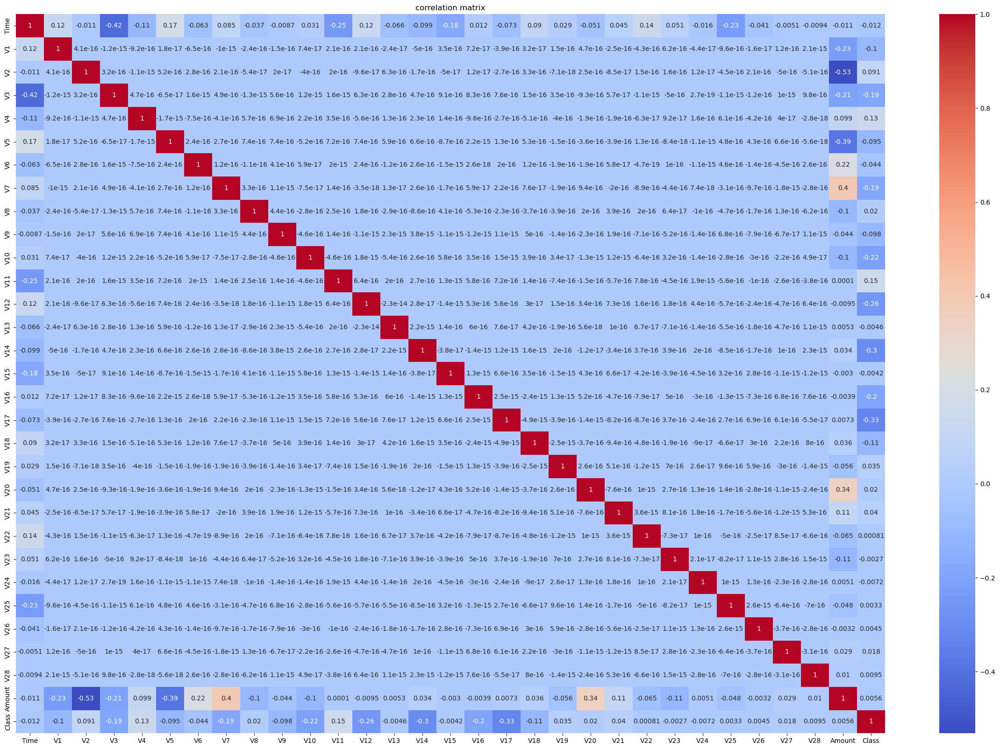

In [16]:
corr_matrix = dataset.corr()
plt.figure(figsize=(30, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('correlation matrix')
plt.show()

In [17]:
def visualize_data(data):
    counts = {0: data.count(0), 1: data.count(1)}
    fig, ax = plt.subplots()
    ax.bar(counts.keys(), counts.values(), tick_label=["0", "1"])
    ax.set_xlabel('value')
    ax.set_ylabel('count')
    ax.set_title('data vis for class 0 and 1')
    plt.show()

In [18]:
counts = dataset['Class'].value_counts()
counts

0    284315
1       492
Name: Class, dtype: int64

In [6]:
X = dataset.drop(columns=['Class'])
y = dataset['Class'].values

Text(0.5, 1.0, 'visualisation des données pour la variable classe')

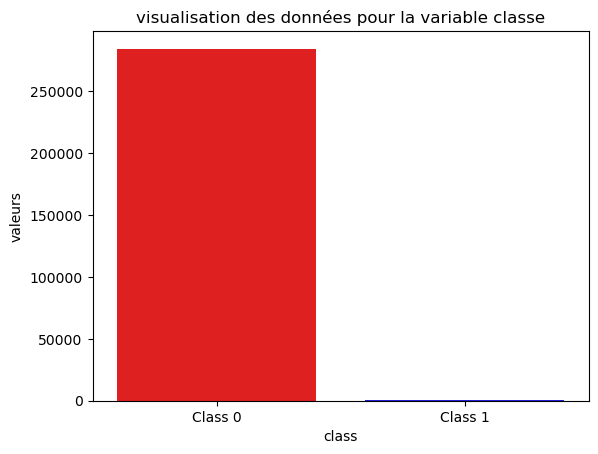

In [7]:
fig, ax = plt.subplots()
sns.barplot(x=['Class 0', 'Class 1'], y=counts.values, palette=['red', 'blue'])
ax.set_xlabel('class')
ax.set_ylabel('valeurs')
ax.set_title('visualisation des données pour la variable classe')

In [ ]:
num_r = 7
num_c = 4
fig, axes = plt.subplots(nrows=num_r, ncols=num_c, figsize=(15, 20))
for i in range(28):
    row = i // num_c
    col = i % num_c
    ax = axes[row, col]
    sns.scatterplot(x=f'V{i+1}', y='Amount', hue='Class', data=dataset, ax=ax)
    ax.set_title(f'V{i+1} vs Amount')
    ax.set_xlabel(f'V{i+1}')
    ax.set_ylabel('Amount')
plt.tight_layout()
plt.show()

In [ ]:
num_r = 7
num_c = 4
fig, axes = plt.subplots(nrows=num_r, ncols=num_c, figsize=(15, 20))
for i in range(28):
    row = i // num_c
    col = i % num_c
    ax = axes[row, col]
    sns.scatterplot(x=f'V{i+1}', y='Time', hue='Class', data=dataset, ax=ax)
    ax.set_title(f'V{i+1} vs Time')
    ax.set_xlabel(f'V{i+1}')
    ax.set_ylabel('Time')
plt.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(nrows=num_r, ncols=num_c, figsize=(15, 20))
for i in range(28):
    row = i // num_c
    col = i % num_c
    ax = axes[row, col]
    sns.kdeplot(x=f'V{i+1}', data=dataset, hue='Class', fill=True, alpha=.3, ax=ax)
    ax.set_title(f'V{i+1} density')
plt.tight_layout()
plt.show()

Time
-0.03556743068120296


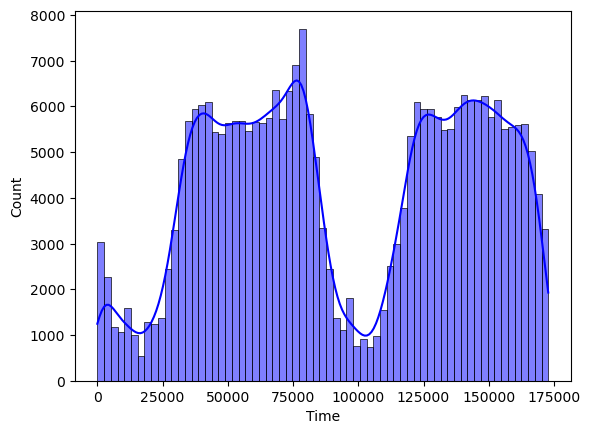

V1
-3.280650024359956


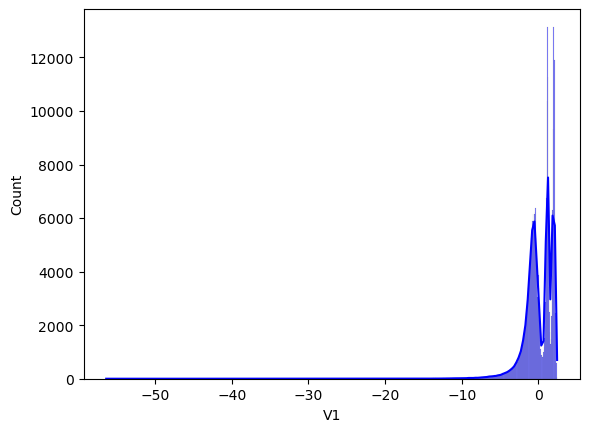

V2
-4.624841215356954


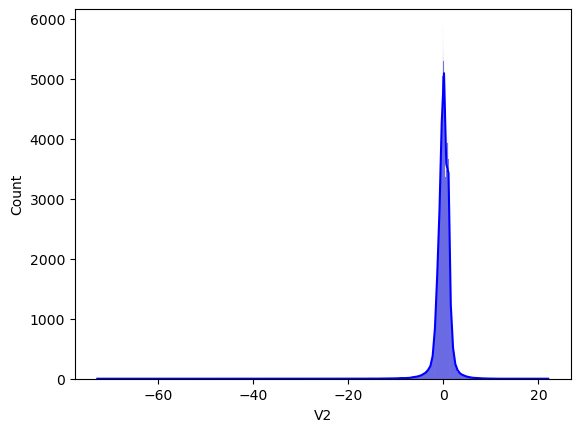

V3
-2.2401436419416543


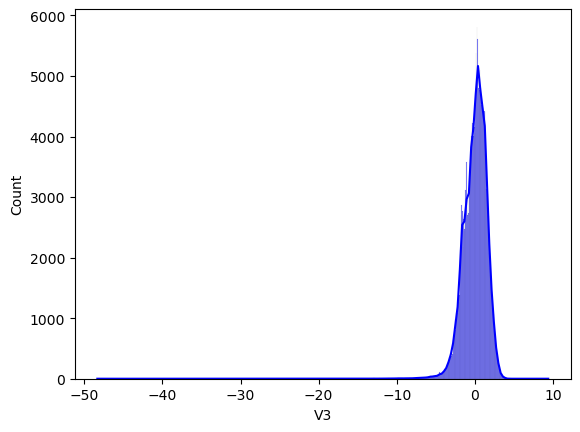

V4
0.6762885361363855


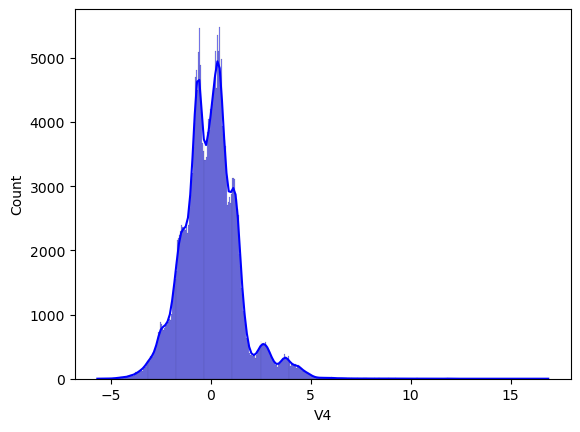

V5
-2.425888719378559


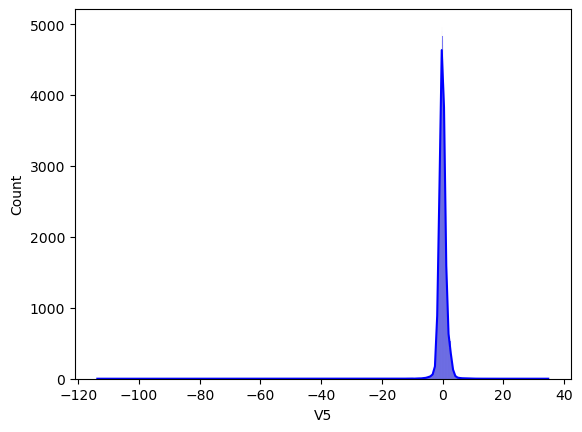

V6
1.8265710448869008


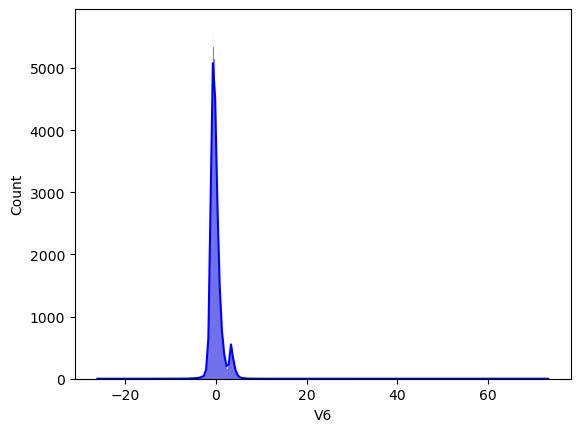

V7
2.5538939666831117


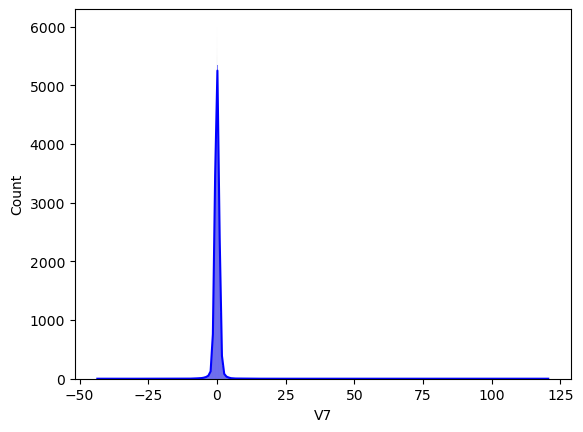

V8
-8.521899311980174


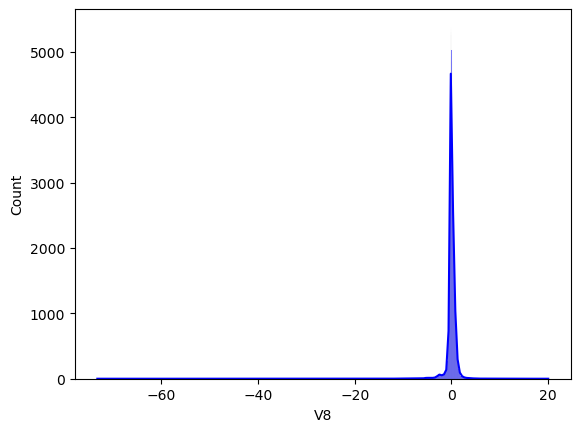

V9
0.5546768505565418


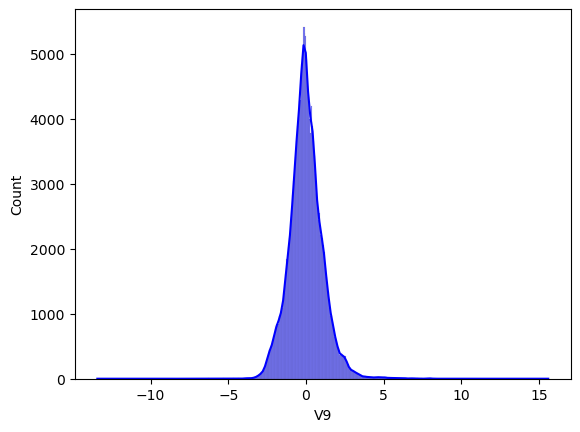

V10
1.1871343376109695


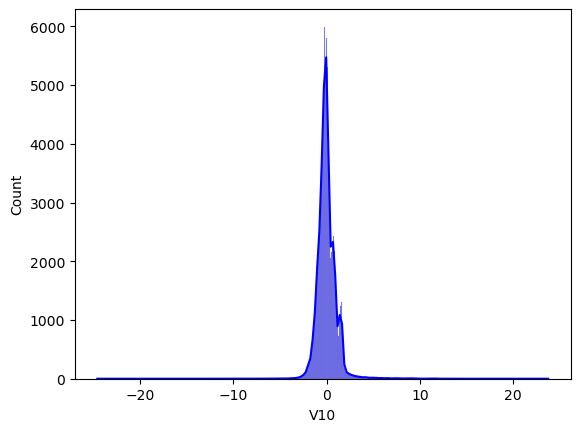

V11
0.35650397786795557


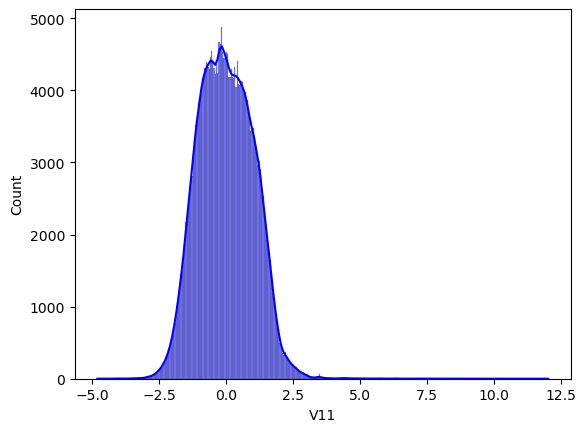

V12
-2.278388935683072


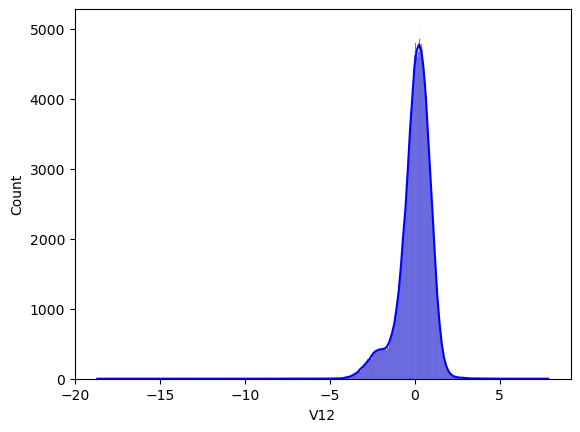

V13
0.0652331143394307


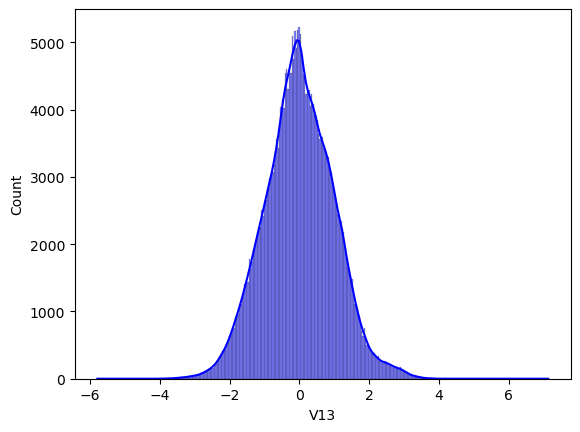

V14
-1.9951653322115102


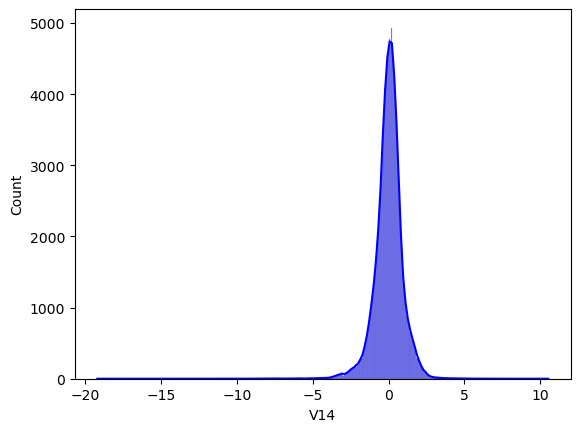

V15
-0.3084213577546761


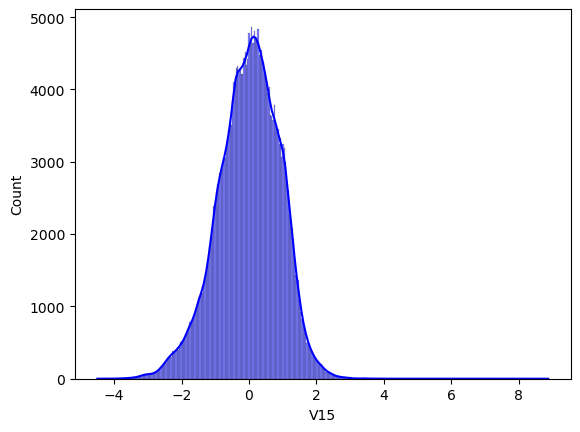

V16
-1.1009604775565411


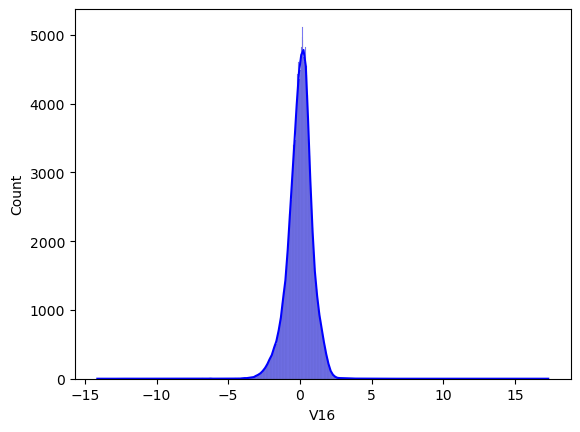

V17
-3.844894223735797


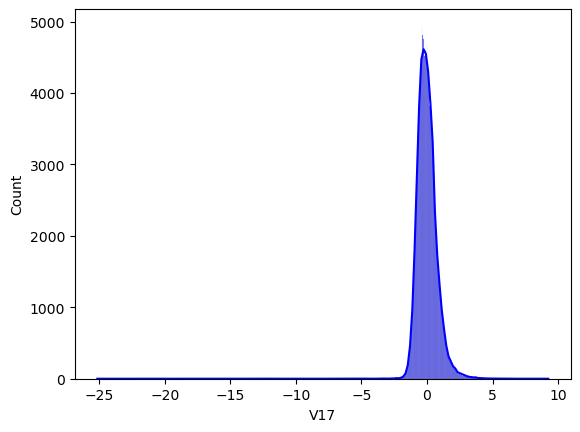

V18
-0.2598788993745328


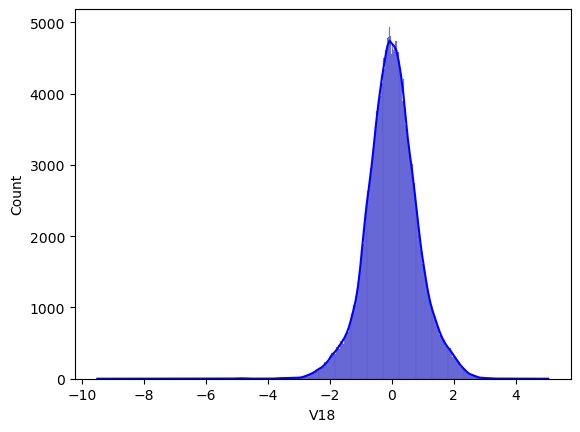

V19
0.109191184897714


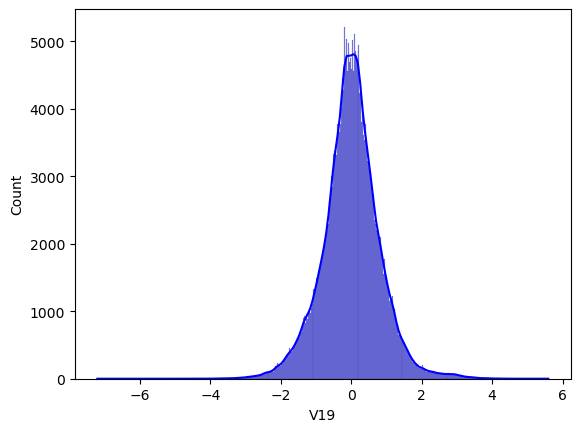

V20
-2.0371445699300117


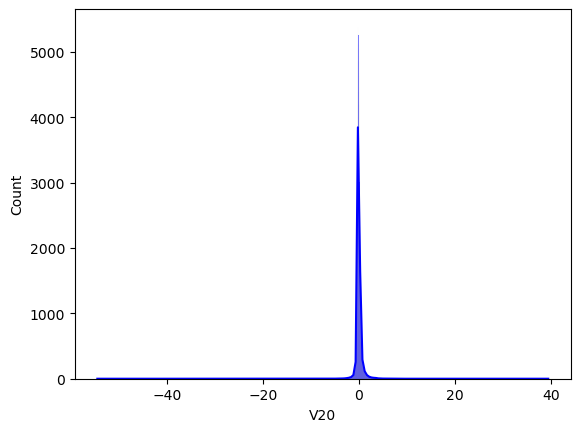

V21
3.5929722697554753


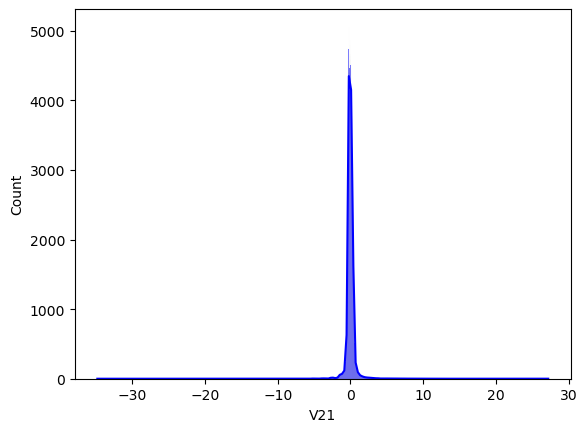

V22
-0.21325649967250146


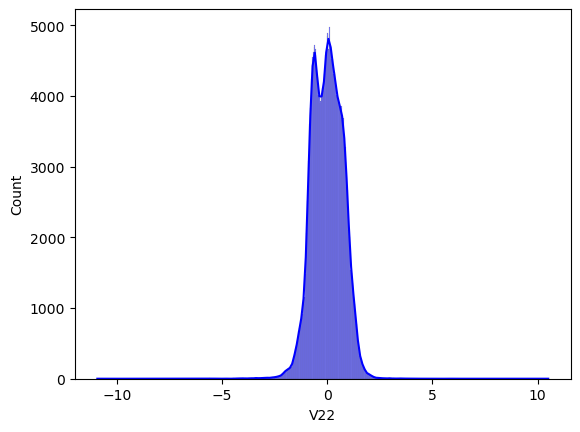

V23
-5.875109397316075


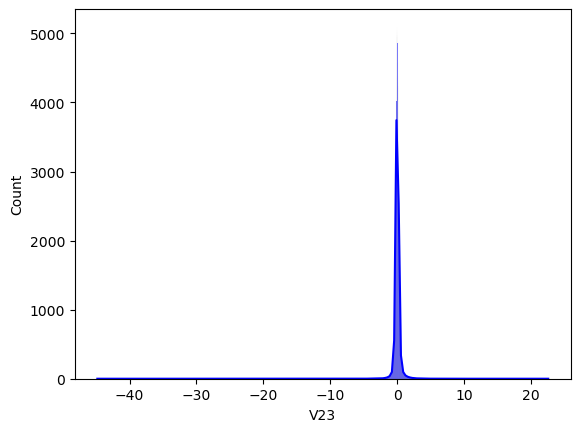

V24
-0.5524963913014509


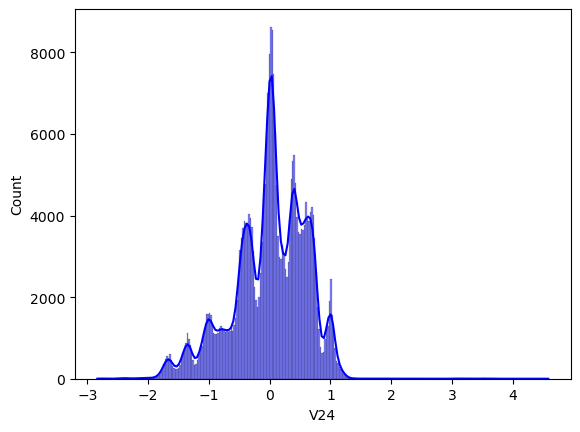

V25
-0.41579040044741566


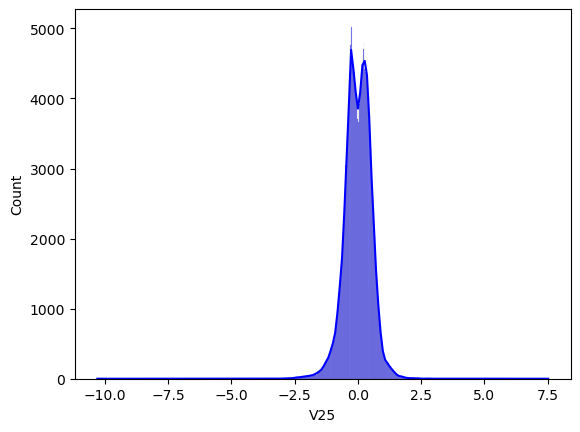

V26
0.5766895799228516


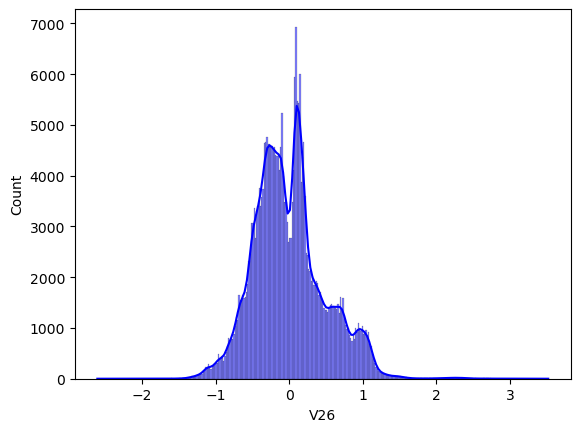

V27
-1.170202779255609


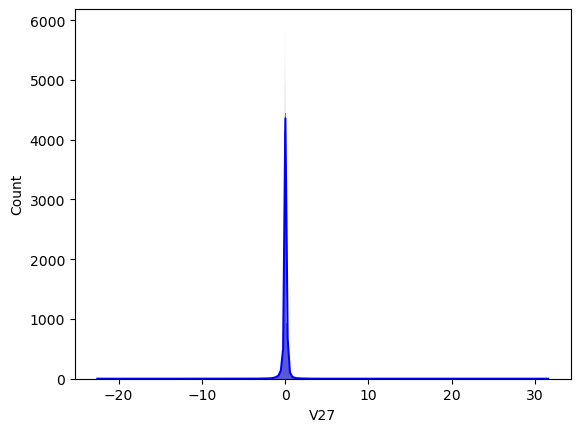

V28
11.19203224646587


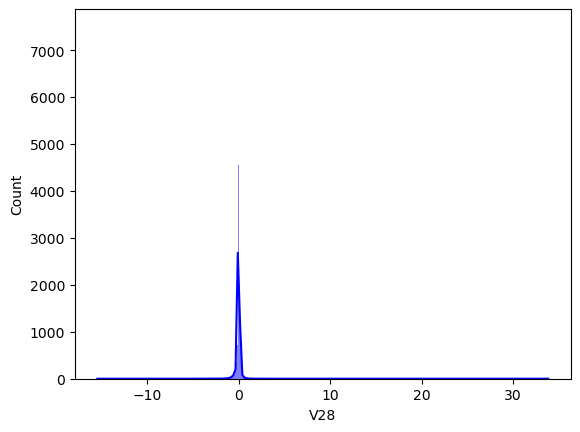

Amount
16.97763503663315


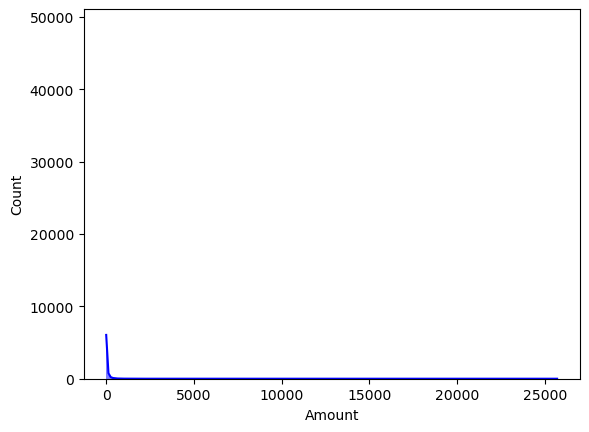

Class
23.99745292182408


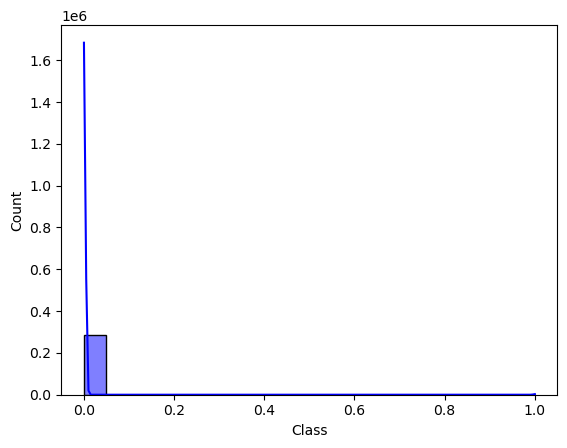

In [104]:
for column_name in dataset.columns:
    print(column_name)
    print(skew(dataset[column_name]))
    plt.figure()
    sns.histplot(dataset[column_name],color='b', kde=True)
    plt.show()

In [19]:
right_skewness=[]
left_skewness=[]
for column_name in dataset.columns:
    skewed=skew(dataset[column_name])
    print(column_name+"        :"+str(skewed))
    if  skewed>1 and column_name!="Class" and column_name=="Amount":
        right_skewness.append(column_name)
    else:
        left_skewness.append(column_name)
left_skewness.remove('Class')
print(right_skewness)
print(left_skewness)

Time        :-0.03556743068120296
V1        :-3.280650024359956
V2        :-4.624841215356954
V3        :-2.2401436419416543
V4        :0.6762885361363855
V5        :-2.425888719378559
V6        :1.8265710448869008
V7        :2.5538939666831117
V8        :-8.521899311980174
V9        :0.5546768505565418
V10        :1.1871343376109695
V11        :0.35650397786795557
V12        :-2.278388935683072
V13        :0.0652331143394307
V14        :-1.9951653322115102
V15        :-0.3084213577546761
V16        :-1.1009604775565411
V17        :-3.844894223735797
V18        :-0.2598788993745328
V19        :0.109191184897714
V20        :-2.0371445699300117
V21        :3.5929722697554753
V22        :-0.21325649967250146
V23        :-5.875109397316075
V24        :-0.5524963913014509
V25        :-0.41579040044741566
V26        :0.5766895799228516
V27        :-1.170202779255609
V28        :11.19203224646587
Amount        :16.97763503663315
Class        :23.99745292182408
['Amount']
['Time', 'V1', 'V2', 

In [9]:
for column_name in right_skewness:
    dataset[column_name]=np.log(-dataset[column_name].min()+dataset[column_name]+1)

In [10]:
dataset

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,4.026203,4.299228,3.948585,1.378155,4.739745,3.318645,3.802138,4.308318,0.363787,...,3.578285,0.277838,3.822038,0.066928,0.128539,-0.189115,3.165443,2.797832,5.014760,0
1,0.0,4.070724,4.303820,3.901812,0.448154,4.743220,3.298727,3.795005,4.308135,-0.255425,...,3.572475,-0.638672,3.826662,-0.339846,0.167170,0.125895,3.159410,2.800010,1.305626,0
2,1.0,4.026229,4.281869,3.933761,0.379780,4.738302,3.365950,3.814382,4.310321,-1.514654,...,3.585694,0.771679,3.844111,-0.689281,-0.327642,-0.139097,3.157440,2.795471,5.939276,0
3,1.0,4.033200,4.297700,3.934148,-0.863291,4.742608,3.346661,3.802093,4.312062,-1.387024,...,3.575769,0.005274,3.820290,-1.175575,0.647376,-0.221929,3.162449,2.802848,4.824306,0
4,2.0,4.029793,4.312053,3.929358,0.403034,4.739142,3.305289,3.809994,4.303338,0.817739,...,3.578533,0.798278,3.821448,0.141267,-0.206010,0.502292,3.169059,2.812124,4.262539,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,3.818292,4.428284,3.676068,-2.066656,4.694817,3.200861,3.679814,4.400874,1.914428,...,3.584736,0.111864,3.846358,-0.509348,1.436807,0.250034,3.199054,2.848033,0.570980,0
284803,172787.0,4.037328,4.299469,3.938872,-0.738589,4.750236,3.339993,3.797321,4.310955,0.584800,...,3.584757,0.924384,3.824725,-1.016226,-0.606624,-0.395255,3.162693,2.795851,3.249987,0
284804,172788.0,4.083066,4.296121,3.830291,-0.557828,4.765364,3.407569,3.790091,4.316489,0.432454,...,3.585252,0.578229,3.823634,0.640134,0.265745,-0.087371,3.159980,2.797496,4.232366,0
284805,172788.0,4.045978,4.307387,3.912585,0.689799,4.739398,3.324468,3.781255,4.316099,0.392087,...,3.586172,0.800049,3.820882,0.123205,-0.569159,0.546668,3.164399,2.805456,2.397895,0


Time
-4.369876096624047


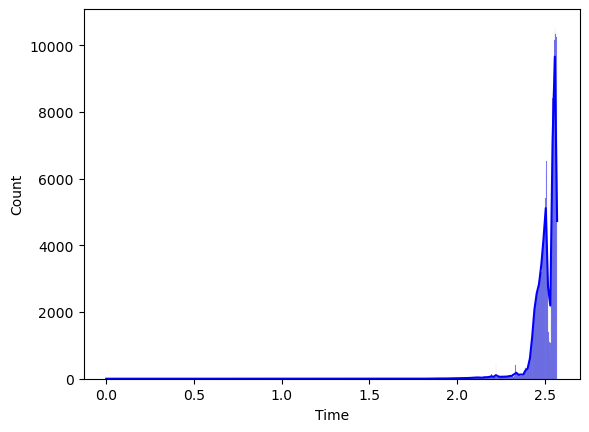

V1
-9.549424510104187


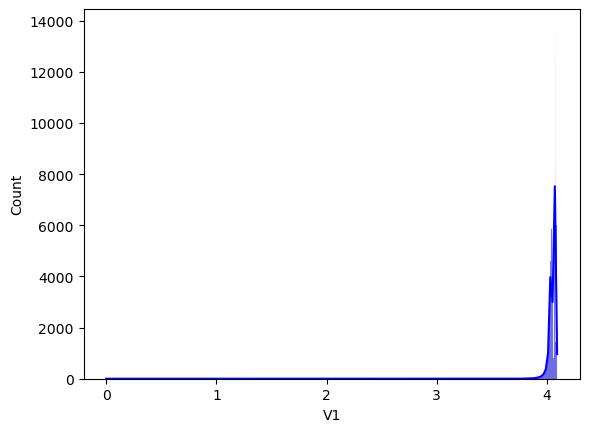

V2
-25.199640443252974


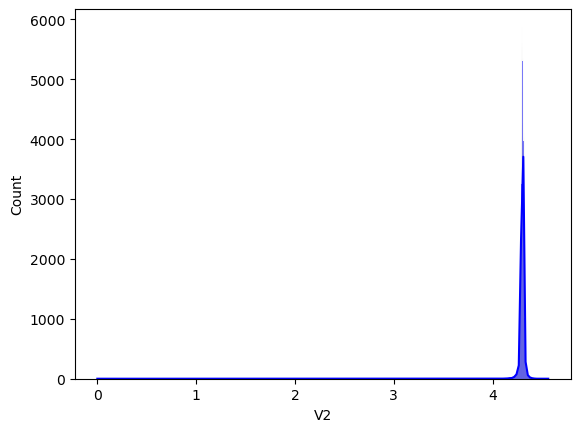

V3
-9.5101817652155


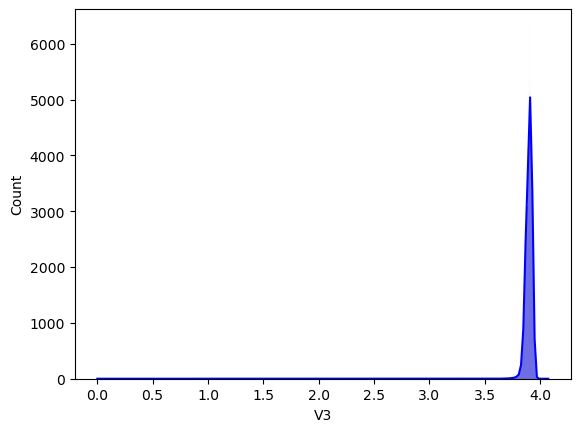

V4
-0.44446023145001323


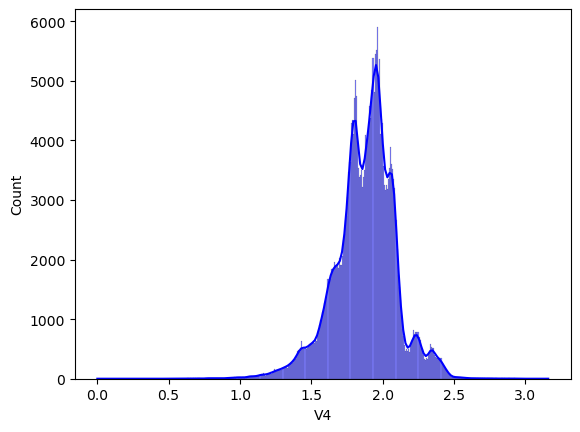

V5
-113.96080165645623


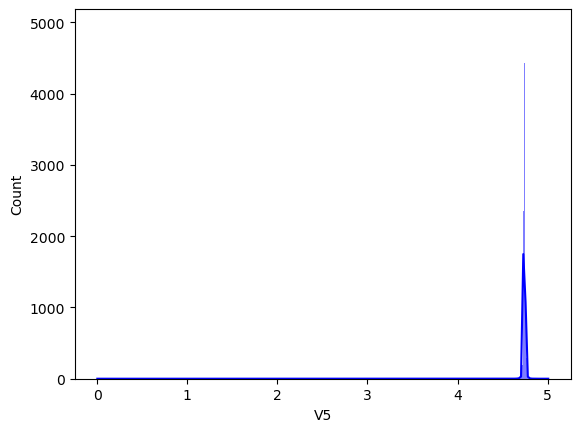

V6
-1.2474726585180824


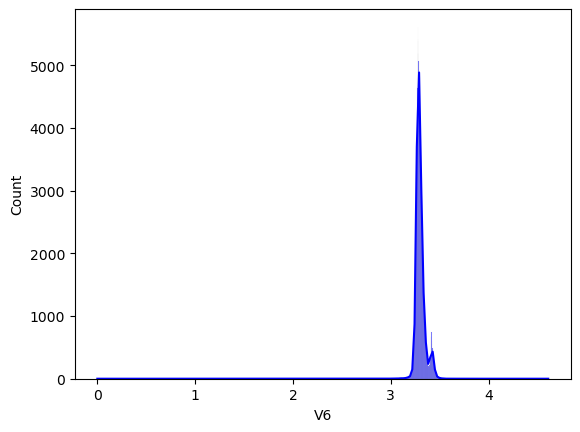

V7
-14.324969777650947


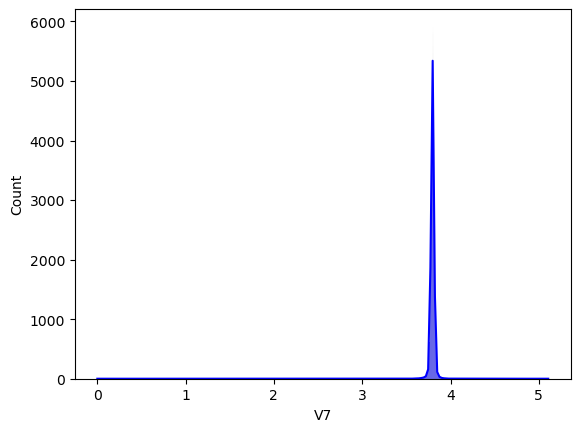

V8
-48.825100407359976


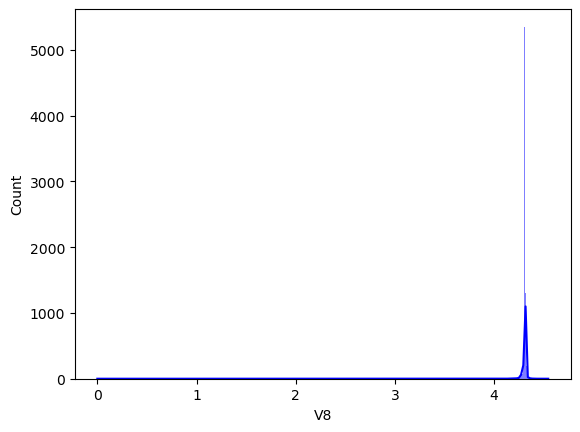

V9
-0.3401085453750249


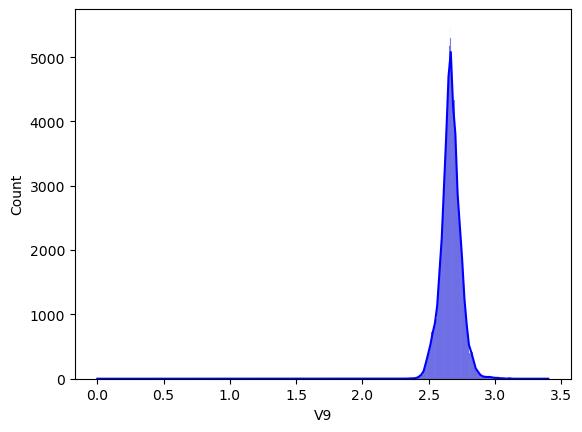

V10
-5.5871714204188505


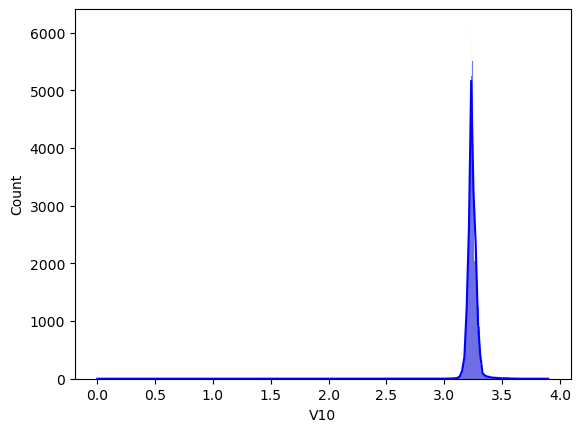

V11
-0.28312118945599646


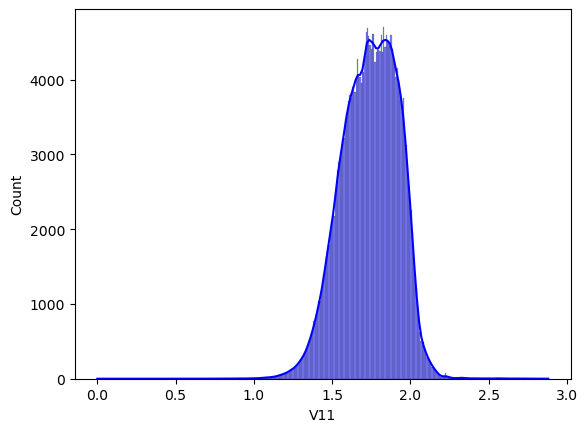

V12
-7.859841142989824


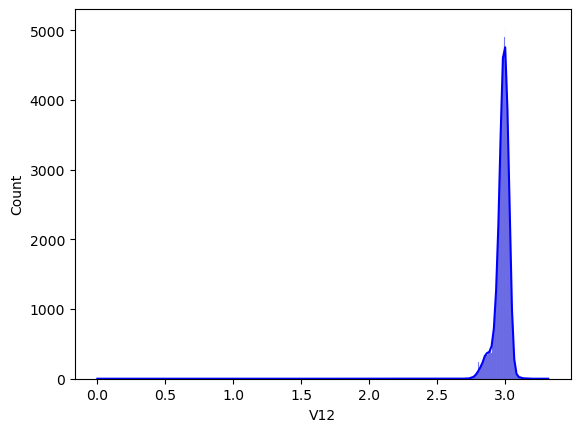

V13
-0.44831965416451885


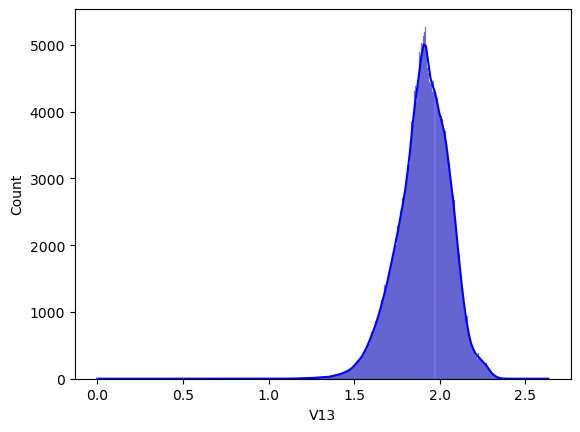

V14
-7.1421413106135265


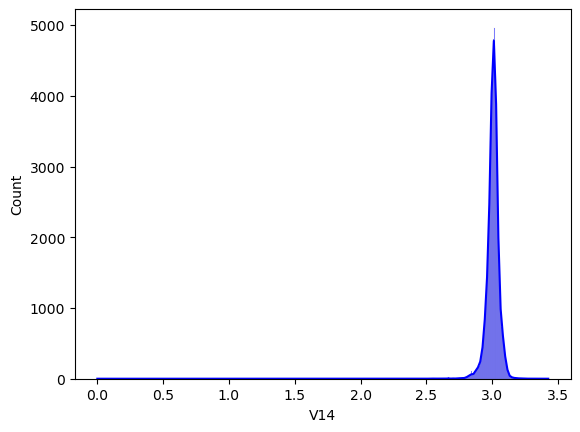

V15
-0.9854867553986325


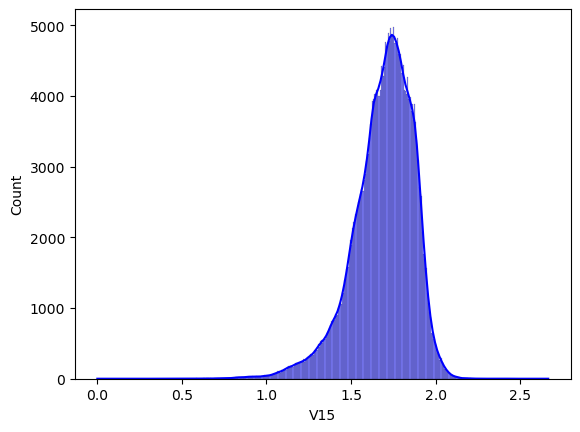

V16
-4.31659786638074


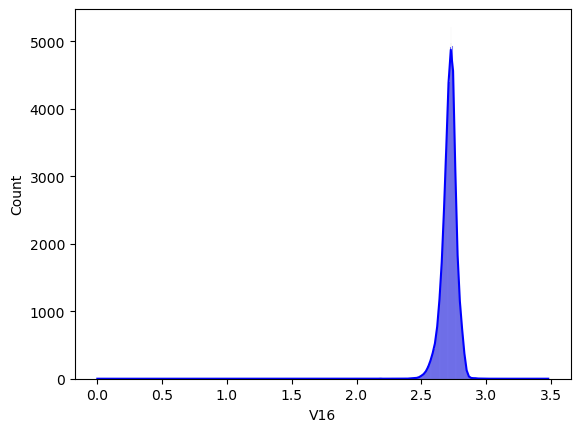

V17
-17.132101496972748


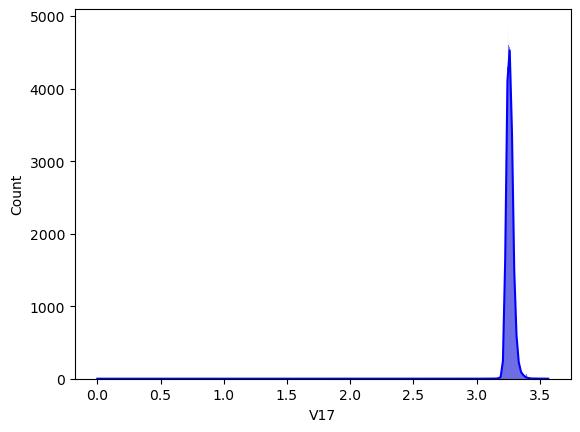

V18
-1.6314882629161644


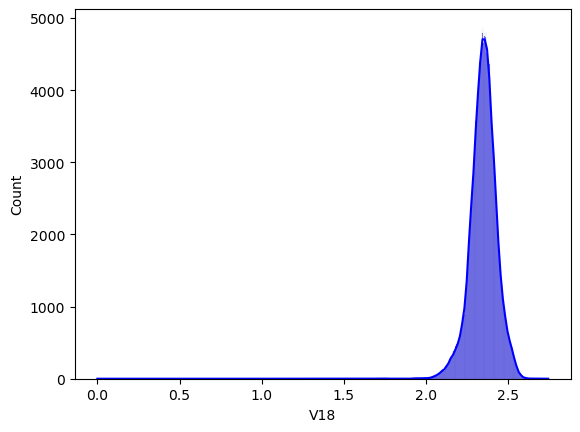

V19
-0.49668406641231994


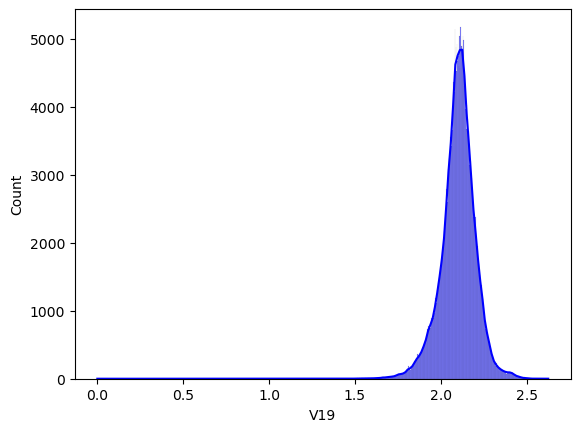

V20
-59.20608397030583


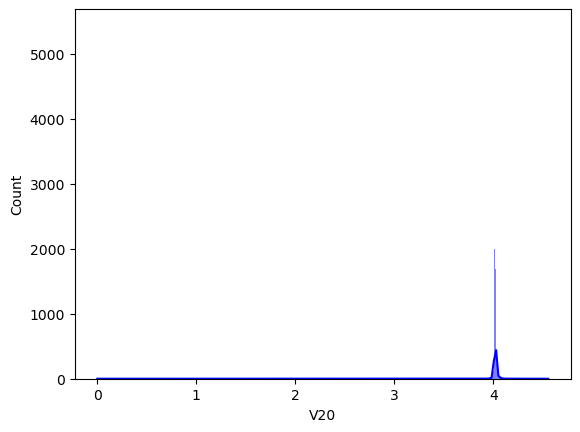

V21
-18.34481930834798


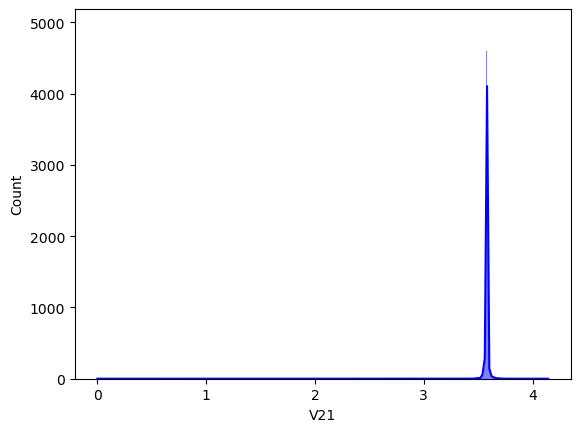

V22
-1.1858234076746264


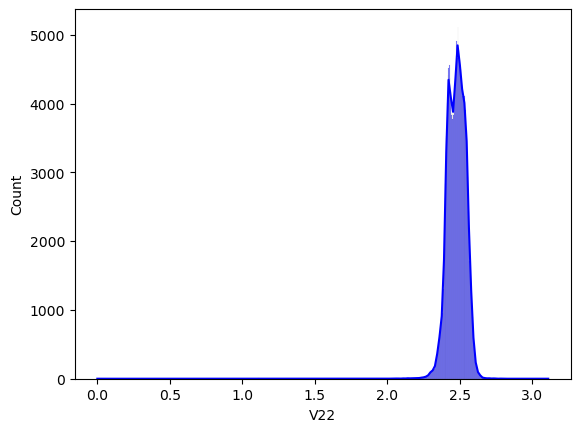

V23
-58.022745134869766


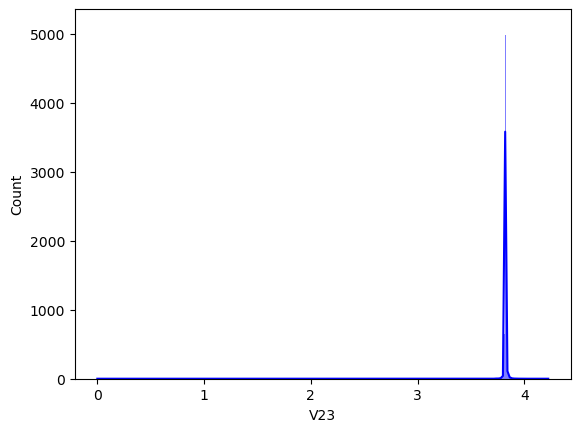

V24
-1.1636039363822461


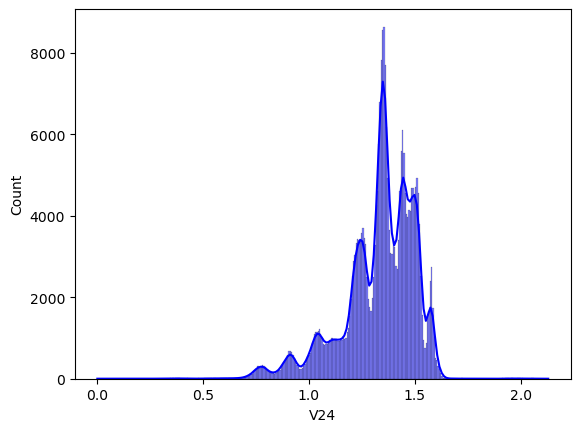

V25
-1.4081922589858242


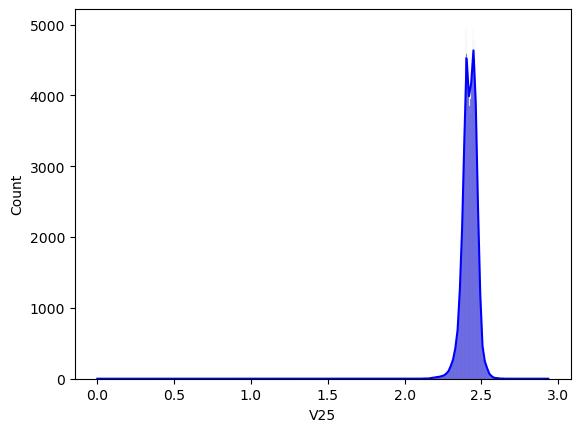

V26
0.10057933375629603


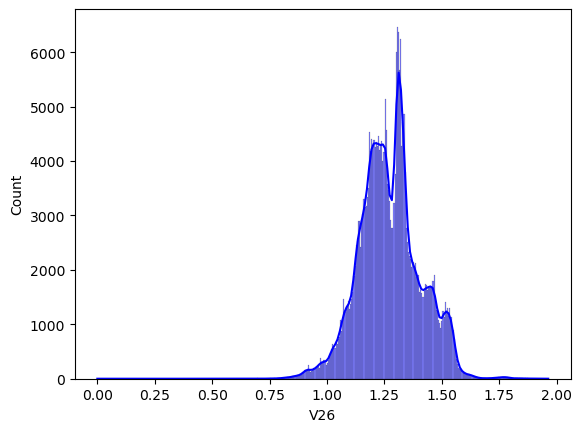

V27
-21.12604071659871


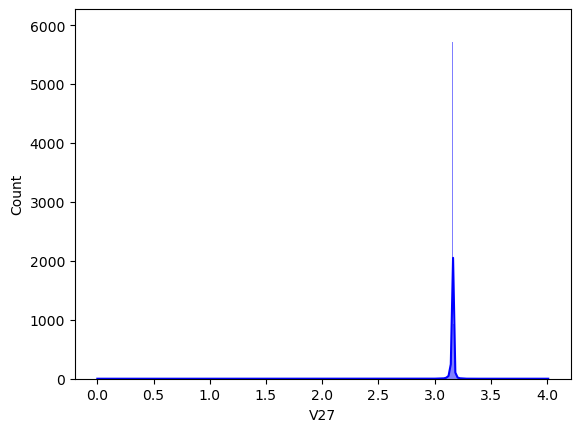

V28
-11.293790149467176


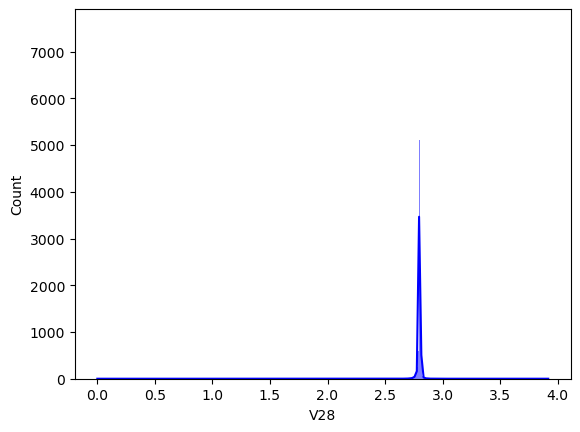

Amount
-0.6514600475211675


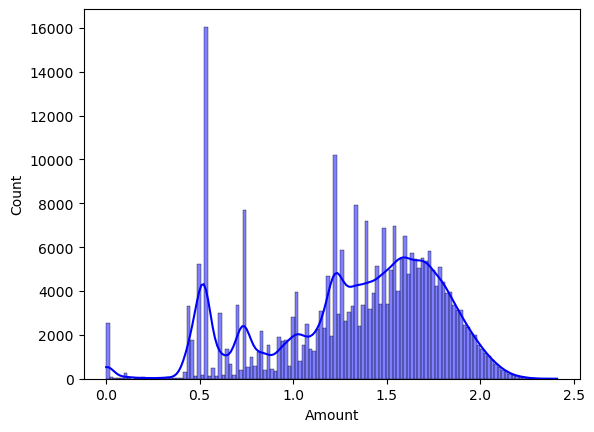

Class
23.99745292182408


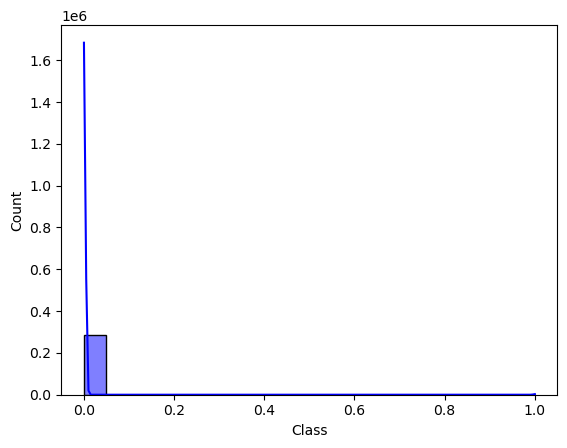

In [111]:
for column_name in dataset.columns:
    print(column_name)
    print(skew(dataset[column_name]))
    plt.figure()
    sns.histplot(dataset[column_name],color='b', kde=True)
    plt.show()

# bilstm without smote

In [12]:
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(5, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.5)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=30, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
accuracy = accuracy_score(y_test, predictions)
recall = recall_score(y_test, predictions,zero_division=1)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions,zero_division=1)
f1 = f1_score(y_test, predictions,zero_division=1)
print(f"accuracy: {accuracy:.4f}")
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(199364, 30)
(199364,)
(85443, 30)
(199364, 1, 30)
Epoch 1/30
100/100 [==============================] - 10s 27ms/step - loss: 0.5627 - accuracy: 0.8375 - val_loss: 0.4023 - val_accuracy: 0.9984
Epoch 2/30
100/100 [==============================] - 1s 14ms/step - loss: 0.2662 - accuracy: 0.9982 - val_loss: 0.1230 - val_accuracy: 0.9984
Epoch 3/30
100/100 [==============================] - 1s 14ms/step - loss: 0.1760 - accuracy: 0.9982 - val_loss: 0.0642 - val_accuracy: 0.9984
Epoch 4/30
100/100 [==============================] - 1s 14ms/step - loss: 0.1363 - accuracy: 0.9982 - val_loss: 0.0384 - val_accuracy: 0.9984
Epoch 5/30
100/100 [==============================] - 1s 14ms/step - loss: 0.1143 - accuracy: 0.9982 - val_loss: 0.0260 - val_accuracy: 0.9984
Epoch 6/30
100/100 [==============================] - 1s 15ms/step - loss: 0.1025 - accuracy: 0.9982 - val_loss: 0.0197 - val_accuracy: 0.9984
Epoch 7/30
100/100 [==============================] - 2s 15ms/step - loss: 0.0933 - accura

# regression logistic without smote

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size=0.3, random_state=40)
classifier = LogisticRegression(random_state=0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)
print("F1 Score:", f1_score)
print("accuracy:", accuracy)
print("precision:", precision)
print("mcc:",mcc)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


F1 Score: 0.635036496350365
accuracy: 0.9988296291094648
precision: 0.6397058823529411
mcc: 0.6344673589437916
rappel: 0.6304347826086957
Confusion Matrix:
[[85256    49]
 [   51    87]]
true negatives: 85256, false positives: 49
false negatives: 51, true positives: 87


# normalisation des classes amount & time

In [20]:
df = pd.DataFrame(dataset)
min_value = df['Time'].min()
max_value = df['Time'].max()
df['new_Time'] = (df['Time'] - min_value) / (max_value - min_value)
min_value = df['Amount'].min()
max_value = df['Amount'].max()
df['new_Amount'] = (df['Amount'] - min_value) / (max_value - min_value)
df = df.drop('Time', axis=1)
df = df.drop("Amount", axis=1)
dataset=df
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   V1          284807 non-null  float64
 1   V2          284807 non-null  float64
 2   V3          284807 non-null  float64
 3   V4          284807 non-null  float64
 4   V5          284807 non-null  float64
 5   V6          284807 non-null  float64
 6   V7          284807 non-null  float64
 7   V8          284807 non-null  float64
 8   V9          284807 non-null  float64
 9   V10         284807 non-null  float64
 10  V11         284807 non-null  float64
 11  V12         284807 non-null  float64
 12  V13         284807 non-null  float64
 13  V14         284807 non-null  float64
 14  V15         284807 non-null  float64
 15  V16         284807 non-null  float64
 16  V17         284807 non-null  float64
 17  V18         284807 non-null  float64
 18  V19         284807 non-null  float64
 19  V2

# smote for oversampling

In [21]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(dataset.drop('Class', axis=1), dataset['Class'])

In [22]:
counts = y_res.value_counts()
counts

0    284315
1    284315
Name: Class, dtype: int64

Text(0.5, 1.0, 'visualisation des données pour la variable classe')

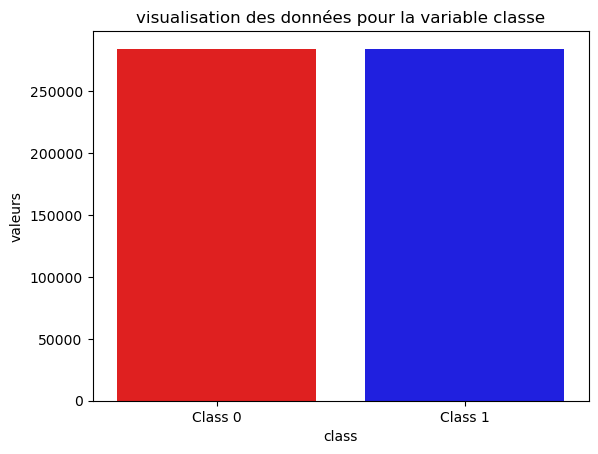

In [23]:
fig, ax = plt.subplots()
sns.barplot(x=['Class 0', 'Class 1'], y=counts.values, palette=['red', 'blue'])
ax.set_xlabel('class')
ax.set_ylabel('valeurs')
ax.set_title('visualisation des données pour la variable classe')

# logistic regression and smote

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
classifier = LogisticRegression(random_state=0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
mcc = matthews_corrcoef(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)
print(mcc)
print("F1 Score:", f1_score)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.8934656789186721
F1 Score: 0.9441950356543498
accuracy: 0.9460047248064061
precision: 0.9731251951295661
rappel: 0.9169353510155092
Confusion Matrix:
[[83455  2152]
 [ 7059 77923]]
true negatives: 83455, false positives: 2152
false negatives: 7059, true positives: 77923


calculate bcr

In [12]:
def bcr(y_true, y_pred):
    #ravel to flatten our matrix 
    tn,fp,fn,tp = confusion_matrix(y_true, y_pred).ravel()
    #sensitivity tp/(tp + fn) #specificity tn/(tn + fp)
    bcr = (tp/(tp + fn) + tn/(tn + fp)) / 2
    return bcr

# Bilstm with smote but without normalization

In [36]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(10, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(10, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.5)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=50, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/50
200/200 [==============================] - 12s 37ms/step - loss: 0.6932 - accuracy: 0.4991 - val_loss: 0.6931 - val_accuracy: 0.5019
Epoch 2/50
200/200 [==============================] - 5s 24ms/step - loss: 0.6932 - accuracy: 0.4994 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 3/50
200/200 [==============================] - 4s 18ms/step - loss: 0.6932 - accuracy: 0.5001 - val_loss: 0.6932 - val_accuracy: 0.4983
Epoch 4/50
200/200 [==============================] - 4s 22ms/step - loss: 0.6936 - accuracy: 0.5005 - val_loss: 0.6931 - val_accuracy: 0.4986
Epoch 5/50
200/200 [==============================] - 5s 26ms/step - loss: 0.6931 - accuracy: 0.4995 - val_loss: 0.6931 - val_accuracy: 0.4988
Epoch 6/50
200/200 [==============================] - 4s 21ms/step - loss: 0.6931 - accuracy: 0.4995 - val_loss: 0.6931 - val_accuracy: 0.4987
Epoch 7/50
200/200 [==============================] - 3s 17ms/step - loss: 0

# lstm

In [14]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
lstm = LSTM(100, return_sequences=True)(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data and focus on the important parts
#we will apply attention mechanism to the same input
attention = Attention()([lstm, lstm])
weighted_sum = tf.reduce_sum(attention * lstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.3)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=100, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
200/200 [==============================] - 11s 36ms/step - loss: 0.2353 - accuracy: 0.9280 - val_loss: 0.0650 - val_accuracy: 0.9774
Epoch 2/100
200/200 [==============================] - 7s 35ms/step - loss: 0.0359 - accuracy: 0.9888 - val_loss: 0.0168 - val_accuracy: 0.9949
Epoch 3/100
200/200 [==============================] - 5s 27ms/step - loss: 0.0116 - accuracy: 0.9974 - val_loss: 0.0070 - val_accuracy: 0.9988
Epoch 4/100
200/200 [==============================] - 7s 35ms/step - loss: 0.0059 - accuracy: 0.9989 - val_loss: 0.0045 - val_accuracy: 0.9990
Epoch 5/100
200/200 [==============================] - 6s 30ms/step - loss: 0.0039 - accuracy: 0.9993 - val_loss: 0.0030 - val_accuracy: 0.9994
Epoch 6/100
200/200 [==============================] - 6s 29ms/step - loss: 0.0029 - accuracy: 0.9994 - val_loss: 0.0024 - val_accuracy: 0.9995
Epoch 7/100
200/200 [==============================] - 7s 37ms/step - 

Epoch 56/100
200/200 [==============================] - 6s 28ms/step - loss: 1.3862e-04 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 0.9997
Epoch 57/100
200/200 [==============================] - 7s 34ms/step - loss: 2.3827e-04 - accuracy: 0.9999 - val_loss: 0.0013 - val_accuracy: 0.9998
Epoch 58/100
200/200 [==============================] - 6s 31ms/step - loss: 1.4898e-04 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 0.9998
Epoch 59/100
200/200 [==============================] - 6s 28ms/step - loss: 1.1120e-04 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 0.9997
Epoch 60/100
200/200 [==============================] - 8s 39ms/step - loss: 1.3837e-04 - accuracy: 1.0000 - val_loss: 0.0013 - val_accuracy: 0.9998
Epoch 61/100
200/200 [==============================] - 6s 28ms/step - loss: 1.8214e-04 - accuracy: 1.0000 - val_loss: 0.0014 - val_accuracy: 0.9998
Epoch 62/100
200/200 [==============================] - 7s 35ms/step - loss: 3.3582e-04 - accuracy: 0.9999

# BiLstm model with attention layer and smote and normalization

In [59]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.3)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=100, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
200/200 [==============================] - 15s 56ms/step - loss: 0.2038 - accuracy: 0.9390 - val_loss: 0.0499 - val_accuracy: 0.9828
Epoch 2/100
200/200 [==============================] - 10s 50ms/step - loss: 0.0275 - accuracy: 0.9919 - val_loss: 0.0121 - val_accuracy: 0.9975
Epoch 3/100
200/200 [==============================] - 11s 53ms/step - loss: 0.0092 - accuracy: 0.9983 - val_loss: 0.0058 - val_accuracy: 0.9988
Epoch 4/100
200/200 [==============================] - 11s 53ms/step - loss: 0.0050 - accuracy: 0.9990 - val_loss: 0.0035 - val_accuracy: 0.9993
Epoch 5/100
200/200 [==============================] - 12s 58ms/step - loss: 0.0034 - accuracy: 0.9994 - val_loss: 0.0024 - val_accuracy: 0.9995
Epoch 6/100
200/200 [==============================] - 11s 55ms/step - loss: 0.0025 - accuracy: 0.9995 - val_loss: 0.0019 - val_accuracy: 0.9997
Epoch 7/100
200/200 [==============================] - 10s 51ms/s

Epoch 55/100
200/200 [==============================] - 13s 64ms/step - loss: 1.3168e-04 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 0.9998
Epoch 56/100
200/200 [==============================] - 13s 65ms/step - loss: 1.7382e-04 - accuracy: 1.0000 - val_loss: 8.5883e-04 - val_accuracy: 0.9999
Epoch 57/100
200/200 [==============================] - 13s 65ms/step - loss: 1.4287e-04 - accuracy: 1.0000 - val_loss: 0.0010 - val_accuracy: 0.9998
Epoch 58/100
200/200 [==============================] - 13s 64ms/step - loss: 1.8689e-04 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 0.9998
Epoch 59/100
200/200 [==============================] - 13s 63ms/step - loss: 2.3282e-04 - accuracy: 1.0000 - val_loss: 0.0012 - val_accuracy: 0.9998
Epoch 60/100
200/200 [==============================] - 13s 63ms/step - loss: 3.6482e-04 - accuracy: 0.9999 - val_loss: 0.0016 - val_accuracy: 0.9997
Epoch 61/100
200/200 [==============================] - 13s 65ms/step - loss: 3.6189e-04 - accur

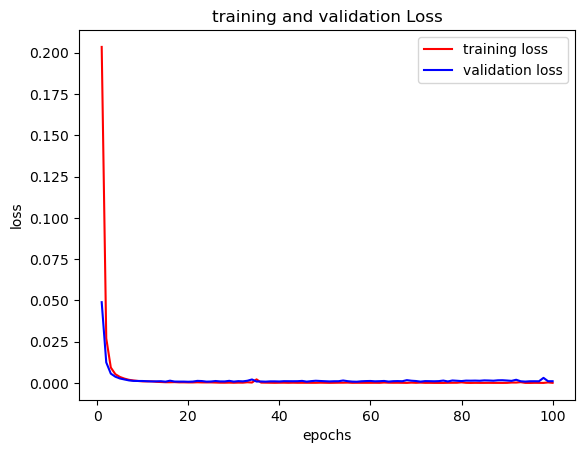

In [144]:
import matplotlib.pyplot as plt
history = model.history
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
epochs = range(1, len(training_loss) + 1)
plt.plot(epochs, training_loss, 'red', label='training loss')
plt.plot(epochs, validation_loss, 'b', label='validation loss')
plt.title('training and validation Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [28]:
# Make predictions on the training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate accuracy for training and testing sets
train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
train_acc = precision_score(y_train, np.round(y_train_pred))
test_acc = precision_score(y_test, np.round(y_test_pred))
print(f"Training Accuracy: {train_accuracy}")
print(f"Testing Accuracy: {test_accuracy}")
print(f"Training Accuracy: {train_acc}")
print(f"Testing Accuracy: {test_acc}")

5331/5331 [==============================] - 12s 2ms/step
Training Accuracy: 0.9999723646559023
Testing Accuracy: 0.9998475868901278
Training Accuracy: 0.9999448190063408
Testing Accuracy: 0.9996941464332769


In [ ]:
from tensorflow.keras.models import save_model
save_model(model,"model.keras")

# load and test the model 

In [24]:
from tensorflow.keras.models import load_model
model = load_model("model.keras")
print("saved")

saved


In [26]:
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
predictions = model.predict(X_test)
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"precision: {precision:.4f}")
print(f"F1 score: {f1:.4f}")
cm = confusion_matrix(y_test, predictions)
tn, fp, fn, tp = cm.ravel()
print("confusion matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

5331/5331 [==============================] - 11s 2ms/step
recall: 1.0000
mcc: 0.9997
precision: 0.9997
F1 score: 0.9998
confusion matrix:
[[85581    26]
 [    0 84982]]
true negatives: 85581, false positives: 26
false negatives: 0, true positives: 84982


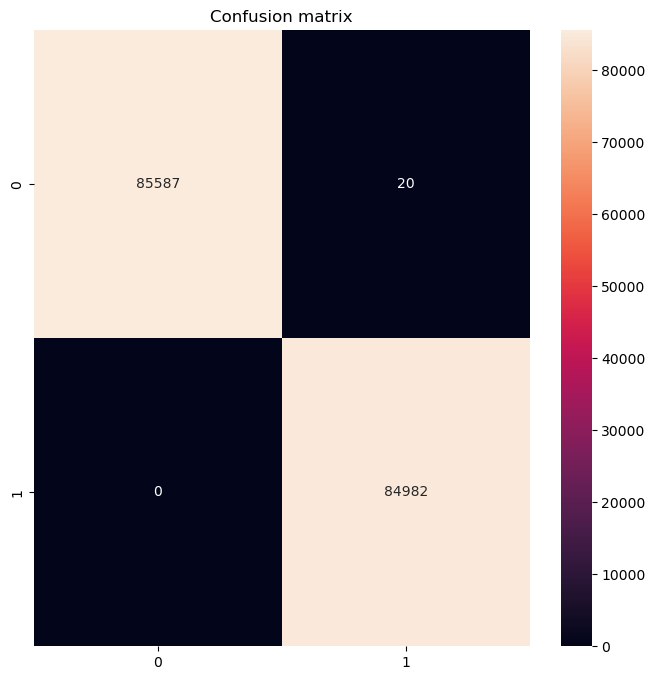

In [63]:
plt.figure(figsize=(8, 8)) 
sns.heatmap(confusion, annot=True, fmt="d")
plt.title("Confusion matrix")
plt.show()

In [11]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
df = pd.DataFrame(dataset)
time_scaler = StandardScaler()
df['new_Time'] = time_scaler.fit_transform(df[['Time']])
amount_scaler = StandardScaler()
df['new_Amount'] = amount_scaler.fit_transform(df[['Amount']])
df = df.drop(['Time', 'Amount'], axis=1)
dataset=df
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   V1          284807 non-null  float64
 1   V2          284807 non-null  float64
 2   V3          284807 non-null  float64
 3   V4          284807 non-null  float64
 4   V5          284807 non-null  float64
 5   V6          284807 non-null  float64
 6   V7          284807 non-null  float64
 7   V8          284807 non-null  float64
 8   V9          284807 non-null  float64
 9   V10         284807 non-null  float64
 10  V11         284807 non-null  float64
 11  V12         284807 non-null  float64
 12  V13         284807 non-null  float64
 13  V14         284807 non-null  float64
 14  V15         284807 non-null  float64
 15  V16         284807 non-null  float64
 16  V17         284807 non-null  float64
 17  V18         284807 non-null  float64
 18  V19         284807 non-null  float64
 19  V2

In [12]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(dataset.drop('Class', axis=1), dataset['Class'])

# bilstm avec normalisation

In [13]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.3)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=100, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
200/200 [==============================] - 17s 64ms/step - loss: 0.2056 - accuracy: 0.9422 - val_loss: 0.0489 - val_accuracy: 0.9837
Epoch 2/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0261 - accuracy: 0.9928 - val_loss: 0.0117 - val_accuracy: 0.9981
Epoch 3/100
200/200 [==============================] - 10s 51ms/step - loss: 0.0088 - accuracy: 0.9987 - val_loss: 0.0054 - val_accuracy: 0.9991
Epoch 4/100
200/200 [==============================] - 11s 53ms/step - loss: 0.0050 - accuracy: 0.9993 - val_loss: 0.0035 - val_accuracy: 0.9993
Epoch 5/100
200/200 [==============================] - 10s 51ms/step - loss: 0.0034 - accuracy: 0.9995 - val_loss: 0.0023 - val_accuracy: 0.9996
Epoch 6/100
200/200 [==============================] - 10s 52ms/step - loss: 0.0025 - accuracy: 0.9996 - val_loss: 0.0018 - val_accuracy: 0.9996
Epoch 7/100
200/200 [==============================] - 11s 53ms/s

In [22]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.3)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=100, batch_size=2000, validation_data=(X_test, y_test))
# define the KerasClassifier object and use it in cross_val_predict
keras_clf = KerasClassifier(model = model, optimizer="adam", epochs=100, verbose=0)
# Cross-validation
cv_scores = cross_val_score(keras_clf, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-validation scores:", cv_scores)
print("Average cross-validation accuracy:", np.mean(cv_scores))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
200/200 [==============================] - 20s 69ms/step - loss: 0.1993 - accuracy: 0.9458 - val_loss: 0.0471 - val_accuracy: 0.9841
Epoch 2/100
200/200 [==============================] - 10s 49ms/step - loss: 0.0266 - accuracy: 0.9923 - val_loss: 0.0128 - val_accuracy: 0.9971
Epoch 3/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0095 - accuracy: 0.9982 - val_loss: 0.0063 - val_accuracy: 0.9988
Epoch 4/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0053 - accuracy: 0.9991 - val_loss: 0.0039 - val_accuracy: 0.9992
Epoch 5/100
200/200 [==============================] - 10s 49ms/step - loss: 0.0035 - accuracy: 0.9994 - val_loss: 0.0030 - val_accuracy: 0.9994
Epoch 6/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0026 - accuracy: 0.9995 - val_loss: 0.0021 - val_accuracy: 0.9996
Epoch 7/100
200/200 [==============================] - 11s 56ms/s

NameError: name 'KerasClassifier' is not defined

# bilstm with skwene

In [69]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.3)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model.fit(X_train, y_train, epochs=100, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
200/200 [==============================] - 13s 48ms/step - loss: 0.2940 - accuracy: 0.8994 - val_loss: 0.1910 - val_accuracy: 0.9318
Epoch 2/100
200/200 [==============================] - 9s 46ms/step - loss: 0.1810 - accuracy: 0.9325 - val_loss: 0.2061 - val_accuracy: 0.9121
Epoch 3/100
200/200 [==============================] - 10s 49ms/step - loss: 0.1690 - accuracy: 0.9342 - val_loss: 0.2274 - val_accuracy: 0.9268
Epoch 4/100
200/200 [==============================] - 10s 51ms/step - loss: 0.1630 - accuracy: 0.9359 - val_loss: 0.1858 - val_accuracy: 0.9333
Epoch 5/100
200/200 [==============================] - 11s 54ms/step - loss: 0.1628 - accuracy: 0.9364 - val_loss: 0.2212 - val_accuracy: 0.9049
Epoch 6/100
200/200 [==============================] - 11s 53ms/step - loss: 0.1527 - accuracy: 0.9401 - val_loss: 0.1480 - val_accuracy: 0.9389
Epoch 7/100
200/200 [==============================] - 10s 48ms/st

Epoch 57/100
200/200 [==============================] - 10s 48ms/step - loss: 0.1130 - accuracy: 0.9566 - val_loss: 0.1795 - val_accuracy: 0.9385
Epoch 58/100
200/200 [==============================] - 10s 48ms/step - loss: 0.1152 - accuracy: 0.9557 - val_loss: 0.1131 - val_accuracy: 0.9529
Epoch 59/100
200/200 [==============================] - 10s 49ms/step - loss: 0.1103 - accuracy: 0.9571 - val_loss: 0.1019 - val_accuracy: 0.9586
Epoch 60/100
200/200 [==============================] - 10s 48ms/step - loss: 0.1097 - accuracy: 0.9575 - val_loss: 0.1087 - val_accuracy: 0.9557
Epoch 61/100
200/200 [==============================] - 10s 48ms/step - loss: 0.1089 - accuracy: 0.9571 - val_loss: 0.1118 - val_accuracy: 0.9522
Epoch 62/100
200/200 [==============================] - 10s 48ms/step - loss: 0.1078 - accuracy: 0.9574 - val_loss: 0.1430 - val_accuracy: 0.9499
Epoch 63/100
200/200 [==============================] - 10s 50ms/step - loss: 0.1077 - accuracy: 0.9570 - val_loss: 0.1039 -

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size=0.3, random_state=40)
#definir le nombre des arbres des decisions utilises dans cette foret
classifier = RandomForestClassifier(n_estimators=100, random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)
print(mcc)
print("F1 Score:", f1_score)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

0.8891348834252054
F1 Score: 0.8862745098039215
accuracy: 0.9996605924417448
precision: 0.9658119658119658
rappel: 0.8188405797101449
Confusion Matrix:
[[85301     4]
 [   25   113]]
true negatives: 85301, false positives: 4
false negatives: 25, true positives: 113


In [99]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size=0.3, random_state=40)
model_1 = LogisticRegression()
model_2 = svm.SVC(kernel='linear', C=1)
model_3 = RandomForestClassifier()
final_model = VotingClassifier(estimators=[('lr', model_1), ('svm', model_2), ('rf', model_3)], voting='hard')
final_model.fit(X_train, y_train)
y_pred = final_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
print(mcc)
print("F1 Score:", f1_score)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


TypeError: 'numpy.float64' object is not callable

In [122]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y, test_size=0.3, random_state=40)
#definir le nombre des arbres des decisions utilises dans cette foret
classifier = RandomForestClassifier(n_estimators=100, random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

accuracy: 0.9996605924417448
precision: 0.9658119658119658
rappel: 0.8188405797101449
Confusion Matrix:
[[85301     4]
 [   25   113]]
true negatives: 85301, false positives: 4
false negatives: 25, true positives: 113


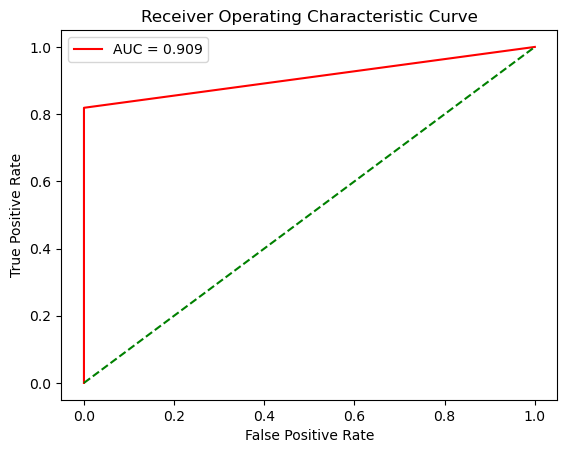

AUC: 0.9094


In [135]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
y_prob = classifier.predict(X_test)
fpr, tpr, _ = roc_curve(y_test, y_prob)
auc = auc(fpr, tpr)
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
plot_roc_curve(fpr, tpr)
print(f"AUC: {auc:.4f}")

In [119]:
from tensorflow.keras.models import load_model
model = load_model("model.h5")
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
predictions = model.predict(X_test)
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"precision: {precision:.4f}")
cm = confusion_matrix(y_test, predictions)
tn, fp, fn, tp = cm.ravel()
print("confusion matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

5331/5331 [==============================] - 16s 3ms/step
recall: 1.0000
mcc: 0.9998
precision: 0.9998
confusion matrix:
[[85587    20]
 [    0 84982]]
true negatives: 85587, false positives: 20
false negatives: 0, true positives: 84982


In [120]:
acc = accuracy_score(y_test, predictions)
acc

0.9998827591462521

5331/5331 [==============================] - 16s 3ms/step


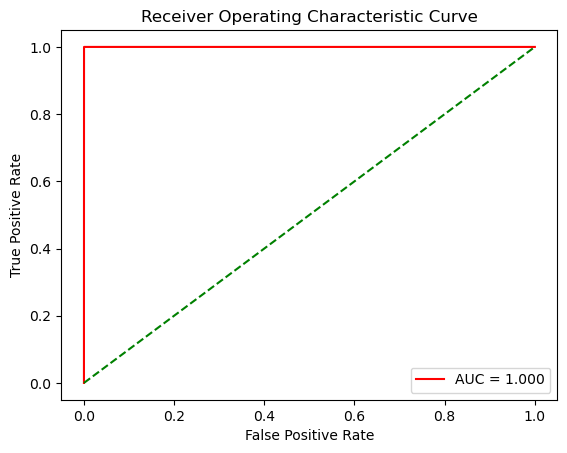

[0.00000000e+00 4.67251510e-05 4.67251510e-05 ... 9.42528064e-01
 9.47270667e-01 1.00000000e+00]
[0.         0.76490316 0.78526041 ... 1.         1.         1.        ]
AUC: 1.0000


In [121]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
y_prob = model.predict(X_test)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
plot_roc_curve(fpr, tpr)
print(f"AUC: {roc_auc:.4f}")

In [138]:
from tensorflow.keras.models import save_model
save_model(model,"model_lstmn.keras")

5331/5331 [==============================] - 9s 2ms/step


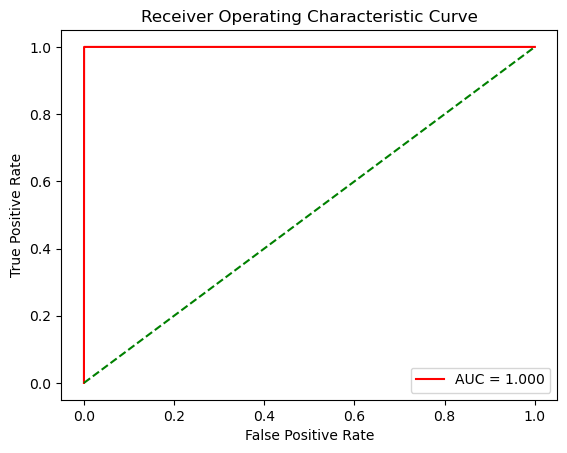

AUC: 1.0000


In [137]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
y_prob = model.predict(X_test)
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
plot_roc_curve(fpr, tpr)
print(f"AUC: {roc_auc:.4f}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/100
20/20 [==============================] - 15s 500ms/step - loss: 0.5487 - accuracy: 0.8538 - val_loss: 0.4204 - val_accuracy: 0.9282
Epoch 2/100
20/20 [==============================] - 8s 415ms/step - loss: 0.3682 - accuracy: 0.9319 - val_loss: 0.3182 - val_accuracy: 0.9340
Epoch 3/100
20/20 [==============================] - 8s 422ms/step - loss: 0.2792 - accuracy: 0.9354 - val_loss: 0.2328 - val_accuracy: 0.9361
Epoch 4/100
20/20 [==============================] - 8s 400ms/step - loss: 0.1986 - accuracy: 0.9381 - val_loss: 0.1605 - val_accuracy: 0.9391
Epoch 5/100
20/20 [==============================] - 8s 423ms/step - loss: 0.1410 - accuracy: 0.9434 - val_loss: 0.1174 - val_accuracy: 0.9481
Epoch 6/100
20/20 [==============================] - 8s 405ms/step - loss: 0.1067 - accuracy: 0.9556 - val_loss: 0.0912 - val_accuracy: 0.9618
Epoch 7/100
20/20 [==============================] - 8s 427ms/step - loss: 0

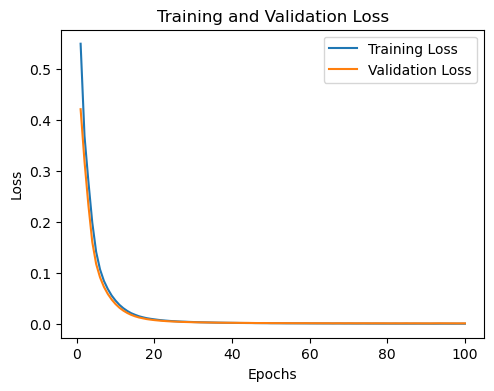

AttributeError: 'History' object has no attribute 'evaluate'

In [25]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(50, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.4)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model=model.fit(X_train, y_train, epochs=100, batch_size=20000, validation_data=(X_test, y_test))
training_loss = model.history['loss']
validation_loss = model.history['val_loss']
epochs = range(1, len(training_loss) + 1)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs, training_loss, label='Training Loss')
plt.plot(epochs, validation_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()
#here we evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
f1 = f1_score(y_test, predictions)
bcr = bcr(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"bcr: {bcr:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

In [46]:
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
import matplotlib.pyplot as plt

X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
cv = KFold(n_splits=10, shuffle=True, random_state=42)
foldn = 1
acc_per_fold = []
X_array = X.to_numpy()
input_shape = (1, X_train.shape[2])
num_classes = 1

def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
    
def create_model():
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(100, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(50, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.4)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

my_keras_model = KerasClassifier(build_fn=create_model, epochs=2, batch_size=20000)
steps = list()
steps.append(('model', my_keras_model))
pipeline = Pipeline(steps=steps)
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1'
}

results = cross_validate(pipeline, X_train, y_train, scoring=scoring, cv=2)
print(results)
accuracy_scores = results['test_accuracy']
precision_scores = results['test_precision']
recall_scores = results['test_recall']
f1_scores = results['test_f1']
print("accuracy: ", np.mean(accuracy_scores))
print("precision: ", np.mean(precision_scores))
print("recall: ", np.mean(recall_scores))
print("F1 scores: ", np.mean(f1_scores))
scores = cross_val_predict(pipeline, X_test, y_test, cv=2, method='predict_proba')
y = scores[:, 1]
fpr, tpr, _ = roc_curve(y_test, y)
roc_auc = auc(fpr, tpr)
plot_roc_curve(fpr, tpr)
print(f"AUC: {roc_auc:.4f}")
predictions = np.round(y)
cm = confusion_matrix(y_test,predictions)
print("confusion matrix")
print(cm)

(398041, 1, 30)
(398041,)
(170589, 1, 30)
(170589,)


C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/2
10/10 [==============================] - 11s 390ms/step - loss: 0.6775 - accuracy: 0.6317
Epoch 2/2
10/10 [==============================] - 3s 141ms/step


C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/2
10/10 [==============================] - 11s 412ms/step - loss: 0.6767 - accuracy: 0.6217
Epoch 2/2
10/10 [==============================] - 2s 127ms/step
{'fit_time': array([15.98720384, 16.3726902 ]), 'score_time': array([3.49180079, 2.96959901]), 'test_accuracy': array([0.82276745, 0.7996935 ]), 'test_precision': array([0.93866318, 0.97419713]), 'test_recall': array([0.6912619 , 0.61633857]), 'test_f1': array([0.7961864 , 0.75501011])}
accuracy:  0.8112304723961243
precision:  0.9564301541616692
recall:  0.6538002364803337
F1 scores:  0.7755982566402545


C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/2
5/5 [==============================] - 10s 314ms/step - loss: 0.6908 - accuracy: 0.5349
Epoch 2/2
5/5 [==============================] - 2s 109ms/step


C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/2
5/5 [==============================] - 8s 307ms/step - loss: 0.6885 - accuracy: 0.5821
Epoch 2/2
5/5 [==============================] - 2s 122ms/step


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

# method finale

Epoch 1/50
228/228 - 16s - loss: 0.5207 - accuracy: 0.7383 - val_loss: 0.4702 - val_accuracy: 0.7970 - 16s/epoch - 70ms/step
Epoch 2/50
228/228 - 7s - loss: 0.3473 - accuracy: 0.8525 - val_loss: 0.3811 - val_accuracy: 0.8371 - 7s/epoch - 32ms/step
Epoch 3/50
228/228 - 5s - loss: 0.3142 - accuracy: 0.8642 - val_loss: 0.4096 - val_accuracy: 0.8203 - 5s/epoch - 23ms/step
Epoch 4/50
228/228 - 7s - loss: 0.3013 - accuracy: 0.8685 - val_loss: 0.4373 - val_accuracy: 0.8215 - 7s/epoch - 32ms/step
Epoch 5/50
228/228 - 7s - loss: 0.2923 - accuracy: 0.8715 - val_loss: 0.6387 - val_accuracy: 0.7420 - 7s/epoch - 32ms/step
Epoch 6/50
228/228 - 7s - loss: 0.2866 - accuracy: 0.8735 - val_loss: 0.7509 - val_accuracy: 0.7010 - 7s/epoch - 32ms/step
Epoch 7/50
228/228 - 7s - loss: 0.2818 - accuracy: 0.8750 - val_loss: 0.7323 - val_accuracy: 0.7325 - 7s/epoch - 31ms/step
Epoch 8/50
228/228 - 7s - loss: 0.2772 - accuracy: 0.8763 - val_loss: 0.8288 - val_accuracy: 0.7010 - 7s/epoch - 31ms/step
Epoch 9/50
228

Epoch 13/50
228/228 - 7s - loss: 0.2241 - accuracy: 0.8791 - val_loss: 0.1431 - val_accuracy: 0.9500 - 7s/epoch - 29ms/step
Epoch 14/50
228/228 - 7s - loss: 0.2227 - accuracy: 0.8794 - val_loss: 0.1422 - val_accuracy: 0.9501 - 7s/epoch - 30ms/step
Epoch 15/50
228/228 - 6s - loss: 0.2207 - accuracy: 0.8796 - val_loss: 0.1530 - val_accuracy: 0.9453 - 6s/epoch - 28ms/step
Epoch 16/50
228/228 - 7s - loss: 0.2191 - accuracy: 0.8797 - val_loss: 0.1750 - val_accuracy: 0.9329 - 7s/epoch - 31ms/step
Epoch 17/50
228/228 - 7s - loss: 0.2162 - accuracy: 0.8800 - val_loss: 0.1368 - val_accuracy: 0.9532 - 7s/epoch - 30ms/step
Epoch 18/50
228/228 - 7s - loss: 0.2155 - accuracy: 0.8803 - val_loss: 0.1504 - val_accuracy: 0.9479 - 7s/epoch - 31ms/step
Epoch 19/50
228/228 - 7s - loss: 0.2136 - accuracy: 0.8820 - val_loss: 0.1675 - val_accuracy: 0.9383 - 7s/epoch - 29ms/step
Epoch 20/50
228/228 - 7s - loss: 0.2114 - accuracy: 0.8819 - val_loss: 0.1392 - val_accuracy: 0.9517 - 7s/epoch - 30ms/step
Epoch 21

Epoch 25/50
228/228 - 7s - loss: 0.2704 - accuracy: 0.8499 - val_loss: 0.1194 - val_accuracy: 0.9514 - 7s/epoch - 31ms/step
Epoch 26/50
228/228 - 5s - loss: 0.2689 - accuracy: 0.8508 - val_loss: 0.1353 - val_accuracy: 0.9436 - 5s/epoch - 23ms/step
Epoch 27/50
228/228 - 7s - loss: 0.2658 - accuracy: 0.8522 - val_loss: 0.1223 - val_accuracy: 0.9483 - 7s/epoch - 30ms/step
Epoch 28/50
228/228 - 7s - loss: 0.2647 - accuracy: 0.8517 - val_loss: 0.1178 - val_accuracy: 0.9511 - 7s/epoch - 31ms/step
Epoch 29/50
228/228 - 7s - loss: 0.2647 - accuracy: 0.8515 - val_loss: 0.1245 - val_accuracy: 0.9473 - 7s/epoch - 31ms/step
Epoch 30/50
228/228 - 6s - loss: 0.2631 - accuracy: 0.8523 - val_loss: 0.1261 - val_accuracy: 0.9449 - 6s/epoch - 27ms/step
Epoch 31/50
228/228 - 7s - loss: 0.2603 - accuracy: 0.8538 - val_loss: 0.1330 - val_accuracy: 0.9417 - 7s/epoch - 30ms/step
Epoch 32/50
228/228 - 7s - loss: 0.2615 - accuracy: 0.8527 - val_loss: 0.1145 - val_accuracy: 0.9500 - 7s/epoch - 29ms/step
Epoch 33

Epoch 37/50
228/228 - 7s - loss: 0.2060 - accuracy: 0.8852 - val_loss: 0.1105 - val_accuracy: 0.9564 - 7s/epoch - 30ms/step
Epoch 38/50
228/228 - 6s - loss: 0.2063 - accuracy: 0.8837 - val_loss: 0.1356 - val_accuracy: 0.9484 - 6s/epoch - 26ms/step
Epoch 39/50
228/228 - 6s - loss: 0.2058 - accuracy: 0.8841 - val_loss: 0.1126 - val_accuracy: 0.9538 - 6s/epoch - 28ms/step
Epoch 40/50
228/228 - 6s - loss: 0.2037 - accuracy: 0.8849 - val_loss: 0.1222 - val_accuracy: 0.9494 - 6s/epoch - 27ms/step
Epoch 41/50
228/228 - 7s - loss: 0.2024 - accuracy: 0.8853 - val_loss: 0.1037 - val_accuracy: 0.9587 - 7s/epoch - 30ms/step
Epoch 42/50
228/228 - 7s - loss: 0.2004 - accuracy: 0.8855 - val_loss: 0.1016 - val_accuracy: 0.9582 - 7s/epoch - 30ms/step
Epoch 43/50
228/228 - 7s - loss: 0.1995 - accuracy: 0.8866 - val_loss: 0.0989 - val_accuracy: 0.9589 - 7s/epoch - 30ms/step
Epoch 44/50
228/228 - 7s - loss: 0.1992 - accuracy: 0.8860 - val_loss: 0.0981 - val_accuracy: 0.9593 - 7s/epoch - 31ms/step
Epoch 45

Epoch 49/50
228/228 - 7s - loss: 0.2284 - accuracy: 0.8882 - val_loss: 0.2759 - val_accuracy: 0.8831 - 7s/epoch - 29ms/step
Epoch 50/50
228/228 - 6s - loss: 0.2285 - accuracy: 0.8875 - val_loss: 0.2584 - val_accuracy: 0.8890 - 6s/epoch - 28ms/step
3554/3554 [==============================] - 14s 3ms/step
first fold
mcc for fold 5: 0.7841
accuracy for fold 5: 0.8890
precision for fold 5: 0.8459
recall for fold 5: 0.9513
bcr for fold 5: 0.8890
3554/3554 [==============================] - 11s 3ms/step
Training Accuracy: 0.9686417353991171
Testing Accuracy: 0.8890051527355223
Training Accuracy: 0.9853476184188359
Testing Accuracy: 0.8459060486645399
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.8635228531734167
precision: 0.8161449272809002
recall: 0.9715948859539596
bcr: 0.8635228531734167
mcc: 0.75068390925

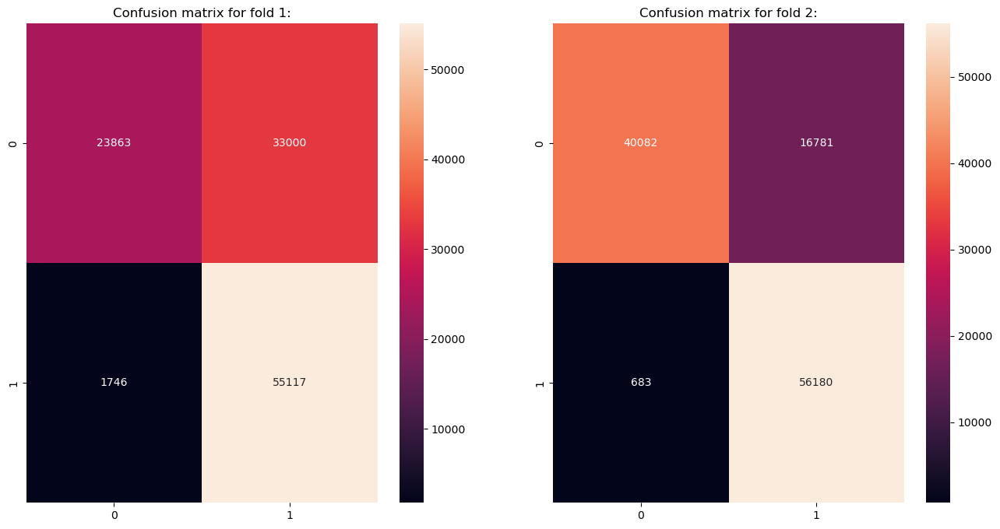

//////////////////////////////////////////////////////////////////////////////////


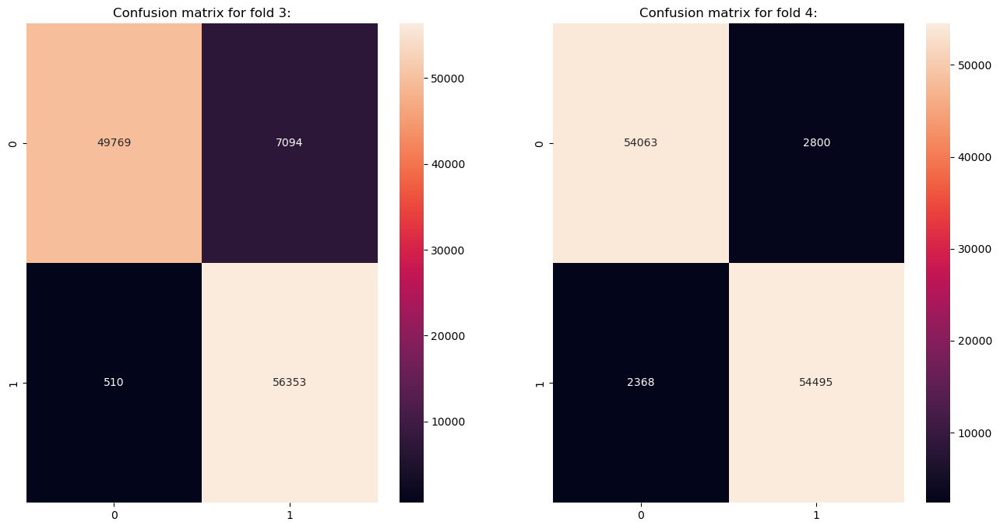

//////////////////////////////////////////////////////////////////////////////////


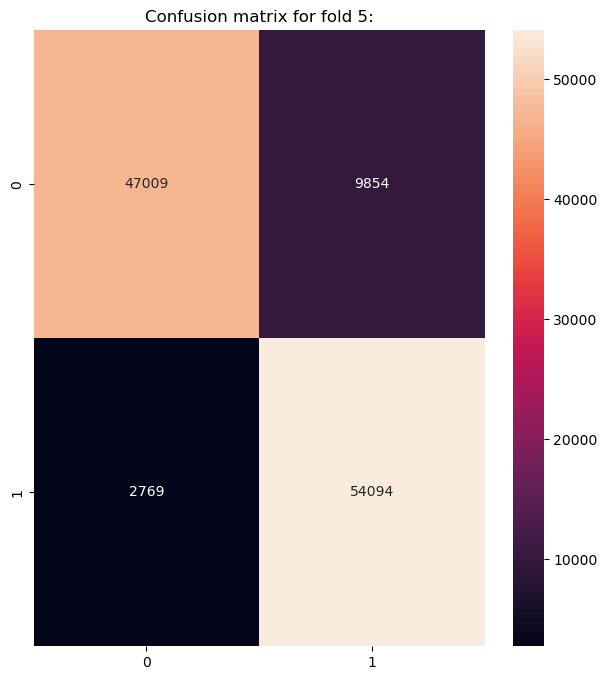

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


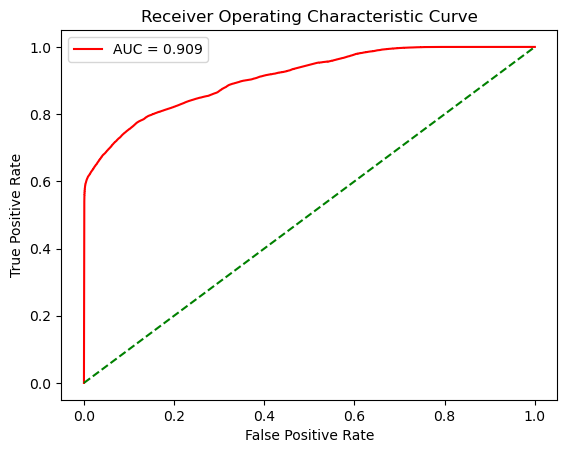

curve for fold 1:
AUC: 0.9095
//////////////////////////////////////////////////////////////////////////////////


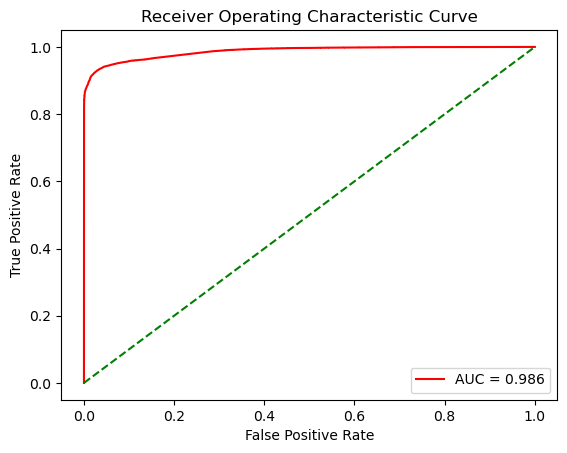

curve for fold 2:
AUC: 0.9865
//////////////////////////////////////////////////////////////////////////////////


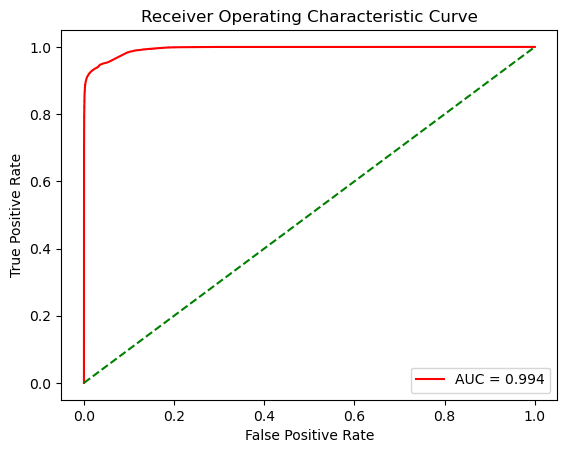

curve for fold 3:
AUC: 0.9942
//////////////////////////////////////////////////////////////////////////////////


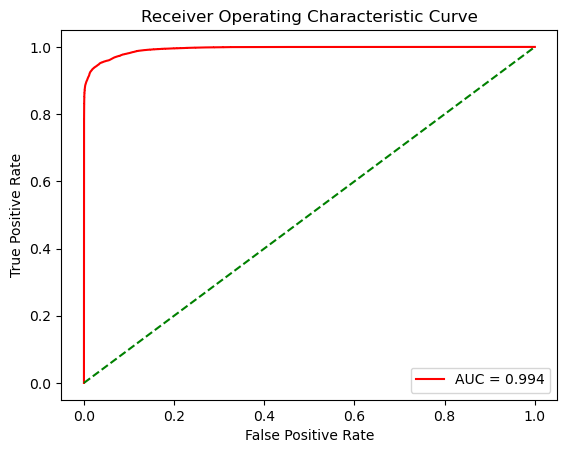

curve for fold 4:
AUC: 0.9940
//////////////////////////////////////////////////////////////////////////////////


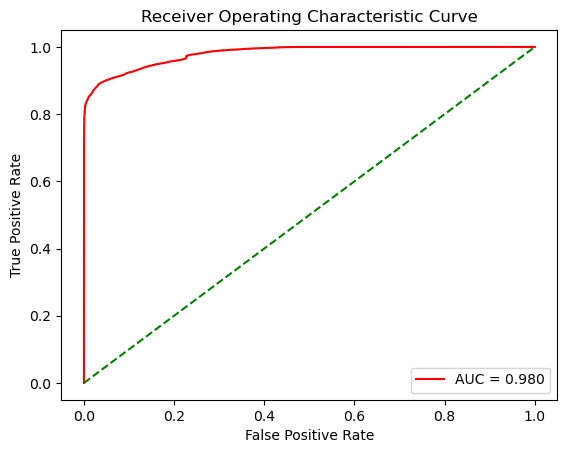

curve for fold 5:
AUC: 0.9802
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


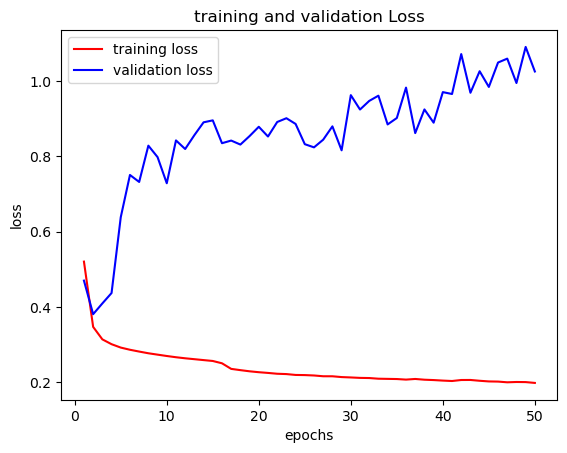

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


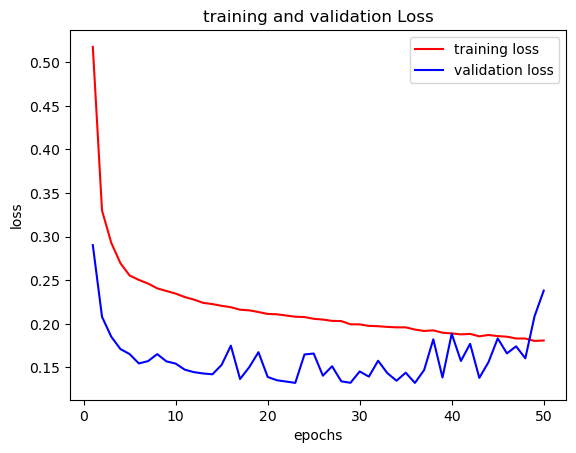

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


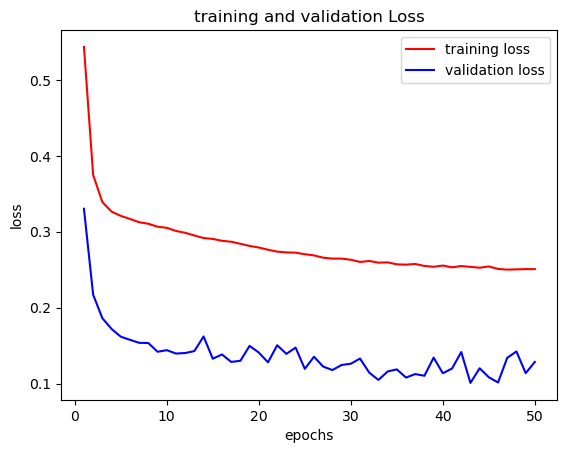

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


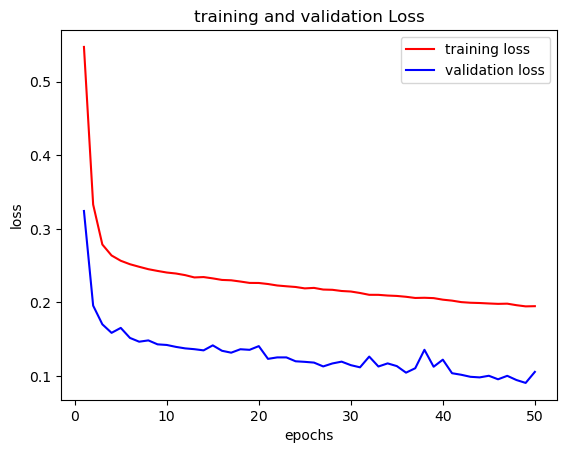

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


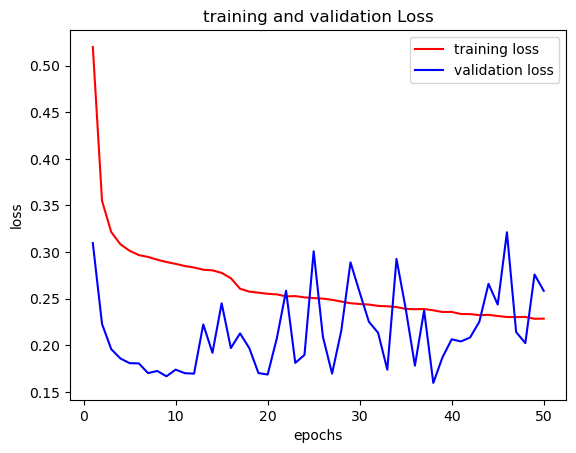

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [28]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(10, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(10, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 17s - loss: 0.4459 - accuracy: 0.7952 - val_loss: 0.4897 - val_accuracy: 0.7887 - 17s/epoch - 73ms/step
Epoch 2/50
228/228 - 8s - loss: 0.2263 - accuracy: 0.9209 - val_loss: 0.6165 - val_accuracy: 0.7537 - 8s/epoch - 35ms/step
Epoch 3/50
228/228 - 10s - loss: 0.1936 - accuracy: 0.9314 - val_loss: 0.5950 - val_accuracy: 0.7849 - 10s/epoch - 42ms/step
Epoch 4/50
228/228 - 10s - loss: 0.1803 - accuracy: 0.9360 - val_loss: 0.7807 - val_accuracy: 0.7462 - 10s/epoch - 43ms/step
Epoch 5/50
228/228 - 10s - loss: 0.1675 - accuracy: 0.9430 - val_loss: 0.8232 - val_accuracy: 0.7537 - 10s/epoch - 42ms/step
Epoch 6/50
228/228 - 10s - loss: 0.1595 - accuracy: 0.9450 - val_loss: 1.0441 - val_accuracy: 0.7184 - 10s/epoch - 43ms/step
Epoch 7/50
228/228 - 10s - loss: 0.1535 - accuracy: 0.9466 - val_loss: 1.2316 - val_accuracy: 0.6973 - 10s/epoch - 42ms/step
Epoch 8/50
228/228 - 10s - loss: 0.1483 - accuracy: 0.9479 - val_loss: 1.3614 - val_accuracy: 0.6898 - 10s/epoch - 43ms/step
Ep

228/228 - 11s - loss: 0.1354 - accuracy: 0.9375 - val_loss: 0.2150 - val_accuracy: 0.9046 - 11s/epoch - 46ms/step
Epoch 13/50
228/228 - 11s - loss: 0.1303 - accuracy: 0.9396 - val_loss: 0.2481 - val_accuracy: 0.8690 - 11s/epoch - 47ms/step
Epoch 14/50
228/228 - 11s - loss: 0.1271 - accuracy: 0.9436 - val_loss: 0.2748 - val_accuracy: 0.8324 - 11s/epoch - 48ms/step
Epoch 15/50
228/228 - 10s - loss: 0.1240 - accuracy: 0.9531 - val_loss: 0.2544 - val_accuracy: 0.8503 - 10s/epoch - 43ms/step
Epoch 16/50
228/228 - 11s - loss: 0.1201 - accuracy: 0.9542 - val_loss: 0.2609 - val_accuracy: 0.8422 - 11s/epoch - 47ms/step
Epoch 17/50
228/228 - 11s - loss: 0.1177 - accuracy: 0.9550 - val_loss: 0.3413 - val_accuracy: 0.7883 - 11s/epoch - 47ms/step
Epoch 18/50
228/228 - 11s - loss: 0.1143 - accuracy: 0.9563 - val_loss: 0.3129 - val_accuracy: 0.8014 - 11s/epoch - 50ms/step
Epoch 19/50
228/228 - 11s - loss: 0.1129 - accuracy: 0.9570 - val_loss: 0.3650 - val_accuracy: 0.7664 - 11s/epoch - 49ms/step
Epoc

Epoch 23/50
228/228 - 11s - loss: 0.0989 - accuracy: 0.9571 - val_loss: 0.1514 - val_accuracy: 0.9430 - 11s/epoch - 49ms/step
Epoch 24/50
228/228 - 11s - loss: 0.0953 - accuracy: 0.9580 - val_loss: 0.1578 - val_accuracy: 0.9408 - 11s/epoch - 48ms/step
Epoch 25/50
228/228 - 10s - loss: 0.0953 - accuracy: 0.9575 - val_loss: 0.1374 - val_accuracy: 0.9455 - 10s/epoch - 46ms/step
Epoch 26/50
228/228 - 11s - loss: 0.0942 - accuracy: 0.9580 - val_loss: 0.1478 - val_accuracy: 0.9429 - 11s/epoch - 49ms/step
Epoch 27/50
228/228 - 11s - loss: 0.0923 - accuracy: 0.9583 - val_loss: 0.1633 - val_accuracy: 0.9386 - 11s/epoch - 48ms/step
Epoch 28/50
228/228 - 11s - loss: 0.0900 - accuracy: 0.9588 - val_loss: 0.1475 - val_accuracy: 0.9415 - 11s/epoch - 46ms/step
Epoch 29/50
228/228 - 11s - loss: 0.0900 - accuracy: 0.9587 - val_loss: 0.1447 - val_accuracy: 0.9403 - 11s/epoch - 49ms/step
Epoch 30/50
228/228 - 11s - loss: 0.0884 - accuracy: 0.9591 - val_loss: 0.1473 - val_accuracy: 0.9449 - 11s/epoch - 47

Epoch 34/50
228/228 - 11s - loss: 0.0877 - accuracy: 0.9627 - val_loss: 0.0705 - val_accuracy: 0.9634 - 11s/epoch - 47ms/step
Epoch 35/50
228/228 - 11s - loss: 0.0848 - accuracy: 0.9632 - val_loss: 0.0720 - val_accuracy: 0.9634 - 11s/epoch - 46ms/step
Epoch 36/50
228/228 - 11s - loss: 0.0861 - accuracy: 0.9632 - val_loss: 0.0860 - val_accuracy: 0.9568 - 11s/epoch - 48ms/step
Epoch 37/50
228/228 - 11s - loss: 0.0841 - accuracy: 0.9638 - val_loss: 0.0719 - val_accuracy: 0.9621 - 11s/epoch - 46ms/step
Epoch 38/50
228/228 - 11s - loss: 0.0845 - accuracy: 0.9632 - val_loss: 0.0798 - val_accuracy: 0.9612 - 11s/epoch - 46ms/step
Epoch 39/50
228/228 - 11s - loss: 0.0831 - accuracy: 0.9634 - val_loss: 0.0645 - val_accuracy: 0.9644 - 11s/epoch - 47ms/step
Epoch 40/50
228/228 - 11s - loss: 0.0820 - accuracy: 0.9643 - val_loss: 0.0644 - val_accuracy: 0.9653 - 11s/epoch - 47ms/step
Epoch 41/50
228/228 - 11s - loss: 0.0802 - accuracy: 0.9650 - val_loss: 0.0753 - val_accuracy: 0.9612 - 11s/epoch - 47

Epoch 45/50
228/228 - 10s - loss: 0.0793 - accuracy: 0.9655 - val_loss: 0.1786 - val_accuracy: 0.9314 - 10s/epoch - 43ms/step
Epoch 46/50
228/228 - 10s - loss: 0.0780 - accuracy: 0.9660 - val_loss: 0.3164 - val_accuracy: 0.8924 - 10s/epoch - 46ms/step
Epoch 47/50
228/228 - 10s - loss: 0.0785 - accuracy: 0.9657 - val_loss: 0.1937 - val_accuracy: 0.9253 - 10s/epoch - 43ms/step
Epoch 48/50
228/228 - 10s - loss: 0.0799 - accuracy: 0.9650 - val_loss: 0.2239 - val_accuracy: 0.9105 - 10s/epoch - 46ms/step
Epoch 49/50
228/228 - 10s - loss: 0.0766 - accuracy: 0.9667 - val_loss: 0.2229 - val_accuracy: 0.9120 - 10s/epoch - 45ms/step
Epoch 50/50
228/228 - 10s - loss: 0.0751 - accuracy: 0.9672 - val_loss: 0.3404 - val_accuracy: 0.8840 - 10s/epoch - 43ms/step
3554/3554 [==============================] - 13s 3ms/step
first fold
mcc for fold 5: 0.7873
accuracy for fold 5: 0.8840
precision for fold 5: 0.8148
recall for fold 5: 0.9940
bcr for fold 5: 0.8840
3554/3554 [==============================] - 1

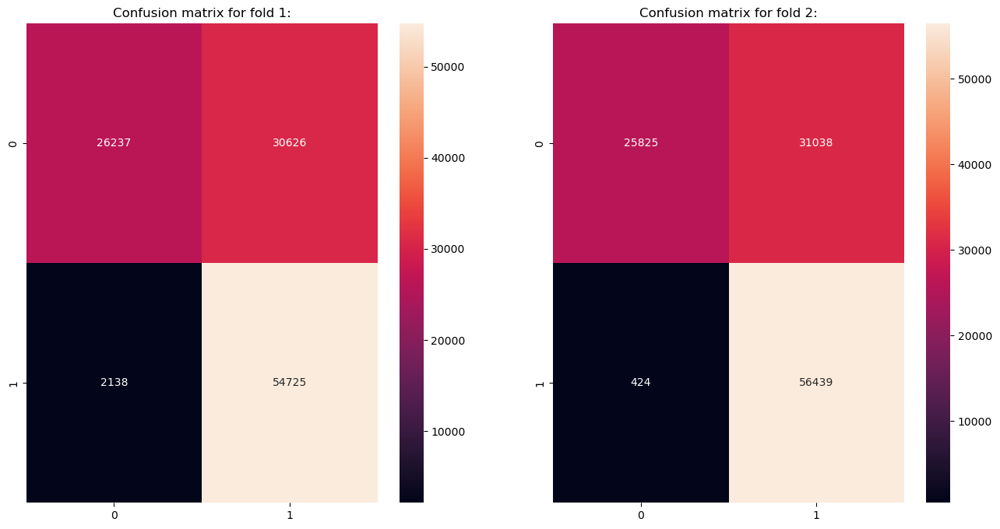

//////////////////////////////////////////////////////////////////////////////////


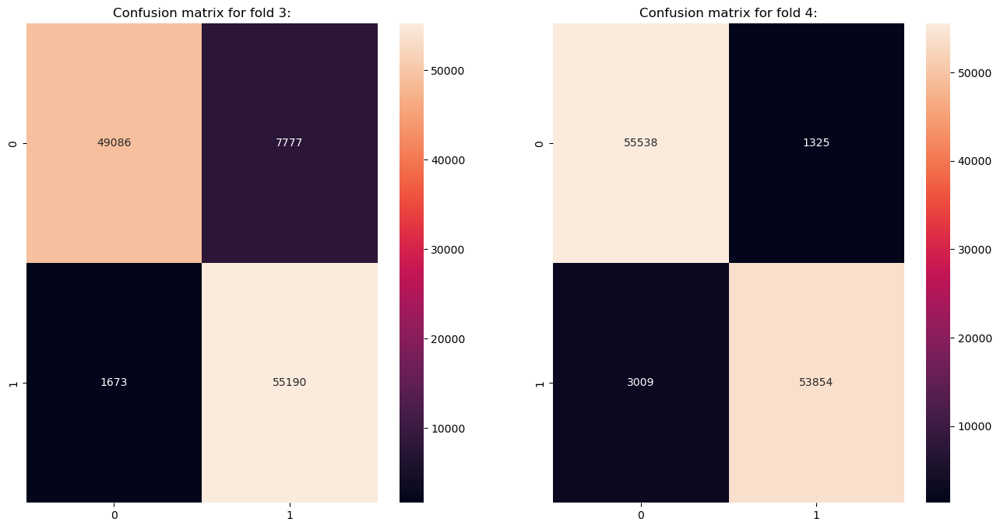

//////////////////////////////////////////////////////////////////////////////////


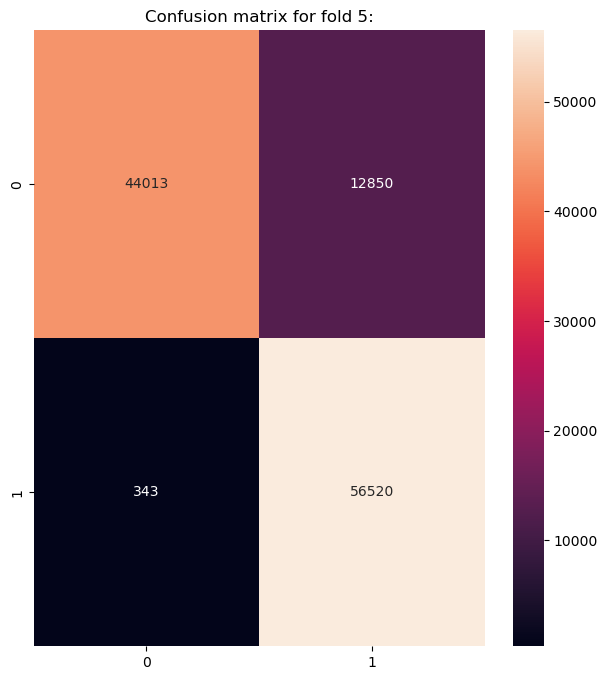

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


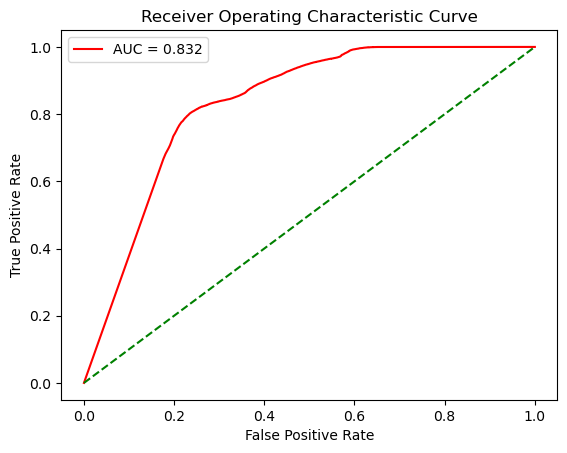

curve for fold 1:
AUC: 0.8316
//////////////////////////////////////////////////////////////////////////////////


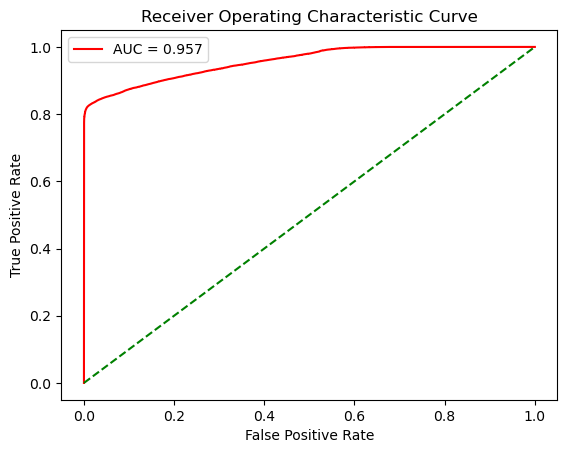

curve for fold 2:
AUC: 0.9569
//////////////////////////////////////////////////////////////////////////////////


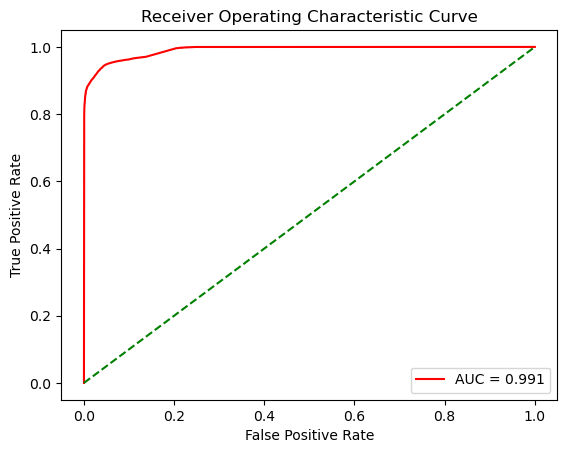

curve for fold 3:
AUC: 0.9908
//////////////////////////////////////////////////////////////////////////////////


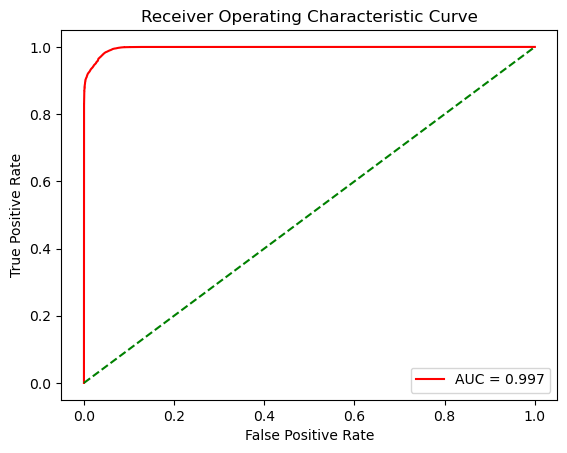

curve for fold 4:
AUC: 0.9971
//////////////////////////////////////////////////////////////////////////////////


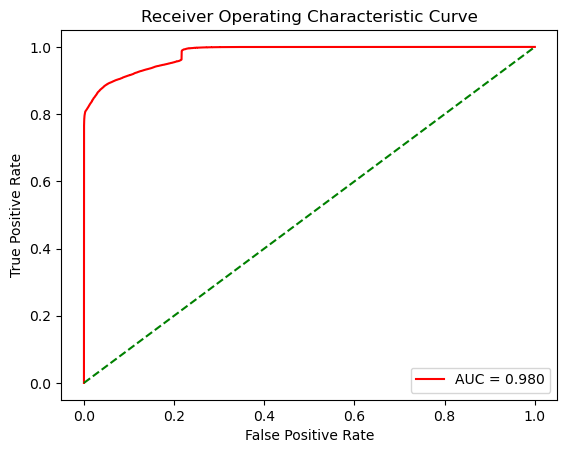

curve for fold 5:
AUC: 0.9803
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


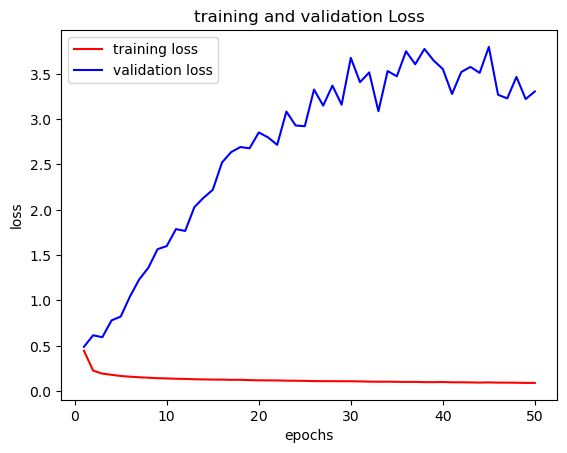

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


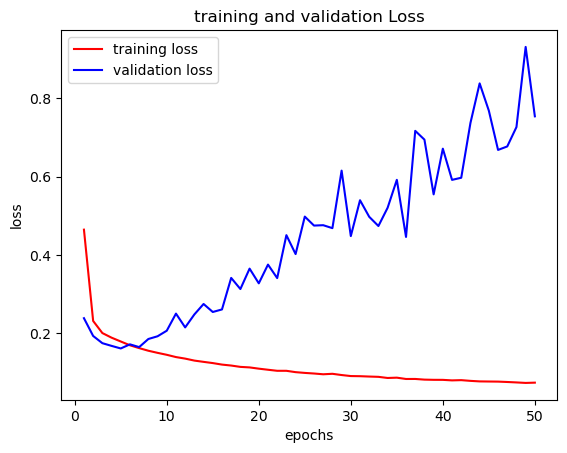

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


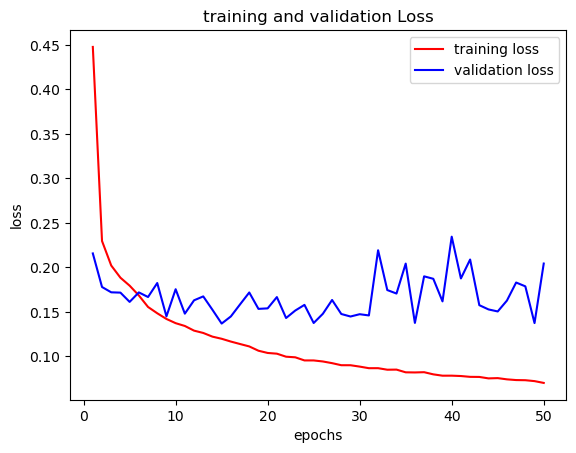

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


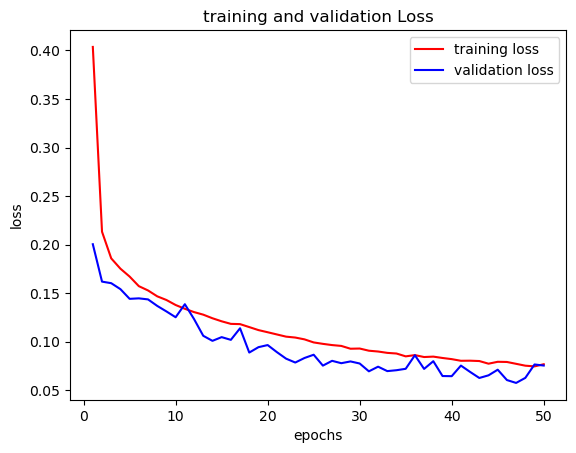

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


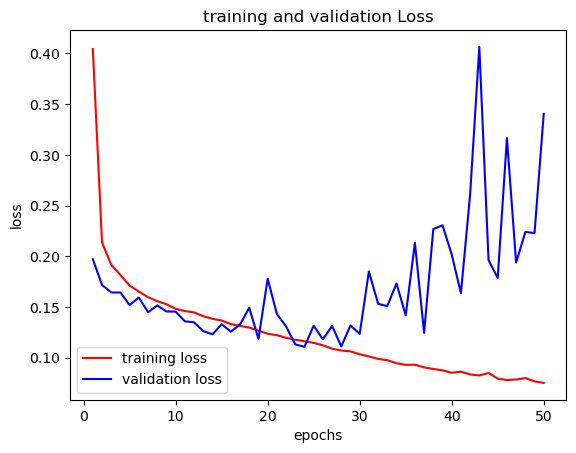

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [29]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(20, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(20, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 13s - loss: 0.4151 - accuracy: 0.8446 - val_loss: 0.2517 - val_accuracy: 0.9437 - 13s/epoch - 58ms/step
Epoch 2/50
228/228 - 3s - loss: 0.2403 - accuracy: 0.9195 - val_loss: 0.1335 - val_accuracy: 0.9698 - 3s/epoch - 13ms/step
Epoch 3/50
228/228 - 3s - loss: 0.1869 - accuracy: 0.9364 - val_loss: 0.0865 - val_accuracy: 0.9807 - 3s/epoch - 13ms/step
Epoch 4/50
228/228 - 3s - loss: 0.1614 - accuracy: 0.9450 - val_loss: 0.0616 - val_accuracy: 0.9860 - 3s/epoch - 13ms/step
Epoch 5/50
228/228 - 3s - loss: 0.1466 - accuracy: 0.9491 - val_loss: 0.0494 - val_accuracy: 0.9887 - 3s/epoch - 13ms/step
Epoch 6/50
228/228 - 3s - loss: 0.1368 - accuracy: 0.9528 - val_loss: 0.0417 - val_accuracy: 0.9907 - 3s/epoch - 13ms/step
Epoch 7/50
228/228 - 3s - loss: 0.1312 - accuracy: 0.9532 - val_loss: 0.0371 - val_accuracy: 0.9914 - 3s/epoch - 13ms/step
Epoch 8/50
228/228 - 3s - loss: 0.1261 - accuracy: 0.9545 - val_loss: 0.0353 - val_accuracy: 0.9916 - 3s/epoch - 13ms/step
Epoch 9/50
228

Epoch 13/50
228/228 - 2s - loss: 0.1190 - accuracy: 0.9403 - val_loss: 0.0056 - val_accuracy: 0.9990 - 2s/epoch - 8ms/step
Epoch 14/50
228/228 - 2s - loss: 0.1193 - accuracy: 0.9400 - val_loss: 0.0051 - val_accuracy: 0.9990 - 2s/epoch - 7ms/step
Epoch 15/50
228/228 - 2s - loss: 0.1183 - accuracy: 0.9405 - val_loss: 0.0046 - val_accuracy: 0.9991 - 2s/epoch - 8ms/step
Epoch 16/50
228/228 - 2s - loss: 0.1176 - accuracy: 0.9408 - val_loss: 0.0042 - val_accuracy: 0.9992 - 2s/epoch - 8ms/step
Epoch 17/50
228/228 - 2s - loss: 0.1173 - accuracy: 0.9406 - val_loss: 0.0040 - val_accuracy: 0.9992 - 2s/epoch - 8ms/step
Epoch 18/50
228/228 - 2s - loss: 0.1161 - accuracy: 0.9414 - val_loss: 0.0035 - val_accuracy: 0.9993 - 2s/epoch - 8ms/step
Epoch 19/50
228/228 - 2s - loss: 0.1172 - accuracy: 0.9405 - val_loss: 0.0034 - val_accuracy: 0.9993 - 2s/epoch - 7ms/step
Epoch 20/50
228/228 - 2s - loss: 0.1177 - accuracy: 0.9403 - val_loss: 0.0031 - val_accuracy: 0.9994 - 2s/epoch - 8ms/step
Epoch 21/50
228/

Epoch 25/50
228/228 - 3s - loss: 0.1041 - accuracy: 0.9705 - val_loss: 0.0112 - val_accuracy: 0.9988 - 3s/epoch - 14ms/step
Epoch 26/50
228/228 - 3s - loss: 0.1035 - accuracy: 0.9708 - val_loss: 0.0115 - val_accuracy: 0.9988 - 3s/epoch - 13ms/step
Epoch 27/50
228/228 - 3s - loss: 0.1024 - accuracy: 0.9712 - val_loss: 0.0112 - val_accuracy: 0.9987 - 3s/epoch - 13ms/step
Epoch 28/50
228/228 - 3s - loss: 0.1039 - accuracy: 0.9707 - val_loss: 0.0113 - val_accuracy: 0.9988 - 3s/epoch - 14ms/step
Epoch 29/50
228/228 - 3s - loss: 0.1033 - accuracy: 0.9708 - val_loss: 0.0110 - val_accuracy: 0.9987 - 3s/epoch - 14ms/step
Epoch 30/50
228/228 - 3s - loss: 0.1016 - accuracy: 0.9715 - val_loss: 0.0109 - val_accuracy: 0.9989 - 3s/epoch - 14ms/step
Epoch 31/50
228/228 - 4s - loss: 0.1030 - accuracy: 0.9709 - val_loss: 0.0105 - val_accuracy: 0.9989 - 4s/epoch - 16ms/step
Epoch 32/50
228/228 - 3s - loss: 0.1029 - accuracy: 0.9710 - val_loss: 0.0110 - val_accuracy: 0.9988 - 3s/epoch - 14ms/step
Epoch 33

Epoch 37/50
228/228 - 3s - loss: 0.1406 - accuracy: 0.9151 - val_loss: 0.0030 - val_accuracy: 0.9994 - 3s/epoch - 13ms/step
Epoch 38/50
228/228 - 3s - loss: 0.1397 - accuracy: 0.9157 - val_loss: 0.0030 - val_accuracy: 0.9993 - 3s/epoch - 14ms/step
Epoch 39/50
228/228 - 3s - loss: 0.1393 - accuracy: 0.9159 - val_loss: 0.0029 - val_accuracy: 0.9994 - 3s/epoch - 13ms/step
Epoch 40/50
228/228 - 3s - loss: 0.1398 - accuracy: 0.9158 - val_loss: 0.0032 - val_accuracy: 0.9993 - 3s/epoch - 13ms/step
Epoch 41/50
228/228 - 3s - loss: 0.1393 - accuracy: 0.9162 - val_loss: 0.0033 - val_accuracy: 0.9993 - 3s/epoch - 13ms/step
Epoch 42/50
228/228 - 3s - loss: 0.1395 - accuracy: 0.9160 - val_loss: 0.0031 - val_accuracy: 0.9993 - 3s/epoch - 13ms/step
Epoch 43/50
228/228 - 3s - loss: 0.1391 - accuracy: 0.9156 - val_loss: 0.0031 - val_accuracy: 0.9994 - 3s/epoch - 13ms/step
Epoch 44/50
228/228 - 3s - loss: 0.1391 - accuracy: 0.9170 - val_loss: 0.0030 - val_accuracy: 0.9994 - 3s/epoch - 13ms/step
Epoch 45

Epoch 49/50
228/228 - 3s - loss: 0.1186 - accuracy: 0.9152 - val_loss: 0.0029 - val_accuracy: 0.9994 - 3s/epoch - 14ms/step
Epoch 50/50
228/228 - 3s - loss: 0.1175 - accuracy: 0.9159 - val_loss: 0.0026 - val_accuracy: 0.9995 - 3s/epoch - 13ms/step
3554/3554 [==============================] - 15s 4ms/step
first fold
mcc for fold 5: 0.9990
accuracy for fold 5: 0.9995
precision for fold 5: 0.9990
recall for fold 5: 1.0000
bcr for fold 5: 0.9995
3554/3554 [==============================] - 13s 4ms/step
Training Accuracy: 0.9998812936355802
Testing Accuracy: 0.9994900022861967
Training Accuracy: 0.9997626436225858
Testing Accuracy: 0.9989810439029532
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9988076605173839
precision: 0.997626121793895
recall: 1.0
bcr: 0.9988076605173839
mcc: 0.9976207213621286
..........

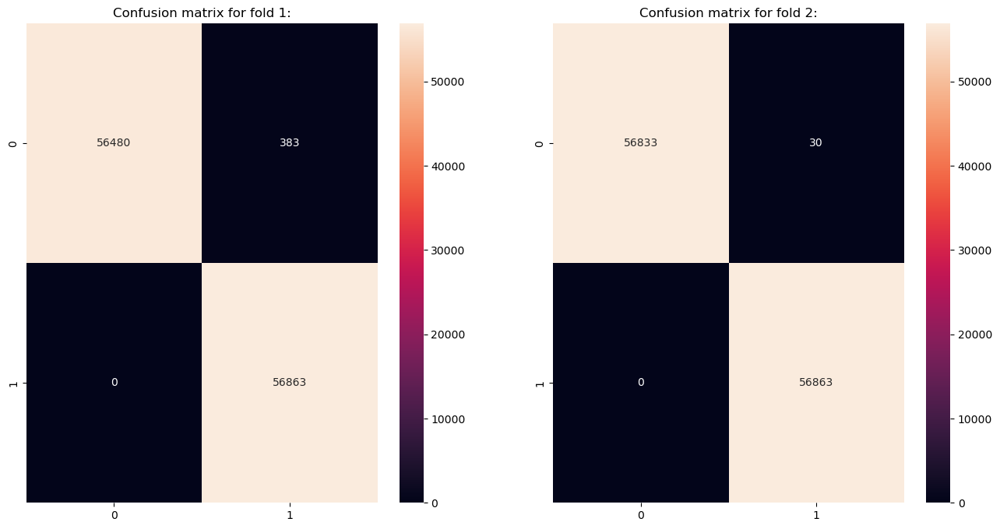

//////////////////////////////////////////////////////////////////////////////////


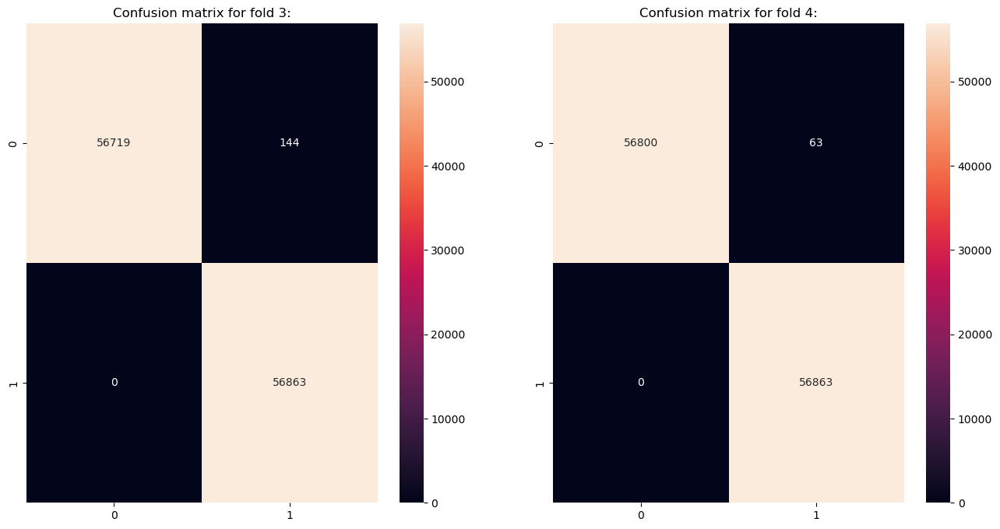

//////////////////////////////////////////////////////////////////////////////////


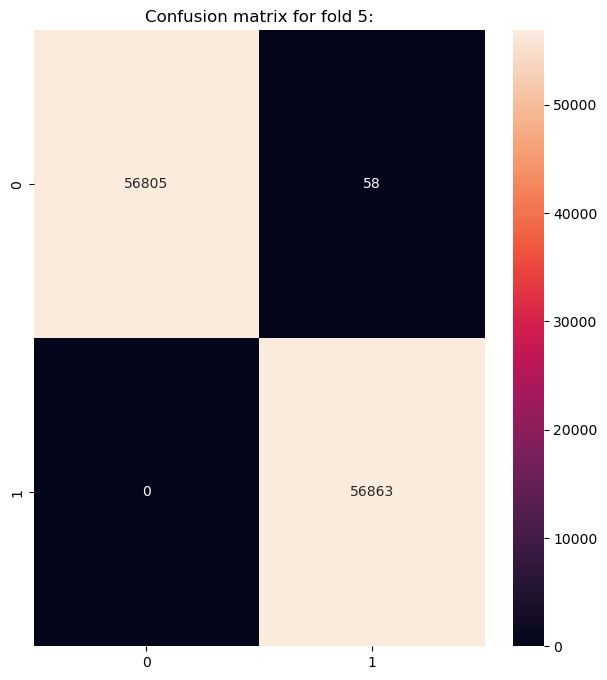

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


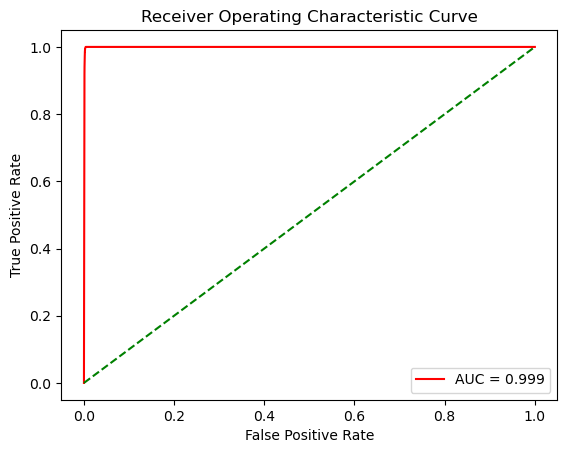

curve for fold 1:
AUC: 0.9994
//////////////////////////////////////////////////////////////////////////////////


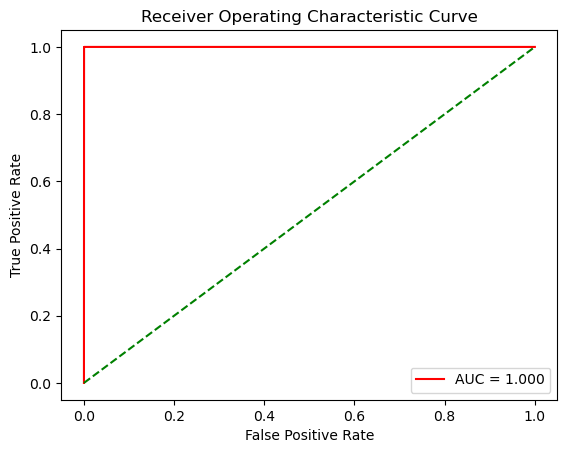

curve for fold 2:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


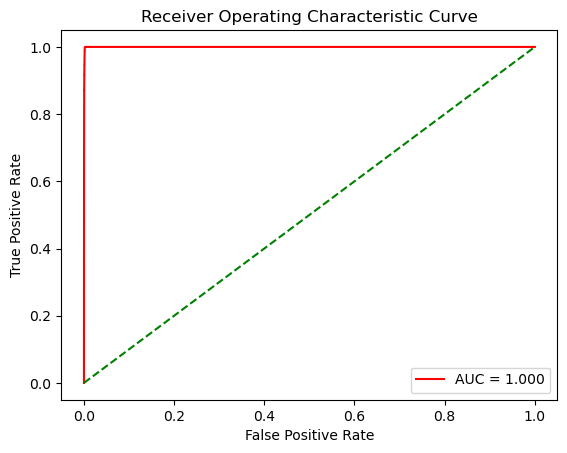

curve for fold 3:
AUC: 0.9997
//////////////////////////////////////////////////////////////////////////////////


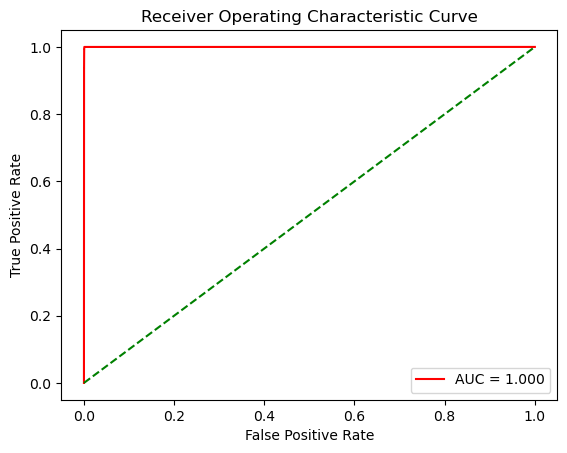

curve for fold 4:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


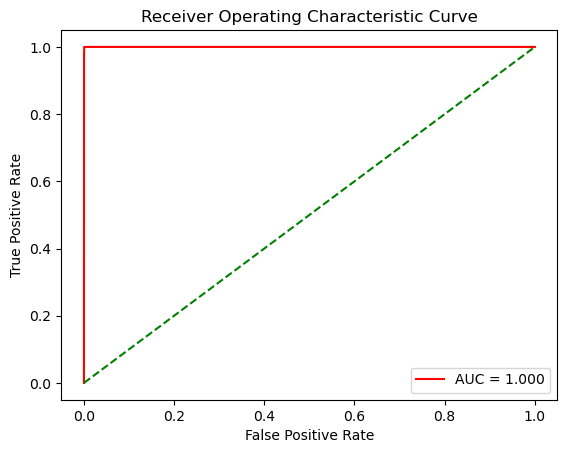

curve for fold 5:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


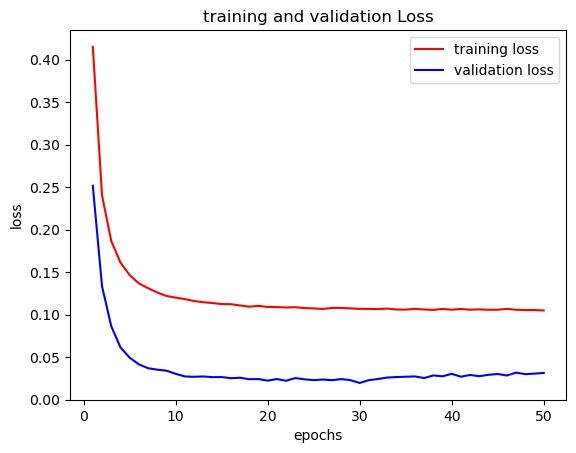

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


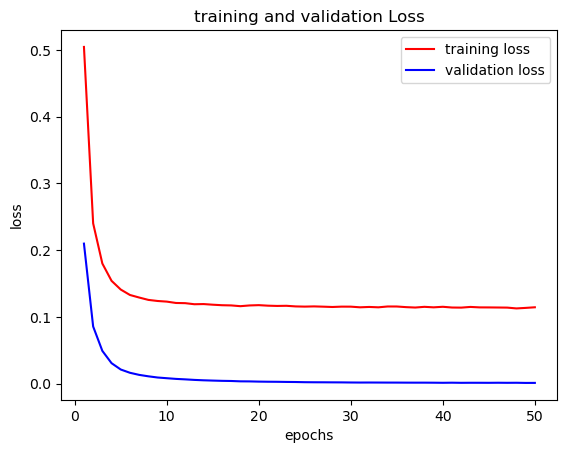

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


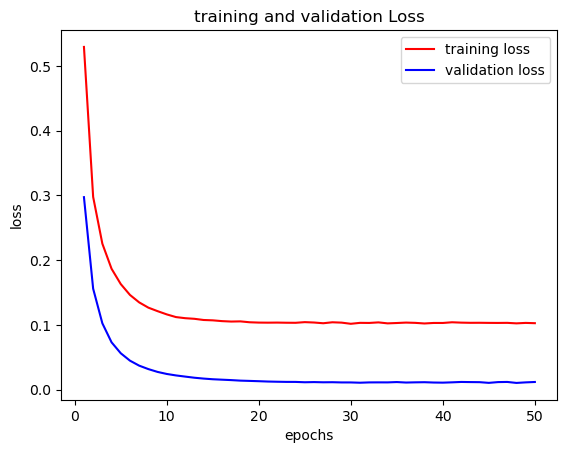

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


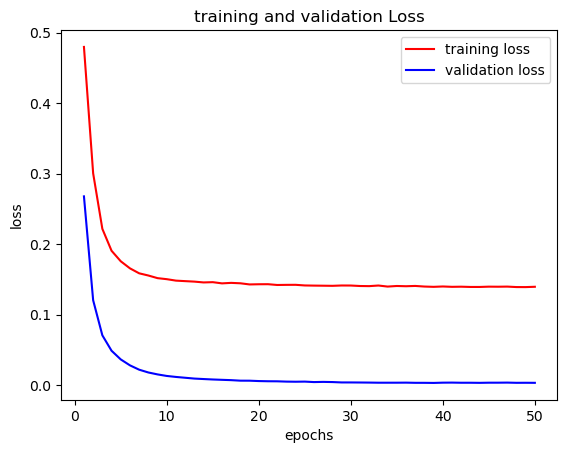

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


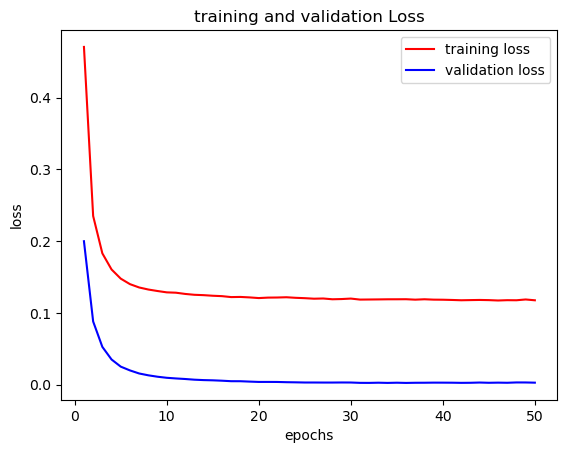

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [13]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(10, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(10, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 22s - loss: 0.3140 - accuracy: 0.8969 - val_loss: 0.1063 - val_accuracy: 0.9620 - 22s/epoch - 96ms/step
Epoch 2/50
228/228 - 10s - loss: 0.0810 - accuracy: 0.9643 - val_loss: 0.0443 - val_accuracy: 0.9876 - 10s/epoch - 42ms/step
Epoch 3/50
228/228 - 9s - loss: 0.0410 - accuracy: 0.9852 - val_loss: 0.0251 - val_accuracy: 0.9951 - 9s/epoch - 40ms/step
Epoch 4/50
228/228 - 10s - loss: 0.0277 - accuracy: 0.9953 - val_loss: 0.0191 - val_accuracy: 0.9961 - 10s/epoch - 43ms/step
Epoch 5/50
228/228 - 10s - loss: 0.0213 - accuracy: 0.9969 - val_loss: 0.0152 - val_accuracy: 0.9969 - 10s/epoch - 45ms/step
Epoch 6/50
228/228 - 10s - loss: 0.0178 - accuracy: 0.9977 - val_loss: 0.0145 - val_accuracy: 0.9970 - 10s/epoch - 44ms/step
Epoch 7/50
228/228 - 10s - loss: 0.0153 - accuracy: 0.9981 - val_loss: 0.0130 - val_accuracy: 0.9973 - 10s/epoch - 46ms/step
Epoch 8/50
228/228 - 10s - loss: 0.0133 - accuracy: 0.9983 - val_loss: 0.0126 - val_accuracy: 0.9976 - 10s/epoch - 44ms/step
Ep

228/228 - 10s - loss: 0.0114 - accuracy: 0.9986 - val_loss: 0.0025 - val_accuracy: 0.9993 - 10s/epoch - 44ms/step
Epoch 13/50
228/228 - 7s - loss: 0.0104 - accuracy: 0.9988 - val_loss: 0.0022 - val_accuracy: 0.9994 - 7s/epoch - 29ms/step
Epoch 14/50
228/228 - 6s - loss: 0.0094 - accuracy: 0.9988 - val_loss: 0.0020 - val_accuracy: 0.9994 - 6s/epoch - 28ms/step
Epoch 15/50
228/228 - 6s - loss: 0.0089 - accuracy: 0.9989 - val_loss: 0.0019 - val_accuracy: 0.9995 - 6s/epoch - 26ms/step
Epoch 16/50
228/228 - 6s - loss: 0.0081 - accuracy: 0.9989 - val_loss: 0.0016 - val_accuracy: 0.9996 - 6s/epoch - 28ms/step
Epoch 17/50
228/228 - 6s - loss: 0.0074 - accuracy: 0.9990 - val_loss: 0.0014 - val_accuracy: 0.9997 - 6s/epoch - 28ms/step
Epoch 18/50
228/228 - 6s - loss: 0.0072 - accuracy: 0.9990 - val_loss: 0.0014 - val_accuracy: 0.9997 - 6s/epoch - 28ms/step
Epoch 19/50
228/228 - 6s - loss: 0.0068 - accuracy: 0.9990 - val_loss: 0.0013 - val_accuracy: 0.9996 - 6s/epoch - 27ms/step
Epoch 20/50
228/22

Epoch 23/50
228/228 - 11s - loss: 0.0064 - accuracy: 0.9979 - val_loss: 0.0161 - val_accuracy: 0.9974 - 11s/epoch - 48ms/step
Epoch 24/50
228/228 - 11s - loss: 0.0062 - accuracy: 0.9979 - val_loss: 0.0145 - val_accuracy: 0.9977 - 11s/epoch - 47ms/step
Epoch 25/50
228/228 - 11s - loss: 0.0059 - accuracy: 0.9980 - val_loss: 0.0167 - val_accuracy: 0.9975 - 11s/epoch - 46ms/step
Epoch 26/50
228/228 - 11s - loss: 0.0058 - accuracy: 0.9981 - val_loss: 0.0159 - val_accuracy: 0.9976 - 11s/epoch - 49ms/step
Epoch 27/50
228/228 - 10s - loss: 0.0057 - accuracy: 0.9980 - val_loss: 0.0154 - val_accuracy: 0.9977 - 10s/epoch - 46ms/step
Epoch 28/50
228/228 - 11s - loss: 0.0056 - accuracy: 0.9980 - val_loss: 0.0182 - val_accuracy: 0.9974 - 11s/epoch - 46ms/step
Epoch 29/50
228/228 - 11s - loss: 0.0056 - accuracy: 0.9980 - val_loss: 0.0186 - val_accuracy: 0.9974 - 11s/epoch - 50ms/step
Epoch 30/50
228/228 - 11s - loss: 0.0054 - accuracy: 0.9980 - val_loss: 0.0170 - val_accuracy: 0.9977 - 11s/epoch - 47

Epoch 34/50
228/228 - 10s - loss: 0.0046 - accuracy: 0.9987 - val_loss: 0.0032 - val_accuracy: 0.9995 - 10s/epoch - 43ms/step
Epoch 35/50
228/228 - 11s - loss: 0.0043 - accuracy: 0.9989 - val_loss: 0.0033 - val_accuracy: 0.9995 - 11s/epoch - 47ms/step
Epoch 36/50
228/228 - 8s - loss: 0.0043 - accuracy: 0.9988 - val_loss: 0.0031 - val_accuracy: 0.9996 - 8s/epoch - 36ms/step
Epoch 37/50
228/228 - 7s - loss: 0.0042 - accuracy: 0.9988 - val_loss: 0.0031 - val_accuracy: 0.9996 - 7s/epoch - 32ms/step
Epoch 38/50
228/228 - 8s - loss: 0.0042 - accuracy: 0.9988 - val_loss: 0.0028 - val_accuracy: 0.9996 - 8s/epoch - 33ms/step
Epoch 39/50
228/228 - 10s - loss: 0.0041 - accuracy: 0.9989 - val_loss: 0.0038 - val_accuracy: 0.9994 - 10s/epoch - 42ms/step
Epoch 40/50
228/228 - 8s - loss: 0.0042 - accuracy: 0.9988 - val_loss: 0.0034 - val_accuracy: 0.9995 - 8s/epoch - 34ms/step
Epoch 41/50
228/228 - 8s - loss: 0.0040 - accuracy: 0.9989 - val_loss: 0.0039 - val_accuracy: 0.9995 - 8s/epoch - 33ms/step
Ep

Epoch 46/50
228/228 - 4s - loss: 0.0031 - accuracy: 0.9993 - val_loss: 0.0016 - val_accuracy: 0.9997 - 4s/epoch - 20ms/step
Epoch 47/50
228/228 - 5s - loss: 0.0030 - accuracy: 0.9993 - val_loss: 0.0020 - val_accuracy: 0.9996 - 5s/epoch - 21ms/step
Epoch 48/50
228/228 - 4s - loss: 0.0031 - accuracy: 0.9993 - val_loss: 0.0018 - val_accuracy: 0.9997 - 4s/epoch - 19ms/step
Epoch 49/50
228/228 - 4s - loss: 0.0029 - accuracy: 0.9993 - val_loss: 0.0023 - val_accuracy: 0.9996 - 4s/epoch - 19ms/step
Epoch 50/50
228/228 - 4s - loss: 0.0032 - accuracy: 0.9993 - val_loss: 0.0014 - val_accuracy: 0.9998 - 4s/epoch - 19ms/step
3554/3554 [==============================] - 7s 2ms/step
first fold
mcc for fold 5: 0.9996
accuracy for fold 5: 0.9998
precision for fold 5: 0.9996
recall for fold 5: 1.0000
bcr for fold 5: 0.9998
3554/3554 [==============================] - 6s 2ms/step
Training Accuracy: 0.9999802156059301
Testing Accuracy: 0.9997801733992226
Training Accuracy: 0.9999604327774871
Testing Accur

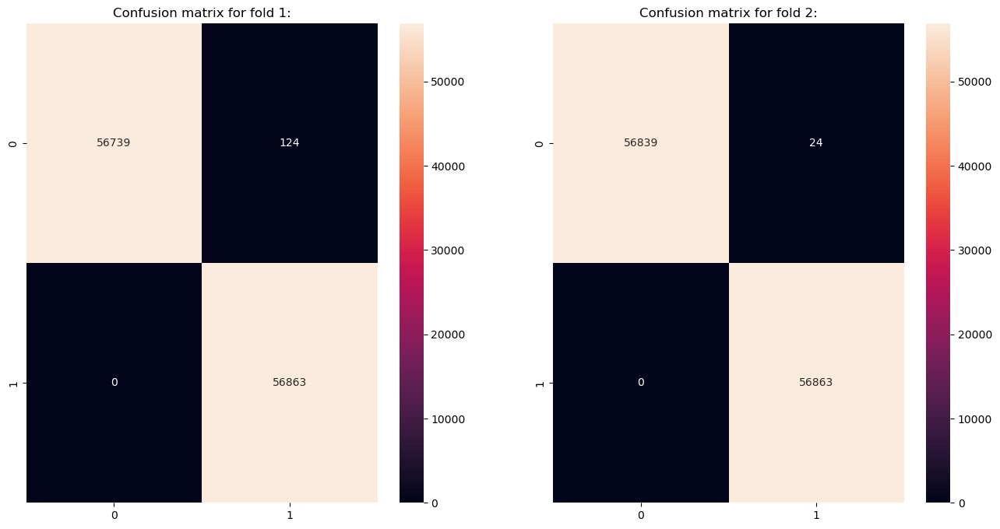

//////////////////////////////////////////////////////////////////////////////////


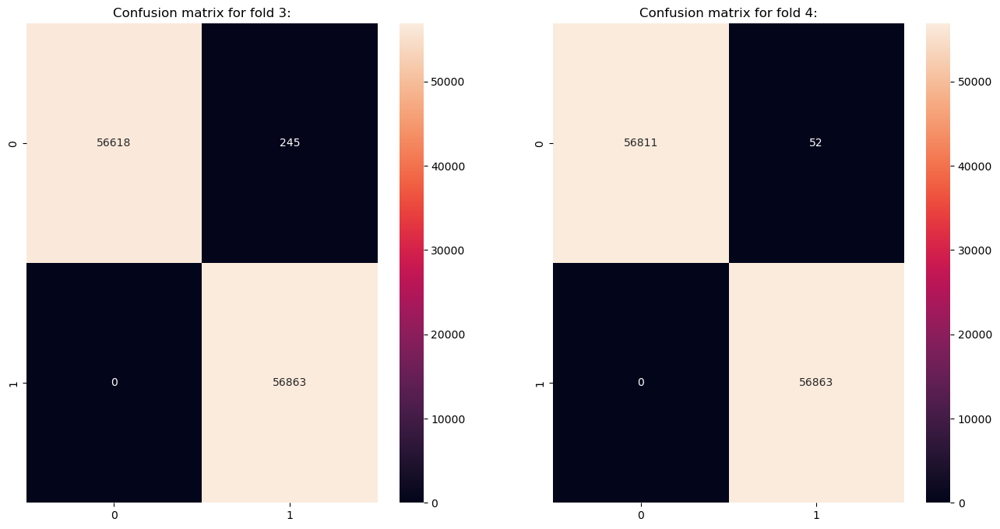

//////////////////////////////////////////////////////////////////////////////////


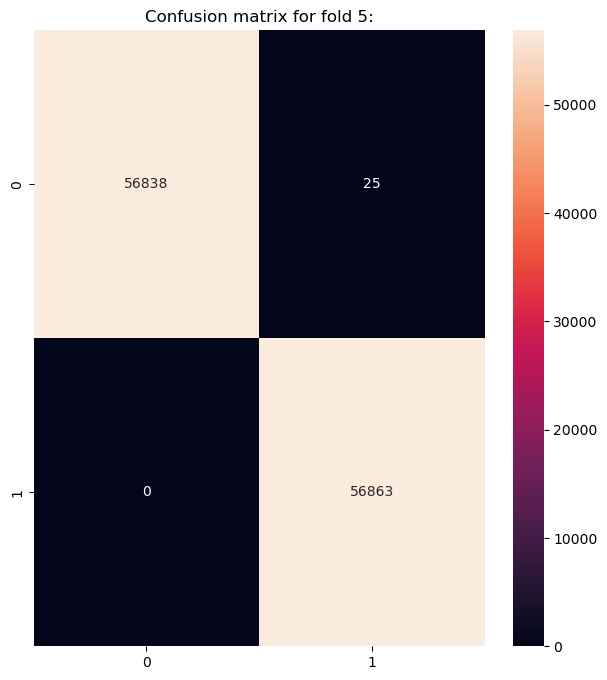

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


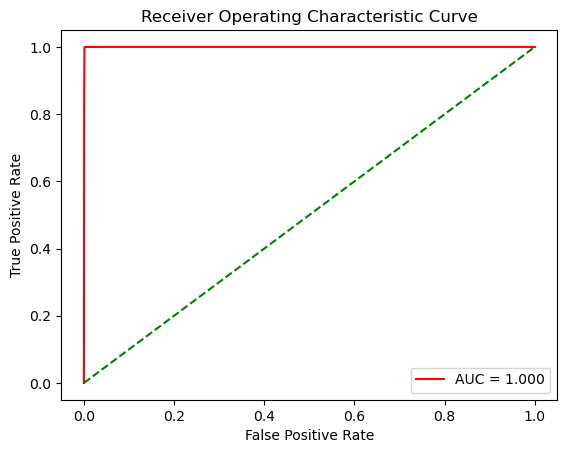

curve for fold 1:
AUC: 0.9997
//////////////////////////////////////////////////////////////////////////////////


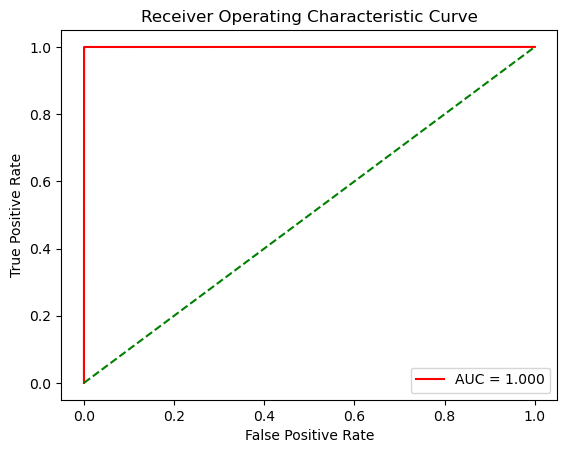

curve for fold 2:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


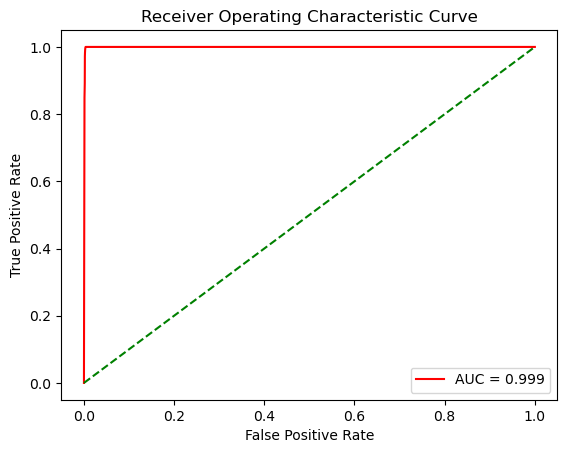

curve for fold 3:
AUC: 0.9993
//////////////////////////////////////////////////////////////////////////////////


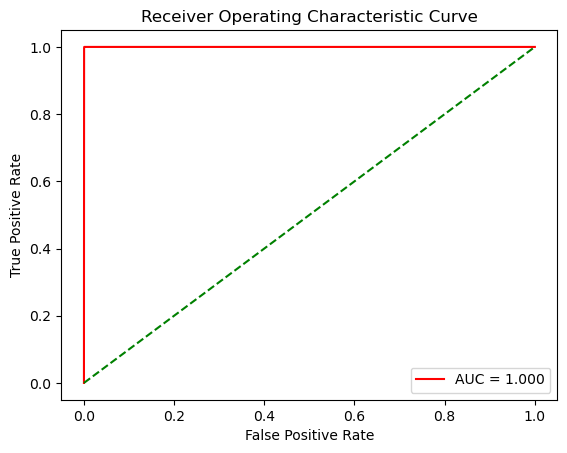

curve for fold 4:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


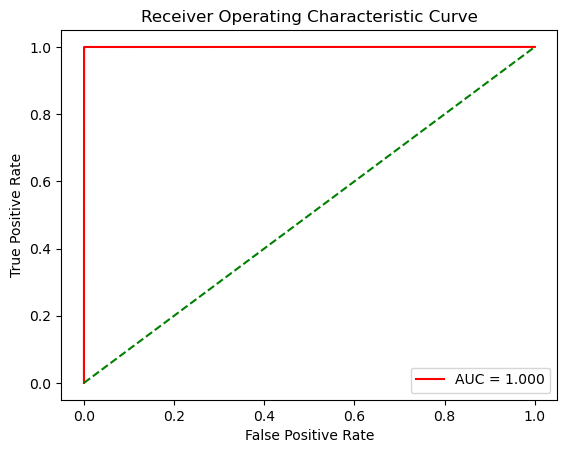

curve for fold 5:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


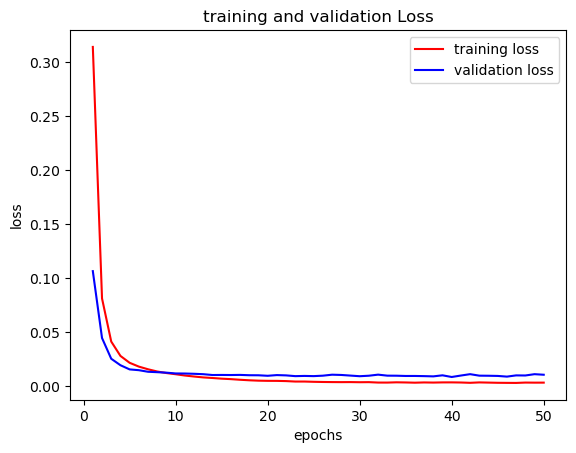

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


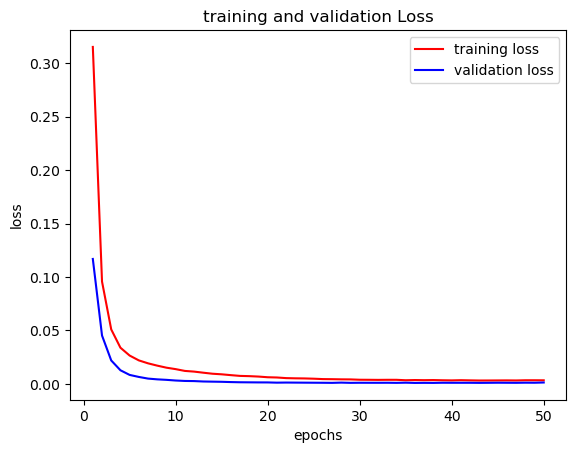

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


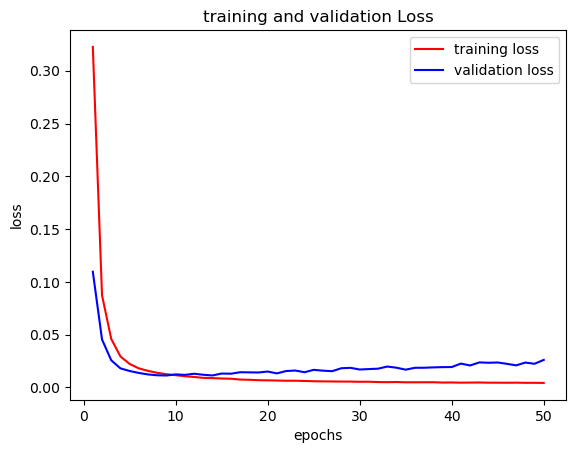

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


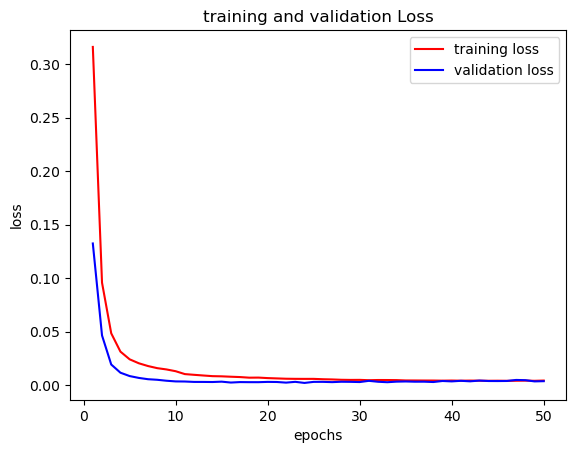

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


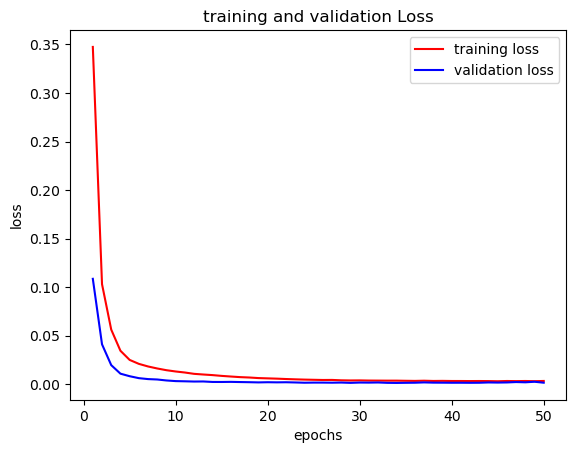

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [14]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(20, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(20, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 9s - loss: 0.3028 - accuracy: 0.9176 - val_loss: 0.1371 - val_accuracy: 0.9584 - 9s/epoch - 38ms/step
Epoch 2/50
228/228 - 4s - loss: 0.0806 - accuracy: 0.9753 - val_loss: 0.0551 - val_accuracy: 0.9819 - 4s/epoch - 18ms/step
Epoch 3/50
228/228 - 4s - loss: 0.0368 - accuracy: 0.9904 - val_loss: 0.0324 - val_accuracy: 0.9915 - 4s/epoch - 19ms/step
Epoch 4/50
228/228 - 4s - loss: 0.0217 - accuracy: 0.9953 - val_loss: 0.0227 - val_accuracy: 0.9947 - 4s/epoch - 18ms/step
Epoch 5/50
228/228 - 4s - loss: 0.0152 - accuracy: 0.9969 - val_loss: 0.0187 - val_accuracy: 0.9958 - 4s/epoch - 17ms/step
Epoch 6/50
228/228 - 4s - loss: 0.0117 - accuracy: 0.9976 - val_loss: 0.0167 - val_accuracy: 0.9966 - 4s/epoch - 18ms/step
Epoch 7/50
228/228 - 5s - loss: 0.0096 - accuracy: 0.9981 - val_loss: 0.0147 - val_accuracy: 0.9972 - 5s/epoch - 22ms/step
Epoch 8/50
228/228 - 4s - loss: 0.0083 - accuracy: 0.9984 - val_loss: 0.0139 - val_accuracy: 0.9974 - 4s/epoch - 19ms/step
Epoch 9/50
228/2

Epoch 13/50
228/228 - 5s - loss: 0.0067 - accuracy: 0.9995 - val_loss: 0.0019 - val_accuracy: 0.9995 - 5s/epoch - 22ms/step
Epoch 14/50
228/228 - 5s - loss: 0.0060 - accuracy: 0.9995 - val_loss: 0.0017 - val_accuracy: 0.9996 - 5s/epoch - 22ms/step
Epoch 15/50
228/228 - 5s - loss: 0.0058 - accuracy: 0.9995 - val_loss: 0.0018 - val_accuracy: 0.9995 - 5s/epoch - 21ms/step
Epoch 16/50
228/228 - 5s - loss: 0.0054 - accuracy: 0.9996 - val_loss: 0.0016 - val_accuracy: 0.9996 - 5s/epoch - 22ms/step
Epoch 17/50
228/228 - 5s - loss: 0.0050 - accuracy: 0.9996 - val_loss: 0.0014 - val_accuracy: 0.9997 - 5s/epoch - 23ms/step
Epoch 18/50
228/228 - 5s - loss: 0.0047 - accuracy: 0.9996 - val_loss: 0.0015 - val_accuracy: 0.9996 - 5s/epoch - 20ms/step
Epoch 19/50
228/228 - 5s - loss: 0.0044 - accuracy: 0.9997 - val_loss: 0.0014 - val_accuracy: 0.9997 - 5s/epoch - 20ms/step
Epoch 20/50
228/228 - 5s - loss: 0.0041 - accuracy: 0.9997 - val_loss: 0.0014 - val_accuracy: 0.9997 - 5s/epoch - 23ms/step
Epoch 21

Epoch 25/50
228/228 - 7s - loss: 0.0022 - accuracy: 0.9993 - val_loss: 0.0067 - val_accuracy: 0.9988 - 7s/epoch - 29ms/step
Epoch 26/50
228/228 - 6s - loss: 0.0021 - accuracy: 0.9993 - val_loss: 0.0066 - val_accuracy: 0.9988 - 6s/epoch - 25ms/step
Epoch 27/50
228/228 - 6s - loss: 0.0019 - accuracy: 0.9994 - val_loss: 0.0073 - val_accuracy: 0.9988 - 6s/epoch - 24ms/step
Epoch 28/50
228/228 - 5s - loss: 0.0020 - accuracy: 0.9993 - val_loss: 0.0073 - val_accuracy: 0.9988 - 5s/epoch - 23ms/step
Epoch 29/50
228/228 - 5s - loss: 0.0018 - accuracy: 0.9994 - val_loss: 0.0071 - val_accuracy: 0.9988 - 5s/epoch - 23ms/step
Epoch 30/50
228/228 - 6s - loss: 0.0018 - accuracy: 0.9994 - val_loss: 0.0079 - val_accuracy: 0.9988 - 6s/epoch - 25ms/step
Epoch 31/50
228/228 - 5s - loss: 0.0017 - accuracy: 0.9995 - val_loss: 0.0072 - val_accuracy: 0.9989 - 5s/epoch - 23ms/step
Epoch 32/50
228/228 - 5s - loss: 0.0018 - accuracy: 0.9993 - val_loss: 0.0064 - val_accuracy: 0.9990 - 5s/epoch - 23ms/step
Epoch 33

Epoch 37/50
228/228 - 6s - loss: 0.0010 - accuracy: 0.9998 - val_loss: 0.0016 - val_accuracy: 0.9997 - 6s/epoch - 24ms/step
Epoch 38/50
228/228 - 5s - loss: 9.5986e-04 - accuracy: 0.9998 - val_loss: 0.0020 - val_accuracy: 0.9997 - 5s/epoch - 22ms/step
Epoch 39/50
228/228 - 5s - loss: 9.0126e-04 - accuracy: 0.9998 - val_loss: 0.0018 - val_accuracy: 0.9997 - 5s/epoch - 22ms/step
Epoch 40/50
228/228 - 5s - loss: 9.6807e-04 - accuracy: 0.9998 - val_loss: 0.0019 - val_accuracy: 0.9997 - 5s/epoch - 24ms/step
Epoch 41/50
228/228 - 5s - loss: 0.0010 - accuracy: 0.9998 - val_loss: 0.0016 - val_accuracy: 0.9998 - 5s/epoch - 22ms/step
Epoch 42/50
228/228 - 5s - loss: 8.7239e-04 - accuracy: 0.9998 - val_loss: 0.0018 - val_accuracy: 0.9997 - 5s/epoch - 22ms/step
Epoch 43/50
228/228 - 5s - loss: 9.0306e-04 - accuracy: 0.9998 - val_loss: 0.0016 - val_accuracy: 0.9998 - 5s/epoch - 24ms/step
Epoch 44/50
228/228 - 5s - loss: 9.0887e-04 - accuracy: 0.9998 - val_loss: 0.0019 - val_accuracy: 0.9998 - 5s/ep

Epoch 49/50
228/228 - 5s - loss: 0.0014 - accuracy: 0.9995 - val_loss: 0.0017 - val_accuracy: 0.9997 - 5s/epoch - 21ms/step
Epoch 50/50
228/228 - 5s - loss: 0.0014 - accuracy: 0.9996 - val_loss: 0.0017 - val_accuracy: 0.9997 - 5s/epoch - 22ms/step
3554/3554 [==============================] - 7s 2ms/step
first fold
mcc for fold 5: 0.9994
accuracy for fold 5: 0.9997
precision for fold 5: 0.9994
recall for fold 5: 1.0000
bcr for fold 5: 0.9997
3554/3554 [==============================] - 6s 2ms/step
Training Accuracy: 0.9999758190739145
Testing Accuracy: 0.999718621951005
Training Accuracy: 0.9999516404865846
Testing Accuracy: 0.9994375604183144
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9994091060971104
precision: 0.9988202691069412
recall: 1.0
bcr: 0.9994091060971106
mcc: 0.9988192406492653
............

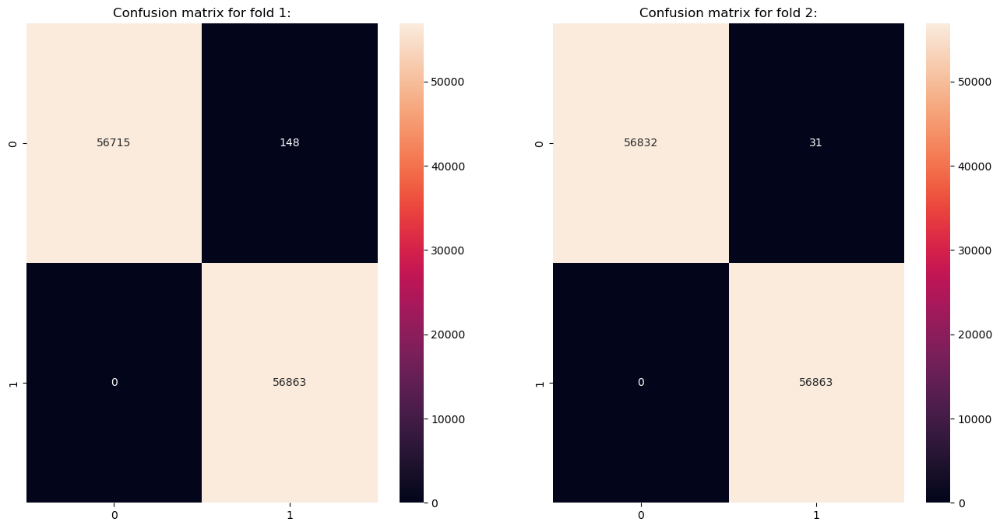

//////////////////////////////////////////////////////////////////////////////////


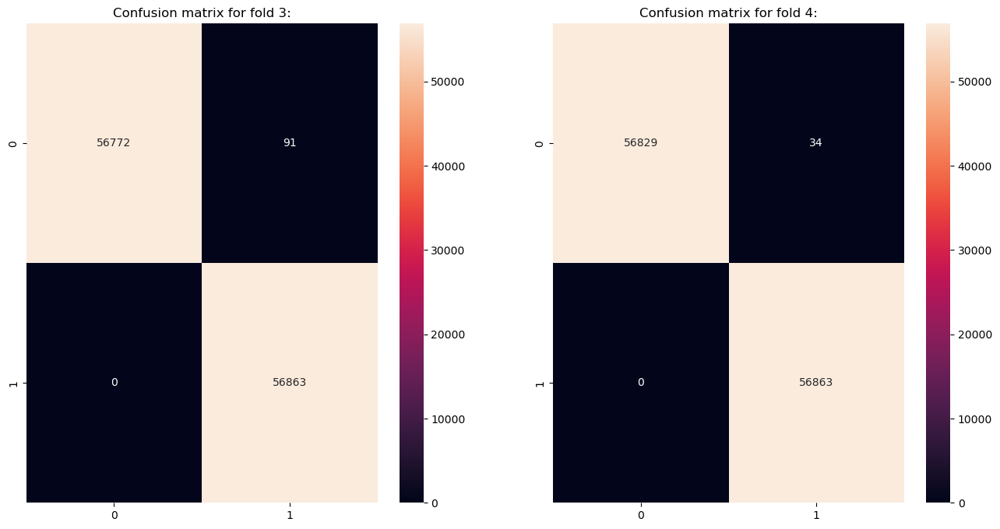

//////////////////////////////////////////////////////////////////////////////////


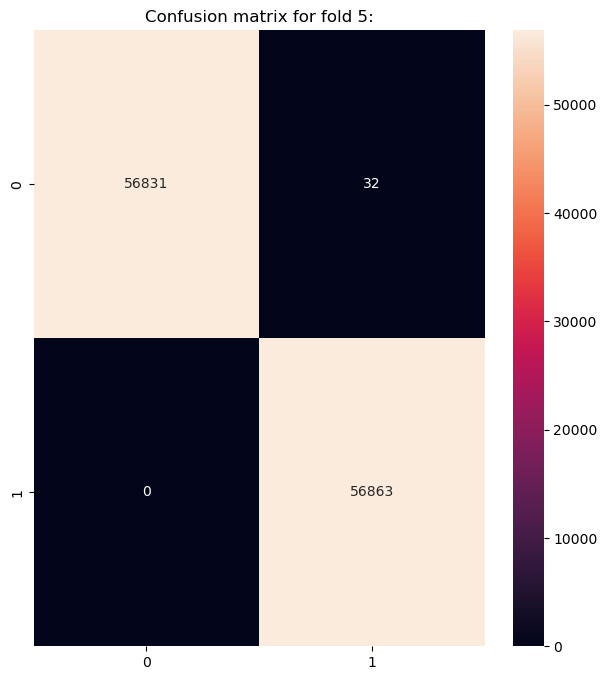

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


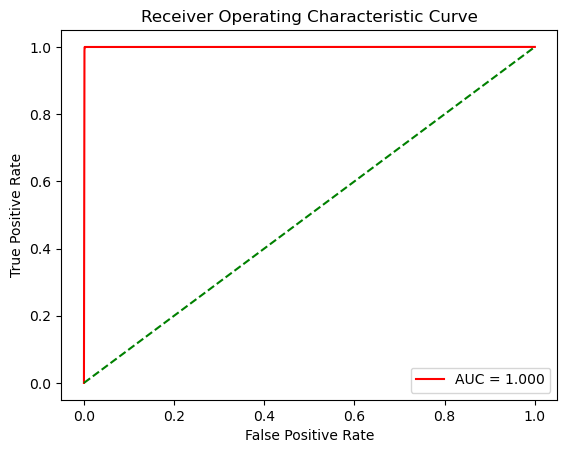

curve for fold 1:
AUC: 0.9995
//////////////////////////////////////////////////////////////////////////////////


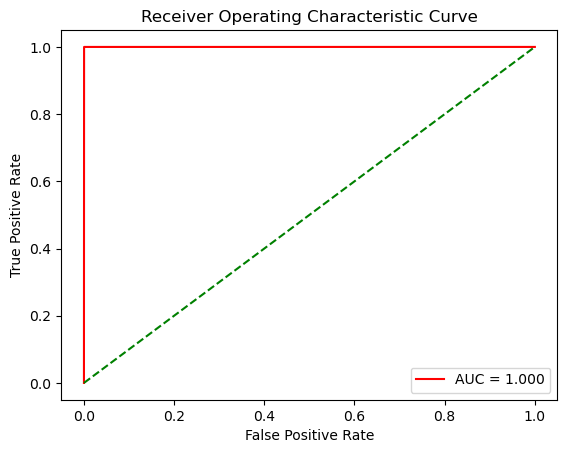

curve for fold 2:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


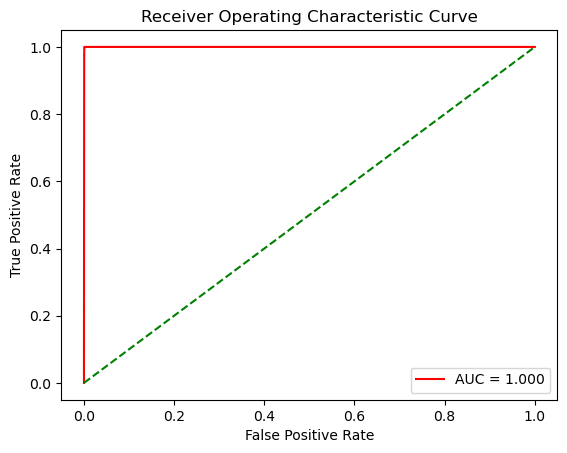

curve for fold 3:
AUC: 0.9998
//////////////////////////////////////////////////////////////////////////////////


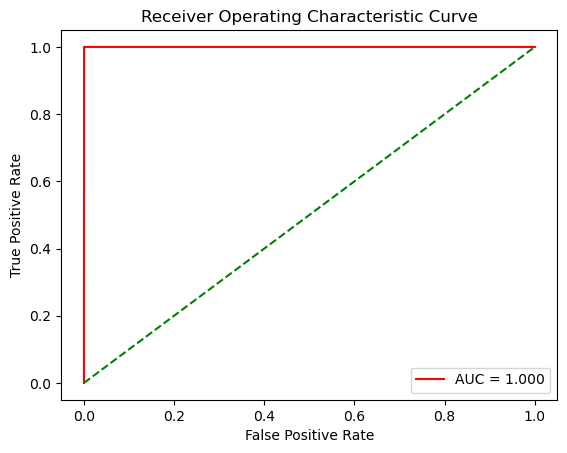

curve for fold 4:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


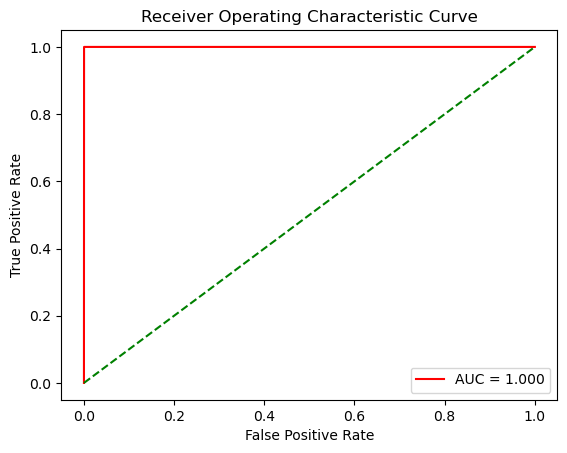

curve for fold 5:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


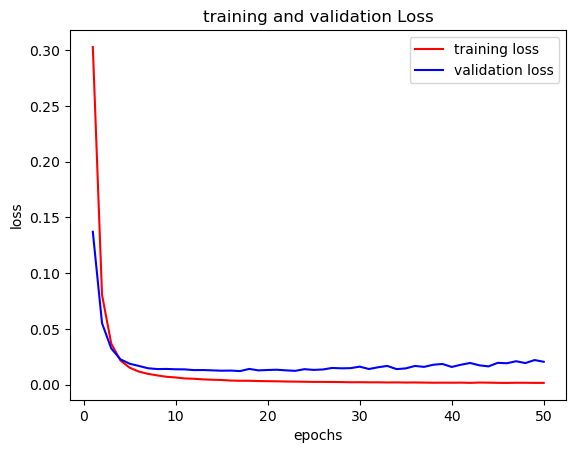

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


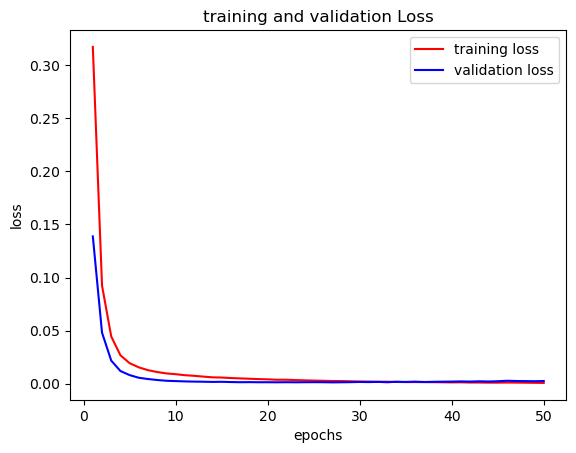

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


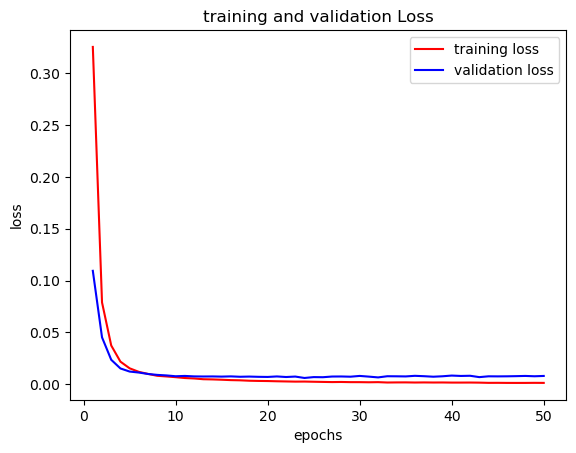

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


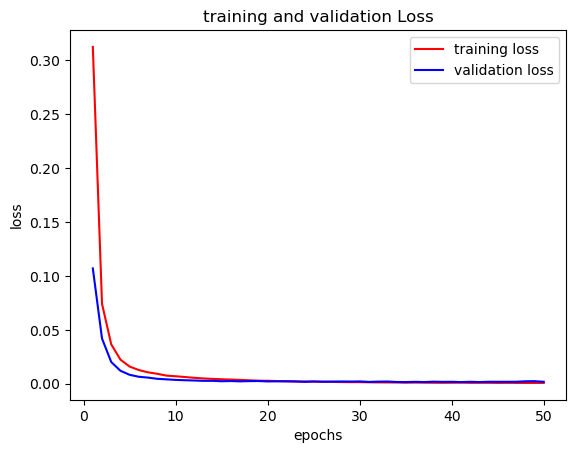

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


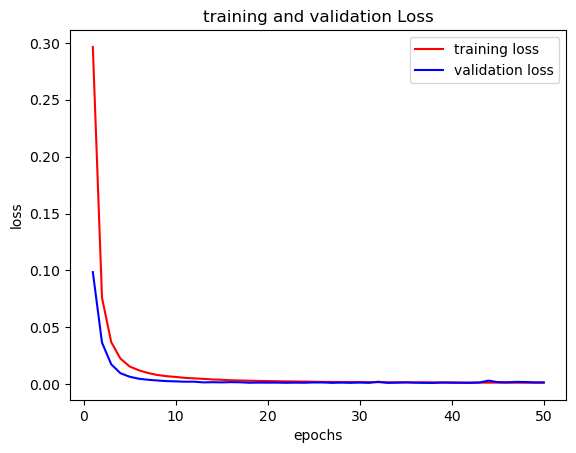

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [15]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(20, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(20, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.5)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 6s - loss: 0.6001 - accuracy: 0.6332 - val_loss: 0.4202 - val_accuracy: 0.9366 - 6s/epoch - 26ms/step
Epoch 2/50
228/228 - 2s - loss: 0.4779 - accuracy: 0.7614 - val_loss: 0.2800 - val_accuracy: 0.9579 - 2s/epoch - 10ms/step
Epoch 3/50
228/228 - 2s - loss: 0.4388 - accuracy: 0.7726 - val_loss: 0.2199 - val_accuracy: 0.9680 - 2s/epoch - 10ms/step
Epoch 4/50
228/228 - 2s - loss: 0.4225 - accuracy: 0.7794 - val_loss: 0.1849 - val_accuracy: 0.9743 - 2s/epoch - 10ms/step
Epoch 5/50
228/228 - 2s - loss: 0.4135 - accuracy: 0.7834 - val_loss: 0.1611 - val_accuracy: 0.9773 - 2s/epoch - 10ms/step
Epoch 6/50
228/228 - 2s - loss: 0.4061 - accuracy: 0.7873 - val_loss: 0.1427 - val_accuracy: 0.9800 - 2s/epoch - 10ms/step
Epoch 7/50
228/228 - 2s - loss: 0.4026 - accuracy: 0.7885 - val_loss: 0.1265 - val_accuracy: 0.9839 - 2s/epoch - 10ms/step
Epoch 8/50
228/228 - 2s - loss: 0.4001 - accuracy: 0.7892 - val_loss: 0.1123 - val_accuracy: 0.9862 - 2s/epoch - 11ms/step
Epoch 9/50
228/2

Epoch 13/50
228/228 - 3s - loss: 0.4020 - accuracy: 0.7423 - val_loss: 0.0492 - val_accuracy: 0.9965 - 3s/epoch - 11ms/step
Epoch 14/50
228/228 - 3s - loss: 0.4019 - accuracy: 0.7427 - val_loss: 0.0463 - val_accuracy: 0.9969 - 3s/epoch - 12ms/step
Epoch 15/50
228/228 - 3s - loss: 0.4011 - accuracy: 0.7423 - val_loss: 0.0430 - val_accuracy: 0.9973 - 3s/epoch - 11ms/step
Epoch 16/50
228/228 - 2s - loss: 0.4006 - accuracy: 0.7425 - val_loss: 0.0404 - val_accuracy: 0.9974 - 2s/epoch - 11ms/step
Epoch 17/50
228/228 - 2s - loss: 0.4006 - accuracy: 0.7422 - val_loss: 0.0386 - val_accuracy: 0.9975 - 2s/epoch - 11ms/step
Epoch 18/50
228/228 - 3s - loss: 0.4000 - accuracy: 0.7432 - val_loss: 0.0363 - val_accuracy: 0.9977 - 3s/epoch - 11ms/step
Epoch 19/50
228/228 - 2s - loss: 0.3999 - accuracy: 0.7432 - val_loss: 0.0362 - val_accuracy: 0.9978 - 2s/epoch - 11ms/step
Epoch 20/50
228/228 - 3s - loss: 0.3993 - accuracy: 0.7436 - val_loss: 0.0336 - val_accuracy: 0.9979 - 3s/epoch - 11ms/step
Epoch 21

Epoch 25/50
228/228 - 2s - loss: 0.3892 - accuracy: 0.7949 - val_loss: 0.0616 - val_accuracy: 0.9971 - 2s/epoch - 10ms/step
Epoch 26/50
228/228 - 3s - loss: 0.3896 - accuracy: 0.7944 - val_loss: 0.0648 - val_accuracy: 0.9972 - 3s/epoch - 11ms/step
Epoch 27/50
228/228 - 2s - loss: 0.3898 - accuracy: 0.7941 - val_loss: 0.0611 - val_accuracy: 0.9972 - 2s/epoch - 11ms/step
Epoch 28/50
228/228 - 2s - loss: 0.3901 - accuracy: 0.7939 - val_loss: 0.0604 - val_accuracy: 0.9973 - 2s/epoch - 10ms/step
Epoch 29/50
228/228 - 2s - loss: 0.3877 - accuracy: 0.7960 - val_loss: 0.0601 - val_accuracy: 0.9974 - 2s/epoch - 10ms/step
Epoch 30/50
228/228 - 2s - loss: 0.3895 - accuracy: 0.7941 - val_loss: 0.0584 - val_accuracy: 0.9973 - 2s/epoch - 10ms/step
Epoch 31/50
228/228 - 2s - loss: 0.3890 - accuracy: 0.7946 - val_loss: 0.0574 - val_accuracy: 0.9976 - 2s/epoch - 10ms/step
Epoch 32/50
228/228 - 3s - loss: 0.3888 - accuracy: 0.7947 - val_loss: 0.0567 - val_accuracy: 0.9975 - 3s/epoch - 11ms/step
Epoch 33

Epoch 37/50
228/228 - 2s - loss: 0.4405 - accuracy: 0.7433 - val_loss: 0.0603 - val_accuracy: 0.9985 - 2s/epoch - 10ms/step
Epoch 38/50
228/228 - 2s - loss: 0.4397 - accuracy: 0.7437 - val_loss: 0.0577 - val_accuracy: 0.9985 - 2s/epoch - 10ms/step
Epoch 39/50
228/228 - 2s - loss: 0.4398 - accuracy: 0.7441 - val_loss: 0.0591 - val_accuracy: 0.9985 - 2s/epoch - 10ms/step
Epoch 40/50
228/228 - 2s - loss: 0.4407 - accuracy: 0.7431 - val_loss: 0.0600 - val_accuracy: 0.9986 - 2s/epoch - 10ms/step
Epoch 41/50
228/228 - 2s - loss: 0.4403 - accuracy: 0.7431 - val_loss: 0.0570 - val_accuracy: 0.9985 - 2s/epoch - 11ms/step
Epoch 42/50
228/228 - 3s - loss: 0.4398 - accuracy: 0.7441 - val_loss: 0.0546 - val_accuracy: 0.9985 - 3s/epoch - 11ms/step
Epoch 43/50
228/228 - 2s - loss: 0.4399 - accuracy: 0.7436 - val_loss: 0.0578 - val_accuracy: 0.9986 - 2s/epoch - 10ms/step
Epoch 44/50
228/228 - 2s - loss: 0.4405 - accuracy: 0.7435 - val_loss: 0.0613 - val_accuracy: 0.9987 - 2s/epoch - 10ms/step
Epoch 45

Epoch 49/50
228/228 - 2s - loss: 0.3972 - accuracy: 0.7436 - val_loss: 0.0183 - val_accuracy: 0.9989 - 2s/epoch - 9ms/step
Epoch 50/50
228/228 - 2s - loss: 0.3968 - accuracy: 0.7440 - val_loss: 0.0193 - val_accuracy: 0.9991 - 2s/epoch - 10ms/step
3554/3554 [==============================] - 7s 2ms/step
first fold
mcc for fold 5: 0.9981
accuracy for fold 5: 0.9991
precision for fold 5: 0.9981
recall for fold 5: 1.0000
bcr for fold 5: 0.9991
3554/3554 [==============================] - 6s 2ms/step
Training Accuracy: 0.9995713381284842
Testing Accuracy: 0.9990679352127042
Training Accuracy: 0.9991434106313722
Testing Accuracy: 0.9981393389387211
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.998478799922621
precision: 0.9970006721193718
recall: 0.9999683449694882
bcr: 0.998478799922621
mcc: 0.9969632801768901

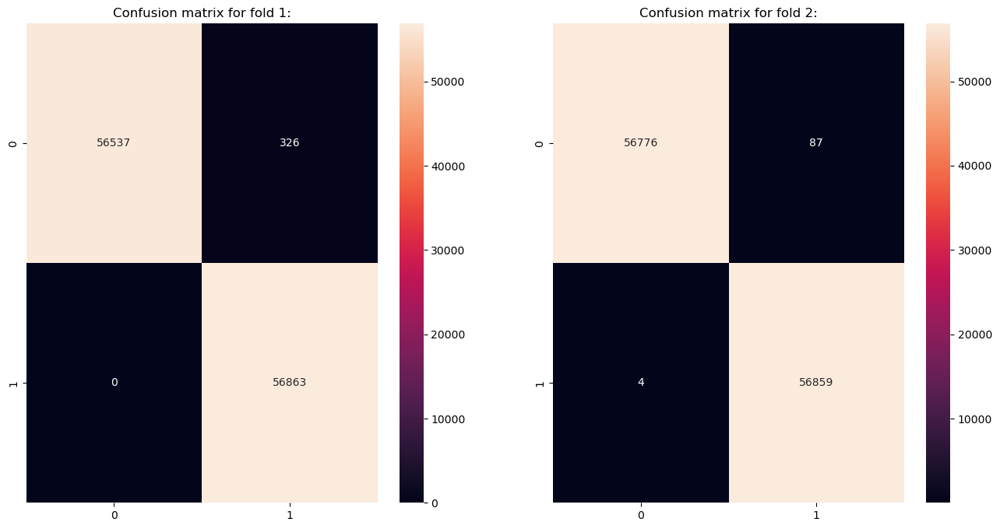

//////////////////////////////////////////////////////////////////////////////////


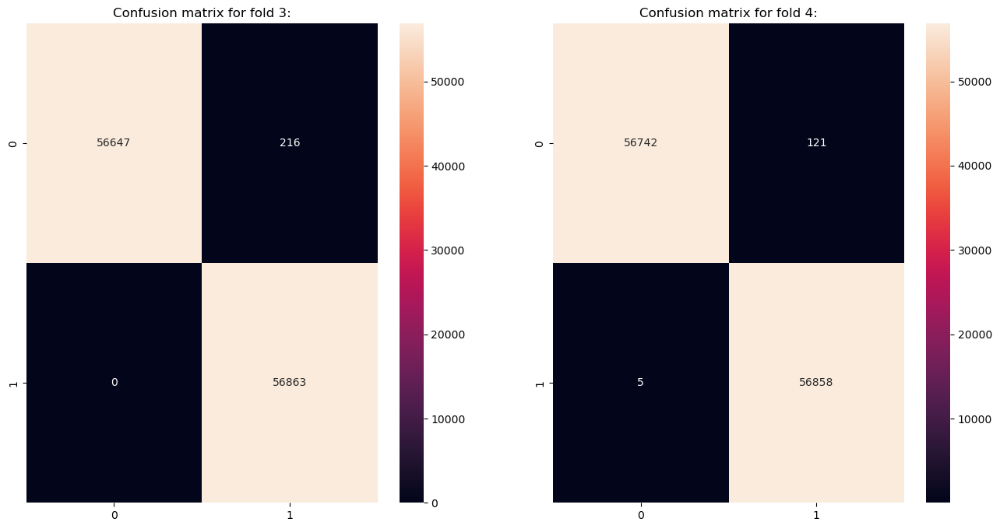

//////////////////////////////////////////////////////////////////////////////////


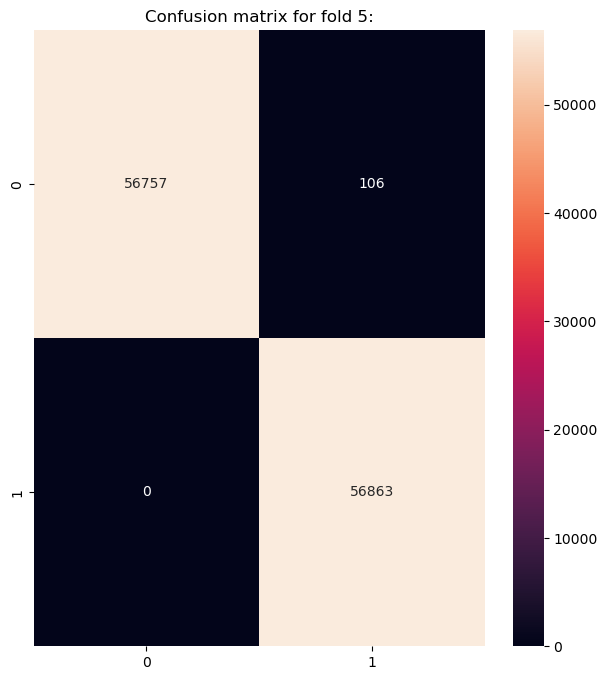

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


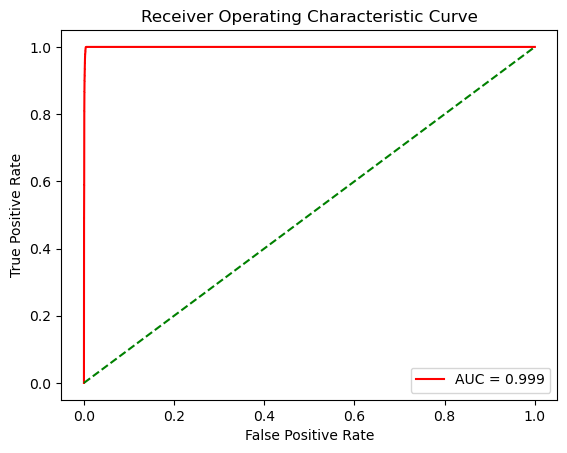

curve for fold 1:
AUC: 0.9994
//////////////////////////////////////////////////////////////////////////////////


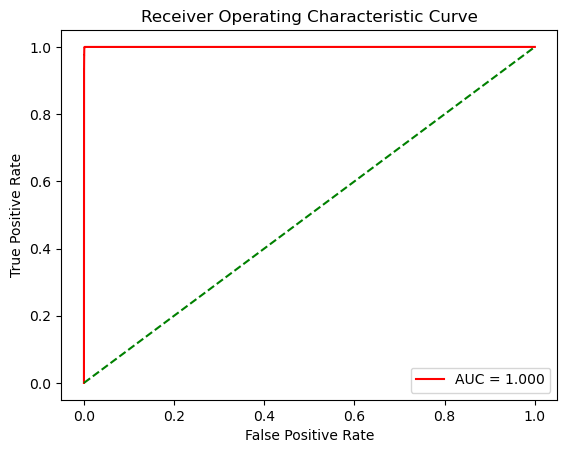

curve for fold 2:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


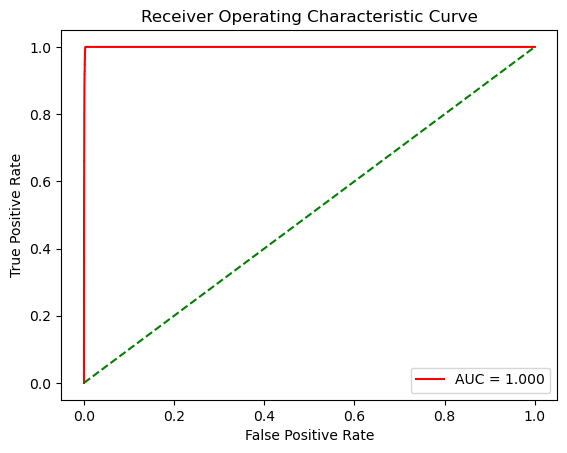

curve for fold 3:
AUC: 0.9995
//////////////////////////////////////////////////////////////////////////////////


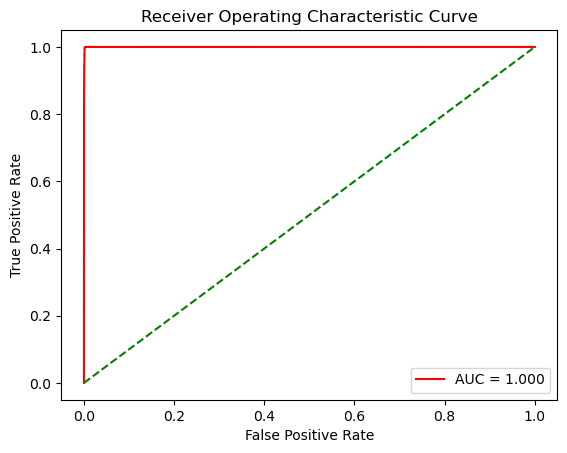

curve for fold 4:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


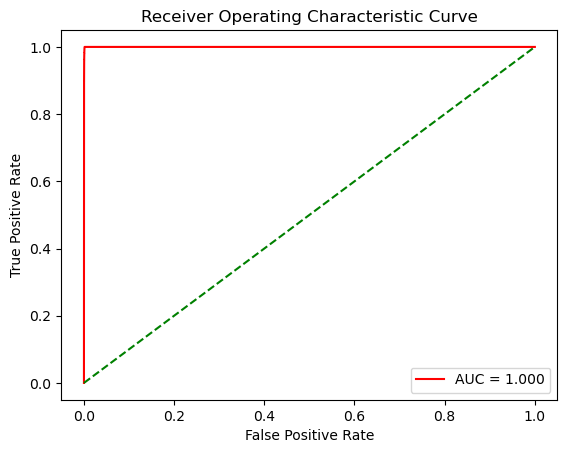

curve for fold 5:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


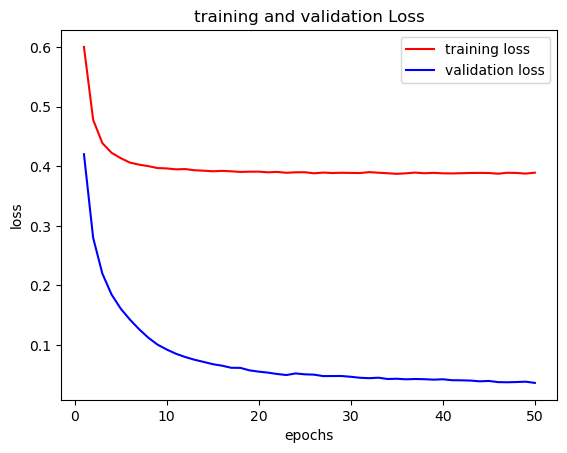

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


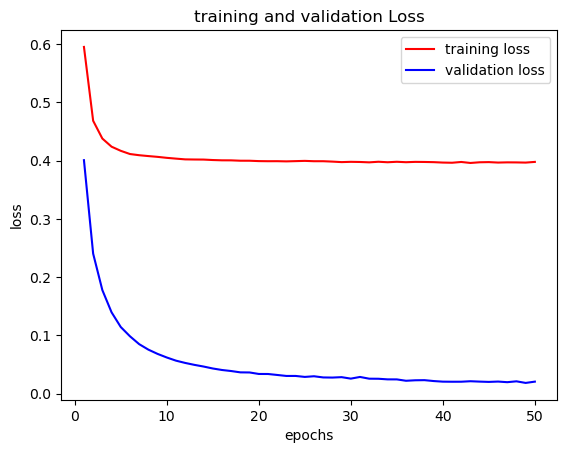

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


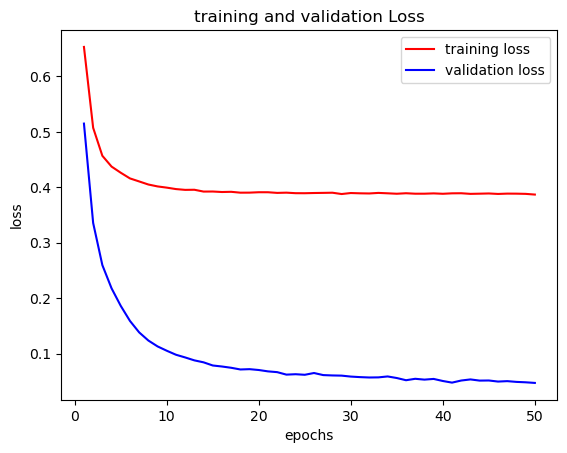

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


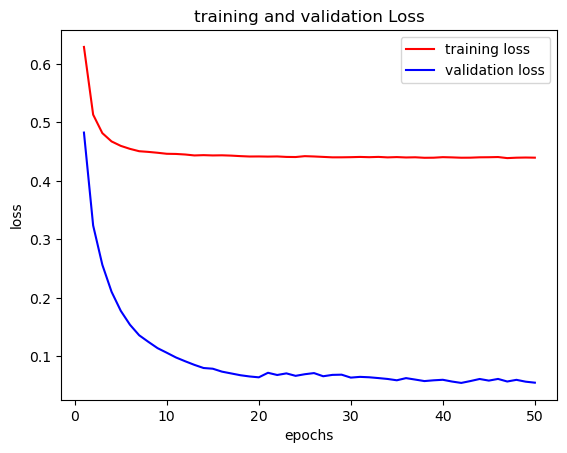

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


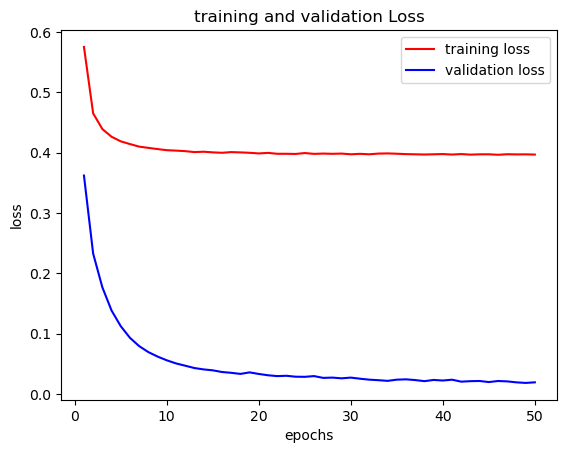

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [16]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.8)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 8s - loss: 0.4954 - accuracy: 0.7735 - val_loss: 0.3103 - val_accuracy: 0.9356 - 8s/epoch - 34ms/step
Epoch 2/50
228/228 - 2s - loss: 0.3358 - accuracy: 0.8474 - val_loss: 0.1919 - val_accuracy: 0.9487 - 2s/epoch - 10ms/step
Epoch 3/50
228/228 - 2s - loss: 0.2789 - accuracy: 0.8604 - val_loss: 0.1393 - val_accuracy: 0.9618 - 2s/epoch - 10ms/step
Epoch 4/50
228/228 - 2s - loss: 0.2555 - accuracy: 0.8675 - val_loss: 0.1086 - val_accuracy: 0.9717 - 2s/epoch - 10ms/step
Epoch 5/50
228/228 - 2s - loss: 0.2401 - accuracy: 0.8733 - val_loss: 0.0885 - val_accuracy: 0.9775 - 2s/epoch - 10ms/step
Epoch 6/50
228/228 - 2s - loss: 0.2306 - accuracy: 0.8776 - val_loss: 0.0754 - val_accuracy: 0.9806 - 2s/epoch - 10ms/step
Epoch 7/50
228/228 - 3s - loss: 0.2254 - accuracy: 0.8788 - val_loss: 0.0659 - val_accuracy: 0.9837 - 3s/epoch - 11ms/step
Epoch 8/50
228/228 - 2s - loss: 0.2197 - accuracy: 0.8816 - val_loss: 0.0581 - val_accuracy: 0.9857 - 2s/epoch - 11ms/step
Epoch 9/50
228/2

Epoch 13/50
228/228 - 2s - loss: 0.2067 - accuracy: 0.8874 - val_loss: 0.0252 - val_accuracy: 0.9955 - 2s/epoch - 10ms/step
Epoch 14/50
228/228 - 2s - loss: 0.2047 - accuracy: 0.8882 - val_loss: 0.0223 - val_accuracy: 0.9958 - 2s/epoch - 10ms/step
Epoch 15/50
228/228 - 2s - loss: 0.2046 - accuracy: 0.8879 - val_loss: 0.0200 - val_accuracy: 0.9964 - 2s/epoch - 11ms/step
Epoch 16/50
228/228 - 2s - loss: 0.2032 - accuracy: 0.8884 - val_loss: 0.0183 - val_accuracy: 0.9966 - 2s/epoch - 11ms/step
Epoch 17/50
228/228 - 2s - loss: 0.2025 - accuracy: 0.8888 - val_loss: 0.0171 - val_accuracy: 0.9966 - 2s/epoch - 10ms/step
Epoch 18/50
228/228 - 2s - loss: 0.2004 - accuracy: 0.8903 - val_loss: 0.0154 - val_accuracy: 0.9968 - 2s/epoch - 10ms/step
Epoch 19/50
228/228 - 3s - loss: 0.2005 - accuracy: 0.8895 - val_loss: 0.0144 - val_accuracy: 0.9970 - 3s/epoch - 11ms/step
Epoch 20/50
228/228 - 2s - loss: 0.1999 - accuracy: 0.8899 - val_loss: 0.0134 - val_accuracy: 0.9972 - 2s/epoch - 10ms/step
Epoch 21

Epoch 25/50
228/228 - 3s - loss: 0.1964 - accuracy: 0.8904 - val_loss: 0.0113 - val_accuracy: 0.9980 - 3s/epoch - 14ms/step
Epoch 26/50
228/228 - 3s - loss: 0.1942 - accuracy: 0.8919 - val_loss: 0.0111 - val_accuracy: 0.9979 - 3s/epoch - 14ms/step
Epoch 27/50
228/228 - 3s - loss: 0.1957 - accuracy: 0.8912 - val_loss: 0.0109 - val_accuracy: 0.9979 - 3s/epoch - 12ms/step
Epoch 28/50
228/228 - 4s - loss: 0.1942 - accuracy: 0.8919 - val_loss: 0.0107 - val_accuracy: 0.9979 - 4s/epoch - 19ms/step
Epoch 29/50
228/228 - 5s - loss: 0.1954 - accuracy: 0.8907 - val_loss: 0.0104 - val_accuracy: 0.9980 - 5s/epoch - 20ms/step
Epoch 30/50
228/228 - 4s - loss: 0.1949 - accuracy: 0.8910 - val_loss: 0.0101 - val_accuracy: 0.9979 - 4s/epoch - 18ms/step
Epoch 31/50
228/228 - 4s - loss: 0.1952 - accuracy: 0.8911 - val_loss: 0.0102 - val_accuracy: 0.9979 - 4s/epoch - 18ms/step
Epoch 32/50
228/228 - 5s - loss: 0.1944 - accuracy: 0.8911 - val_loss: 0.0097 - val_accuracy: 0.9981 - 5s/epoch - 20ms/step
Epoch 33

Epoch 37/50
228/228 - 3s - loss: 0.1950 - accuracy: 0.8907 - val_loss: 0.0082 - val_accuracy: 0.9984 - 3s/epoch - 13ms/step
Epoch 38/50
228/228 - 3s - loss: 0.1948 - accuracy: 0.8909 - val_loss: 0.0079 - val_accuracy: 0.9985 - 3s/epoch - 12ms/step
Epoch 39/50
228/228 - 4s - loss: 0.1932 - accuracy: 0.8922 - val_loss: 0.0079 - val_accuracy: 0.9985 - 4s/epoch - 19ms/step
Epoch 40/50
228/228 - 4s - loss: 0.1938 - accuracy: 0.8912 - val_loss: 0.0074 - val_accuracy: 0.9985 - 4s/epoch - 18ms/step
Epoch 41/50
228/228 - 3s - loss: 0.1942 - accuracy: 0.8910 - val_loss: 0.0074 - val_accuracy: 0.9986 - 3s/epoch - 15ms/step
Epoch 42/50
228/228 - 3s - loss: 0.1933 - accuracy: 0.8917 - val_loss: 0.0075 - val_accuracy: 0.9985 - 3s/epoch - 12ms/step
Epoch 43/50
228/228 - 3s - loss: 0.1933 - accuracy: 0.8919 - val_loss: 0.0073 - val_accuracy: 0.9985 - 3s/epoch - 12ms/step
Epoch 44/50
228/228 - 4s - loss: 0.1943 - accuracy: 0.8908 - val_loss: 0.0071 - val_accuracy: 0.9985 - 4s/epoch - 16ms/step
Epoch 45

Epoch 49/50
228/228 - 3s - loss: 0.1936 - accuracy: 0.8912 - val_loss: 0.0051 - val_accuracy: 0.9988 - 3s/epoch - 12ms/step
Epoch 50/50
228/228 - 4s - loss: 0.1934 - accuracy: 0.8916 - val_loss: 0.0050 - val_accuracy: 0.9988 - 4s/epoch - 17ms/step
3554/3554 [==============================] - 15s 4ms/step
first fold
mcc for fold 5: 0.9977
accuracy for fold 5: 0.9988
precision for fold 5: 0.9977
recall for fold 5: 1.0000
bcr for fold 5: 0.9988
3554/3554 [==============================] - 12s 3ms/step
Training Accuracy: 0.9995515537344143
Testing Accuracy: 0.9988393155478958
Training Accuracy: 0.9991039111642127
Testing Accuracy: 0.9976840073690675
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9983345936725112
precision: 0.9966961668805883
recall: 0.9999859310975502
bcr: 0.9983345936725112
mcc: 0.99667561297

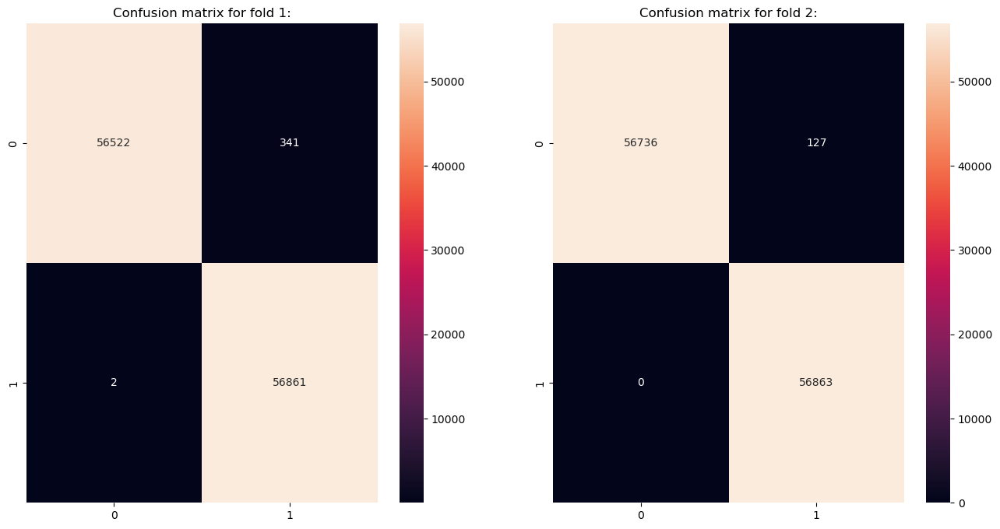

//////////////////////////////////////////////////////////////////////////////////


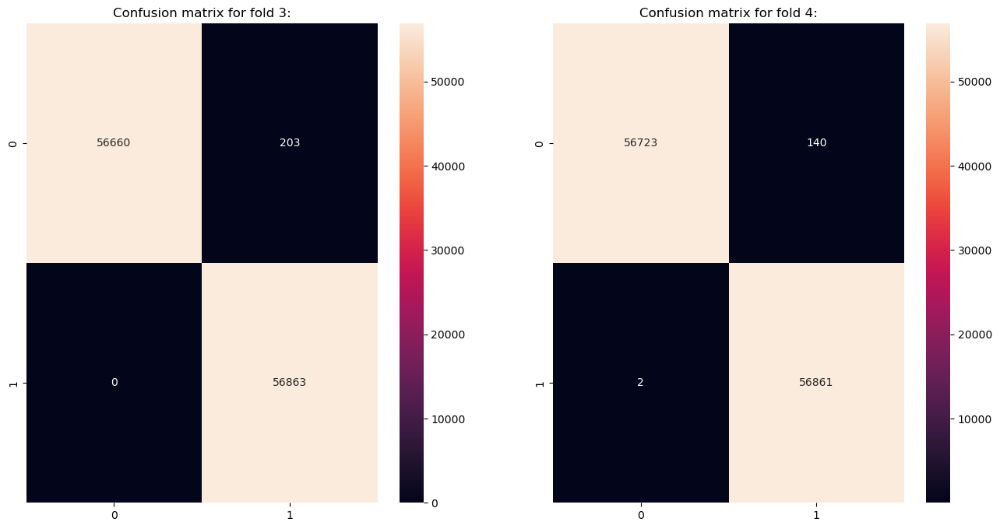

//////////////////////////////////////////////////////////////////////////////////


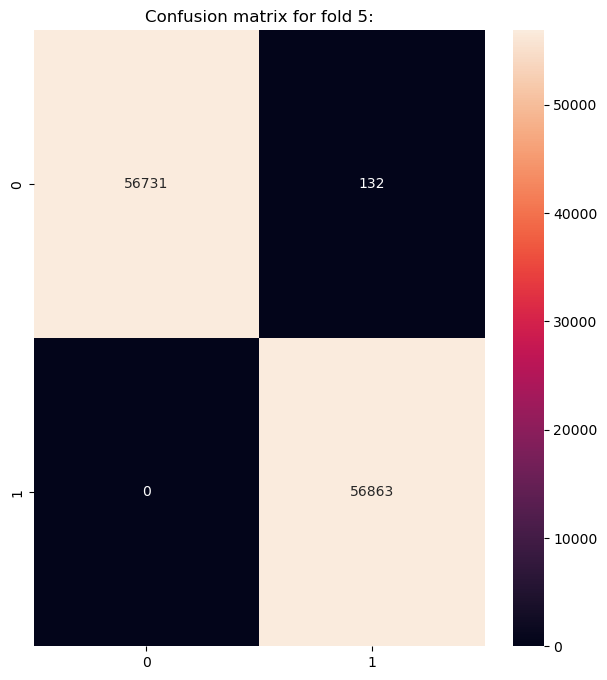

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


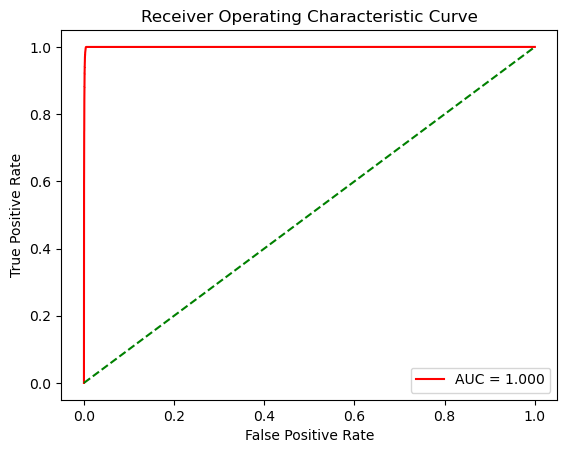

curve for fold 1:
AUC: 0.9996
//////////////////////////////////////////////////////////////////////////////////


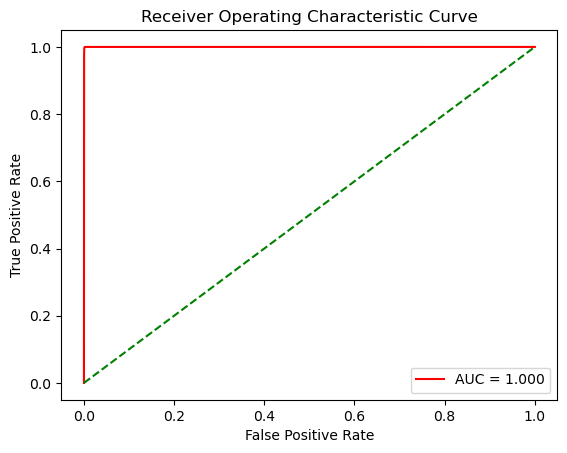

curve for fold 2:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


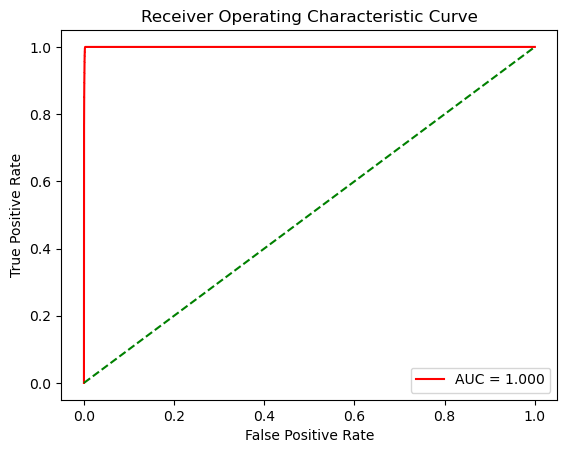

curve for fold 3:
AUC: 0.9997
//////////////////////////////////////////////////////////////////////////////////


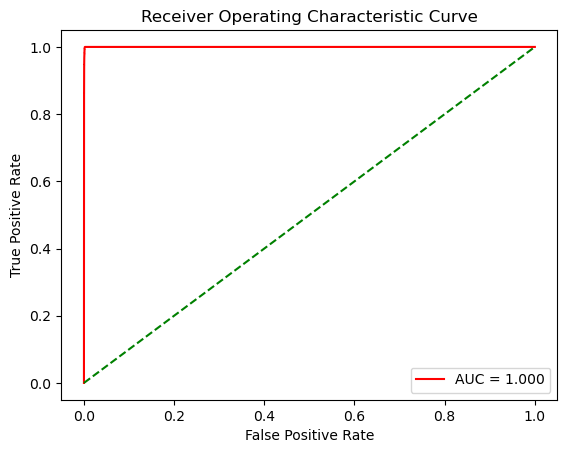

curve for fold 4:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


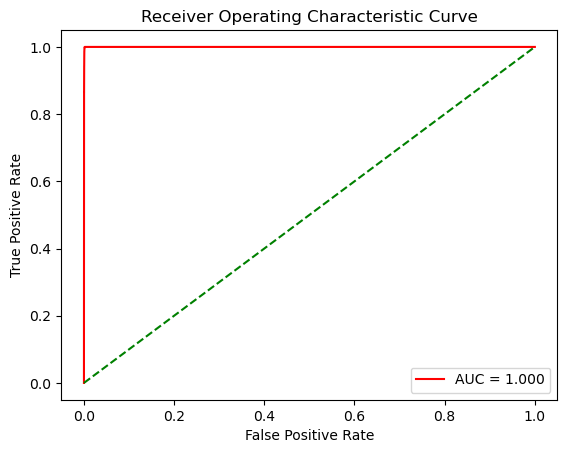

curve for fold 5:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


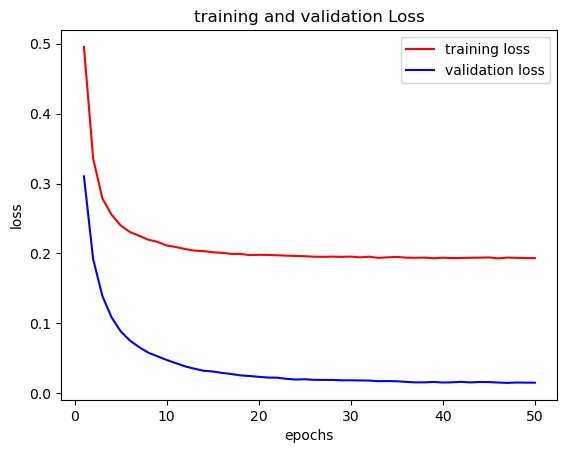

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


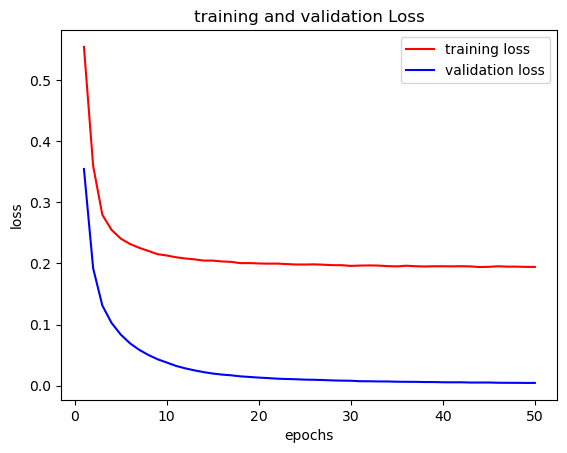

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


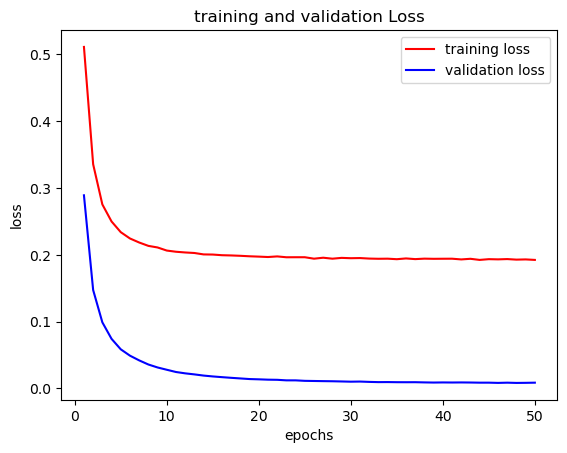

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


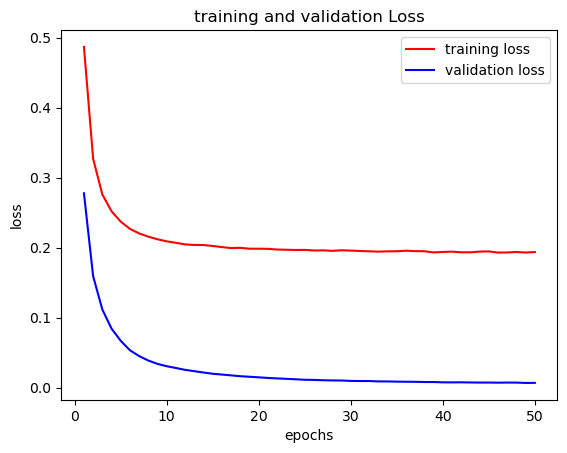

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


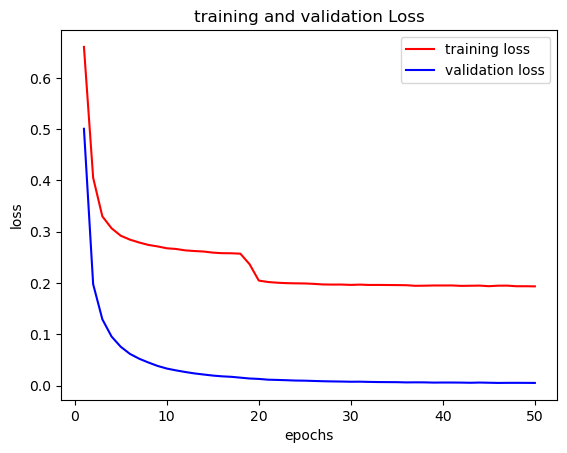

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [17]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 11s - loss: 0.5153 - accuracy: 0.7397 - val_loss: 0.2679 - val_accuracy: 0.9467 - 11s/epoch - 47ms/step
Epoch 2/50
228/228 - 4s - loss: 0.2865 - accuracy: 0.8775 - val_loss: 0.1155 - val_accuracy: 0.9698 - 4s/epoch - 17ms/step
Epoch 3/50
228/228 - 4s - loss: 0.2220 - accuracy: 0.8974 - val_loss: 0.0701 - val_accuracy: 0.9821 - 4s/epoch - 17ms/step
Epoch 4/50
228/228 - 3s - loss: 0.1978 - accuracy: 0.9052 - val_loss: 0.0469 - val_accuracy: 0.9882 - 3s/epoch - 14ms/step
Epoch 5/50
228/228 - 3s - loss: 0.1855 - accuracy: 0.9097 - val_loss: 0.0355 - val_accuracy: 0.9920 - 3s/epoch - 12ms/step
Epoch 6/50
228/228 - 3s - loss: 0.1792 - accuracy: 0.9118 - val_loss: 0.0287 - val_accuracy: 0.9935 - 3s/epoch - 13ms/step
Epoch 7/50
228/228 - 4s - loss: 0.1752 - accuracy: 0.9128 - val_loss: 0.0246 - val_accuracy: 0.9946 - 4s/epoch - 18ms/step
Epoch 8/50
228/228 - 4s - loss: 0.1730 - accuracy: 0.9137 - val_loss: 0.0218 - val_accuracy: 0.9951 - 4s/epoch - 18ms/step
Epoch 9/50
228

Epoch 13/50
228/228 - 5s - loss: 0.2471 - accuracy: 0.8253 - val_loss: 0.0154 - val_accuracy: 0.9978 - 5s/epoch - 20ms/step
Epoch 14/50
228/228 - 5s - loss: 0.2455 - accuracy: 0.8263 - val_loss: 0.0141 - val_accuracy: 0.9979 - 5s/epoch - 23ms/step
Epoch 15/50
228/228 - 4s - loss: 0.2455 - accuracy: 0.8266 - val_loss: 0.0130 - val_accuracy: 0.9980 - 4s/epoch - 16ms/step
Epoch 16/50
228/228 - 3s - loss: 0.2449 - accuracy: 0.8262 - val_loss: 0.0122 - val_accuracy: 0.9983 - 3s/epoch - 15ms/step
Epoch 17/50
228/228 - 5s - loss: 0.2436 - accuracy: 0.8279 - val_loss: 0.0109 - val_accuracy: 0.9985 - 5s/epoch - 22ms/step
Epoch 18/50
228/228 - 5s - loss: 0.2429 - accuracy: 0.8279 - val_loss: 0.0103 - val_accuracy: 0.9985 - 5s/epoch - 23ms/step
Epoch 19/50
228/228 - 3s - loss: 0.2430 - accuracy: 0.8271 - val_loss: 0.0095 - val_accuracy: 0.9985 - 3s/epoch - 15ms/step
Epoch 20/50
228/228 - 4s - loss: 0.2431 - accuracy: 0.8264 - val_loss: 0.0089 - val_accuracy: 0.9986 - 4s/epoch - 19ms/step
Epoch 21

Epoch 25/50
228/228 - 4s - loss: 0.1663 - accuracy: 0.9151 - val_loss: 0.0103 - val_accuracy: 0.9979 - 4s/epoch - 20ms/step
Epoch 26/50
228/228 - 4s - loss: 0.1650 - accuracy: 0.9158 - val_loss: 0.0095 - val_accuracy: 0.9980 - 4s/epoch - 15ms/step
Epoch 27/50
228/228 - 5s - loss: 0.1661 - accuracy: 0.9151 - val_loss: 0.0092 - val_accuracy: 0.9981 - 5s/epoch - 21ms/step
Epoch 28/50
228/228 - 5s - loss: 0.1659 - accuracy: 0.9151 - val_loss: 0.0095 - val_accuracy: 0.9981 - 5s/epoch - 21ms/step
Epoch 29/50
228/228 - 4s - loss: 0.1656 - accuracy: 0.9150 - val_loss: 0.0090 - val_accuracy: 0.9982 - 4s/epoch - 19ms/step
Epoch 30/50
228/228 - 4s - loss: 0.1648 - accuracy: 0.9157 - val_loss: 0.0104 - val_accuracy: 0.9980 - 4s/epoch - 18ms/step
Epoch 31/50
228/228 - 5s - loss: 0.1653 - accuracy: 0.9152 - val_loss: 0.0093 - val_accuracy: 0.9982 - 5s/epoch - 22ms/step
Epoch 32/50
228/228 - 4s - loss: 0.1635 - accuracy: 0.9165 - val_loss: 0.0094 - val_accuracy: 0.9982 - 4s/epoch - 20ms/step
Epoch 33

Epoch 37/50
228/228 - 5s - loss: 0.1684 - accuracy: 0.8795 - val_loss: 0.0035 - val_accuracy: 0.9992 - 5s/epoch - 21ms/step
Epoch 38/50
228/228 - 5s - loss: 0.1685 - accuracy: 0.8797 - val_loss: 0.0035 - val_accuracy: 0.9992 - 5s/epoch - 21ms/step
Epoch 39/50
228/228 - 5s - loss: 0.1682 - accuracy: 0.8793 - val_loss: 0.0035 - val_accuracy: 0.9991 - 5s/epoch - 21ms/step
Epoch 40/50
228/228 - 5s - loss: 0.1681 - accuracy: 0.8801 - val_loss: 0.0035 - val_accuracy: 0.9992 - 5s/epoch - 20ms/step
Epoch 41/50
228/228 - 5s - loss: 0.1687 - accuracy: 0.8799 - val_loss: 0.0035 - val_accuracy: 0.9992 - 5s/epoch - 20ms/step
Epoch 42/50
228/228 - 5s - loss: 0.1673 - accuracy: 0.8798 - val_loss: 0.0036 - val_accuracy: 0.9991 - 5s/epoch - 21ms/step
Epoch 43/50
228/228 - 3s - loss: 0.1680 - accuracy: 0.8793 - val_loss: 0.0034 - val_accuracy: 0.9992 - 3s/epoch - 13ms/step
Epoch 44/50
228/228 - 4s - loss: 0.1687 - accuracy: 0.8783 - val_loss: 0.0033 - val_accuracy: 0.9993 - 4s/epoch - 16ms/step
Epoch 45

Epoch 49/50
228/228 - 5s - loss: 0.1640 - accuracy: 0.9154 - val_loss: 0.0051 - val_accuracy: 0.9990 - 5s/epoch - 20ms/step
Epoch 50/50
228/228 - 5s - loss: 0.1622 - accuracy: 0.9162 - val_loss: 0.0045 - val_accuracy: 0.9991 - 5s/epoch - 20ms/step
3554/3554 [==============================] - 12s 3ms/step
first fold
mcc for fold 5: 0.9982
accuracy for fold 5: 0.9991
precision for fold 5: 0.9982
recall for fold 5: 1.0000
bcr for fold 5: 0.9991
3554/3554 [==============================] - 12s 3ms/step
Training Accuracy: 0.9998505179114714
Testing Accuracy: 0.9991206935968908
Training Accuracy: 0.9997011251758087
Testing Accuracy: 0.9982444744834366
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9988709705784077
precision: 0.9977617918676744
recall: 0.9999859310975502
bcr: 0.9988709705784077
mcc: 0.99774481170

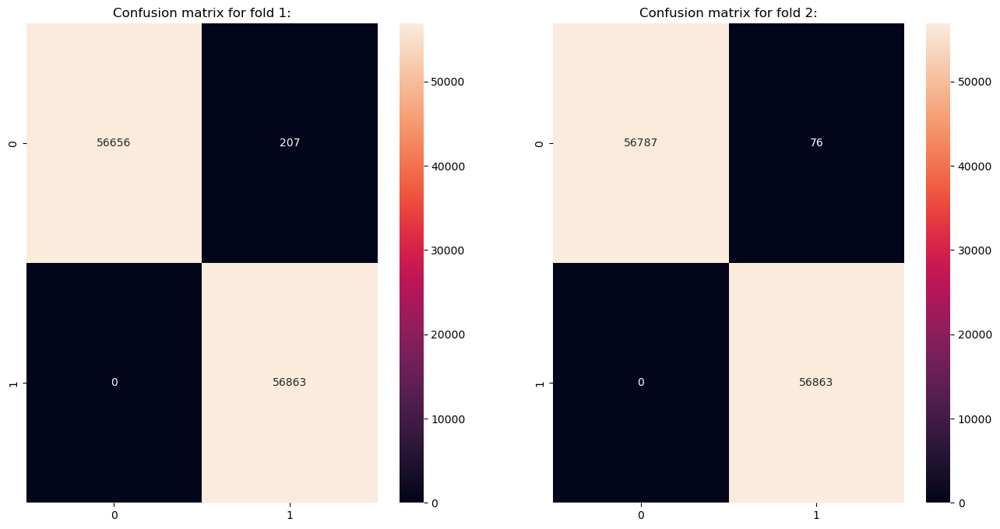

//////////////////////////////////////////////////////////////////////////////////


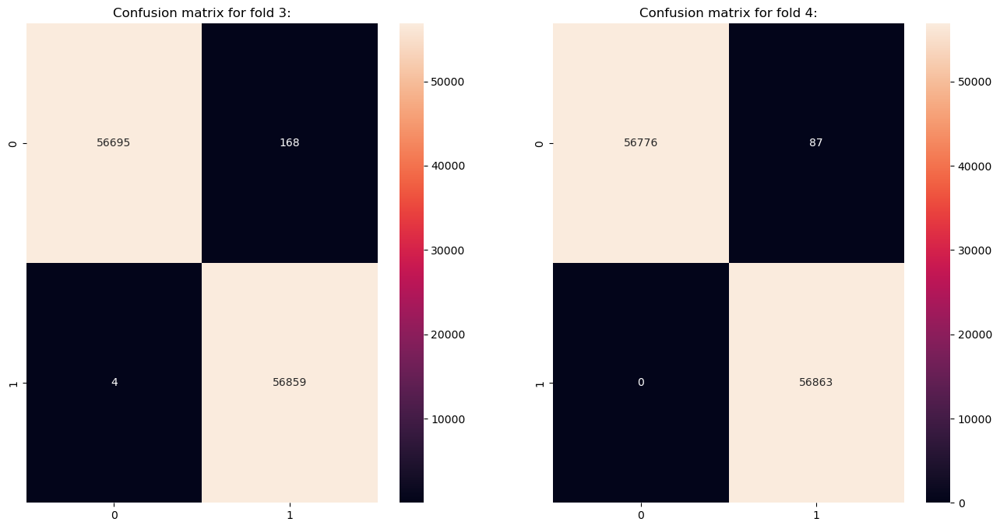

//////////////////////////////////////////////////////////////////////////////////


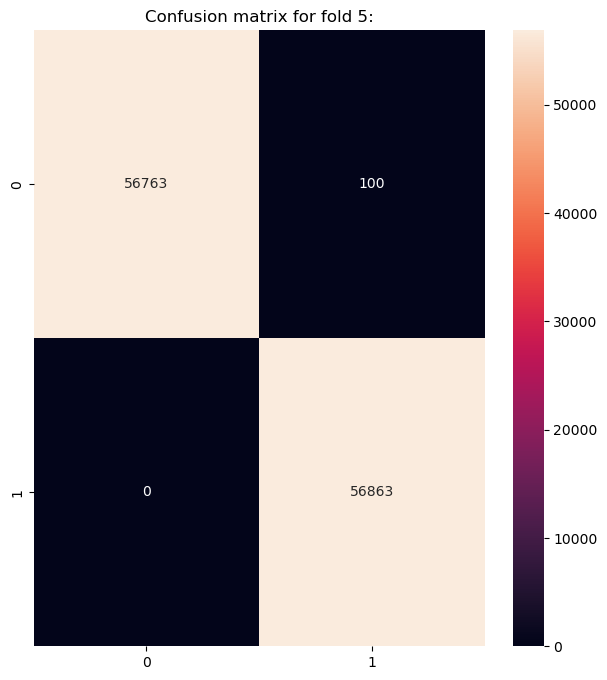

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


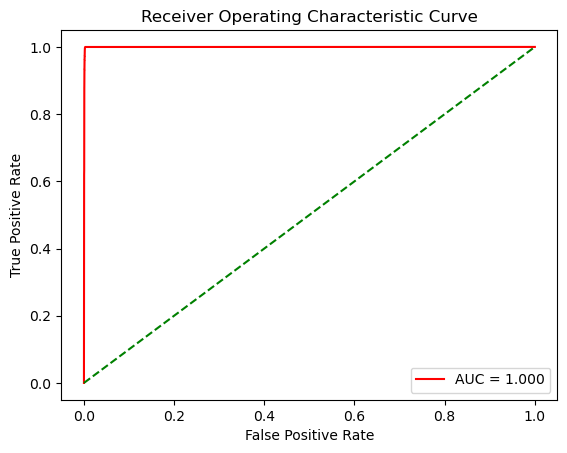

curve for fold 1:
AUC: 0.9996
//////////////////////////////////////////////////////////////////////////////////


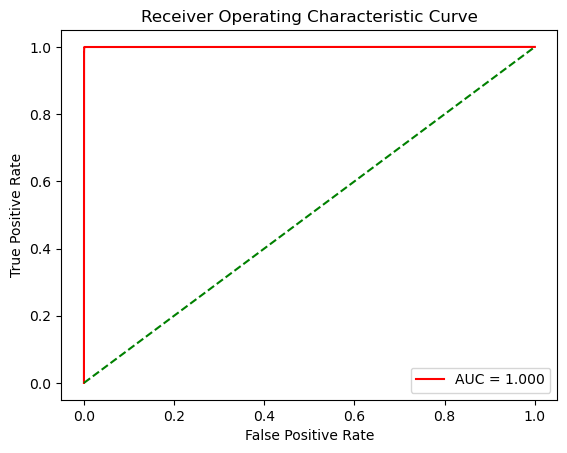

curve for fold 2:
AUC: 1.0000
//////////////////////////////////////////////////////////////////////////////////


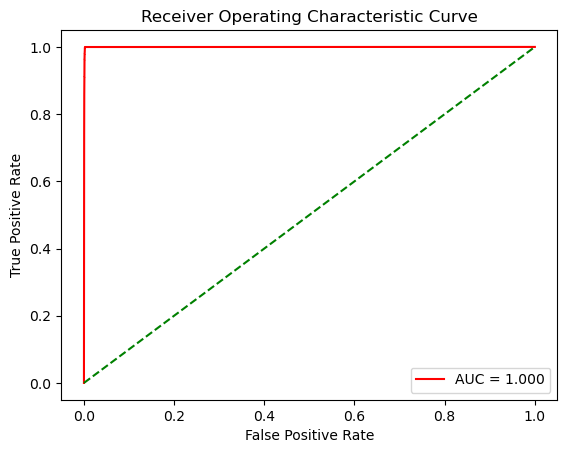

curve for fold 3:
AUC: 0.9996
//////////////////////////////////////////////////////////////////////////////////


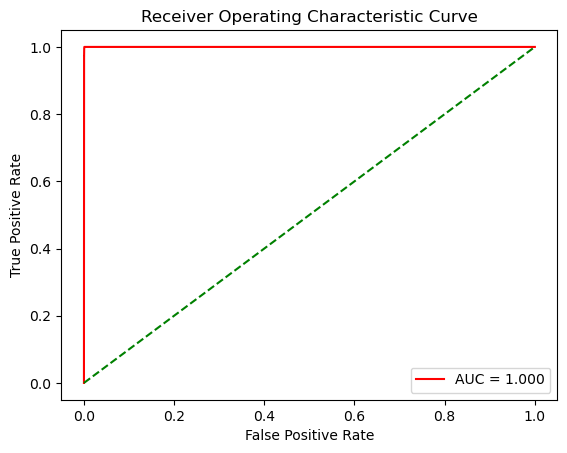

curve for fold 4:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


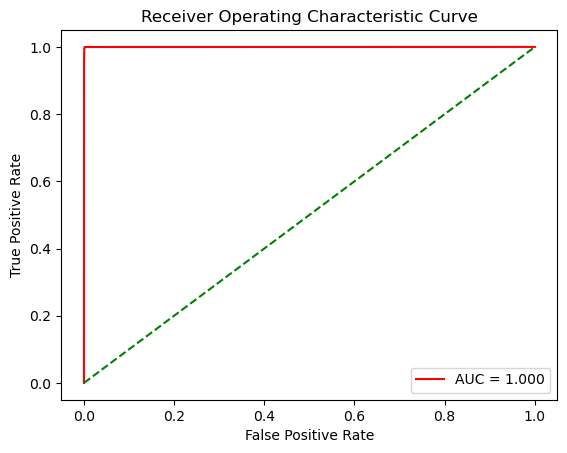

curve for fold 5:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


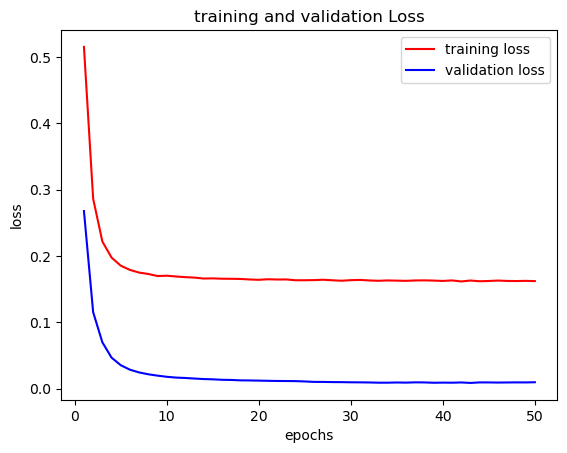

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


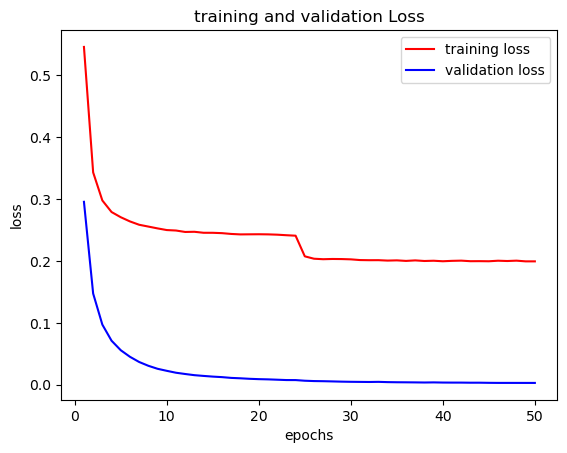

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


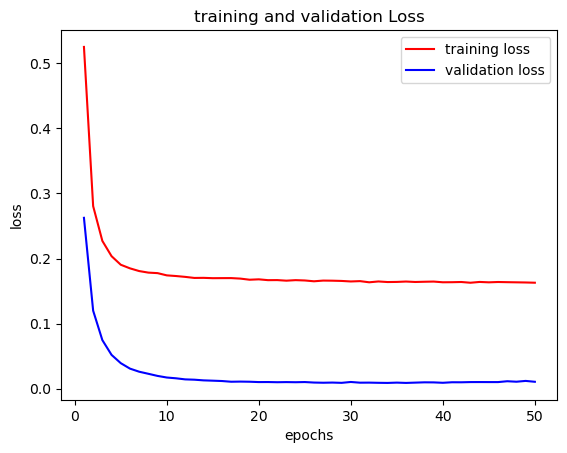

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


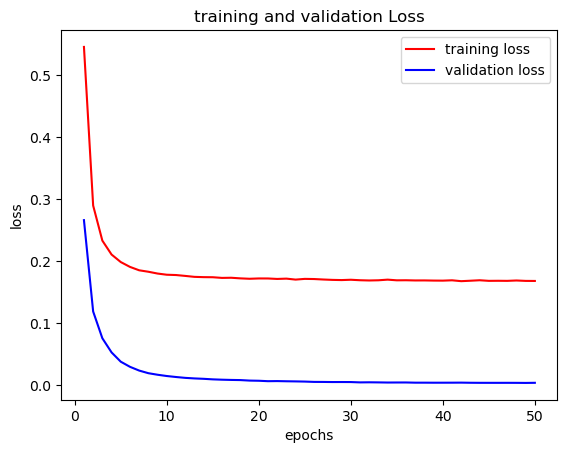

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


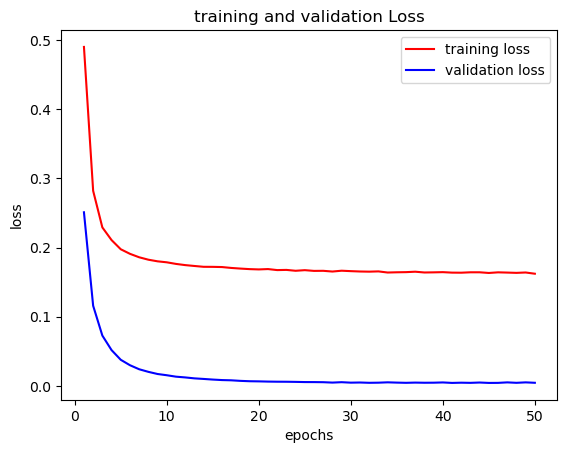

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [18]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(8, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(8, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/100
15/15 - 6s - loss: 0.6812 - accuracy: 0.5443 - val_loss: 0.6658 - val_accuracy: 0.6130 - 6s/epoch - 419ms/step
Epoch 2/100
15/15 - 1s - loss: 0.6634 - accuracy: 0.5669 - val_loss: 0.6449 - val_accuracy: 0.6876 - 1s/epoch - 76ms/step
Epoch 3/100
15/15 - 1s - loss: 0.6463 - accuracy: 0.6196 - val_loss: 0.6265 - val_accuracy: 0.8001 - 947ms/epoch - 63ms/step
Epoch 4/100
15/15 - 1s - loss: 0.6299 - accuracy: 0.6698 - val_loss: 0.6046 - val_accuracy: 0.8599 - 1s/epoch - 77ms/step
Epoch 5/100
15/15 - 1s - loss: 0.6110 - accuracy: 0.7205 - val_loss: 0.5807 - val_accuracy: 0.8868 - 1s/epoch - 76ms/step
Epoch 6/100
15/15 - 1s - loss: 0.5969 - accuracy: 0.7596 - val_loss: 0.5624 - val_accuracy: 0.9020 - 1s/epoch - 78ms/step
Epoch 7/100
15/15 - 1s - loss: 0.5843 - accuracy: 0.7821 - val_loss: 0.5480 - val_accuracy: 0.9125 - 1s/epoch - 74ms/step
Epoch 8/100
15/15 - 1s - loss: 0.5742 - accuracy: 0.7924 - val_loss: 0.5349 - val_accuracy: 0.9200 - 1s/epoch - 72ms/step
Epoch 9/100
15/15 - 

Epoch 68/100
15/15 - 1s - loss: 0.3095 - accuracy: 0.8645 - val_loss: 0.2768 - val_accuracy: 0.8963 - 1s/epoch - 76ms/step
Epoch 69/100
15/15 - 1s - loss: 0.3082 - accuracy: 0.8652 - val_loss: 0.2745 - val_accuracy: 0.8978 - 1s/epoch - 76ms/step
Epoch 70/100
15/15 - 1s - loss: 0.3079 - accuracy: 0.8652 - val_loss: 0.2735 - val_accuracy: 0.8979 - 1s/epoch - 76ms/step
Epoch 71/100
15/15 - 1s - loss: 0.3081 - accuracy: 0.8652 - val_loss: 0.2725 - val_accuracy: 0.8983 - 1s/epoch - 76ms/step
Epoch 72/100
15/15 - 1s - loss: 0.3067 - accuracy: 0.8654 - val_loss: 0.2713 - val_accuracy: 0.8987 - 1s/epoch - 76ms/step
Epoch 73/100
15/15 - 1s - loss: 0.3071 - accuracy: 0.8646 - val_loss: 0.2701 - val_accuracy: 0.8991 - 1s/epoch - 76ms/step
Epoch 74/100
15/15 - 1s - loss: 0.3051 - accuracy: 0.8665 - val_loss: 0.2677 - val_accuracy: 0.9005 - 1s/epoch - 70ms/step
Epoch 75/100
15/15 - 1s - loss: 0.3050 - accuracy: 0.8656 - val_loss: 0.2666 - val_accuracy: 0.9009 - 1s/epoch - 75ms/step
Epoch 76/100
15/

Epoch 30/100
15/15 - 1s - loss: 0.4411 - accuracy: 0.8426 - val_loss: 0.5112 - val_accuracy: 0.8011 - 1s/epoch - 74ms/step
Epoch 31/100
15/15 - 1s - loss: 0.4351 - accuracy: 0.8430 - val_loss: 0.5042 - val_accuracy: 0.8039 - 1s/epoch - 73ms/step
Epoch 32/100
15/15 - 1s - loss: 0.4271 - accuracy: 0.8463 - val_loss: 0.4975 - val_accuracy: 0.8060 - 1s/epoch - 74ms/step
Epoch 33/100
15/15 - 1s - loss: 0.4204 - accuracy: 0.8476 - val_loss: 0.4913 - val_accuracy: 0.8078 - 1s/epoch - 73ms/step
Epoch 34/100
15/15 - 1s - loss: 0.4151 - accuracy: 0.8490 - val_loss: 0.4853 - val_accuracy: 0.8092 - 1s/epoch - 74ms/step
Epoch 35/100
15/15 - 1s - loss: 0.4089 - accuracy: 0.8508 - val_loss: 0.4799 - val_accuracy: 0.8101 - 1s/epoch - 75ms/step
Epoch 36/100
15/15 - 1s - loss: 0.4052 - accuracy: 0.8503 - val_loss: 0.4749 - val_accuracy: 0.8111 - 1s/epoch - 75ms/step
Epoch 37/100
15/15 - 1s - loss: 0.4012 - accuracy: 0.8500 - val_loss: 0.4701 - val_accuracy: 0.8122 - 1s/epoch - 74ms/step
Epoch 38/100
15/

15/15 - 1s - loss: 0.2766 - accuracy: 0.9018 - val_loss: 0.3426 - val_accuracy: 0.8569 - 1s/epoch - 71ms/step
Epoch 97/100
15/15 - 1s - loss: 0.2763 - accuracy: 0.9018 - val_loss: 0.3407 - val_accuracy: 0.8580 - 1s/epoch - 71ms/step
Epoch 98/100
15/15 - 1s - loss: 0.2757 - accuracy: 0.9019 - val_loss: 0.3393 - val_accuracy: 0.8588 - 1s/epoch - 75ms/step
Epoch 99/100
15/15 - 1s - loss: 0.2748 - accuracy: 0.9026 - val_loss: 0.3382 - val_accuracy: 0.8594 - 1s/epoch - 74ms/step
Epoch 100/100
15/15 - 1s - loss: 0.2729 - accuracy: 0.9036 - val_loss: 0.3364 - val_accuracy: 0.8602 - 1s/epoch - 74ms/step
8885/8885 [==============================] - 24s 3ms/step
mcc for fold 2: 0.7466
accuracy for fold 2: 0.8602
precision for fold 2: 0.7855
recall for fold 2: 0.9912
bcr for fold 2: 0.8602
8885/8885 [==============================] - 28s 3ms/step
Training Accuracy: 0.9872922638622654
Testing Accuracy: 0.8602465575154318
Training Accuracy: 0.983479668895434
Testing Accuracy: 0.7854594709089084
///

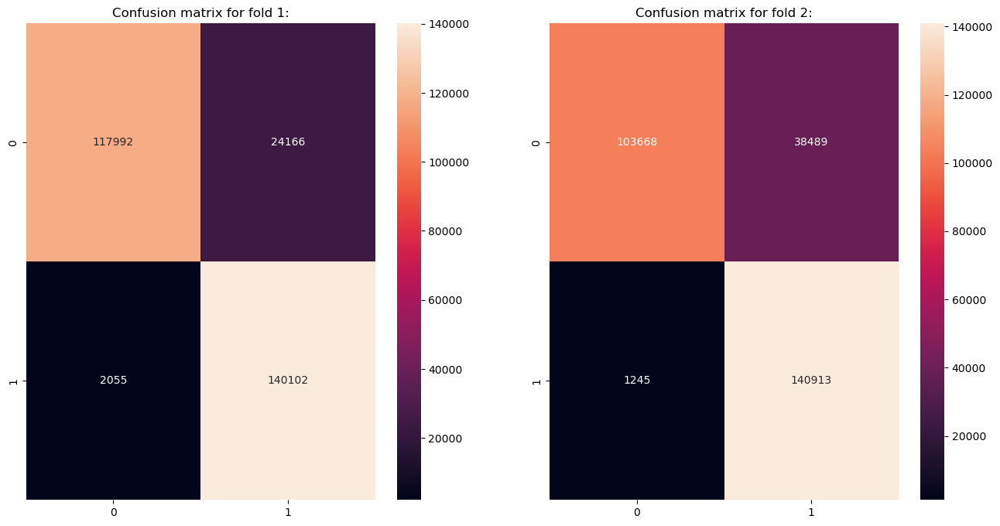

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


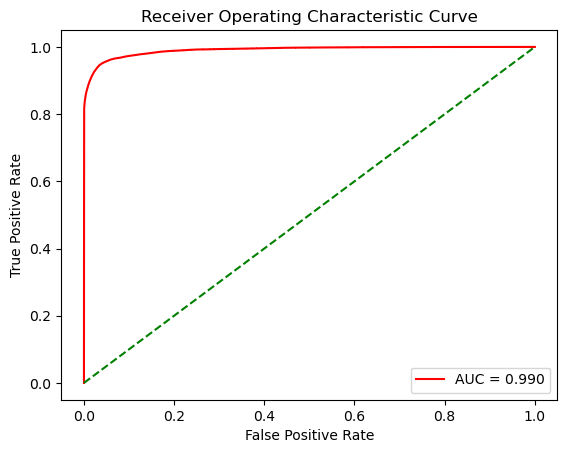

curve for fold 1:
AUC: 0.9904
//////////////////////////////////////////////////////////////////////////////////


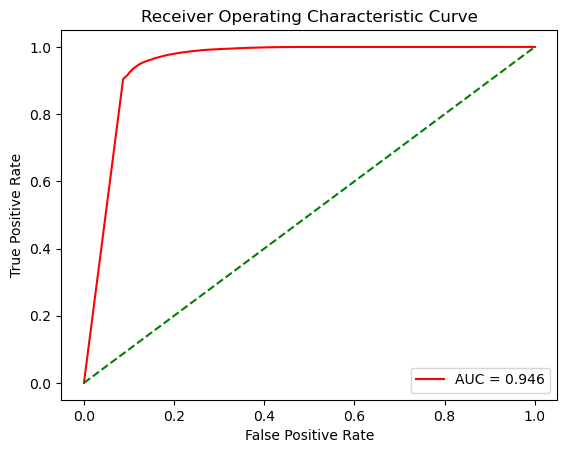

curve for fold 2:
AUC: 0.9457
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


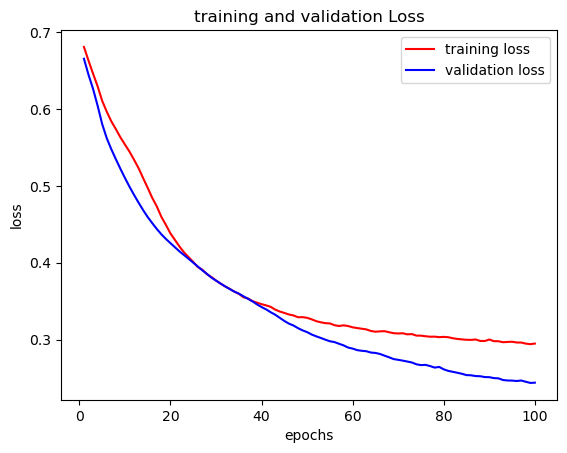

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


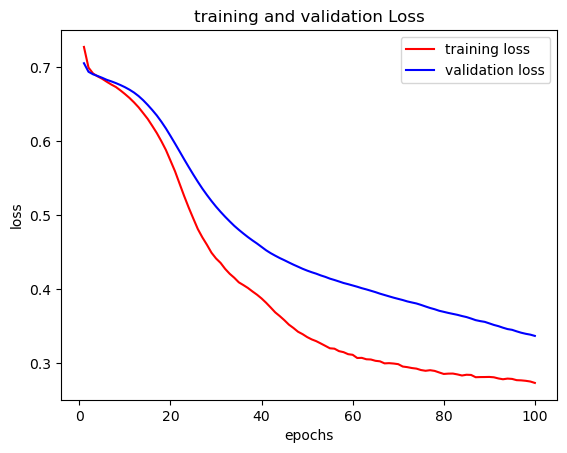

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [19]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(5, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=100, batch_size=20000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/100
15/15 - 8s - loss: 0.6804 - accuracy: 0.5799 - val_loss: 0.6693 - val_accuracy: 0.5579 - 8s/epoch - 516ms/step
Epoch 2/100
15/15 - 1s - loss: 0.6542 - accuracy: 0.6205 - val_loss: 0.6430 - val_accuracy: 0.7070 - 1s/epoch - 78ms/step
Epoch 3/100
15/15 - 1s - loss: 0.6286 - accuracy: 0.6748 - val_loss: 0.6109 - val_accuracy: 0.8640 - 1s/epoch - 77ms/step
Epoch 4/100
15/15 - 1s - loss: 0.6037 - accuracy: 0.7348 - val_loss: 0.5830 - val_accuracy: 0.9042 - 1s/epoch - 79ms/step
Epoch 5/100
15/15 - 1s - loss: 0.5834 - accuracy: 0.7578 - val_loss: 0.5624 - val_accuracy: 0.9120 - 857ms/epoch - 57ms/step
Epoch 6/100
15/15 - 1s - loss: 0.5673 - accuracy: 0.7648 - val_loss: 0.5454 - val_accuracy: 0.9159 - 648ms/epoch - 43ms/step
Epoch 7/100
15/15 - 1s - loss: 0.5530 - accuracy: 0.7679 - val_loss: 0.5306 - val_accuracy: 0.9184 - 941ms/epoch - 63ms/step
Epoch 8/100
15/15 - 1s - loss: 0.5400 - accuracy: 0.7707 - val_loss: 0.5171 - val_accuracy: 0.9202 - 973ms/epoch - 65ms/step
Epoch 9/100

Epoch 68/100
15/15 - 1s - loss: 0.2374 - accuracy: 0.8760 - val_loss: 0.2556 - val_accuracy: 0.8882 - 1s/epoch - 75ms/step
Epoch 69/100
15/15 - 1s - loss: 0.2372 - accuracy: 0.8767 - val_loss: 0.2539 - val_accuracy: 0.8894 - 1s/epoch - 76ms/step
Epoch 70/100
15/15 - 1s - loss: 0.2349 - accuracy: 0.8780 - val_loss: 0.2518 - val_accuracy: 0.8911 - 1s/epoch - 71ms/step
Epoch 71/100
15/15 - 1s - loss: 0.2342 - accuracy: 0.8783 - val_loss: 0.2502 - val_accuracy: 0.8922 - 1s/epoch - 76ms/step
Epoch 72/100
15/15 - 1s - loss: 0.2322 - accuracy: 0.8792 - val_loss: 0.2486 - val_accuracy: 0.8934 - 1s/epoch - 76ms/step
Epoch 73/100
15/15 - 1s - loss: 0.2327 - accuracy: 0.8789 - val_loss: 0.2473 - val_accuracy: 0.8942 - 1s/epoch - 76ms/step
Epoch 74/100
15/15 - 1s - loss: 0.2315 - accuracy: 0.8792 - val_loss: 0.2471 - val_accuracy: 0.8946 - 993ms/epoch - 66ms/step
Epoch 75/100
15/15 - 1s - loss: 0.2312 - accuracy: 0.8796 - val_loss: 0.2464 - val_accuracy: 0.8952 - 526ms/epoch - 35ms/step
Epoch 76/1

Epoch 30/100
15/15 - 1s - loss: 0.3971 - accuracy: 0.7921 - val_loss: 0.3769 - val_accuracy: 0.8514 - 856ms/epoch - 57ms/step
Epoch 31/100
15/15 - 1s - loss: 0.3938 - accuracy: 0.7939 - val_loss: 0.3742 - val_accuracy: 0.8499 - 763ms/epoch - 51ms/step
Epoch 32/100
15/15 - 1s - loss: 0.3922 - accuracy: 0.7936 - val_loss: 0.3714 - val_accuracy: 0.8485 - 642ms/epoch - 43ms/step
Epoch 33/100
15/15 - 1s - loss: 0.3895 - accuracy: 0.7947 - val_loss: 0.3691 - val_accuracy: 0.8472 - 614ms/epoch - 41ms/step
Epoch 34/100
15/15 - 1s - loss: 0.3867 - accuracy: 0.7951 - val_loss: 0.3670 - val_accuracy: 0.8457 - 879ms/epoch - 59ms/step
Epoch 35/100
15/15 - 1s - loss: 0.3855 - accuracy: 0.7964 - val_loss: 0.3646 - val_accuracy: 0.8452 - 763ms/epoch - 51ms/step
Epoch 36/100
15/15 - 1s - loss: 0.3837 - accuracy: 0.7964 - val_loss: 0.3618 - val_accuracy: 0.8454 - 860ms/epoch - 57ms/step
Epoch 37/100
15/15 - 1s - loss: 0.3813 - accuracy: 0.7974 - val_loss: 0.3600 - val_accuracy: 0.8445 - 929ms/epoch - 62

Epoch 96/100
15/15 - 1s - loss: 0.3462 - accuracy: 0.8081 - val_loss: 0.3664 - val_accuracy: 0.8269 - 1s/epoch - 73ms/step
Epoch 97/100
15/15 - 1s - loss: 0.3441 - accuracy: 0.8098 - val_loss: 0.3678 - val_accuracy: 0.8259 - 796ms/epoch - 53ms/step
Epoch 98/100
15/15 - 1s - loss: 0.3432 - accuracy: 0.8103 - val_loss: 0.3686 - val_accuracy: 0.8257 - 937ms/epoch - 62ms/step
Epoch 99/100
15/15 - 1s - loss: 0.3424 - accuracy: 0.8113 - val_loss: 0.3704 - val_accuracy: 0.8247 - 733ms/epoch - 49ms/step
Epoch 100/100
15/15 - 1s - loss: 0.3442 - accuracy: 0.8096 - val_loss: 0.3700 - val_accuracy: 0.8251 - 930ms/epoch - 62ms/step
8885/8885 [==============================] - 28s 3ms/step
mcc for fold 2: 0.6865
accuracy for fold 2: 0.8251
precision for fold 2: 0.7460
recall for fold 2: 0.9857
bcr for fold 2: 0.8251
8885/8885 [==============================] - 26s 3ms/step
Training Accuracy: 0.9883931554789582
Testing Accuracy: 0.8250743013910627
Training Accuracy: 0.9908654491978988
Testing Accura

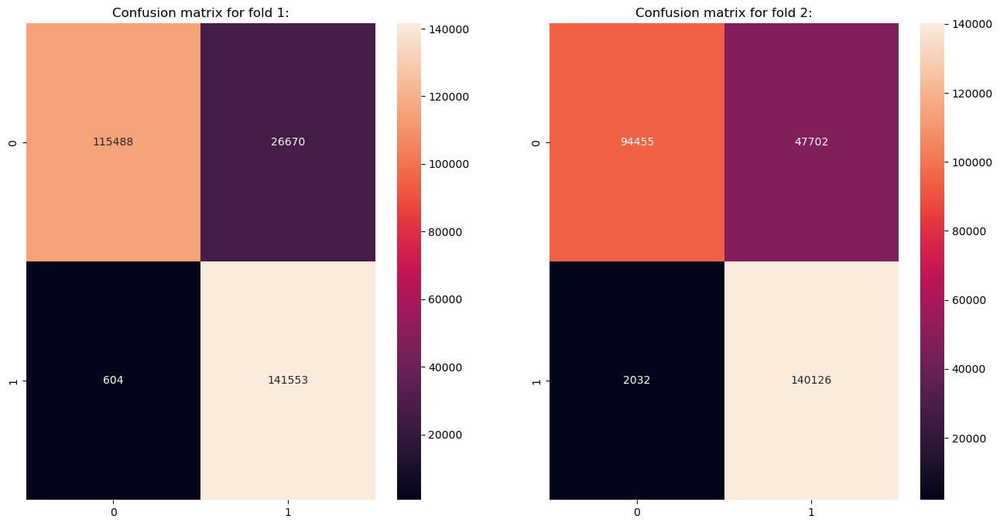

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


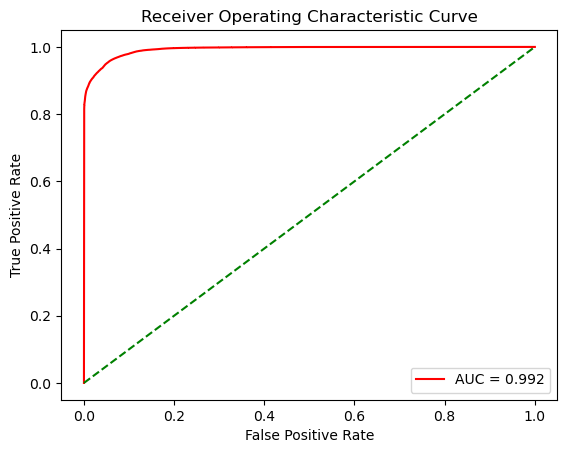

curve for fold 1:
AUC: 0.9925
//////////////////////////////////////////////////////////////////////////////////


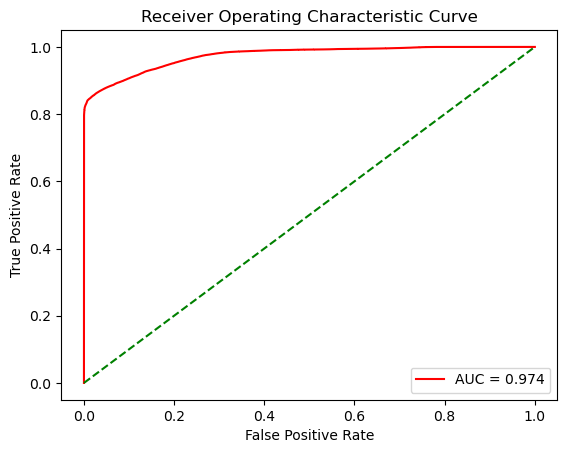

curve for fold 2:
AUC: 0.9739
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


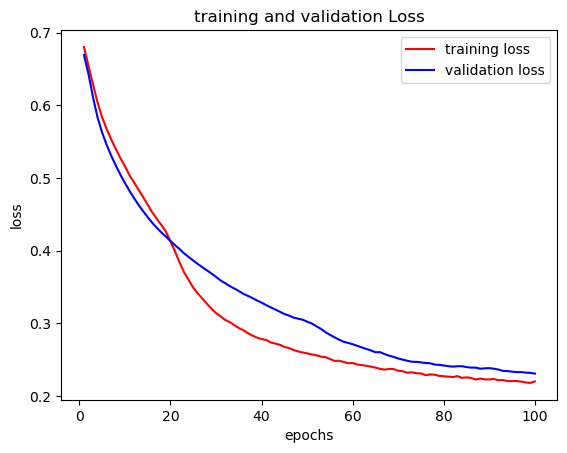

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


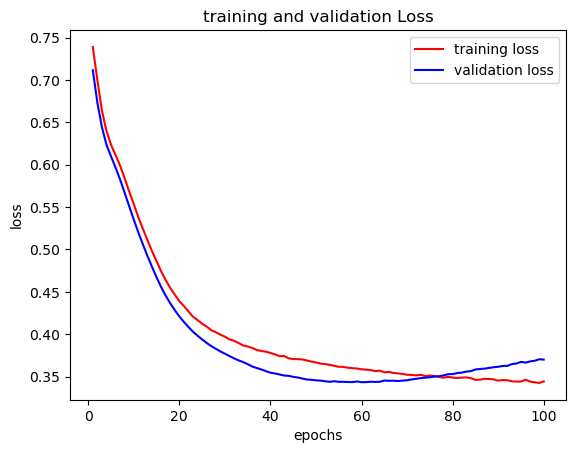

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [20]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(5, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=100, batch_size=20000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/100
15/15 - 7s - loss: 0.6933 - accuracy: 0.5103 - val_loss: 0.6880 - val_accuracy: 0.6702 - 7s/epoch - 469ms/step
Epoch 2/100
15/15 - 1s - loss: 0.6844 - accuracy: 0.5913 - val_loss: 0.6763 - val_accuracy: 0.8743 - 1s/epoch - 68ms/step
Epoch 3/100
15/15 - 1s - loss: 0.6679 - accuracy: 0.6602 - val_loss: 0.6486 - val_accuracy: 0.9209 - 1s/epoch - 68ms/step
Epoch 4/100
15/15 - 1s - loss: 0.6351 - accuracy: 0.7352 - val_loss: 0.6059 - val_accuracy: 0.9273 - 930ms/epoch - 62ms/step
Epoch 5/100
15/15 - 1s - loss: 0.5977 - accuracy: 0.7857 - val_loss: 0.5688 - val_accuracy: 0.9292 - 877ms/epoch - 58ms/step
Epoch 6/100
15/15 - 1s - loss: 0.5686 - accuracy: 0.8023 - val_loss: 0.5411 - val_accuracy: 0.9303 - 941ms/epoch - 63ms/step
Epoch 7/100
15/15 - 1s - loss: 0.5439 - accuracy: 0.8099 - val_loss: 0.5167 - val_accuracy: 0.9313 - 953ms/epoch - 64ms/step
Epoch 8/100
15/15 - 1s - loss: 0.5213 - accuracy: 0.8145 - val_loss: 0.4941 - val_accuracy: 0.9319 - 801ms/epoch - 53ms/step
Epoch 9/

Epoch 67/100
15/15 - 1s - loss: 0.1757 - accuracy: 0.9201 - val_loss: 0.2745 - val_accuracy: 0.8695 - 1s/epoch - 72ms/step
Epoch 68/100
15/15 - 1s - loss: 0.1755 - accuracy: 0.9198 - val_loss: 0.2735 - val_accuracy: 0.8702 - 1s/epoch - 69ms/step
Epoch 69/100
15/15 - 1s - loss: 0.1726 - accuracy: 0.9214 - val_loss: 0.2714 - val_accuracy: 0.8717 - 1s/epoch - 68ms/step
Epoch 70/100
15/15 - 1s - loss: 0.1718 - accuracy: 0.9209 - val_loss: 0.2706 - val_accuracy: 0.8726 - 1s/epoch - 68ms/step
Epoch 71/100
15/15 - 1s - loss: 0.1722 - accuracy: 0.9213 - val_loss: 0.2691 - val_accuracy: 0.8736 - 1s/epoch - 70ms/step
Epoch 72/100
15/15 - 1s - loss: 0.1705 - accuracy: 0.9217 - val_loss: 0.2675 - val_accuracy: 0.8748 - 1s/epoch - 70ms/step
Epoch 73/100
15/15 - 1s - loss: 0.1705 - accuracy: 0.9216 - val_loss: 0.2668 - val_accuracy: 0.8754 - 861ms/epoch - 57ms/step
Epoch 74/100
15/15 - 1s - loss: 0.1694 - accuracy: 0.9220 - val_loss: 0.2655 - val_accuracy: 0.8760 - 854ms/epoch - 57ms/step
Epoch 75/1

Epoch 29/100
15/15 - 1s - loss: 0.2054 - accuracy: 0.9073 - val_loss: 0.3471 - val_accuracy: 0.8352 - 859ms/epoch - 57ms/step
Epoch 30/100
15/15 - 1s - loss: 0.2007 - accuracy: 0.9094 - val_loss: 0.3471 - val_accuracy: 0.8350 - 953ms/epoch - 64ms/step
Epoch 31/100
15/15 - 1s - loss: 0.1954 - accuracy: 0.9099 - val_loss: 0.3469 - val_accuracy: 0.8352 - 762ms/epoch - 51ms/step
Epoch 32/100
15/15 - 1s - loss: 0.1924 - accuracy: 0.9109 - val_loss: 0.3466 - val_accuracy: 0.8355 - 808ms/epoch - 54ms/step
Epoch 33/100
15/15 - 1s - loss: 0.1896 - accuracy: 0.9100 - val_loss: 0.3467 - val_accuracy: 0.8358 - 698ms/epoch - 47ms/step
Epoch 34/100
15/15 - 1s - loss: 0.1855 - accuracy: 0.9119 - val_loss: 0.3466 - val_accuracy: 0.8363 - 668ms/epoch - 45ms/step
Epoch 35/100
15/15 - 1s - loss: 0.1839 - accuracy: 0.9115 - val_loss: 0.3466 - val_accuracy: 0.8370 - 773ms/epoch - 52ms/step
Epoch 36/100
15/15 - 1s - loss: 0.1795 - accuracy: 0.9129 - val_loss: 0.3467 - val_accuracy: 0.8377 - 807ms/epoch - 54

Epoch 95/100
15/15 - 1s - loss: 0.1134 - accuracy: 0.9302 - val_loss: 0.4332 - val_accuracy: 0.8443 - 823ms/epoch - 55ms/step
Epoch 96/100
15/15 - 1s - loss: 0.1131 - accuracy: 0.9300 - val_loss: 0.4340 - val_accuracy: 0.8445 - 906ms/epoch - 60ms/step
Epoch 97/100
15/15 - 1s - loss: 0.1122 - accuracy: 0.9303 - val_loss: 0.4343 - val_accuracy: 0.8448 - 923ms/epoch - 62ms/step
Epoch 98/100
15/15 - 1s - loss: 0.1125 - accuracy: 0.9305 - val_loss: 0.4338 - val_accuracy: 0.8453 - 983ms/epoch - 66ms/step
Epoch 99/100
15/15 - 1s - loss: 0.1115 - accuracy: 0.9312 - val_loss: 0.4345 - val_accuracy: 0.8456 - 948ms/epoch - 63ms/step
Epoch 100/100
15/15 - 1s - loss: 0.1121 - accuracy: 0.9303 - val_loss: 0.4347 - val_accuracy: 0.8461 - 1s/epoch - 70ms/step
8885/8885 [==============================] - 27s 3ms/step
mcc for fold 2: 0.7250
accuracy for fold 2: 0.8461
precision for fold 2: 0.7666
recall for fold 2: 0.9950
bcr for fold 2: 0.8461
8885/8885 [==============================] - 27s 3ms/step
T

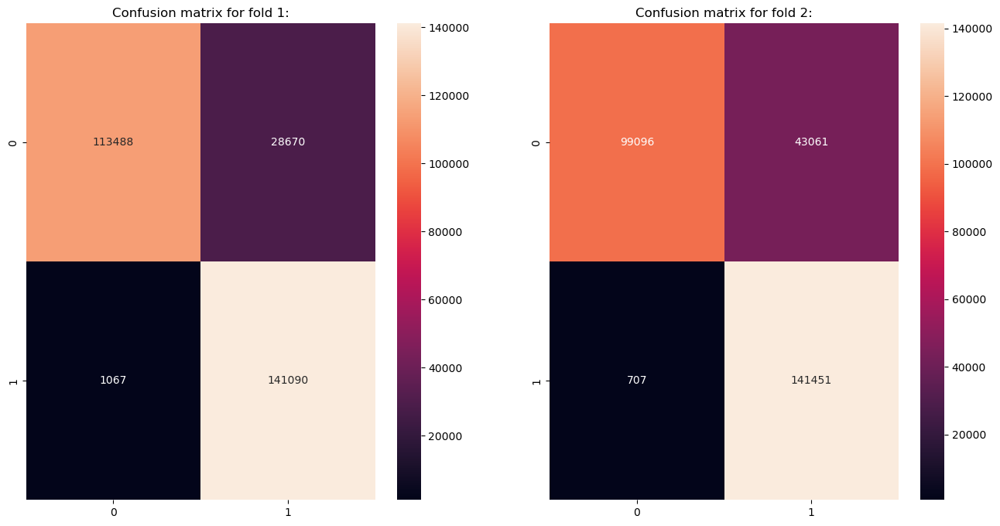

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


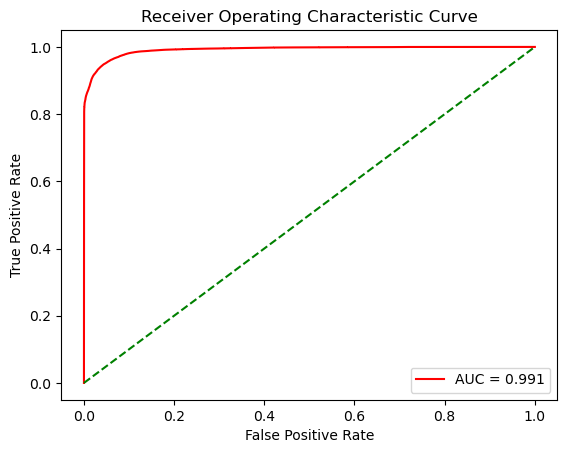

curve for fold 1:
AUC: 0.9914
//////////////////////////////////////////////////////////////////////////////////


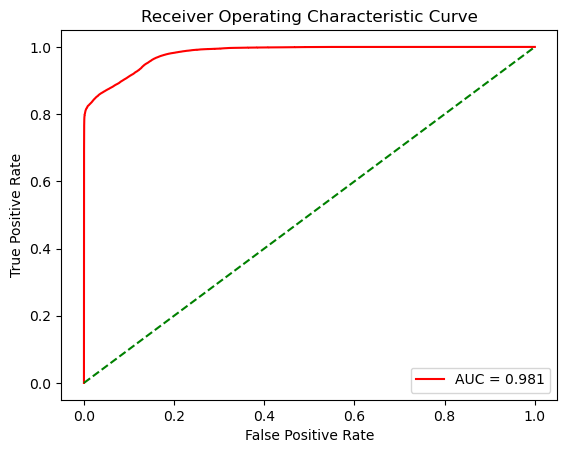

curve for fold 2:
AUC: 0.9809
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


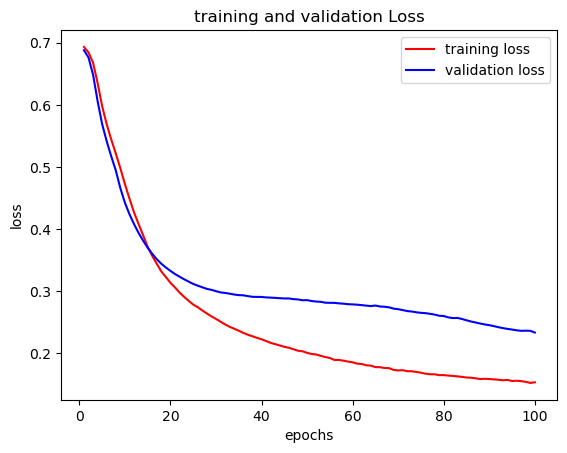

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


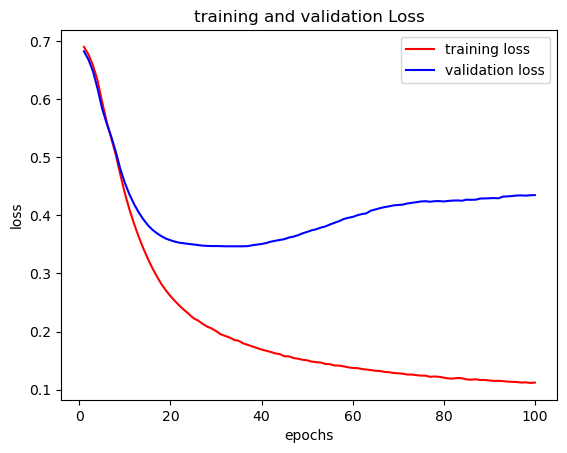

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [22]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(8, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(8, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.5)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=100, batch_size=20000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/100
15/15 - 6s - loss: 0.6892 - accuracy: 0.5199 - val_loss: 0.6790 - val_accuracy: 0.6515 - 6s/epoch - 382ms/step
Epoch 2/100
15/15 - 1s - loss: 0.6735 - accuracy: 0.6184 - val_loss: 0.6643 - val_accuracy: 0.8436 - 1s/epoch - 68ms/step
Epoch 3/100
15/15 - 1s - loss: 0.6598 - accuracy: 0.7040 - val_loss: 0.6510 - val_accuracy: 0.8844 - 985ms/epoch - 66ms/step
Epoch 4/100
15/15 - 1s - loss: 0.6475 - accuracy: 0.7603 - val_loss: 0.6386 - val_accuracy: 0.8986 - 1s/epoch - 68ms/step
Epoch 5/100
15/15 - 1s - loss: 0.6362 - accuracy: 0.7837 - val_loss: 0.6273 - val_accuracy: 0.9001 - 1s/epoch - 69ms/step
Epoch 6/100
15/15 - 1s - loss: 0.6253 - accuracy: 0.7930 - val_loss: 0.6154 - val_accuracy: 0.9004 - 1s/epoch - 68ms/step
Epoch 7/100
15/15 - 1s - loss: 0.6136 - accuracy: 0.7988 - val_loss: 0.6031 - val_accuracy: 0.9007 - 1s/epoch - 69ms/step
Epoch 8/100
15/15 - 1s - loss: 0.6017 - accuracy: 0.8037 - val_loss: 0.5905 - val_accuracy: 0.9010 - 1s/epoch - 68ms/step
Epoch 9/100
15/15 - 

Epoch 67/100
15/15 - 1s - loss: 0.2297 - accuracy: 0.8556 - val_loss: 0.2457 - val_accuracy: 0.8983 - 513ms/epoch - 34ms/step
Epoch 68/100
15/15 - 1s - loss: 0.2282 - accuracy: 0.8564 - val_loss: 0.2459 - val_accuracy: 0.8973 - 560ms/epoch - 37ms/step
Epoch 69/100
15/15 - 1s - loss: 0.2278 - accuracy: 0.8566 - val_loss: 0.2447 - val_accuracy: 0.8975 - 662ms/epoch - 44ms/step
Epoch 70/100
15/15 - 0s - loss: 0.2261 - accuracy: 0.8573 - val_loss: 0.2434 - val_accuracy: 0.8976 - 495ms/epoch - 33ms/step
Epoch 71/100
15/15 - 0s - loss: 0.2251 - accuracy: 0.8578 - val_loss: 0.2439 - val_accuracy: 0.8968 - 499ms/epoch - 33ms/step
Epoch 72/100
15/15 - 1s - loss: 0.2252 - accuracy: 0.8573 - val_loss: 0.2440 - val_accuracy: 0.8961 - 568ms/epoch - 38ms/step
Epoch 73/100
15/15 - 1s - loss: 0.2243 - accuracy: 0.8582 - val_loss: 0.2433 - val_accuracy: 0.8962 - 585ms/epoch - 39ms/step
Epoch 74/100
15/15 - 1s - loss: 0.2234 - accuracy: 0.8583 - val_loss: 0.2423 - val_accuracy: 0.8963 - 515ms/epoch - 34

Epoch 28/100
15/15 - 1s - loss: 0.3177 - accuracy: 0.8485 - val_loss: 0.3726 - val_accuracy: 0.8547 - 1s/epoch - 68ms/step
Epoch 29/100
15/15 - 1s - loss: 0.3109 - accuracy: 0.8497 - val_loss: 0.3677 - val_accuracy: 0.8538 - 981ms/epoch - 65ms/step
Epoch 30/100
15/15 - 1s - loss: 0.3049 - accuracy: 0.8507 - val_loss: 0.3630 - val_accuracy: 0.8534 - 870ms/epoch - 58ms/step
Epoch 31/100
15/15 - 1s - loss: 0.2997 - accuracy: 0.8504 - val_loss: 0.3585 - val_accuracy: 0.8531 - 937ms/epoch - 62ms/step
Epoch 32/100
15/15 - 1s - loss: 0.2946 - accuracy: 0.8510 - val_loss: 0.3548 - val_accuracy: 0.8526 - 874ms/epoch - 58ms/step
Epoch 33/100
15/15 - 1s - loss: 0.2907 - accuracy: 0.8516 - val_loss: 0.3511 - val_accuracy: 0.8524 - 908ms/epoch - 61ms/step
Epoch 34/100
15/15 - 1s - loss: 0.2860 - accuracy: 0.8516 - val_loss: 0.3472 - val_accuracy: 0.8528 - 921ms/epoch - 61ms/step
Epoch 35/100
15/15 - 1s - loss: 0.2814 - accuracy: 0.8525 - val_loss: 0.3438 - val_accuracy: 0.8528 - 851ms/epoch - 57ms/

15/15 - 1s - loss: 0.2135 - accuracy: 0.8630 - val_loss: 0.3837 - val_accuracy: 0.8038 - 958ms/epoch - 64ms/step
Epoch 94/100
15/15 - 1s - loss: 0.2128 - accuracy: 0.8639 - val_loss: 0.3840 - val_accuracy: 0.8042 - 945ms/epoch - 63ms/step
Epoch 95/100
15/15 - 1s - loss: 0.2127 - accuracy: 0.8628 - val_loss: 0.3862 - val_accuracy: 0.8036 - 957ms/epoch - 64ms/step
Epoch 96/100
15/15 - 1s - loss: 0.2110 - accuracy: 0.8641 - val_loss: 0.3879 - val_accuracy: 0.8029 - 961ms/epoch - 64ms/step
Epoch 97/100
15/15 - 1s - loss: 0.2109 - accuracy: 0.8642 - val_loss: 0.3885 - val_accuracy: 0.8028 - 950ms/epoch - 63ms/step
Epoch 98/100
15/15 - 1s - loss: 0.2120 - accuracy: 0.8631 - val_loss: 0.3918 - val_accuracy: 0.8012 - 943ms/epoch - 63ms/step
Epoch 99/100
15/15 - 1s - loss: 0.2103 - accuracy: 0.8636 - val_loss: 0.3942 - val_accuracy: 0.8004 - 959ms/epoch - 64ms/step
Epoch 100/100
15/15 - 1s - loss: 0.2083 - accuracy: 0.8654 - val_loss: 0.3968 - val_accuracy: 0.7997 - 861ms/epoch - 57ms/step
8885

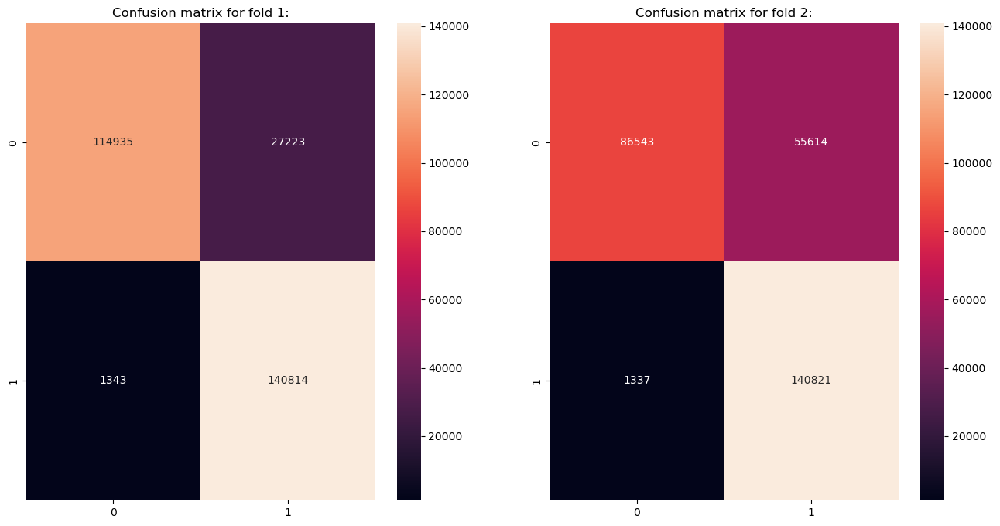

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


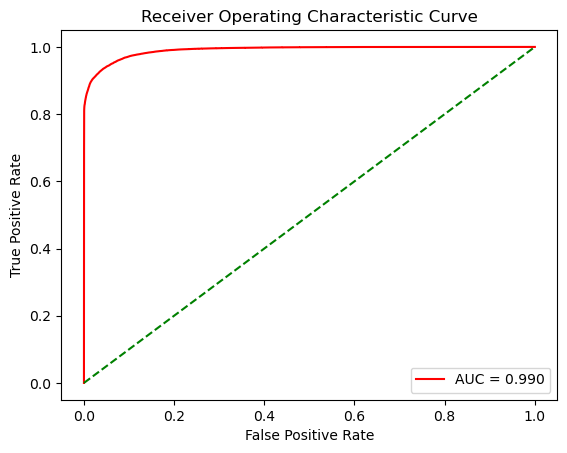

curve for fold 1:
AUC: 0.9902
//////////////////////////////////////////////////////////////////////////////////


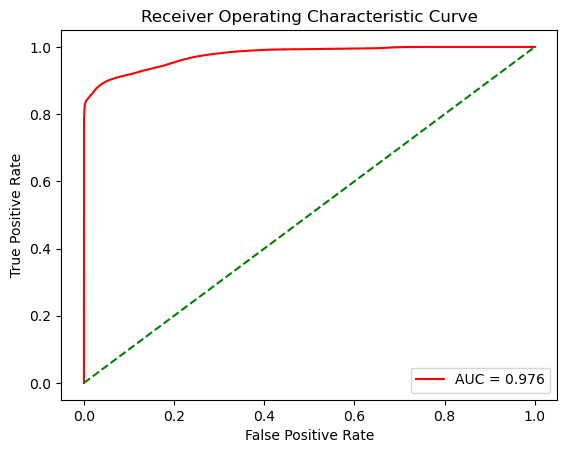

curve for fold 2:
AUC: 0.9765
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


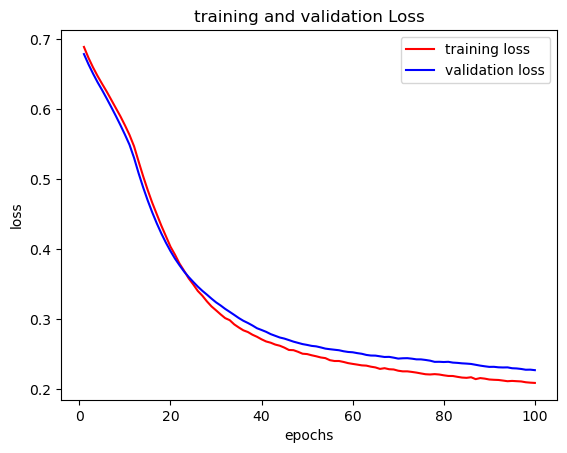

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


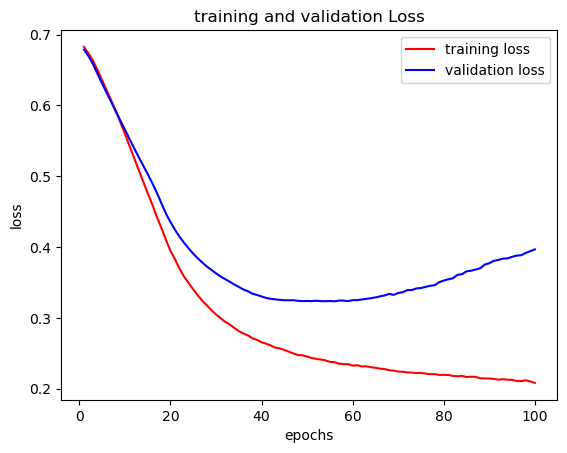

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [24]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(5, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.5)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=100, batch_size=20000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/100
15/15 - 5s - loss: 0.7079 - accuracy: 0.3911 - val_loss: 0.6884 - val_accuracy: 0.3206 - 5s/epoch - 354ms/step
Epoch 2/100
15/15 - 1s - loss: 0.6681 - accuracy: 0.4717 - val_loss: 0.6349 - val_accuracy: 0.5895 - 964ms/epoch - 64ms/step
Epoch 3/100
15/15 - 1s - loss: 0.6174 - accuracy: 0.6625 - val_loss: 0.5889 - val_accuracy: 0.7865 - 959ms/epoch - 64ms/step
Epoch 4/100
15/15 - 1s - loss: 0.5835 - accuracy: 0.7678 - val_loss: 0.5590 - val_accuracy: 0.8708 - 990ms/epoch - 66ms/step
Epoch 5/100
15/15 - 1s - loss: 0.5604 - accuracy: 0.8145 - val_loss: 0.5354 - val_accuracy: 0.9025 - 1s/epoch - 67ms/step
Epoch 6/100
15/15 - 1s - loss: 0.5433 - accuracy: 0.8371 - val_loss: 0.5187 - val_accuracy: 0.9137 - 1s/epoch - 67ms/step
Epoch 7/100
15/15 - 1s - loss: 0.5294 - accuracy: 0.8483 - val_loss: 0.5039 - val_accuracy: 0.9187 - 974ms/epoch - 65ms/step
Epoch 8/100
15/15 - 1s - loss: 0.5165 - accuracy: 0.8551 - val_loss: 0.4901 - val_accuracy: 0.9234 - 967ms/epoch - 64ms/step
Epoch 9/

Epoch 67/100
15/15 - 1s - loss: 0.1410 - accuracy: 0.9682 - val_loss: 0.2879 - val_accuracy: 0.8761 - 856ms/epoch - 57ms/step
Epoch 68/100
15/15 - 1s - loss: 0.1397 - accuracy: 0.9685 - val_loss: 0.2882 - val_accuracy: 0.8758 - 884ms/epoch - 59ms/step
Epoch 69/100
15/15 - 1s - loss: 0.1384 - accuracy: 0.9683 - val_loss: 0.2878 - val_accuracy: 0.8762 - 964ms/epoch - 64ms/step
Epoch 70/100
15/15 - 1s - loss: 0.1375 - accuracy: 0.9689 - val_loss: 0.2880 - val_accuracy: 0.8762 - 951ms/epoch - 63ms/step
Epoch 71/100
15/15 - 1s - loss: 0.1362 - accuracy: 0.9689 - val_loss: 0.2882 - val_accuracy: 0.8764 - 984ms/epoch - 66ms/step
Epoch 72/100
15/15 - 1s - loss: 0.1351 - accuracy: 0.9689 - val_loss: 0.2883 - val_accuracy: 0.8765 - 1s/epoch - 68ms/step
Epoch 73/100
15/15 - 1s - loss: 0.1338 - accuracy: 0.9695 - val_loss: 0.2887 - val_accuracy: 0.8764 - 978ms/epoch - 65ms/step
Epoch 74/100
15/15 - 1s - loss: 0.1330 - accuracy: 0.9698 - val_loss: 0.2888 - val_accuracy: 0.8764 - 1s/epoch - 67ms/ste

Epoch 28/100
15/15 - 1s - loss: 0.3703 - accuracy: 0.8821 - val_loss: 0.4134 - val_accuracy: 0.8493 - 862ms/epoch - 57ms/step
Epoch 29/100
15/15 - 1s - loss: 0.3616 - accuracy: 0.8831 - val_loss: 0.4085 - val_accuracy: 0.8453 - 937ms/epoch - 62ms/step
Epoch 30/100
15/15 - 1s - loss: 0.3519 - accuracy: 0.8850 - val_loss: 0.4044 - val_accuracy: 0.8413 - 902ms/epoch - 60ms/step
Epoch 31/100
15/15 - 1s - loss: 0.3449 - accuracy: 0.8846 - val_loss: 0.4010 - val_accuracy: 0.8377 - 870ms/epoch - 58ms/step
Epoch 32/100
15/15 - 1s - loss: 0.3376 - accuracy: 0.8860 - val_loss: 0.3984 - val_accuracy: 0.8343 - 849ms/epoch - 57ms/step
Epoch 33/100
15/15 - 1s - loss: 0.3316 - accuracy: 0.8860 - val_loss: 0.3955 - val_accuracy: 0.8330 - 789ms/epoch - 53ms/step
Epoch 34/100
15/15 - 1s - loss: 0.3263 - accuracy: 0.8858 - val_loss: 0.3927 - val_accuracy: 0.8311 - 937ms/epoch - 62ms/step
Epoch 35/100
15/15 - 1s - loss: 0.3191 - accuracy: 0.8875 - val_loss: 0.3908 - val_accuracy: 0.8289 - 850ms/epoch - 57

15/15 - 1s - loss: 0.2160 - accuracy: 0.9046 - val_loss: 0.4538 - val_accuracy: 0.7950 - 925ms/epoch - 62ms/step
Epoch 94/100
15/15 - 1s - loss: 0.2155 - accuracy: 0.9047 - val_loss: 0.4547 - val_accuracy: 0.7957 - 941ms/epoch - 63ms/step
Epoch 95/100
15/15 - 1s - loss: 0.2162 - accuracy: 0.9044 - val_loss: 0.4555 - val_accuracy: 0.7954 - 931ms/epoch - 62ms/step
Epoch 96/100
15/15 - 1s - loss: 0.2141 - accuracy: 0.9057 - val_loss: 0.4597 - val_accuracy: 0.7947 - 936ms/epoch - 62ms/step
Epoch 97/100
15/15 - 1s - loss: 0.2128 - accuracy: 0.9061 - val_loss: 0.4604 - val_accuracy: 0.7948 - 945ms/epoch - 63ms/step
Epoch 98/100
15/15 - 1s - loss: 0.2137 - accuracy: 0.9053 - val_loss: 0.4625 - val_accuracy: 0.7945 - 941ms/epoch - 63ms/step
Epoch 99/100
15/15 - 1s - loss: 0.2129 - accuracy: 0.9055 - val_loss: 0.4652 - val_accuracy: 0.7941 - 852ms/epoch - 57ms/step
Epoch 100/100
15/15 - 1s - loss: 0.2129 - accuracy: 0.9053 - val_loss: 0.4683 - val_accuracy: 0.7935 - 924ms/epoch - 62ms/step
8885

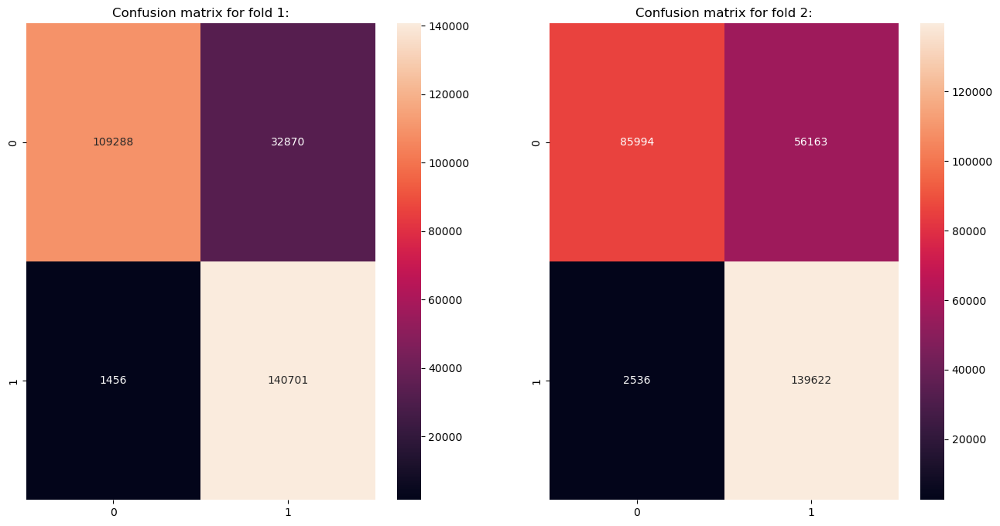

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


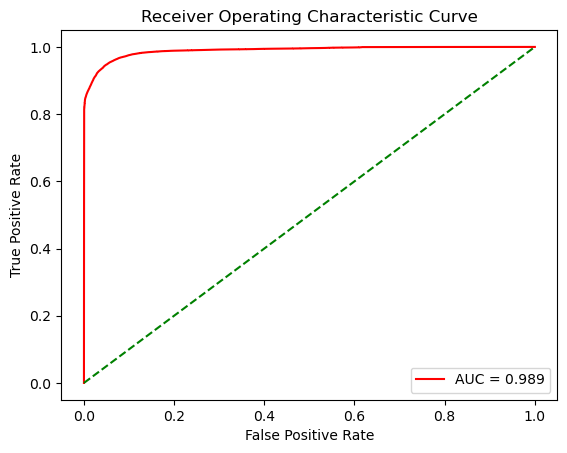

curve for fold 1:
AUC: 0.9892
//////////////////////////////////////////////////////////////////////////////////


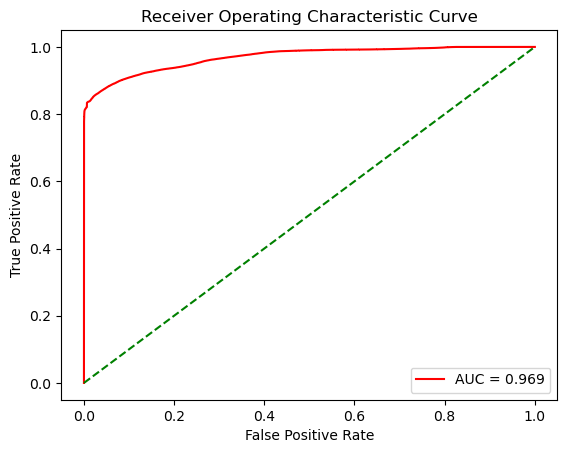

curve for fold 2:
AUC: 0.9692
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


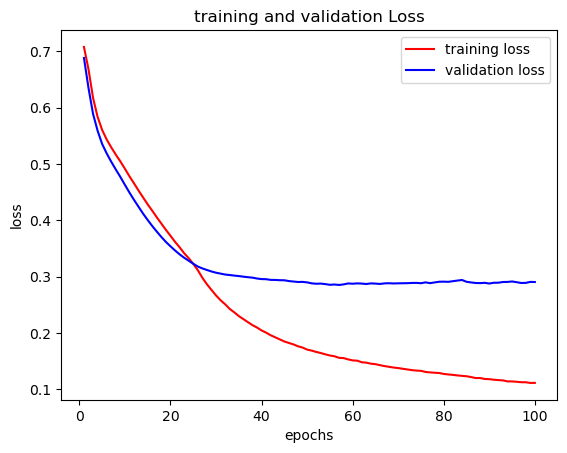

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


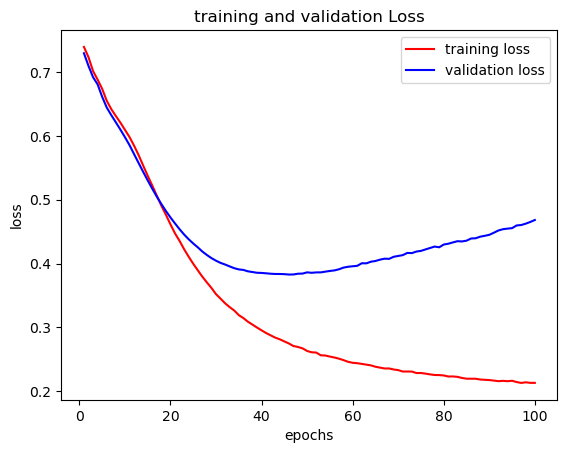

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [23]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(5, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.4)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=100, batch_size=20000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 12s - loss: 0.5755 - accuracy: 0.6646 - val_loss: 0.3907 - val_accuracy: 0.9364 - 12s/epoch - 51ms/step
Epoch 2/50
228/228 - 3s - loss: 0.3977 - accuracy: 0.7791 - val_loss: 0.2120 - val_accuracy: 0.9617 - 3s/epoch - 13ms/step
Epoch 3/50
228/228 - 3s - loss: 0.3441 - accuracy: 0.8050 - val_loss: 0.1463 - val_accuracy: 0.9715 - 3s/epoch - 13ms/step
Epoch 4/50
228/228 - 3s - loss: 0.3262 - accuracy: 0.8111 - val_loss: 0.1189 - val_accuracy: 0.9760 - 3s/epoch - 13ms/step
Epoch 5/50
228/228 - 3s - loss: 0.3166 - accuracy: 0.8148 - val_loss: 0.0993 - val_accuracy: 0.9806 - 3s/epoch - 13ms/step
Epoch 6/50
228/228 - 3s - loss: 0.3097 - accuracy: 0.8178 - val_loss: 0.0837 - val_accuracy: 0.9833 - 3s/epoch - 13ms/step
Epoch 7/50
228/228 - 3s - loss: 0.3052 - accuracy: 0.8196 - val_loss: 0.0734 - val_accuracy: 0.9858 - 3s/epoch - 13ms/step
Epoch 8/50
228/228 - 3s - loss: 0.3009 - accuracy: 0.8219 - val_loss: 0.0653 - val_accuracy: 0.9876 - 3s/epoch - 11ms/step
Epoch 9/50
228

Epoch 13/50
228/228 - 3s - loss: 0.2748 - accuracy: 0.8779 - val_loss: 0.0437 - val_accuracy: 0.9952 - 3s/epoch - 14ms/step
Epoch 14/50
228/228 - 3s - loss: 0.2749 - accuracy: 0.8775 - val_loss: 0.0406 - val_accuracy: 0.9956 - 3s/epoch - 12ms/step
Epoch 15/50
228/228 - 3s - loss: 0.2743 - accuracy: 0.8777 - val_loss: 0.0387 - val_accuracy: 0.9962 - 3s/epoch - 12ms/step
Epoch 16/50
228/228 - 3s - loss: 0.2731 - accuracy: 0.8782 - val_loss: 0.0365 - val_accuracy: 0.9964 - 3s/epoch - 15ms/step
Epoch 17/50
228/228 - 3s - loss: 0.2734 - accuracy: 0.8778 - val_loss: 0.0343 - val_accuracy: 0.9967 - 3s/epoch - 15ms/step
Epoch 18/50
228/228 - 3s - loss: 0.2727 - accuracy: 0.8784 - val_loss: 0.0332 - val_accuracy: 0.9969 - 3s/epoch - 15ms/step
Epoch 19/50
228/228 - 3s - loss: 0.2734 - accuracy: 0.8777 - val_loss: 0.0312 - val_accuracy: 0.9974 - 3s/epoch - 13ms/step
Epoch 20/50
228/228 - 3s - loss: 0.2709 - accuracy: 0.8790 - val_loss: 0.0305 - val_accuracy: 0.9974 - 3s/epoch - 13ms/step
Epoch 21

Epoch 25/50
228/228 - 2s - loss: 0.3462 - accuracy: 0.7536 - val_loss: 0.0242 - val_accuracy: 0.9977 - 2s/epoch - 7ms/step
Epoch 26/50
228/228 - 2s - loss: 0.3447 - accuracy: 0.7543 - val_loss: 0.0222 - val_accuracy: 0.9976 - 2s/epoch - 7ms/step
Epoch 27/50
228/228 - 2s - loss: 0.3445 - accuracy: 0.7539 - val_loss: 0.0202 - val_accuracy: 0.9976 - 2s/epoch - 7ms/step
Epoch 28/50
228/228 - 2s - loss: 0.3442 - accuracy: 0.7543 - val_loss: 0.0195 - val_accuracy: 0.9974 - 2s/epoch - 8ms/step
Epoch 29/50
228/228 - 2s - loss: 0.3433 - accuracy: 0.7549 - val_loss: 0.0184 - val_accuracy: 0.9975 - 2s/epoch - 8ms/step
Epoch 30/50
228/228 - 2s - loss: 0.3431 - accuracy: 0.7546 - val_loss: 0.0180 - val_accuracy: 0.9975 - 2s/epoch - 8ms/step
Epoch 31/50
228/228 - 2s - loss: 0.3432 - accuracy: 0.7540 - val_loss: 0.0178 - val_accuracy: 0.9975 - 2s/epoch - 7ms/step
Epoch 32/50
228/228 - 2s - loss: 0.3427 - accuracy: 0.7532 - val_loss: 0.0173 - val_accuracy: 0.9974 - 2s/epoch - 7ms/step
Epoch 33/50
228/

Epoch 37/50
228/228 - 2s - loss: 0.2714 - accuracy: 0.8791 - val_loss: 0.0128 - val_accuracy: 0.9981 - 2s/epoch - 8ms/step
Epoch 38/50
228/228 - 2s - loss: 0.2710 - accuracy: 0.8794 - val_loss: 0.0122 - val_accuracy: 0.9982 - 2s/epoch - 8ms/step
Epoch 39/50
228/228 - 2s - loss: 0.2708 - accuracy: 0.8797 - val_loss: 0.0118 - val_accuracy: 0.9983 - 2s/epoch - 7ms/step
Epoch 40/50
228/228 - 2s - loss: 0.2710 - accuracy: 0.8794 - val_loss: 0.0110 - val_accuracy: 0.9983 - 2s/epoch - 8ms/step
Epoch 41/50
228/228 - 2s - loss: 0.2706 - accuracy: 0.8796 - val_loss: 0.0108 - val_accuracy: 0.9984 - 2s/epoch - 9ms/step
Epoch 42/50
228/228 - 2s - loss: 0.2720 - accuracy: 0.8786 - val_loss: 0.0108 - val_accuracy: 0.9984 - 2s/epoch - 9ms/step
Epoch 43/50
228/228 - 2s - loss: 0.2709 - accuracy: 0.8792 - val_loss: 0.0105 - val_accuracy: 0.9985 - 2s/epoch - 9ms/step
Epoch 44/50
228/228 - 2s - loss: 0.2709 - accuracy: 0.8792 - val_loss: 0.0094 - val_accuracy: 0.9987 - 2s/epoch - 8ms/step
Epoch 45/50
228/

Epoch 49/50
228/228 - 2s - loss: 0.2864 - accuracy: 0.8272 - val_loss: 0.0090 - val_accuracy: 0.9980 - 2s/epoch - 7ms/step
Epoch 50/50
228/228 - 2s - loss: 0.2868 - accuracy: 0.8271 - val_loss: 0.0097 - val_accuracy: 0.9981 - 2s/epoch - 7ms/step
3554/3554 [==============================] - 7s 2ms/step
first fold
mcc for fold 5: 0.9961
accuracy for fold 5: 0.9981
precision for fold 5: 0.9963
recall for fold 5: 0.9999
bcr for fold 5: 0.9981
3554/3554 [==============================] - 6s 2ms/step
Training Accuracy: 0.9992130207692173
Testing Accuracy: 0.9980655259131597
Training Accuracy: 0.998516046889406
Testing Accuracy: 0.9962850684283386
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9982114907760758
precision: 0.9964939532285653
recall: 0.999943724390201
bcr: 0.9982114907760758
mcc: 0.9964302466442465


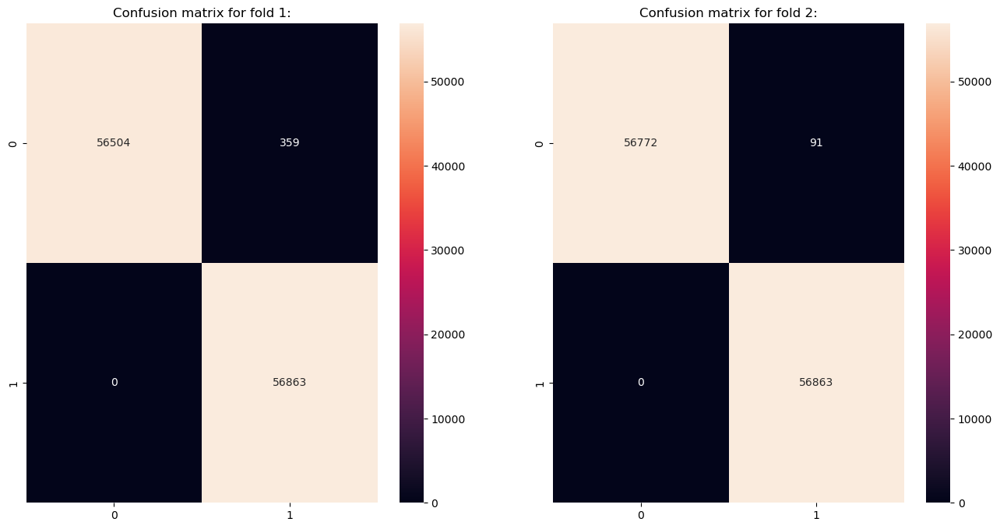

//////////////////////////////////////////////////////////////////////////////////


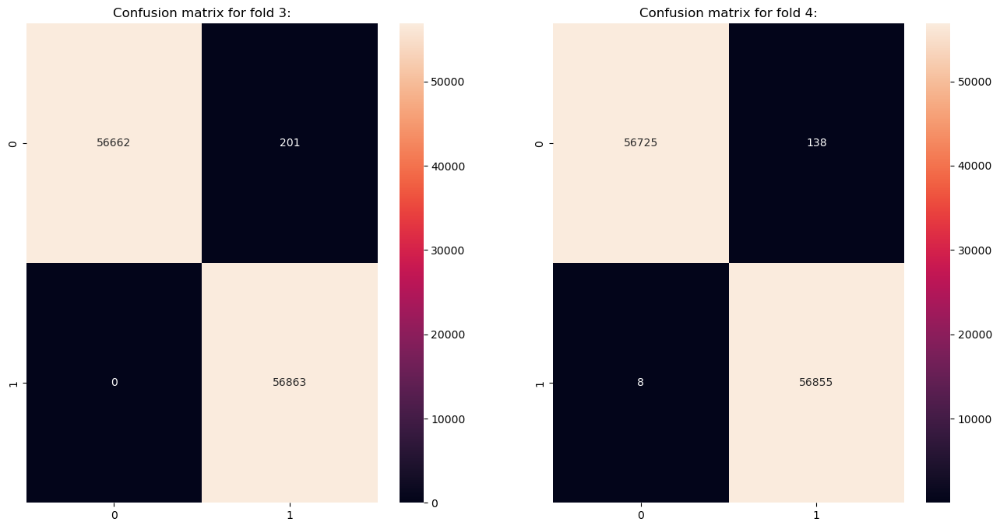

//////////////////////////////////////////////////////////////////////////////////


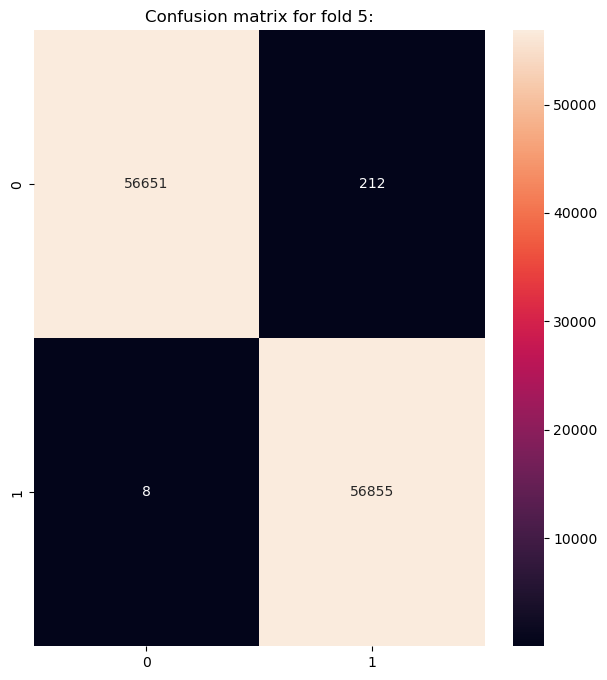

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


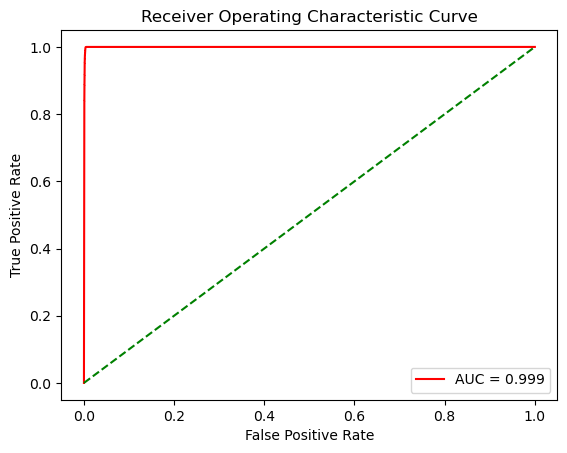

curve for fold 1:
AUC: 0.9995
//////////////////////////////////////////////////////////////////////////////////


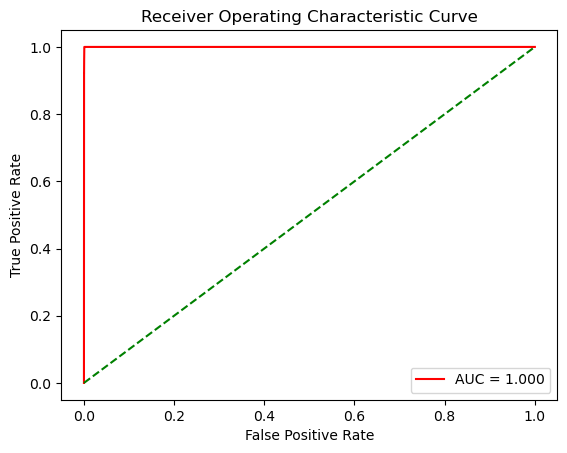

curve for fold 2:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


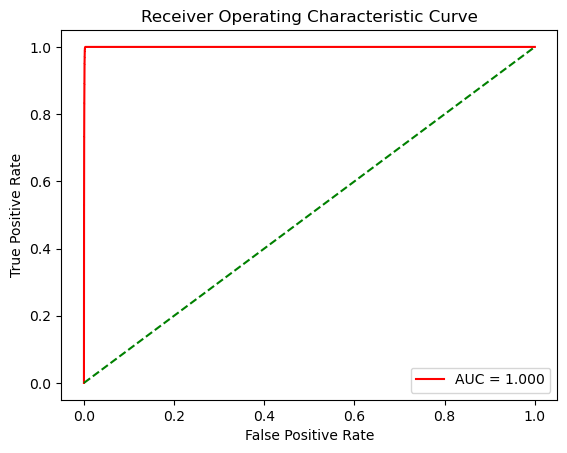

curve for fold 3:
AUC: 0.9996
//////////////////////////////////////////////////////////////////////////////////


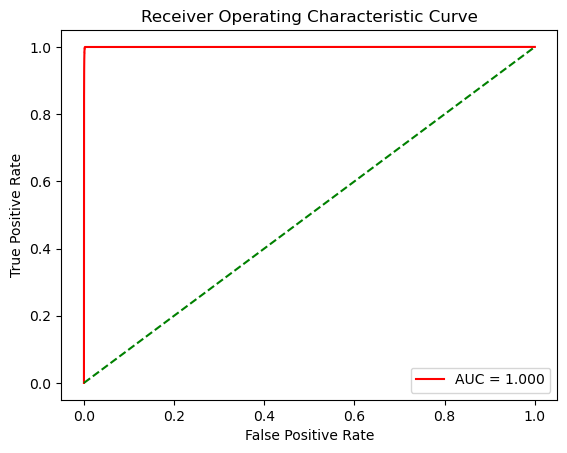

curve for fold 4:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


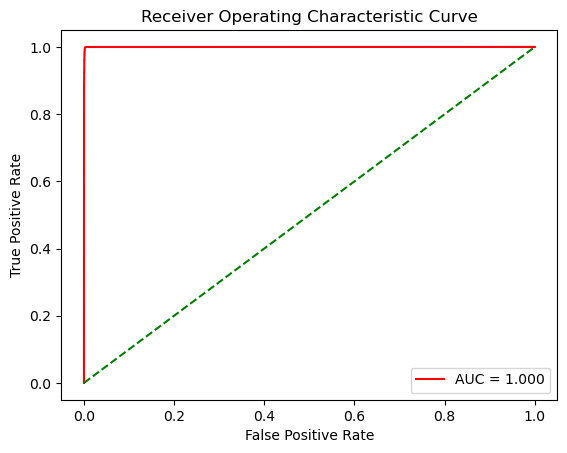

curve for fold 5:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


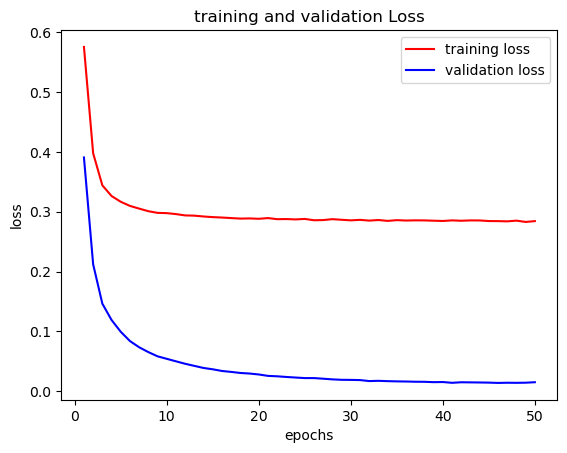

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


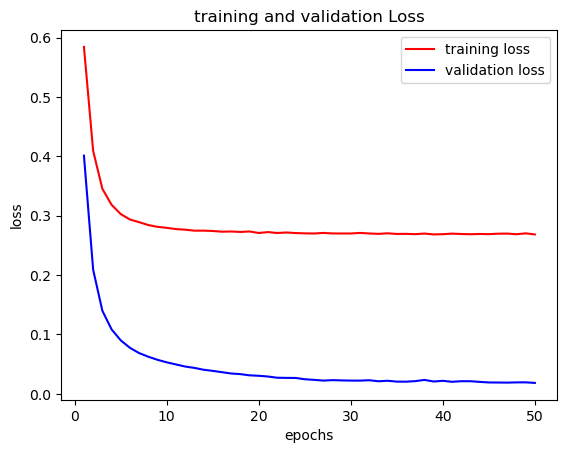

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


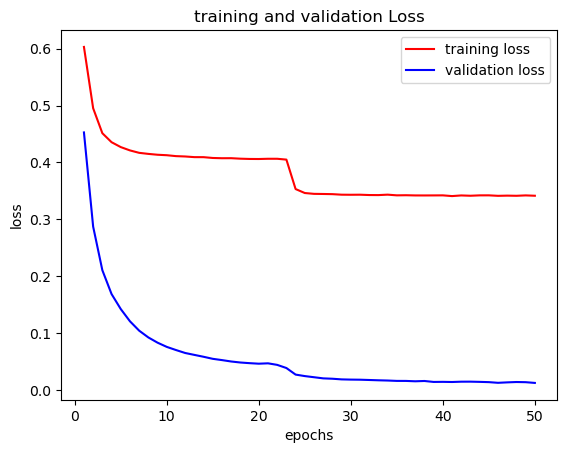

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


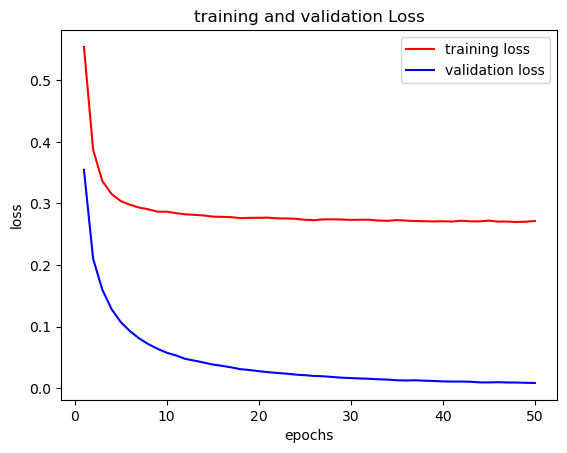

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


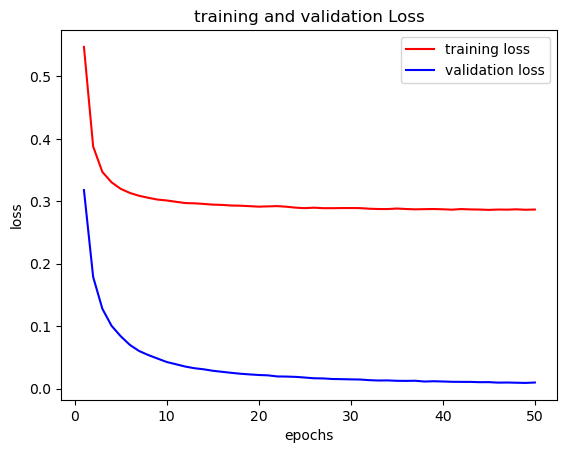

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [25]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

In [15]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.8)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 11s - loss: 0.6557 - accuracy: 0.5635 - val_loss: 0.6472 - val_accuracy: 0.6296 - 11s/epoch - 50ms/step
Epoch 2/50
228/228 - 3s - loss: 0.5715 - accuracy: 0.6168 - val_loss: 0.5539 - val_accuracy: 0.7669 - 3s/epoch - 12ms/step
Epoch 3/50
228/228 - 3s - loss: 0.5264 - accuracy: 0.6446 - val_loss: 0.5179 - val_accuracy: 0.7833 - 3s/epoch - 12ms/step
Epoch 4/50
228/228 - 3s - loss: 0.5111 - accuracy: 0.6530 - val_loss: 0.4795 - val_accuracy: 0.8125 - 3s/epoch - 12ms/step
Epoch 5/50
228/228 - 2s - loss: 0.5000 - accuracy: 0.6639 - val_loss: 0.4891 - val_accuracy: 0.8164 - 2s/epoch - 10ms/step
Epoch 6/50
228/228 - 2s - loss: 0.4633 - accuracy: 0.7124 - val_loss: 0.5798 - val_accuracy: 0.7451 - 2s/epoch - 8ms/step
Epoch 7/50
228/228 - 2s - loss: 0.4576 - accuracy: 0.7161 - val_loss: 0.5899 - val_accuracy: 0.7531 - 2s/epoch - 9ms/step
Epoch 8/50
228/228 - 3s - loss: 0.4556 - accuracy: 0.7180 - val_loss: 0.6260 - val_accuracy: 0.7458 - 3s/epoch - 12ms/step
Epoch 9/50
228/2

KeyboardInterrupt: 

In [82]:
from imblearn.over_sampling import ADASYN

# Assuming you have already loaded and prepared your dataset
X = dataset.drop('Class', axis=1)
y = dataset['Class']

# Instantiate the ADASYN sampler
adasyn = ADASYN(sampling_strategy='auto', random_state=42)

# Resample the dataset using ADASYN
X_res, y_res = adasyn.fit_resample(X, y)


Epoch 1/50
228/228 - 10s - loss: 0.6205 - accuracy: 0.6480 - val_loss: 0.4456 - val_accuracy: 0.9128 - 10s/epoch - 44ms/step
Epoch 2/50
228/228 - 2s - loss: 0.5135 - accuracy: 0.7727 - val_loss: 0.3549 - val_accuracy: 0.9409 - 2s/epoch - 7ms/step
Epoch 3/50
228/228 - 2s - loss: 0.4576 - accuracy: 0.8025 - val_loss: 0.3242 - val_accuracy: 0.9257 - 2s/epoch - 8ms/step
Epoch 4/50
228/228 - 2s - loss: 0.4308 - accuracy: 0.8128 - val_loss: 0.3008 - val_accuracy: 0.9254 - 2s/epoch - 9ms/step
Epoch 5/50
228/228 - 3s - loss: 0.4179 - accuracy: 0.8178 - val_loss: 0.2940 - val_accuracy: 0.9179 - 3s/epoch - 12ms/step
Epoch 6/50
228/228 - 3s - loss: 0.4066 - accuracy: 0.8238 - val_loss: 0.2841 - val_accuracy: 0.9204 - 3s/epoch - 13ms/step
Epoch 7/50
228/228 - 3s - loss: 0.4008 - accuracy: 0.8260 - val_loss: 0.2792 - val_accuracy: 0.9213 - 3s/epoch - 12ms/step
Epoch 8/50
228/228 - 3s - loss: 0.3965 - accuracy: 0.8279 - val_loss: 0.2779 - val_accuracy: 0.9218 - 3s/epoch - 12ms/step
Epoch 9/50
228/22

Epoch 13/50
228/228 - 3s - loss: 0.4502 - accuracy: 0.6765 - val_loss: 0.1768 - val_accuracy: 0.9560 - 3s/epoch - 13ms/step
Epoch 14/50
228/228 - 3s - loss: 0.4496 - accuracy: 0.6786 - val_loss: 0.1634 - val_accuracy: 0.9596 - 3s/epoch - 12ms/step
Epoch 15/50
228/228 - 3s - loss: 0.4494 - accuracy: 0.6780 - val_loss: 0.1586 - val_accuracy: 0.9620 - 3s/epoch - 13ms/step
Epoch 16/50
228/228 - 3s - loss: 0.4495 - accuracy: 0.6778 - val_loss: 0.1576 - val_accuracy: 0.9606 - 3s/epoch - 14ms/step
Epoch 17/50
228/228 - 3s - loss: 0.4488 - accuracy: 0.6781 - val_loss: 0.1484 - val_accuracy: 0.9623 - 3s/epoch - 14ms/step
Epoch 18/50
228/228 - 3s - loss: 0.4483 - accuracy: 0.6785 - val_loss: 0.1486 - val_accuracy: 0.9625 - 3s/epoch - 14ms/step
Epoch 19/50
228/228 - 3s - loss: 0.4483 - accuracy: 0.6793 - val_loss: 0.1462 - val_accuracy: 0.9601 - 3s/epoch - 13ms/step
Epoch 20/50
228/228 - 3s - loss: 0.4480 - accuracy: 0.6783 - val_loss: 0.1353 - val_accuracy: 0.9646 - 3s/epoch - 14ms/step
Epoch 21

Epoch 25/50
228/228 - 3s - loss: 0.3983 - accuracy: 0.7433 - val_loss: 0.4402 - val_accuracy: 0.8977 - 3s/epoch - 14ms/step
Epoch 26/50
228/228 - 3s - loss: 0.3986 - accuracy: 0.7434 - val_loss: 0.4440 - val_accuracy: 0.8978 - 3s/epoch - 15ms/step
Epoch 27/50
228/228 - 3s - loss: 0.3986 - accuracy: 0.7431 - val_loss: 0.4428 - val_accuracy: 0.8968 - 3s/epoch - 15ms/step
Epoch 28/50
228/228 - 3s - loss: 0.3979 - accuracy: 0.7432 - val_loss: 0.4352 - val_accuracy: 0.8969 - 3s/epoch - 14ms/step
Epoch 29/50
228/228 - 3s - loss: 0.3974 - accuracy: 0.7437 - val_loss: 0.4385 - val_accuracy: 0.8979 - 3s/epoch - 14ms/step
Epoch 30/50
228/228 - 3s - loss: 0.3966 - accuracy: 0.7441 - val_loss: 0.4535 - val_accuracy: 0.8954 - 3s/epoch - 14ms/step
Epoch 31/50
228/228 - 3s - loss: 0.3978 - accuracy: 0.7441 - val_loss: 0.4677 - val_accuracy: 0.8961 - 3s/epoch - 14ms/step
Epoch 32/50
228/228 - 3s - loss: 0.3979 - accuracy: 0.7432 - val_loss: 0.4724 - val_accuracy: 0.8965 - 3s/epoch - 15ms/step
Epoch 33

Epoch 37/50
228/228 - 3s - loss: 0.3982 - accuracy: 0.7435 - val_loss: 0.4208 - val_accuracy: 0.8925 - 3s/epoch - 14ms/step
Epoch 38/50
228/228 - 3s - loss: 0.3993 - accuracy: 0.7431 - val_loss: 0.4491 - val_accuracy: 0.8891 - 3s/epoch - 15ms/step
Epoch 39/50
228/228 - 3s - loss: 0.4002 - accuracy: 0.7427 - val_loss: 0.4474 - val_accuracy: 0.8868 - 3s/epoch - 13ms/step
Epoch 40/50
228/228 - 3s - loss: 0.3981 - accuracy: 0.7438 - val_loss: 0.4657 - val_accuracy: 0.8816 - 3s/epoch - 14ms/step
Epoch 41/50
228/228 - 3s - loss: 0.3993 - accuracy: 0.7422 - val_loss: 0.4823 - val_accuracy: 0.8811 - 3s/epoch - 13ms/step
Epoch 42/50
228/228 - 3s - loss: 0.3986 - accuracy: 0.7434 - val_loss: 0.4719 - val_accuracy: 0.8831 - 3s/epoch - 13ms/step
Epoch 43/50
228/228 - 3s - loss: 0.3972 - accuracy: 0.7443 - val_loss: 0.4858 - val_accuracy: 0.8814 - 3s/epoch - 13ms/step
Epoch 44/50
228/228 - 3s - loss: 0.3989 - accuracy: 0.7424 - val_loss: 0.4874 - val_accuracy: 0.8793 - 3s/epoch - 13ms/step
Epoch 45

Epoch 49/50
228/228 - 3s - loss: 0.4271 - accuracy: 0.7953 - val_loss: 0.2644 - val_accuracy: 0.9370 - 3s/epoch - 15ms/step
Epoch 50/50
228/228 - 3s - loss: 0.4289 - accuracy: 0.7939 - val_loss: 0.2679 - val_accuracy: 0.9348 - 3s/epoch - 15ms/step
3554/3554 [==============================] - 16s 4ms/step
first fold
mcc for fold 5: 0.8756
accuracy for fold 5: 0.9348
precision for fold 5: 0.9930
recall for fold 5: 0.8757
bcr for fold 5: 0.9347
3554/3554 [==============================] - 13s 4ms/step
Training Accuracy: 0.9991602254640743
Testing Accuracy: 0.9347525962663008
Training Accuracy: 0.9984632272228321
Testing Accuracy: 0.9929996011168728
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9148917086553935
precision: 0.994826319555362
recall: 0.8341376763164374
bcr: 0.9148881582785078
mcc: 0.841807860409

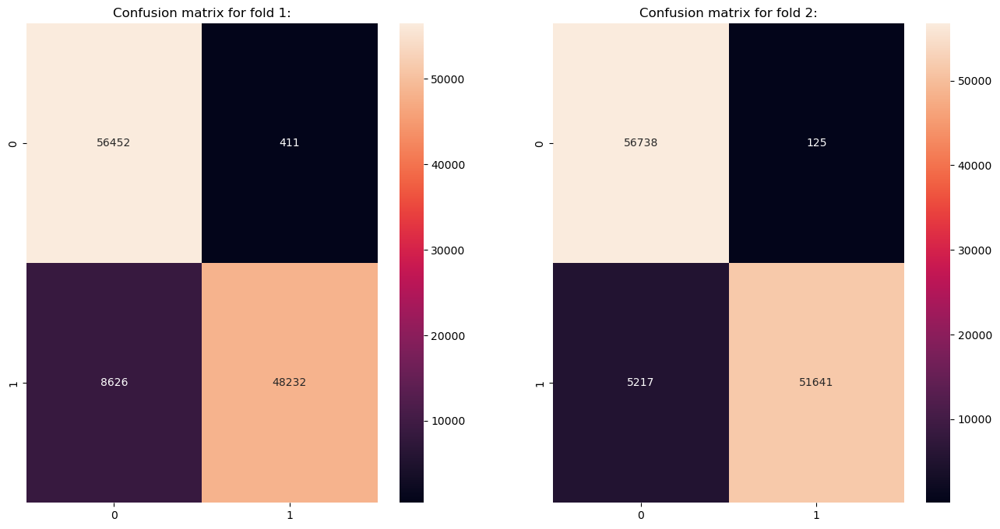

//////////////////////////////////////////////////////////////////////////////////


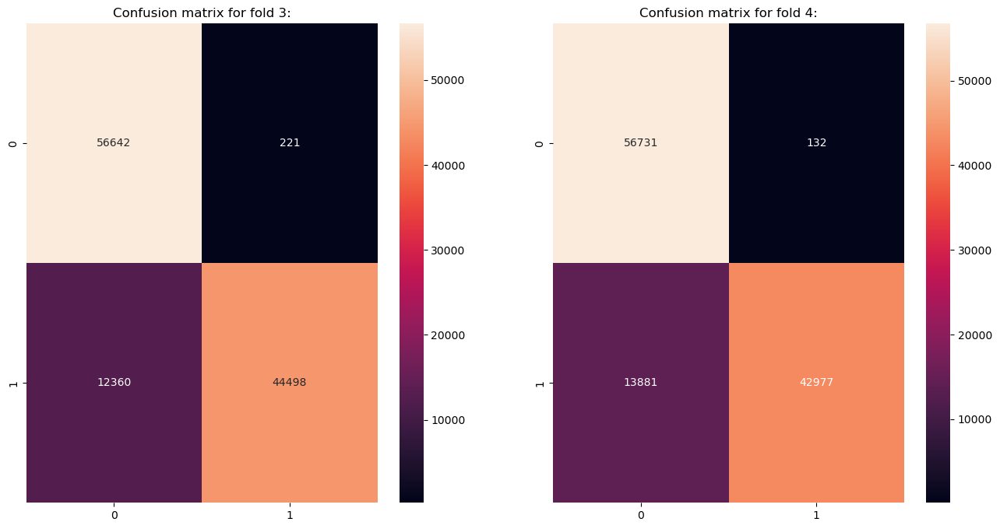

//////////////////////////////////////////////////////////////////////////////////


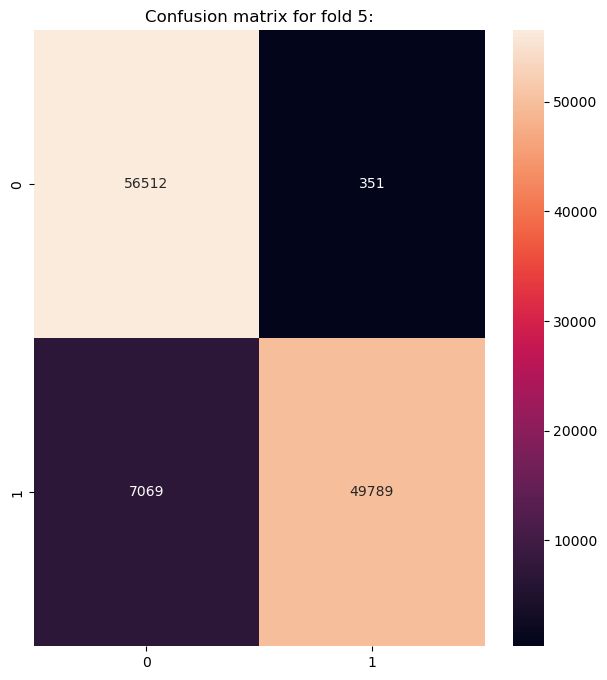

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


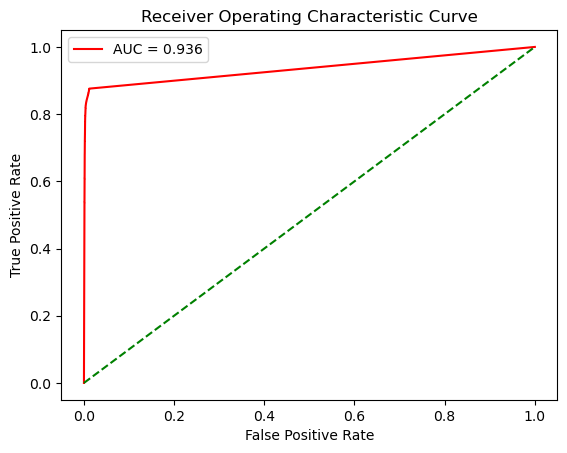

curve for fold 1:
AUC: 0.9360
//////////////////////////////////////////////////////////////////////////////////


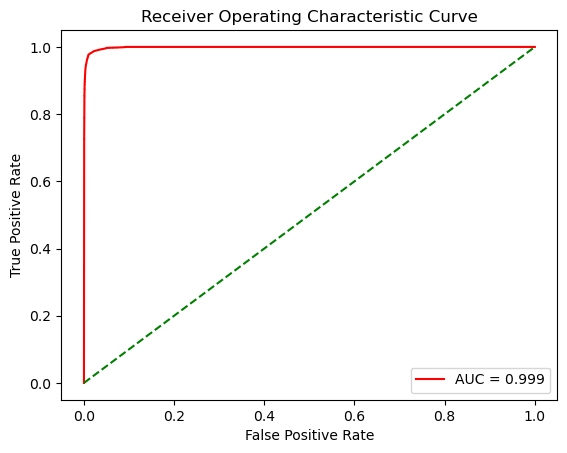

curve for fold 2:
AUC: 0.9986
//////////////////////////////////////////////////////////////////////////////////


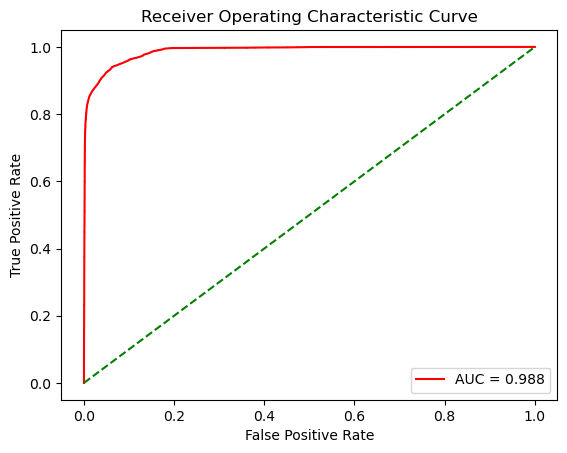

curve for fold 3:
AUC: 0.9876
//////////////////////////////////////////////////////////////////////////////////


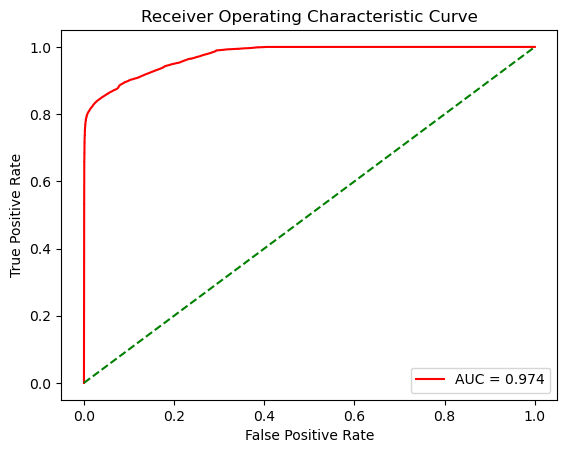

curve for fold 4:
AUC: 0.9740
//////////////////////////////////////////////////////////////////////////////////


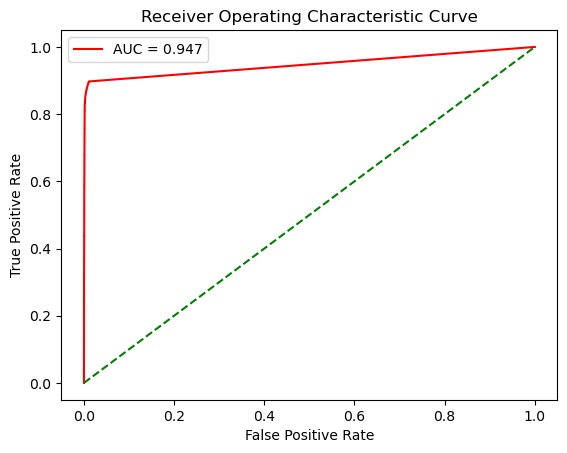

curve for fold 5:
AUC: 0.9473
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


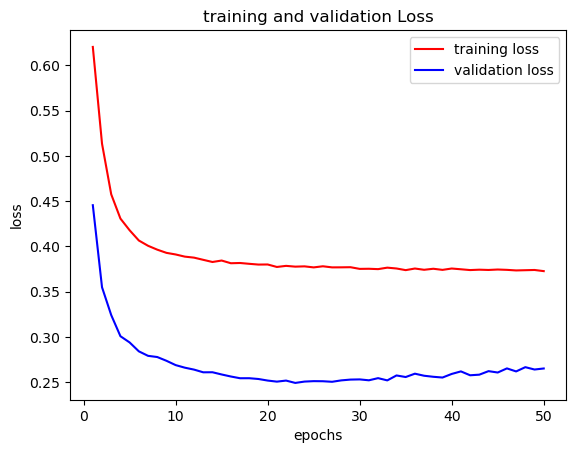

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


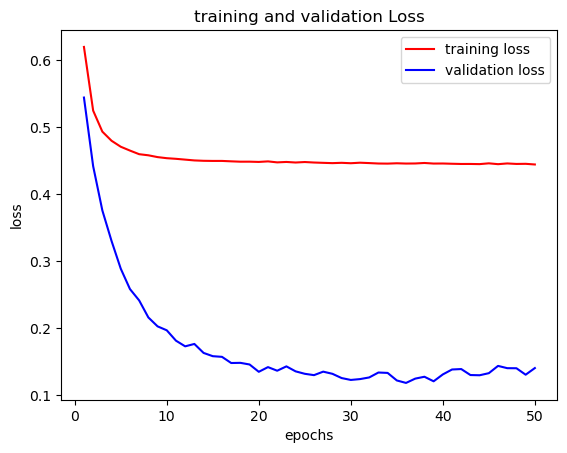

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


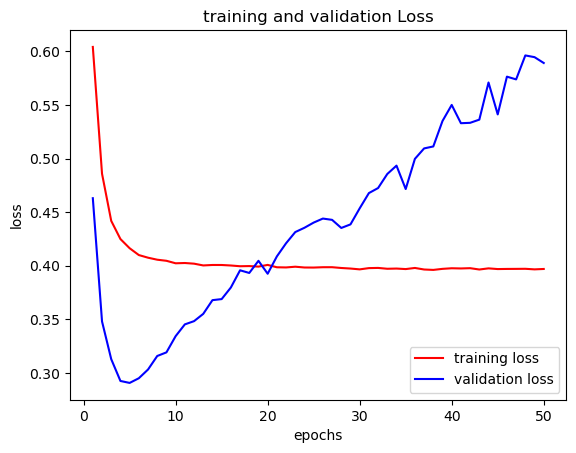

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


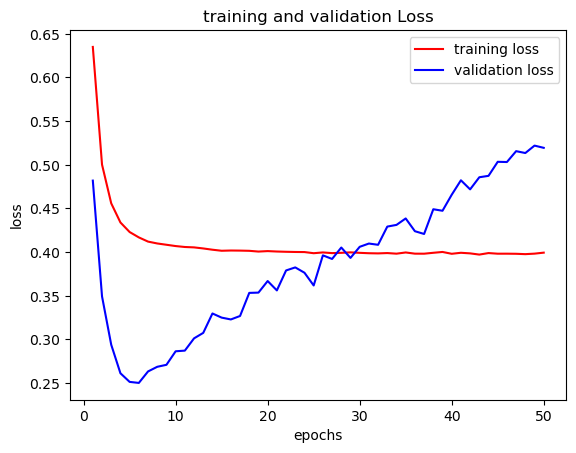

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


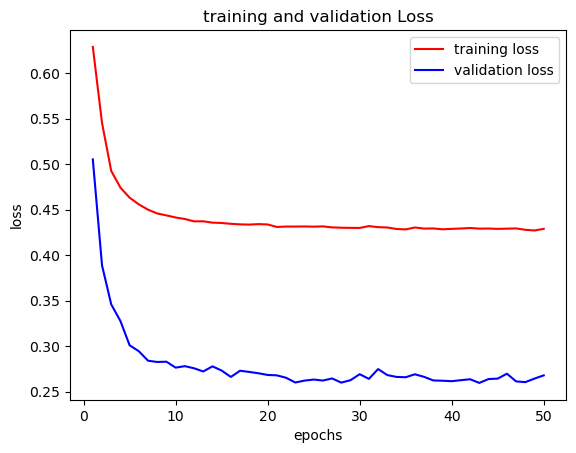

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [12]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.8)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

In [13]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.8)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=2, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/2
143/143 - 12s - loss: 0.6420 - accuracy: 0.5865 - val_loss: 0.5374 - val_accuracy: 0.8996 - 12s/epoch - 84ms/step
Epoch 2/2
143/143 - 2s - loss: 0.5340 - accuracy: 0.6493 - val_loss: 0.4605 - val_accuracy: 0.8701 - 2s/epoch - 15ms/step
8885/8885 [==============================] - 26s 3ms/step
first fold
mcc for fold 1: 0.7433
accuracy for fold 1: 0.8701
precision for fold 1: 0.8396
recall for fold 1: 0.9151
bcr for fold 1: 0.8701
8885/8885 [==============================] - 27s 3ms/step
Training Accuracy: 0.9535796563670577
Testing Accuracy: 0.8701369959376044
Training Accuracy: 0.9938649836859117
Testing Accuracy: 0.8396233113232513
////////////////////////////////////////////////////////////////////////////////////////////////////////////
Epoch 1/2
143/143 - 12s - loss: 0.6394 - accuracy: 0.5616 - val_loss: 0.4994 - val_accuracy: 0.9232 - 12s/epoch - 83ms/step
Epoch 2/2
143/143 - 2s - loss: 0.5502 - accuracy: 0.6514 - val_loss: 0.4359 - val_accuracy: 0.8776 - 2s/epoch - 13m

KeyboardInterrupt: 

In [23]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.5838 - accuracy: 0.6824 - 5s/epoch - 41ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5166 - accuracy: 0.7602 - 691ms/epoch - 6ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4853 - accuracy: 0.7730 - 672ms/epoch - 6ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4457 - accuracy: 0.7767 - 632ms/epoch - 6ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4273 - accuracy: 0.7788 - 723ms/epoch - 6ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4175 - accuracy: 0.7829 - 693ms/epoch - 6ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4128 - accuracy: 0.7837 - 730ms/epoch - 6ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4088 - accuracy: 0.7865 - 674ms/epoch - 6ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4079 - accuracy: 0.7860 - 700ms/epoch - 6ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4060 - accuracy: 0.7871 - 626ms/epoch - 5ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4045 - accuracy: 0.7872 - 668ms/epoch - 6ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4035 - accuracy: 0.7882 - 771ms/epoch - 7ms/step
Epo

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 6s - loss: 0.6110 - accuracy: 0.6282 - 6s/epoch - 52ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5194 - accuracy: 0.7120 - 1s/epoch - 9ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4677 - accuracy: 0.7275 - 1s/epoch - 10ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4438 - accuracy: 0.7296 - 1s/epoch - 9ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4332 - accuracy: 0.7313 - 1s/epoch - 10ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4259 - accuracy: 0.7339 - 1s/epoch - 9ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4221 - accuracy: 0.7352 - 1s/epoch - 9ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4206 - accuracy: 0.7346 - 1s/epoch - 10ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4160 - accuracy: 0.7375 - 940ms/epoch - 8ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4135 - accuracy: 0.7377 - 908ms/epoch - 8ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4123 - accuracy: 0.7384 - 984ms/epoch - 9ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4103 - accuracy: 0.7389 - 973ms/epoch - 9ms/step
Epoch 13/50
114/114 -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.6470 - accuracy: 0.6122 - 5s/epoch - 45ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5450 - accuracy: 0.7209 - 1s/epoch - 13ms/step
Epoch 3/50
114/114 - 2s - loss: 0.4760 - accuracy: 0.7622 - 2s/epoch - 14ms/step
Epoch 4/50
114/114 - 2s - loss: 0.4446 - accuracy: 0.7720 - 2s/epoch - 14ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4307 - accuracy: 0.7767 - 1s/epoch - 12ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4238 - accuracy: 0.7784 - 867ms/epoch - 8ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4188 - accuracy: 0.7806 - 906ms/epoch - 8ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4144 - accuracy: 0.7820 - 894ms/epoch - 8ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4117 - accuracy: 0.7836 - 898ms/epoch - 8ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4076 - accuracy: 0.7852 - 908ms/epoch - 8ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4062 - accuracy: 0.7859 - 1s/epoch - 9ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4029 - accuracy: 0.7877 - 1s/epoch - 12ms/step
Epoch 13/50
114/

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 4s - loss: 0.6484 - accuracy: 0.6319 - 4s/epoch - 38ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5482 - accuracy: 0.7030 - 1s/epoch - 10ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4947 - accuracy: 0.7428 - 1s/epoch - 11ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4530 - accuracy: 0.7716 - 1s/epoch - 11ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4314 - accuracy: 0.7777 - 915ms/epoch - 8ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4217 - accuracy: 0.7813 - 914ms/epoch - 8ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4138 - accuracy: 0.7852 - 677ms/epoch - 6ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4100 - accuracy: 0.7874 - 668ms/epoch - 6ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4079 - accuracy: 0.7868 - 683ms/epoch - 6ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4042 - accuracy: 0.7886 - 633ms/epoch - 6ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4029 - accuracy: 0.7886 - 682ms/epoch - 6ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4003 - accuracy: 0.7893 - 654ms/epoch - 6ms/step
Epoch 13/

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.6132 - accuracy: 0.6137 - 5s/epoch - 40ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5806 - accuracy: 0.6589 - 610ms/epoch - 5ms/step
Epoch 3/50
114/114 - 1s - loss: 0.5684 - accuracy: 0.6693 - 628ms/epoch - 6ms/step
Epoch 4/50
114/114 - 1s - loss: 0.5231 - accuracy: 0.7202 - 624ms/epoch - 5ms/step
Epoch 5/50
114/114 - 1s - loss: 0.5089 - accuracy: 0.7278 - 1s/epoch - 10ms/step
Epoch 6/50
114/114 - 1s - loss: 0.5037 - accuracy: 0.7315 - 1s/epoch - 10ms/step
Epoch 7/50
114/114 - 1s - loss: 0.5009 - accuracy: 0.7335 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4997 - accuracy: 0.7345 - 810ms/epoch - 7ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4978 - accuracy: 0.7358 - 692ms/epoch - 6ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4974 - accuracy: 0.7358 - 660ms/epoch - 6ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4973 - accuracy: 0.7357 - 660ms/epoch - 6ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4946 - accuracy: 0.7378 - 663ms/epoch - 6ms/step
Epoch 13/

In [24]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.6334 - accuracy: 0.5876 - 5s/epoch - 46ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5546 - accuracy: 0.6501 - 880ms/epoch - 8ms/step
Epoch 3/50
114/114 - 1s - loss: 0.5132 - accuracy: 0.6557 - 823ms/epoch - 7ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4687 - accuracy: 0.6739 - 864ms/epoch - 8ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4468 - accuracy: 0.7227 - 827ms/epoch - 7ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4356 - accuracy: 0.7267 - 878ms/epoch - 8ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4255 - accuracy: 0.7317 - 986ms/epoch - 9ms/step
Epoch 8/50
114/114 - 2s - loss: 0.4199 - accuracy: 0.7342 - 2s/epoch - 13ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4157 - accuracy: 0.7354 - 1s/epoch - 12ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4135 - accuracy: 0.7366 - 1s/epoch - 11ms/step
Epoch 11/50
114/114 - 2s - loss: 0.4093 - accuracy: 0.7381 - 2s/epoch - 14ms/step
Epoch 12/50
114/114 - 2s - loss: 0.4073 - accuracy: 0.7407 - 2s/epoch - 13ms/step
Epoch 13/50
1

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.6704 - accuracy: 0.5357 - 5s/epoch - 46ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5730 - accuracy: 0.6634 - 1s/epoch - 12ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4986 - accuracy: 0.7007 - 1s/epoch - 12ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4625 - accuracy: 0.7130 - 1s/epoch - 11ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4439 - accuracy: 0.7224 - 1s/epoch - 11ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4341 - accuracy: 0.7279 - 760ms/epoch - 7ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4254 - accuracy: 0.7322 - 781ms/epoch - 7ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4210 - accuracy: 0.7338 - 794ms/epoch - 7ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4176 - accuracy: 0.7349 - 805ms/epoch - 7ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4148 - accuracy: 0.7357 - 777ms/epoch - 7ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4105 - accuracy: 0.7384 - 789ms/epoch - 7ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4108 - accuracy: 0.7377 - 896ms/epoch - 8ms/step
Epoch 13/50

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.6286 - accuracy: 0.5845 - 5s/epoch - 42ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5390 - accuracy: 0.6499 - 715ms/epoch - 6ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4797 - accuracy: 0.6845 - 716ms/epoch - 6ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4496 - accuracy: 0.7149 - 742ms/epoch - 7ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4337 - accuracy: 0.7260 - 1s/epoch - 10ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4258 - accuracy: 0.7308 - 1s/epoch - 11ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4207 - accuracy: 0.7339 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4176 - accuracy: 0.7344 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4149 - accuracy: 0.7354 - 1s/epoch - 11ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4141 - accuracy: 0.7355 - 1s/epoch - 11ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4108 - accuracy: 0.7377 - 1s/epoch - 11ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4107 - accuracy: 0.7373 - 1s/epoch - 11ms/step
Epoch 13/50
114/114

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 6s - loss: 0.6345 - accuracy: 0.6028 - 6s/epoch - 50ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5840 - accuracy: 0.6560 - 805ms/epoch - 7ms/step
Epoch 3/50
114/114 - 1s - loss: 0.5513 - accuracy: 0.6953 - 720ms/epoch - 6ms/step
Epoch 4/50
114/114 - 1s - loss: 0.5082 - accuracy: 0.7220 - 752ms/epoch - 7ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4845 - accuracy: 0.7255 - 956ms/epoch - 8ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4753 - accuracy: 0.7281 - 840ms/epoch - 7ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4695 - accuracy: 0.7302 - 993ms/epoch - 9ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4687 - accuracy: 0.7301 - 931ms/epoch - 8ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4647 - accuracy: 0.7317 - 684ms/epoch - 6ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4611 - accuracy: 0.7341 - 627ms/epoch - 6ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4599 - accuracy: 0.7341 - 669ms/epoch - 6ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4584 - accuracy: 0.7345 - 631ms/epoch - 6ms/step
Epo

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 5s - loss: 0.5656 - accuracy: 0.6958 - 5s/epoch - 47ms/step
Epoch 2/50
114/114 - 1s - loss: 0.4929 - accuracy: 0.7846 - 1s/epoch - 12ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4626 - accuracy: 0.8020 - 1s/epoch - 12ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4437 - accuracy: 0.8087 - 1s/epoch - 9ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4290 - accuracy: 0.8137 - 766ms/epoch - 7ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4186 - accuracy: 0.8174 - 766ms/epoch - 7ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4132 - accuracy: 0.8167 - 774ms/epoch - 7ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4066 - accuracy: 0.8191 - 1s/epoch - 9ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4036 - accuracy: 0.8195 - 831ms/epoch - 7ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4003 - accuracy: 0.8208 - 730ms/epoch - 6ms/step
Epoch 11/50
114/114 - 1s - loss: 0.3987 - accuracy: 0.8215 - 769ms/epoch - 7ms/step
Epoch 12/50
114/114 - 1s - loss: 0.3943 - accuracy: 0.8248 - 765ms/epoch - 7ms/step
Epoch 13/50
1

In [ ]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

In [17]:
from imblearn.over_sampling import SMOTE
print("avant l'utilisation du SMOTE")
counts = dataset['Class'].value_counts()
print(counts)
print("après l'utilisation du SMOTE")
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(dataset.drop('Class', axis=1), dataset['Class'])
counts = y_res.value_counts()
counts

avant l'utilisation du SMOTE
0    284315
1       492
Name: Class, dtype: int64
après l'utilisation du SMOTE


0    284315
1    284315
Name: Class, dtype: int64

In [72]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
df=dataset
for column_name in dataset.columns:
    if column_name=='Class':
        break
    time_scaler = StandardScaler()
    df[column_name] = time_scaler.fit_transform(df[[column_name]])
dataset=df

In [36]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 8s - loss: 0.6267 - accuracy: 0.6075 - 8s/epoch - 67ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5086 - accuracy: 0.6925 - 1s/epoch - 11ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4566 - accuracy: 0.7173 - 1s/epoch - 11ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4331 - accuracy: 0.7284 - 1s/epoch - 11ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4201 - accuracy: 0.7338 - 1s/epoch - 11ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4131 - accuracy: 0.7368 - 1s/epoch - 11ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4100 - accuracy: 0.7385 - 1s/epoch - 10ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4079 - accuracy: 0.7391 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4043 - accuracy: 0.7413 - 1s/epoch - 11ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4044 - accuracy: 0.7405 - 1s/epoch - 12ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4035 - accuracy: 0.7413 - 1s/epoch - 11ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4035 - accuracy: 0.7404 - 1s/epoch - 12ms/step
Epoch 13/50
114/114 - 1s 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 9s - loss: 0.6267 - accuracy: 0.6757 - 9s/epoch - 78ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5170 - accuracy: 0.7589 - 1s/epoch - 11ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4606 - accuracy: 0.7713 - 1s/epoch - 10ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4354 - accuracy: 0.7776 - 739ms/epoch - 6ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4248 - accuracy: 0.7802 - 1s/epoch - 11ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4168 - accuracy: 0.7830 - 1s/epoch - 11ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4101 - accuracy: 0.7866 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4070 - accuracy: 0.7876 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4054 - accuracy: 0.7877 - 1s/epoch - 11ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4031 - accuracy: 0.7887 - 1s/epoch - 10ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4003 - accuracy: 0.7907 - 1s/epoch - 10ms/step
Epoch 12/50
114/114 - 1s - loss: 0.3995 - accuracy: 0.7912 - 1s/epoch - 11ms/step
Epoch 13/50
114/114 - 1

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 6s - loss: 0.6279 - accuracy: 0.6490 - 6s/epoch - 53ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5224 - accuracy: 0.7623 - 1s/epoch - 10ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4654 - accuracy: 0.7721 - 1s/epoch - 10ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4384 - accuracy: 0.7781 - 1s/epoch - 10ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4280 - accuracy: 0.7791 - 1s/epoch - 10ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4211 - accuracy: 0.7808 - 933ms/epoch - 8ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4149 - accuracy: 0.7834 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4109 - accuracy: 0.7861 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4084 - accuracy: 0.7866 - 1s/epoch - 10ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4068 - accuracy: 0.7869 - 1s/epoch - 10ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4038 - accuracy: 0.7889 - 1s/epoch - 10ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4017 - accuracy: 0.7898 - 1s/epoch - 10ms/step
Epoch 13/50
114/114 - 1

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 8s - loss: 0.6702 - accuracy: 0.6006 - 8s/epoch - 71ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5585 - accuracy: 0.7264 - 1s/epoch - 12ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4763 - accuracy: 0.7666 - 1s/epoch - 12ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4450 - accuracy: 0.7752 - 1s/epoch - 12ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4312 - accuracy: 0.7786 - 1s/epoch - 12ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4218 - accuracy: 0.7814 - 1s/epoch - 12ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4156 - accuracy: 0.7836 - 1s/epoch - 10ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4097 - accuracy: 0.7862 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4053 - accuracy: 0.7884 - 1s/epoch - 12ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4027 - accuracy: 0.7893 - 1s/epoch - 13ms/step
Epoch 11/50
114/114 - 2s - loss: 0.4004 - accuracy: 0.7901 - 2s/epoch - 14ms/step
Epoch 12/50
114/114 - 1s - loss: 0.3995 - accuracy: 0.7901 - 1s/epoch - 12ms/step
Epoch 13/50
114/114 - 2s 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 7s - loss: 0.6397 - accuracy: 0.5875 - 7s/epoch - 65ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5549 - accuracy: 0.7068 - 1s/epoch - 13ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4999 - accuracy: 0.7610 - 1s/epoch - 12ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4584 - accuracy: 0.7727 - 1s/epoch - 13ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4371 - accuracy: 0.7778 - 1s/epoch - 13ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4253 - accuracy: 0.7807 - 1s/epoch - 13ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4177 - accuracy: 0.7822 - 1s/epoch - 12ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4116 - accuracy: 0.7847 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4040 - accuracy: 0.7892 - 1s/epoch - 12ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4032 - accuracy: 0.7883 - 1s/epoch - 13ms/step
Epoch 11/50
114/114 - 1s - loss: 0.3989 - accuracy: 0.7905 - 1s/epoch - 13ms/step
Epoch 12/50
114/114 - 1s - loss: 0.3960 - accuracy: 0.7925 - 1s/epoch - 11ms/step
Epoch 13/50
114/114 - 1s 

In [46]:
dataset

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000000,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,0.005824,0
1,0.000000,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,0.000105,0
2,0.000006,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,0.014739,0
3,0.000006,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,0.004807,0
4,0.000012,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,0.002724,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,0.999965,0.756448,0.873531,0.666991,0.160317,0.729603,0.236810,0.235393,0.863749,0.528729,...,0.564920,0.515249,0.680500,0.313600,0.658558,0.466291,0.433929,0.329840,0.000030,0
284803,0.999971,0.945845,0.766677,0.872678,0.219189,0.771561,0.273661,0.265504,0.788548,0.482925,...,0.564933,0.553153,0.665619,0.245298,0.543855,0.360884,0.417775,0.312038,0.000965,0
284804,0.999977,0.990905,0.764080,0.781102,0.227202,0.783425,0.293496,0.263547,0.792985,0.477677,...,0.565220,0.537005,0.664877,0.468492,0.592824,0.411177,0.416593,0.312585,0.002642,0
284805,0.999977,0.954209,0.772856,0.849587,0.282508,0.763172,0.269291,0.261175,0.792671,0.476287,...,0.565755,0.547353,0.663008,0.398836,0.545958,0.514746,0.418520,0.315245,0.000389,0


In [45]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
df=dataset
for column_name in dataset.columns:
    if column_name=='Class':
        break
    min_value = df[column_name].min()
    max_value = df[column_name].max()
    df[column_name] = (df[column_name] - min_value) / (max_value - min_value)
dataset=df

In [48]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 8s - loss: 0.6291 - accuracy: 0.6207 - 8s/epoch - 70ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5211 - accuracy: 0.7148 - 1s/epoch - 9ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4622 - accuracy: 0.7268 - 954ms/epoch - 8ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4398 - accuracy: 0.7299 - 921ms/epoch - 8ms/step
Epoch 5/50
114/114 - 2s - loss: 0.4268 - accuracy: 0.7340 - 2s/epoch - 14ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4228 - accuracy: 0.7336 - 1s/epoch - 13ms/step
Epoch 7/50
114/114 - 2s - loss: 0.4172 - accuracy: 0.7360 - 2s/epoch - 14ms/step
Epoch 8/50
114/114 - 2s - loss: 0.4139 - accuracy: 0.7365 - 2s/epoch - 14ms/step
Epoch 9/50
114/114 - 2s - loss: 0.4115 - accuracy: 0.7387 - 2s/epoch - 14ms/step
Epoch 10/50
114/114 - 2s - loss: 0.4097 - accuracy: 0.7379 - 2s/epoch - 13ms/step
Epoch 11/50
114/114 - 2s - loss: 0.4090 - accuracy: 0.7386 - 2s/epoch - 14ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4073 - accuracy: 0.7383 - 1s/epoch - 11ms/step
Epoch 13/50
114/114 - 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 9s - loss: 0.6035 - accuracy: 0.6456 - 9s/epoch - 81ms/step
Epoch 2/50
114/114 - 1s - loss: 0.4946 - accuracy: 0.7174 - 1s/epoch - 10ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4553 - accuracy: 0.7249 - 1s/epoch - 12ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4390 - accuracy: 0.7282 - 1s/epoch - 11ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4303 - accuracy: 0.7304 - 927ms/epoch - 8ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4244 - accuracy: 0.7331 - 1s/epoch - 10ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4198 - accuracy: 0.7337 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4182 - accuracy: 0.7330 - 1s/epoch - 9ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4143 - accuracy: 0.7360 - 1s/epoch - 11ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4124 - accuracy: 0.7369 - 1s/epoch - 12ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4104 - accuracy: 0.7380 - 1s/epoch - 11ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4096 - accuracy: 0.7389 - 1s/epoch - 10ms/step
Epoch 13/50
114/114 - 1s

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 9s - loss: 0.6568 - accuracy: 0.5389 - 9s/epoch - 76ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5696 - accuracy: 0.6609 - 1s/epoch - 13ms/step
Epoch 3/50
114/114 - 1s - loss: 0.5108 - accuracy: 0.7193 - 1s/epoch - 13ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4848 - accuracy: 0.7270 - 1s/epoch - 13ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4724 - accuracy: 0.7317 - 1s/epoch - 13ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4369 - accuracy: 0.7779 - 1s/epoch - 13ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4188 - accuracy: 0.7833 - 1s/epoch - 13ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4103 - accuracy: 0.7865 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4060 - accuracy: 0.7878 - 1s/epoch - 12ms/step
Epoch 10/50
114/114 - 2s - loss: 0.4025 - accuracy: 0.7895 - 2s/epoch - 13ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4005 - accuracy: 0.7900 - 1s/epoch - 13ms/step
Epoch 12/50
114/114 - 1s - loss: 0.3976 - accuracy: 0.7915 - 1s/epoch - 13ms/step
Epoch 13/50
114/114 - 1s 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 9s - loss: 0.6371 - accuracy: 0.5850 - 9s/epoch - 80ms/step
Epoch 2/50
114/114 - 1s - loss: 0.5247 - accuracy: 0.6979 - 1s/epoch - 12ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4634 - accuracy: 0.7193 - 1s/epoch - 13ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4427 - accuracy: 0.7246 - 1s/epoch - 12ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4303 - accuracy: 0.7297 - 1s/epoch - 9ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4244 - accuracy: 0.7312 - 1s/epoch - 10ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4189 - accuracy: 0.7340 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4163 - accuracy: 0.7349 - 1s/epoch - 12ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4127 - accuracy: 0.7365 - 1s/epoch - 10ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4128 - accuracy: 0.7361 - 1s/epoch - 12ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4106 - accuracy: 0.7377 - 1s/epoch - 12ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4093 - accuracy: 0.7381 - 1s/epoch - 12ms/step
Epoch 13/50
114/114 - 1s -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
114/114 - 7s - loss: 0.6048 - accuracy: 0.6574 - 7s/epoch - 63ms/step
Epoch 2/50
114/114 - 1s - loss: 0.4938 - accuracy: 0.7603 - 1s/epoch - 11ms/step
Epoch 3/50
114/114 - 1s - loss: 0.4519 - accuracy: 0.7699 - 1s/epoch - 11ms/step
Epoch 4/50
114/114 - 1s - loss: 0.4327 - accuracy: 0.7769 - 1s/epoch - 11ms/step
Epoch 5/50
114/114 - 1s - loss: 0.4235 - accuracy: 0.7793 - 1s/epoch - 11ms/step
Epoch 6/50
114/114 - 1s - loss: 0.4177 - accuracy: 0.7818 - 1s/epoch - 11ms/step
Epoch 7/50
114/114 - 1s - loss: 0.4144 - accuracy: 0.7830 - 1s/epoch - 11ms/step
Epoch 8/50
114/114 - 1s - loss: 0.4103 - accuracy: 0.7859 - 1s/epoch - 11ms/step
Epoch 9/50
114/114 - 1s - loss: 0.4090 - accuracy: 0.7856 - 1s/epoch - 11ms/step
Epoch 10/50
114/114 - 1s - loss: 0.4063 - accuracy: 0.7872 - 1s/epoch - 11ms/step
Epoch 11/50
114/114 - 1s - loss: 0.4040 - accuracy: 0.7890 - 1s/epoch - 9ms/step
Epoch 12/50
114/114 - 1s - loss: 0.4031 - accuracy: 0.7890 - 1s/epoch - 11ms/step
Epoch 13/50
114/114 - 1s -

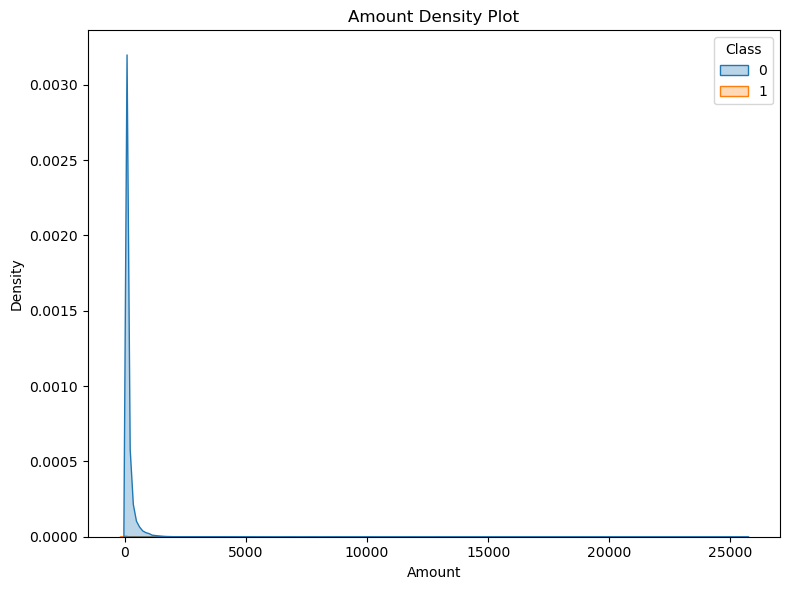

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

# Choose the variable you want to create a density plot for
variable_to_plot = 'Amount'

fig, ax = plt.subplots(figsize=(8, 6))  # Create a single subplot

# Create a density plot (KDE) for the selected variable
sns.kdeplot(x=variable_to_plot, data=dataset, hue='Class', fill=True, alpha=0.3, ax=ax)

ax.set_title(f'{variable_to_plot} Density Plot')
ax.set_xlabel(variable_to_plot)
ax.set_ylabel('Density')

plt.tight_layout()
plt.show()


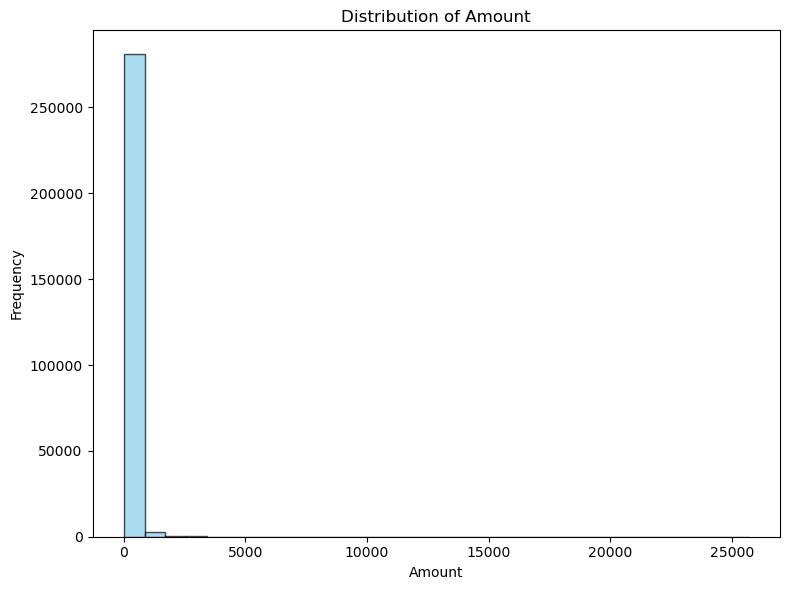

In [64]:
import matplotlib.pyplot as plt

# Create a histogram for the 'Amount' variable
plt.figure(figsize=(8, 6))
plt.hist(dataset['Amount'], bins=30, edgecolor='k', color='skyblue', alpha=0.7)

plt.title('Distribution of Amount')
plt.xlabel('Amount')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


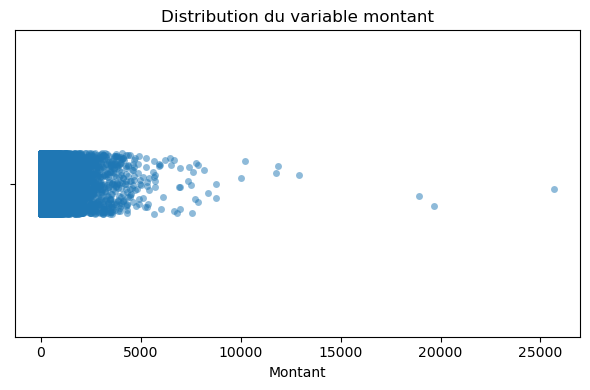

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))
sns.stripplot(x='Amount', data=dataset, jitter=True, alpha=0.5)

plt.title('Distribution du variable montant')
plt.xlabel('Montant')
plt.ylabel('')

plt.tight_layout()
plt.show()


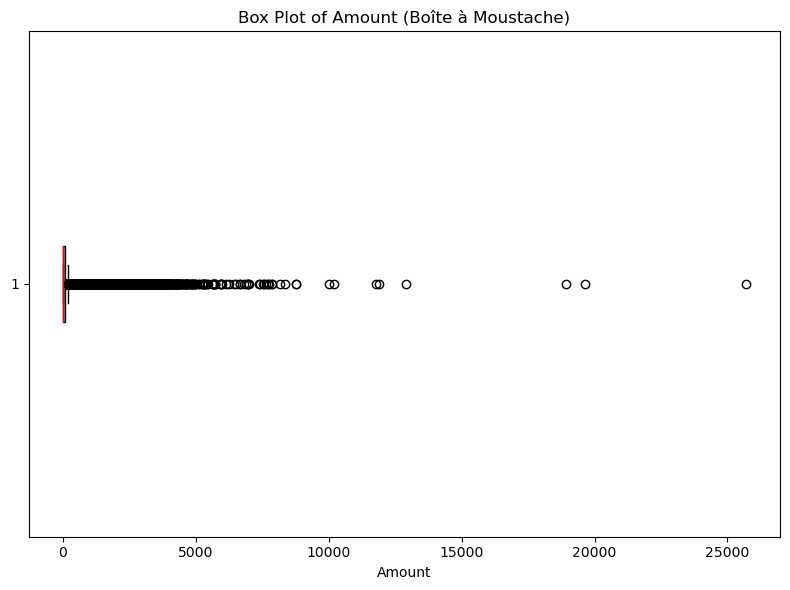

In [67]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.boxplot(dataset['Amount'], vert=False, patch_artist=True, boxprops=dict(facecolor='skyblue', color='black'), medianprops=dict(color='red'))

plt.title('Box Plot of Amount (Boîte à Moustache)')
plt.xlabel('Amount')

plt.tight_layout()
plt.show()


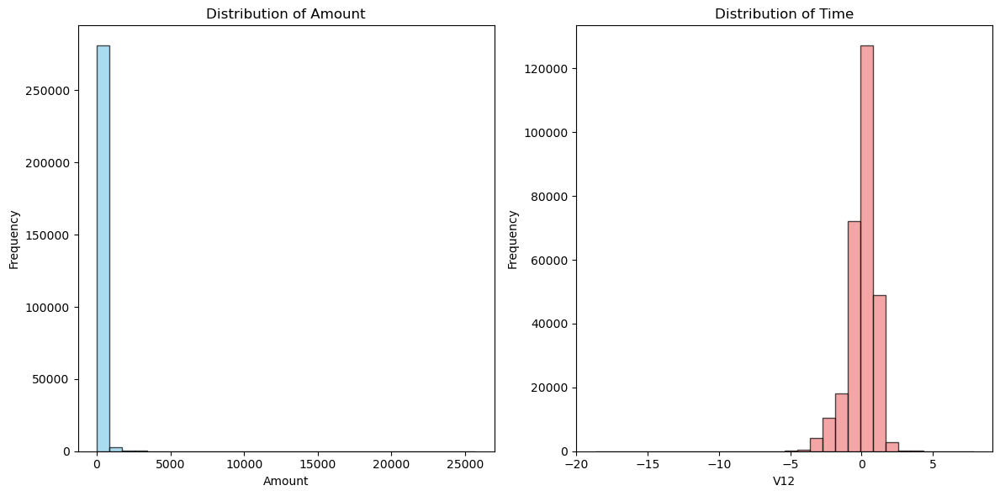

In [3]:
import matplotlib.pyplot as plt

# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Subplot 1: Amount
axes[0].hist(dataset['Amount'], bins=30, edgecolor='k', color='skyblue', alpha=0.7)
axes[0].set_title('Distribution of Amount')
axes[0].set_xlabel('Amount')
axes[0].set_ylabel('Frequency')

# Subplot 2: Time
axes[1].hist(dataset['V12'], bins=30, edgecolor='k', color='lightcoral', alpha=0.7)
axes[1].set_title('Distribution of Time')
axes[1].set_xlabel('V12')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


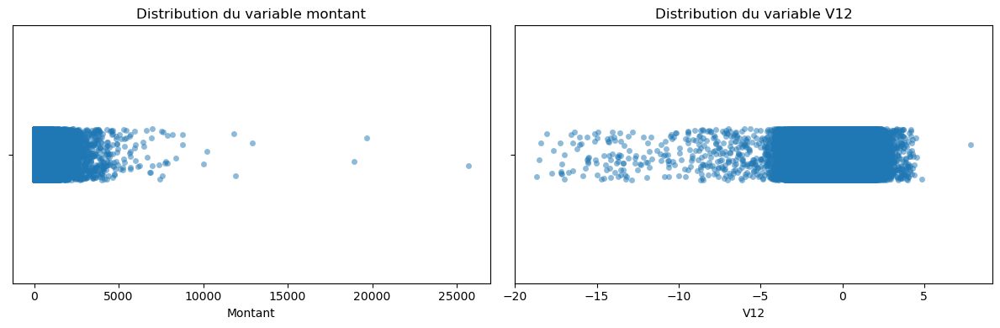

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 4))

# Subplot 1: 'Amount'
plt.subplot(121)
sns.stripplot(x='Amount', data=dataset, jitter=True, alpha=0.5)
plt.title('Distribution du variable montant')
plt.xlabel('Montant')
plt.ylabel('')

# Subplot 2: 'Time'
plt.subplot(122)
sns.stripplot(x='V12', data=dataset, jitter=True, alpha=0.5)
plt.title('Distribution du variable V12')
plt.xlabel('V12')
plt.ylabel('')

plt.tight_layout()
plt.show()


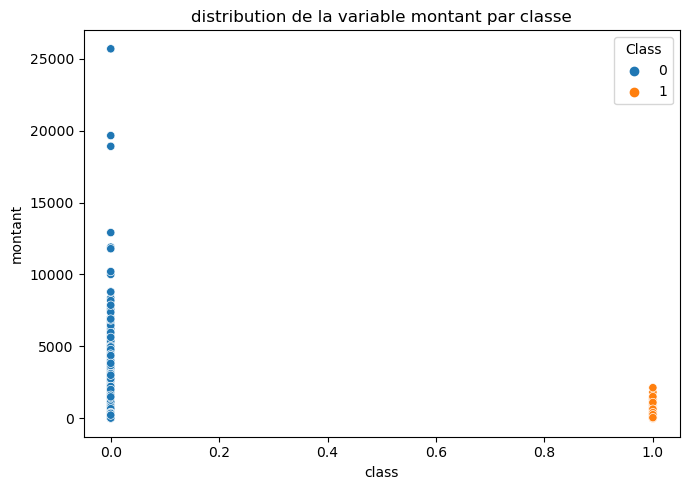

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

num_r = 1  # Number of rows
num_c = 1  # Number of columns

fig, axes = plt.subplots(nrows=num_r, ncols=num_c, figsize=(7, 5))  # Adjust the figsize as needed

# You only want to plot V4 vs. Amount
sns.scatterplot(x='Class', y='Amount', hue='Class', data=dataset, ax=axes)
axes.set_title('distribution de la variable montant par classe')
axes.set_xlabel('class')
axes.set_ylabel('montant')

plt.tight_layout()
plt.show()


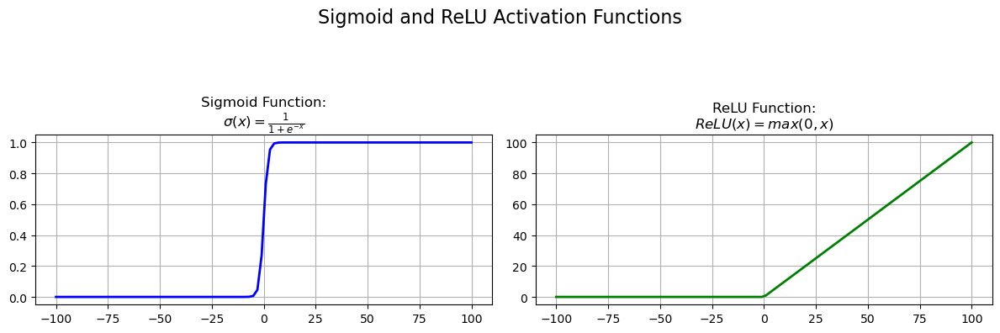

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Define a range of x values
x = np.linspace(-10,10, 100)

# Activation functions
sigmoid = 1 / (1 + np.exp(-x))
relu = np.maximum(0, x)

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('Sigmoid and ReLU Activation Functions', fontsize=16)

# Plot Sigmoid
axs[0].plot(x, sigmoid, label='Sigmoid', linewidth=2, color='blue')
axs[0].set_title('Sigmoid Function:\n$\\sigma(x) = \\frac{1}{1 + e^{-x}}$')
axs[0].grid(True)

# Plot ReLU
axs[1].plot(x, relu, label='ReLU', linewidth=2, color='green')
axs[1].set_title('ReLU Function:\n$ReLU(x) = max(0, x)$')
axs[1].grid(True)

# Adjust spacing
plt.tight_layout(rect=[0, 0, 1, 0.85])

# Show the plot
plt.show()


In [90]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(10, return_sequences=True))(input_layer)
    dense_layer = Dense(20, activation='relu')(bilstm)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.1)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
228/228 - 9s - loss: 0.2952 - accuracy: 0.8923 - val_loss: 0.1725 - val_accuracy: 0.9531 - 9s/epoch - 42ms/step
Epoch 2/50


KeyboardInterrupt: 

In [91]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='accuracy')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.5909 - accuracy: 0.7849 - 4s/epoch - 92ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3227 - accuracy: 0.9485 - 819ms/epoch - 18ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1553 - accuracy: 0.9603 - 839ms/epoch - 18ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1010 - accuracy: 0.9693 - 844ms/epoch - 18ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0803 - accuracy: 0.9744 - 755ms/epoch - 16ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0680 - accuracy: 0.9790 - 768ms/epoch - 17ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0586 - accuracy: 0.9818 - 896ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0507 - accuracy: 0.9840 - 980ms/epoch - 21ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0440 - accuracy: 0.9864 - 790ms/epoch - 17ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0387 - accuracy: 0.9882 - 829ms/epoch - 18ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0342 - accuracy: 0.9898 - 751ms/epoch - 16ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0305 - accuracy: 0.9908 - 746ms/epoch - 16ms/step
Epoch 13/50
46/4

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.5735 - accuracy: 0.8146 - 4s/epoch - 90ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3366 - accuracy: 0.9473 - 947ms/epoch - 21ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1622 - accuracy: 0.9628 - 940ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1041 - accuracy: 0.9705 - 924ms/epoch - 20ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0831 - accuracy: 0.9746 - 950ms/epoch - 21ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0700 - accuracy: 0.9783 - 835ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0597 - accuracy: 0.9818 - 822ms/epoch - 18ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0513 - accuracy: 0.9845 - 856ms/epoch - 19ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0440 - accuracy: 0.9866 - 802ms/epoch - 17ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0383 - accuracy: 0.9886 - 811ms/epoch - 18ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0331 - accuracy: 0.9906 - 1s/epoch - 26ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0289 - accuracy: 0.9914 - 1s/epoch - 25ms/step
Epoch 13/50
46/46 - 1s

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.6021 - accuracy: 0.7409 - 4s/epoch - 96ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3163 - accuracy: 0.9480 - 1s/epoch - 22ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1655 - accuracy: 0.9570 - 2s/epoch - 33ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1110 - accuracy: 0.9654 - 897ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0871 - accuracy: 0.9713 - 1s/epoch - 25ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0727 - accuracy: 0.9768 - 1s/epoch - 23ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0622 - accuracy: 0.9804 - 1s/epoch - 29ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0538 - accuracy: 0.9838 - 1s/epoch - 26ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0466 - accuracy: 0.9856 - 1s/epoch - 24ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0404 - accuracy: 0.9873 - 817ms/epoch - 18ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0354 - accuracy: 0.9893 - 832ms/epoch - 18ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0312 - accuracy: 0.9907 - 909ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s - loss: 0.0276

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5767 - accuracy: 0.8256 - 5s/epoch - 99ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3068 - accuracy: 0.9452 - 1s/epoch - 26ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1625 - accuracy: 0.9584 - 1s/epoch - 27ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1083 - accuracy: 0.9668 - 1s/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0841 - accuracy: 0.9735 - 905ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0703 - accuracy: 0.9781 - 907ms/epoch - 20ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0603 - accuracy: 0.9815 - 863ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0517 - accuracy: 0.9843 - 898ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0449 - accuracy: 0.9868 - 962ms/epoch - 21ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0396 - accuracy: 0.9883 - 1s/epoch - 31ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0351 - accuracy: 0.9901 - 923ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0308 - accuracy: 0.9911 - 897ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s - los

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5263 - accuracy: 0.7869 - 5s/epoch - 105ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2901 - accuracy: 0.9353 - 903ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1591 - accuracy: 0.9549 - 895ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1086 - accuracy: 0.9656 - 889ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0857 - accuracy: 0.9722 - 826ms/epoch - 18ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0710 - accuracy: 0.9777 - 841ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0609 - accuracy: 0.9815 - 1s/epoch - 24ms/step
Epoch 8/50
46/46 - 2s - loss: 0.0526 - accuracy: 0.9840 - 2s/epoch - 34ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0460 - accuracy: 0.9860 - 969ms/epoch - 21ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0405 - accuracy: 0.9874 - 895ms/epoch - 19ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0360 - accuracy: 0.9888 - 937ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0318 - accuracy: 0.9903 - 979ms/epoch - 21ms/step
Epoch 13/50
46/46 - 1

In [92]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='precision')  
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.6502 - accuracy: 0.6698 - 5s/epoch - 105ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3912 - accuracy: 0.9414 - 1s/epoch - 25ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1995 - accuracy: 0.9520 - 948ms/epoch - 21ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1223 - accuracy: 0.9632 - 995ms/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0959 - accuracy: 0.9700 - 1s/epoch - 23ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0808 - accuracy: 0.9737 - 1s/epoch - 24ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0692 - accuracy: 0.9776 - 870ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0594 - accuracy: 0.9810 - 851ms/epoch - 19ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0510 - accuracy: 0.9844 - 870ms/epoch - 19ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0438 - accuracy: 0.9865 - 866ms/epoch - 19ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0384 - accuracy: 0.9886 - 873ms/epoch - 19ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0337 - accuracy: 0.9902 - 803ms/epoch - 17ms/step
Epoch 13/50
46/46 - 1s -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 6s - loss: 0.5741 - accuracy: 0.8115 - 6s/epoch - 126ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3333 - accuracy: 0.9513 - 901ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1737 - accuracy: 0.9611 - 855ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1086 - accuracy: 0.9704 - 1s/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0828 - accuracy: 0.9758 - 927ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0692 - accuracy: 0.9794 - 938ms/epoch - 20ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0593 - accuracy: 0.9822 - 937ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0518 - accuracy: 0.9844 - 897ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0454 - accuracy: 0.9869 - 937ms/epoch - 20ms/step
Epoch 10/50
46/46 - 2s - loss: 0.0397 - accuracy: 0.9886 - 2s/epoch - 33ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0351 - accuracy: 0.9898 - 962ms/epoch - 21ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0310 - accuracy: 0.9908 - 986ms/epoch - 21ms/step
Epoch 13/50
46/46 - 1

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.6041 - accuracy: 0.7726 - 4s/epoch - 96ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3222 - accuracy: 0.9514 - 940ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1583 - accuracy: 0.9607 - 924ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1049 - accuracy: 0.9696 - 1s/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0829 - accuracy: 0.9753 - 1s/epoch - 24ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0692 - accuracy: 0.9798 - 837ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0597 - accuracy: 0.9828 - 1s/epoch - 22ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0514 - accuracy: 0.9851 - 955ms/epoch - 21ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0450 - accuracy: 0.9868 - 819ms/epoch - 18ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0398 - accuracy: 0.9884 - 841ms/epoch - 18ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0352 - accuracy: 0.9894 - 991ms/epoch - 22ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0312 - accuracy: 0.9906 - 924ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s - 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.5386 - accuracy: 0.6607 - 4s/epoch - 97ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3501 - accuracy: 0.9432 - 1s/epoch - 22ms/step
Epoch 3/50
46/46 - 1s - loss: 0.2229 - accuracy: 0.9559 - 808ms/epoch - 18ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1324 - accuracy: 0.9649 - 1s/epoch - 24ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0908 - accuracy: 0.9742 - 936ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0716 - accuracy: 0.9788 - 860ms/epoch - 19ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0604 - accuracy: 0.9821 - 972ms/epoch - 21ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0526 - accuracy: 0.9841 - 940ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0460 - accuracy: 0.9859 - 1s/epoch - 22ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0402 - accuracy: 0.9878 - 952ms/epoch - 21ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0358 - accuracy: 0.9892 - 833ms/epoch - 18ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0318 - accuracy: 0.9903 - 869ms/epoch - 19ms/step
Epoch 13/50
46/46 - 1s - 

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.6286 - accuracy: 0.7437 - 4s/epoch - 95ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3398 - accuracy: 0.9431 - 829ms/epoch - 18ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1764 - accuracy: 0.9574 - 808ms/epoch - 18ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1145 - accuracy: 0.9664 - 854ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0881 - accuracy: 0.9720 - 858ms/epoch - 19ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0725 - accuracy: 0.9778 - 1s/epoch - 26ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0609 - accuracy: 0.9819 - 865ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0517 - accuracy: 0.9844 - 826ms/epoch - 18ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0448 - accuracy: 0.9867 - 902ms/epoch - 20ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0389 - accuracy: 0.9885 - 802ms/epoch - 17ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0344 - accuracy: 0.9900 - 1s/epoch - 31ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0304 - accuracy: 0.9912 - 832ms/epoch - 18ms/step
Epoch 13/50
46/46 - 1s

In [93]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='recall')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 4s - loss: 0.6486 - accuracy: 0.7212 - 4s/epoch - 96ms/step
Epoch 2/50
46/46 - 1s - loss: 0.4248 - accuracy: 0.9432 - 845ms/epoch - 18ms/step
Epoch 3/50
46/46 - 1s - loss: 0.2182 - accuracy: 0.9545 - 857ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1216 - accuracy: 0.9633 - 857ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0892 - accuracy: 0.9717 - 834ms/epoch - 18ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0718 - accuracy: 0.9783 - 814ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0595 - accuracy: 0.9819 - 861ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0509 - accuracy: 0.9848 - 997ms/epoch - 22ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0443 - accuracy: 0.9867 - 868ms/epoch - 19ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0384 - accuracy: 0.9888 - 1s/epoch - 24ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0342 - accuracy: 0.9902 - 886ms/epoch - 19ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0300 - accuracy: 0.9914 - 864ms/epoch - 19ms/step
Epoch 13/50
46/46 -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 6s - loss: 0.6149 - accuracy: 0.7375 - 6s/epoch - 141ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3826 - accuracy: 0.9444 - 915ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.2008 - accuracy: 0.9604 - 845ms/epoch - 18ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1195 - accuracy: 0.9684 - 1s/epoch - 27ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0882 - accuracy: 0.9740 - 938ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0722 - accuracy: 0.9777 - 1s/epoch - 22ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0613 - accuracy: 0.9811 - 1s/epoch - 23ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0527 - accuracy: 0.9841 - 1s/epoch - 23ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0458 - accuracy: 0.9860 - 1s/epoch - 23ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0402 - accuracy: 0.9881 - 1s/epoch - 23ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0356 - accuracy: 0.9894 - 1s/epoch - 23ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0309 - accuracy: 0.9905 - 943ms/epoch - 21ms/step
Epoch 13/50
46/46 - 1s - loss: 0.027

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 6s - loss: 0.5246 - accuracy: 0.8410 - 6s/epoch - 135ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2621 - accuracy: 0.9404 - 971ms/epoch - 21ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1413 - accuracy: 0.9624 - 968ms/epoch - 21ms/step
Epoch 4/50
46/46 - 1s - loss: 0.0999 - accuracy: 0.9714 - 955ms/epoch - 21ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0819 - accuracy: 0.9755 - 846ms/epoch - 18ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0697 - accuracy: 0.9796 - 913ms/epoch - 20ms/step
Epoch 7/50
46/46 - 2s - loss: 0.0601 - accuracy: 0.9821 - 2s/epoch - 35ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0521 - accuracy: 0.9848 - 1s/epoch - 30ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0455 - accuracy: 0.9867 - 1s/epoch - 22ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0401 - accuracy: 0.9882 - 962ms/epoch - 21ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0353 - accuracy: 0.9898 - 915ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0313 - accuracy: 0.9909 - 921ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.6246 - accuracy: 0.7868 - 5s/epoch - 119ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3741 - accuracy: 0.9489 - 1s/epoch - 25ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1765 - accuracy: 0.9598 - 2s/epoch - 37ms/step
Epoch 4/50
46/46 - 2s - loss: 0.1082 - accuracy: 0.9678 - 2s/epoch - 37ms/step
Epoch 5/50
46/46 - 2s - loss: 0.0834 - accuracy: 0.9738 - 2s/epoch - 37ms/step
Epoch 6/50
46/46 - 2s - loss: 0.0692 - accuracy: 0.9789 - 2s/epoch - 37ms/step
Epoch 7/50
46/46 - 2s - loss: 0.0594 - accuracy: 0.9819 - 2s/epoch - 33ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0513 - accuracy: 0.9845 - 829ms/epoch - 18ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0448 - accuracy: 0.9864 - 877ms/epoch - 19ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0391 - accuracy: 0.9877 - 903ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0340 - accuracy: 0.9891 - 910ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0298 - accuracy: 0.9906 - 957ms/epoch - 21ms/step
Epoch 13/50
46/46 - 1s - loss: 0.

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5220 - accuracy: 0.7841 - 5s/epoch - 117ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2992 - accuracy: 0.9539 - 886ms/epoch - 19ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1660 - accuracy: 0.9601 - 2s/epoch - 36ms/step
Epoch 4/50
46/46 - 2s - loss: 0.1065 - accuracy: 0.9694 - 2s/epoch - 36ms/step
Epoch 5/50
46/46 - 2s - loss: 0.0813 - accuracy: 0.9757 - 2s/epoch - 36ms/step
Epoch 6/50
46/46 - 2s - loss: 0.0673 - accuracy: 0.9803 - 2s/epoch - 37ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0579 - accuracy: 0.9831 - 1s/epoch - 22ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0506 - accuracy: 0.9852 - 922ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0440 - accuracy: 0.9867 - 926ms/epoch - 20ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0383 - accuracy: 0.9891 - 918ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0332 - accuracy: 0.9905 - 966ms/epoch - 21ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0288 - accuracy: 0.9916 - 1s/epoch - 23ms/step
Epoch 13/50
46/46 - 2s - loss: 0.

In [94]:
from sklearn.metrics import make_scorer, matthews_corrcoef
from sklearn.model_selection import cross_val_score
mcc_scorer = make_scorer(matthews_corrcoef)
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring=mcc_scorer)  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5203 - accuracy: 0.8802 - 5s/epoch - 111ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2920 - accuracy: 0.9537 - 887ms/epoch - 19ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1565 - accuracy: 0.9628 - 887ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1012 - accuracy: 0.9702 - 858ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0786 - accuracy: 0.9759 - 879ms/epoch - 19ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0653 - accuracy: 0.9799 - 996ms/epoch - 22ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0556 - accuracy: 0.9833 - 1s/epoch - 30ms/step
Epoch 8/50
46/46 - 2s - loss: 0.0481 - accuracy: 0.9854 - 2s/epoch - 35ms/step
Epoch 9/50
46/46 - 2s - loss: 0.0425 - accuracy: 0.9875 - 2s/epoch - 36ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0375 - accuracy: 0.9893 - 1s/epoch - 24ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0333 - accuracy: 0.9905 - 915ms/epoch - 20ms/step
Epoch 12/50
46/46 - 2s - loss: 0.0298 - accuracy: 0.9915 - 2s/epoch - 35ms/step
Epoch 13/50
46/46 - 2s - loss:

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 7s - loss: 0.5294 - accuracy: 0.8767 - 7s/epoch - 143ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2937 - accuracy: 0.9574 - 937ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1566 - accuracy: 0.9661 - 937ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.0989 - accuracy: 0.9721 - 932ms/epoch - 20ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0749 - accuracy: 0.9780 - 994ms/epoch - 22ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0608 - accuracy: 0.9821 - 1s/epoch - 22ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0511 - accuracy: 0.9852 - 933ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0438 - accuracy: 0.9874 - 943ms/epoch - 21ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0378 - accuracy: 0.9887 - 956ms/epoch - 21ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0329 - accuracy: 0.9899 - 908ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0290 - accuracy: 0.9910 - 1s/epoch - 29ms/step
Epoch 12/50
46/46 - 2s - loss: 0.0258 - accuracy: 0.9918 - 2s/epoch - 37ms/step
Epoch 13/50
46/46 - 2s -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5140 - accuracy: 0.7845 - 5s/epoch - 110ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2946 - accuracy: 0.9415 - 938ms/epoch - 20ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1614 - accuracy: 0.9608 - 2s/epoch - 33ms/step
Epoch 4/50
46/46 - 2s - loss: 0.1049 - accuracy: 0.9706 - 2s/epoch - 37ms/step
Epoch 5/50
46/46 - 2s - loss: 0.0812 - accuracy: 0.9761 - 2s/epoch - 37ms/step
Epoch 6/50
46/46 - 2s - loss: 0.0674 - accuracy: 0.9797 - 2s/epoch - 37ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0585 - accuracy: 0.9823 - 947ms/epoch - 21ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0515 - accuracy: 0.9843 - 1s/epoch - 23ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0454 - accuracy: 0.9859 - 1s/epoch - 30ms/step
Epoch 10/50
46/46 - 2s - loss: 0.0401 - accuracy: 0.9870 - 2s/epoch - 36ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0356 - accuracy: 0.9886 - 1s/epoch - 23ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0316 - accuracy: 0.9901 - 890ms/epoch - 19ms/step
Epoch 13/50
46/46 - 1s - loss: 0.0283 -

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5312 - accuracy: 0.7790 - 5s/epoch - 115ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3069 - accuracy: 0.9541 - 1s/epoch - 31ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1847 - accuracy: 0.9628 - 2s/epoch - 37ms/step
Epoch 4/50
46/46 - 2s - loss: 0.1199 - accuracy: 0.9683 - 2s/epoch - 37ms/step
Epoch 5/50
46/46 - 2s - loss: 0.0899 - accuracy: 0.9737 - 2s/epoch - 36ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0726 - accuracy: 0.9786 - 1s/epoch - 28ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0620 - accuracy: 0.9819 - 1s/epoch - 30ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0539 - accuracy: 0.9843 - 1s/epoch - 22ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0477 - accuracy: 0.9864 - 931ms/epoch - 20ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0425 - accuracy: 0.9877 - 947ms/epoch - 21ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0378 - accuracy: 0.9891 - 935ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0338 - accuracy: 0.9904 - 980ms/epoch - 21ms/step
Epoch 13/50
46/46 - 1s - loss: 0.030

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5774 - accuracy: 0.8041 - 5s/epoch - 111ms/step
Epoch 2/50
46/46 - 2s - loss: 0.3289 - accuracy: 0.9482 - 2s/epoch - 33ms/step
Epoch 3/50
46/46 - 2s - loss: 0.1672 - accuracy: 0.9598 - 2s/epoch - 36ms/step
Epoch 4/50
46/46 - 2s - loss: 0.1079 - accuracy: 0.9678 - 2s/epoch - 37ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0836 - accuracy: 0.9738 - 1s/epoch - 30ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0691 - accuracy: 0.9780 - 876ms/epoch - 19ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0582 - accuracy: 0.9822 - 880ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0497 - accuracy: 0.9850 - 878ms/epoch - 19ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0429 - accuracy: 0.9869 - 1s/epoch - 22ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0376 - accuracy: 0.9887 - 1s/epoch - 22ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0328 - accuracy: 0.9906 - 1s/epoch - 22ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0288 - accuracy: 0.9916 - 1s/epoch - 22ms/step
Epoch 13/50
46/46 - 1s - loss: 0.0251 -

In [95]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='f1')  # 'accuracy' is an example of a performance metric
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 6s - loss: 0.5526 - accuracy: 0.8480 - 6s/epoch - 121ms/step
Epoch 2/50
46/46 - 2s - loss: 0.3084 - accuracy: 0.9529 - 2s/epoch - 36ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1639 - accuracy: 0.9640 - 982ms/epoch - 21ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1072 - accuracy: 0.9707 - 902ms/epoch - 20ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0844 - accuracy: 0.9747 - 914ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0694 - accuracy: 0.9785 - 898ms/epoch - 20ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0583 - accuracy: 0.9828 - 908ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0502 - accuracy: 0.9852 - 995ms/epoch - 22ms/step
Epoch 9/50
46/46 - 2s - loss: 0.0437 - accuracy: 0.9871 - 2s/epoch - 35ms/step
Epoch 10/50
46/46 - 2s - loss: 0.0386 - accuracy: 0.9883 - 2s/epoch - 35ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0342 - accuracy: 0.9895 - 1s/epoch - 24ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0305 - accuracy: 0.9907 - 889ms/epoch - 19ms/step
Epoch 13/50
46/46 - 1s - lo

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 7s - loss: 0.5507 - accuracy: 0.8415 - 7s/epoch - 145ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3069 - accuracy: 0.9545 - 940ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1619 - accuracy: 0.9632 - 942ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1046 - accuracy: 0.9708 - 928ms/epoch - 20ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0815 - accuracy: 0.9764 - 928ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0675 - accuracy: 0.9804 - 1s/epoch - 22ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0567 - accuracy: 0.9835 - 1s/epoch - 23ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0487 - accuracy: 0.9857 - 1s/epoch - 23ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0422 - accuracy: 0.9874 - 1s/epoch - 23ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0372 - accuracy: 0.9886 - 1s/epoch - 23ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0332 - accuracy: 0.9898 - 1s/epoch - 28ms/step
Epoch 12/50
46/46 - 2s - loss: 0.0294 - accuracy: 0.9912 - 2s/epoch - 37ms/step
Epoch 13/50
46/46 - 2s - loss: 0.026

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5411 - accuracy: 0.8544 - 5s/epoch - 111ms/step
Epoch 2/50
46/46 - 1s - loss: 0.2901 - accuracy: 0.9489 - 924ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1491 - accuracy: 0.9624 - 925ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1018 - accuracy: 0.9714 - 1s/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0803 - accuracy: 0.9771 - 1s/epoch - 23ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0663 - accuracy: 0.9812 - 1s/epoch - 23ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0563 - accuracy: 0.9841 - 905ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0485 - accuracy: 0.9859 - 899ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0423 - accuracy: 0.9880 - 896ms/epoch - 19ms/step
Epoch 10/50
46/46 - 2s - loss: 0.0374 - accuracy: 0.9896 - 2s/epoch - 36ms/step
Epoch 11/50
46/46 - 2s - loss: 0.0334 - accuracy: 0.9905 - 2s/epoch - 37ms/step
Epoch 12/50
46/46 - 2s - loss: 0.0298 - accuracy: 0.9913 - 2s/epoch - 37ms/step
Epoch 13/50
46/46 - 2s - loss: 0.

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5725 - accuracy: 0.6901 - 5s/epoch - 110ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3454 - accuracy: 0.9379 - 927ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.2171 - accuracy: 0.9597 - 945ms/epoch - 21ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1390 - accuracy: 0.9668 - 954ms/epoch - 21ms/step
Epoch 5/50
46/46 - 1s - loss: 0.1003 - accuracy: 0.9719 - 911ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0802 - accuracy: 0.9758 - 877ms/epoch - 19ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0682 - accuracy: 0.9799 - 889ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0594 - accuracy: 0.9833 - 941ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0524 - accuracy: 0.9851 - 1s/epoch - 25ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0469 - accuracy: 0.9869 - 1s/epoch - 29ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0418 - accuracy: 0.9885 - 919ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0377 - accuracy: 0.9897 - 892ms/epoch - 19ms/step
Epoch 13/50
46/46 - 1

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 5s - loss: 0.5585 - accuracy: 0.7585 - 5s/epoch - 105ms/step
Epoch 2/50
46/46 - 1s - loss: 0.3186 - accuracy: 0.9500 - 846ms/epoch - 18ms/step
Epoch 3/50
46/46 - 1s - loss: 0.1698 - accuracy: 0.9636 - 1s/epoch - 26ms/step
Epoch 4/50
46/46 - 1s - loss: 0.1078 - accuracy: 0.9712 - 1s/epoch - 31ms/step
Epoch 5/50
46/46 - 1s - loss: 0.0837 - accuracy: 0.9758 - 862ms/epoch - 19ms/step
Epoch 6/50
46/46 - 1s - loss: 0.0695 - accuracy: 0.9801 - 847ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.0589 - accuracy: 0.9831 - 852ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.0503 - accuracy: 0.9852 - 1s/epoch - 24ms/step
Epoch 9/50
46/46 - 1s - loss: 0.0440 - accuracy: 0.9871 - 892ms/epoch - 19ms/step
Epoch 10/50
46/46 - 1s - loss: 0.0384 - accuracy: 0.9886 - 902ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.0341 - accuracy: 0.9898 - 942ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.0300 - accuracy: 0.9911 - 898ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s -

In [68]:
from sklearn.model_selection import cross_val_score
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=2000, verbose=2)
scores = cross_val_score(model, X_test, y_test, cv=5, scoring='precision')  
mean_performance = scores.mean()
print("performance moyenne:", mean_performance)

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 12s - loss: 0.6629 - accuracy: 0.5284 - 12s/epoch - 262ms/step
Epoch 2/50
46/46 - 1s - loss: 0.6041 - accuracy: 0.6054 - 891ms/epoch - 19ms/step
Epoch 3/50
46/46 - 1s - loss: 0.5728 - accuracy: 0.6421 - 893ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.5466 - accuracy: 0.6545 - 881ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.5204 - accuracy: 0.6612 - 884ms/epoch - 19ms/step
Epoch 6/50
46/46 - 1s - loss: 0.4957 - accuracy: 0.6655 - 891ms/epoch - 19ms/step
Epoch 7/50
46/46 - 1s - loss: 0.4848 - accuracy: 0.6664 - 958ms/epoch - 21ms/step
Epoch 8/50
46/46 - 1s - loss: 0.4781 - accuracy: 0.6692 - 956ms/epoch - 21ms/step
Epoch 9/50
46/46 - 1s - loss: 0.4709 - accuracy: 0.6708 - 951ms/epoch - 21ms/step
Epoch 10/50
46/46 - 1s - loss: 0.4667 - accuracy: 0.6736 - 943ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.4667 - accuracy: 0.6707 - 927ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.4610 - accuracy: 0.6739 - 937ms/epoch - 20ms/step
Epoch 13/50
4

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 11s - loss: 0.6765 - accuracy: 0.5003 - 11s/epoch - 247ms/step
Epoch 2/50
46/46 - 1s - loss: 0.6086 - accuracy: 0.5681 - 850ms/epoch - 18ms/step
Epoch 3/50
46/46 - 1s - loss: 0.5652 - accuracy: 0.5804 - 852ms/epoch - 19ms/step
Epoch 4/50
46/46 - 1s - loss: 0.5251 - accuracy: 0.7023 - 856ms/epoch - 19ms/step
Epoch 5/50
46/46 - 1s - loss: 0.4960 - accuracy: 0.7247 - 852ms/epoch - 19ms/step
Epoch 6/50
46/46 - 1s - loss: 0.4602 - accuracy: 0.7272 - 833ms/epoch - 18ms/step
Epoch 7/50
46/46 - 1s - loss: 0.4388 - accuracy: 0.7302 - 878ms/epoch - 19ms/step
Epoch 8/50
46/46 - 1s - loss: 0.4281 - accuracy: 0.7341 - 837ms/epoch - 18ms/step
Epoch 9/50
46/46 - 1s - loss: 0.4279 - accuracy: 0.7323 - 848ms/epoch - 18ms/step
Epoch 10/50
46/46 - 1s - loss: 0.4193 - accuracy: 0.7364 - 893ms/epoch - 19ms/step
Epoch 11/50
46/46 - 1s - loss: 0.4177 - accuracy: 0.7367 - 910ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.4175 - accuracy: 0.7359 - 881ms/epoch - 19ms/step
Epoch 13/50
4

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 12s - loss: 0.6892 - accuracy: 0.5856 - 12s/epoch - 252ms/step
Epoch 2/50
46/46 - 1s - loss: 0.6248 - accuracy: 0.6700 - 928ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.5610 - accuracy: 0.7169 - 905ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.5073 - accuracy: 0.7539 - 928ms/epoch - 20ms/step
Epoch 5/50
46/46 - 1s - loss: 0.4729 - accuracy: 0.7662 - 962ms/epoch - 21ms/step
Epoch 6/50
46/46 - 1s - loss: 0.4512 - accuracy: 0.7729 - 939ms/epoch - 20ms/step
Epoch 7/50
46/46 - 1s - loss: 0.4389 - accuracy: 0.7772 - 930ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.4300 - accuracy: 0.7798 - 816ms/epoch - 18ms/step
Epoch 9/50
46/46 - 1s - loss: 0.4252 - accuracy: 0.7800 - 824ms/epoch - 18ms/step
Epoch 10/50
46/46 - 1s - loss: 0.4186 - accuracy: 0.7830 - 839ms/epoch - 18ms/step
Epoch 11/50
46/46 - 1s - loss: 0.4142 - accuracy: 0.7866 - 809ms/epoch - 18ms/step
Epoch 12/50
46/46 - 1s - loss: 0.4097 - accuracy: 0.7869 - 860ms/epoch - 19ms/step
Epoch 13/50
4

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 14s - loss: 0.6226 - accuracy: 0.6224 - 14s/epoch - 296ms/step
Epoch 2/50
46/46 - 1s - loss: 0.5484 - accuracy: 0.6918 - 1s/epoch - 25ms/step
Epoch 3/50
46/46 - 1s - loss: 0.5170 - accuracy: 0.7107 - 1s/epoch - 24ms/step
Epoch 4/50
46/46 - 1s - loss: 0.4987 - accuracy: 0.7170 - 1s/epoch - 22ms/step
Epoch 5/50
46/46 - 1s - loss: 0.4846 - accuracy: 0.7222 - 992ms/epoch - 22ms/step
Epoch 6/50
46/46 - 1s - loss: 0.4705 - accuracy: 0.7240 - 1s/epoch - 22ms/step
Epoch 7/50
46/46 - 1s - loss: 0.4572 - accuracy: 0.7263 - 1s/epoch - 22ms/step
Epoch 8/50
46/46 - 1s - loss: 0.4439 - accuracy: 0.7286 - 1s/epoch - 22ms/step
Epoch 9/50
46/46 - 1s - loss: 0.4349 - accuracy: 0.7306 - 1s/epoch - 23ms/step
Epoch 10/50
46/46 - 1s - loss: 0.4311 - accuracy: 0.7313 - 973ms/epoch - 21ms/step
Epoch 11/50
46/46 - 1s - loss: 0.4275 - accuracy: 0.7321 - 931ms/epoch - 20ms/step
Epoch 12/50
46/46 - 1s - loss: 0.4226 - accuracy: 0.7340 - 925ms/epoch - 20ms/step
Epoch 13/50
46/46 - 1s - loss: 0.4

C:\Users\LENOVO\anaconda3\lib\site-packages\scikeras\wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


Epoch 1/50
46/46 - 11s - loss: 0.6806 - accuracy: 0.5407 - 11s/epoch - 233ms/step
Epoch 2/50
46/46 - 1s - loss: 0.5781 - accuracy: 0.6629 - 917ms/epoch - 20ms/step
Epoch 3/50
46/46 - 1s - loss: 0.5140 - accuracy: 0.6976 - 923ms/epoch - 20ms/step
Epoch 4/50
46/46 - 1s - loss: 0.4754 - accuracy: 0.7167 - 959ms/epoch - 21ms/step
Epoch 5/50
46/46 - 1s - loss: 0.4538 - accuracy: 0.7257 - 941ms/epoch - 20ms/step
Epoch 6/50
46/46 - 1s - loss: 0.4425 - accuracy: 0.7282 - 937ms/epoch - 20ms/step
Epoch 7/50
46/46 - 1s - loss: 0.4325 - accuracy: 0.7315 - 926ms/epoch - 20ms/step
Epoch 8/50
46/46 - 1s - loss: 0.4279 - accuracy: 0.7322 - 943ms/epoch - 20ms/step
Epoch 9/50
46/46 - 1s - loss: 0.4230 - accuracy: 0.7336 - 943ms/epoch - 21ms/step
Epoch 10/50
46/46 - 1s - loss: 0.4206 - accuracy: 0.7339 - 938ms/epoch - 20ms/step
Epoch 11/50
46/46 - 1s - loss: 0.4187 - accuracy: 0.7345 - 962ms/epoch - 21ms/step
Epoch 12/50
46/46 - 1s - loss: 0.4135 - accuracy: 0.7376 - 892ms/epoch - 19ms/step
Epoch 13/50
4

Epoch 1/50
228/228 - 10s - loss: 0.6208 - accuracy: 0.7117 - val_loss: 0.5019 - val_accuracy: 0.9339 - 10s/epoch - 45ms/step
Epoch 2/50
228/228 - 3s - loss: 0.4376 - accuracy: 0.8676 - val_loss: 0.3520 - val_accuracy: 0.9517 - 3s/epoch - 11ms/step
Epoch 3/50
228/228 - 3s - loss: 0.3607 - accuracy: 0.8844 - val_loss: 0.2793 - val_accuracy: 0.9608 - 3s/epoch - 11ms/step
Epoch 4/50
228/228 - 3s - loss: 0.3200 - accuracy: 0.8939 - val_loss: 0.2363 - val_accuracy: 0.9648 - 3s/epoch - 11ms/step
Epoch 5/50
228/228 - 3s - loss: 0.2949 - accuracy: 0.9000 - val_loss: 0.2041 - val_accuracy: 0.9688 - 3s/epoch - 11ms/step
Epoch 6/50
228/228 - 2s - loss: 0.2795 - accuracy: 0.9036 - val_loss: 0.1796 - val_accuracy: 0.9736 - 2s/epoch - 10ms/step
Epoch 7/50
228/228 - 3s - loss: 0.2685 - accuracy: 0.9068 - val_loss: 0.1607 - val_accuracy: 0.9762 - 3s/epoch - 12ms/step
Epoch 8/50
228/228 - 2s - loss: 0.2605 - accuracy: 0.9095 - val_loss: 0.1462 - val_accuracy: 0.9788 - 2s/epoch - 11ms/step
Epoch 9/50
228

Epoch 13/50
228/228 - 3s - loss: 0.2940 - accuracy: 0.8252 - val_loss: 0.0321 - val_accuracy: 0.9952 - 3s/epoch - 12ms/step
Epoch 14/50
228/228 - 3s - loss: 0.2939 - accuracy: 0.8252 - val_loss: 0.0303 - val_accuracy: 0.9952 - 3s/epoch - 12ms/step
Epoch 15/50
228/228 - 3s - loss: 0.2923 - accuracy: 0.8253 - val_loss: 0.0279 - val_accuracy: 0.9957 - 3s/epoch - 12ms/step
Epoch 16/50
228/228 - 3s - loss: 0.2918 - accuracy: 0.8260 - val_loss: 0.0260 - val_accuracy: 0.9956 - 3s/epoch - 12ms/step
Epoch 17/50
228/228 - 2s - loss: 0.2910 - accuracy: 0.8263 - val_loss: 0.0229 - val_accuracy: 0.9963 - 2s/epoch - 11ms/step
Epoch 18/50
228/228 - 2s - loss: 0.2912 - accuracy: 0.8260 - val_loss: 0.0212 - val_accuracy: 0.9964 - 2s/epoch - 11ms/step
Epoch 19/50
228/228 - 3s - loss: 0.2908 - accuracy: 0.8259 - val_loss: 0.0197 - val_accuracy: 0.9967 - 3s/epoch - 12ms/step
Epoch 20/50
228/228 - 3s - loss: 0.2899 - accuracy: 0.8265 - val_loss: 0.0192 - val_accuracy: 0.9969 - 3s/epoch - 12ms/step
Epoch 21

Epoch 25/50
228/228 - 3s - loss: 0.2882 - accuracy: 0.8276 - val_loss: 0.0305 - val_accuracy: 0.9915 - 3s/epoch - 12ms/step
Epoch 26/50
228/228 - 3s - loss: 0.2877 - accuracy: 0.8276 - val_loss: 0.0290 - val_accuracy: 0.9919 - 3s/epoch - 12ms/step
Epoch 27/50
228/228 - 3s - loss: 0.2879 - accuracy: 0.8267 - val_loss: 0.0272 - val_accuracy: 0.9928 - 3s/epoch - 12ms/step
Epoch 28/50
228/228 - 3s - loss: 0.2869 - accuracy: 0.8277 - val_loss: 0.0284 - val_accuracy: 0.9921 - 3s/epoch - 11ms/step
Epoch 29/50
228/228 - 3s - loss: 0.2868 - accuracy: 0.8276 - val_loss: 0.0281 - val_accuracy: 0.9920 - 3s/epoch - 12ms/step
Epoch 30/50
228/228 - 2s - loss: 0.2872 - accuracy: 0.8275 - val_loss: 0.0267 - val_accuracy: 0.9924 - 2s/epoch - 10ms/step
Epoch 31/50
228/228 - 3s - loss: 0.2864 - accuracy: 0.8280 - val_loss: 0.0267 - val_accuracy: 0.9924 - 3s/epoch - 12ms/step
Epoch 32/50
228/228 - 3s - loss: 0.2865 - accuracy: 0.8276 - val_loss: 0.0252 - val_accuracy: 0.9930 - 3s/epoch - 12ms/step
Epoch 33

Epoch 37/50
228/228 - 3s - loss: 0.2699 - accuracy: 0.8789 - val_loss: 0.0221 - val_accuracy: 0.9983 - 3s/epoch - 11ms/step
Epoch 38/50
228/228 - 3s - loss: 0.2688 - accuracy: 0.8798 - val_loss: 0.0217 - val_accuracy: 0.9986 - 3s/epoch - 11ms/step
Epoch 39/50
228/228 - 3s - loss: 0.2695 - accuracy: 0.8794 - val_loss: 0.0226 - val_accuracy: 0.9985 - 3s/epoch - 11ms/step
Epoch 40/50
228/228 - 2s - loss: 0.2702 - accuracy: 0.8790 - val_loss: 0.0230 - val_accuracy: 0.9985 - 2s/epoch - 11ms/step
Epoch 41/50
228/228 - 3s - loss: 0.2700 - accuracy: 0.8790 - val_loss: 0.0230 - val_accuracy: 0.9986 - 3s/epoch - 11ms/step
Epoch 42/50
228/228 - 3s - loss: 0.2704 - accuracy: 0.8786 - val_loss: 0.0210 - val_accuracy: 0.9985 - 3s/epoch - 11ms/step
Epoch 43/50
228/228 - 3s - loss: 0.2693 - accuracy: 0.8793 - val_loss: 0.0236 - val_accuracy: 0.9987 - 3s/epoch - 11ms/step
Epoch 44/50
228/228 - 3s - loss: 0.2683 - accuracy: 0.8800 - val_loss: 0.0219 - val_accuracy: 0.9985 - 3s/epoch - 11ms/step
Epoch 45

Epoch 49/50
228/228 - 3s - loss: 0.3415 - accuracy: 0.7537 - val_loss: 0.0117 - val_accuracy: 0.9981 - 3s/epoch - 12ms/step
Epoch 50/50
228/228 - 3s - loss: 0.3413 - accuracy: 0.7537 - val_loss: 0.0115 - val_accuracy: 0.9982 - 3s/epoch - 12ms/step
3554/3554 [==============================] - 11s 3ms/step
first fold
mcc for fold 5: 0.9964
accuracy for fold 5: 0.9982
precision for fold 5: 0.9964
recall for fold 5: 1.0000
bcr for fold 5: 0.9982
3554/3554 [==============================] - 10s 3ms/step
Training Accuracy: 0.9994856057541811
Testing Accuracy: 0.998188628809595
Training Accuracy: 0.9989722688263661
Testing Accuracy: 0.9963903345073507
////////////////////////////////////////////////////////////////////////////////////////////////////////////
......................................................................................
mean for every metric
accuracy: 0.9968696692049311
precision: 0.9938288701313605
recall: 0.9999648277438755
bcr: 0.9968696692049311
mcc: 0.993766471792

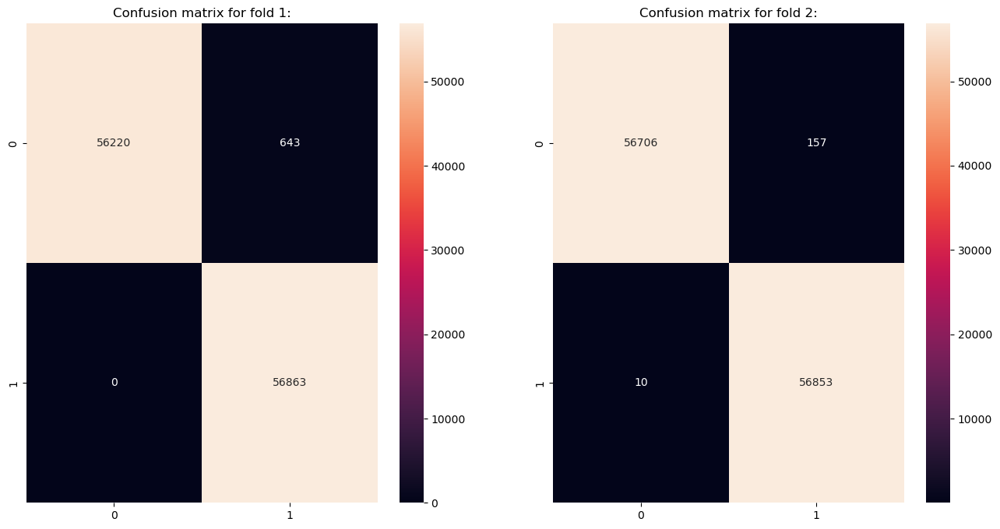

//////////////////////////////////////////////////////////////////////////////////


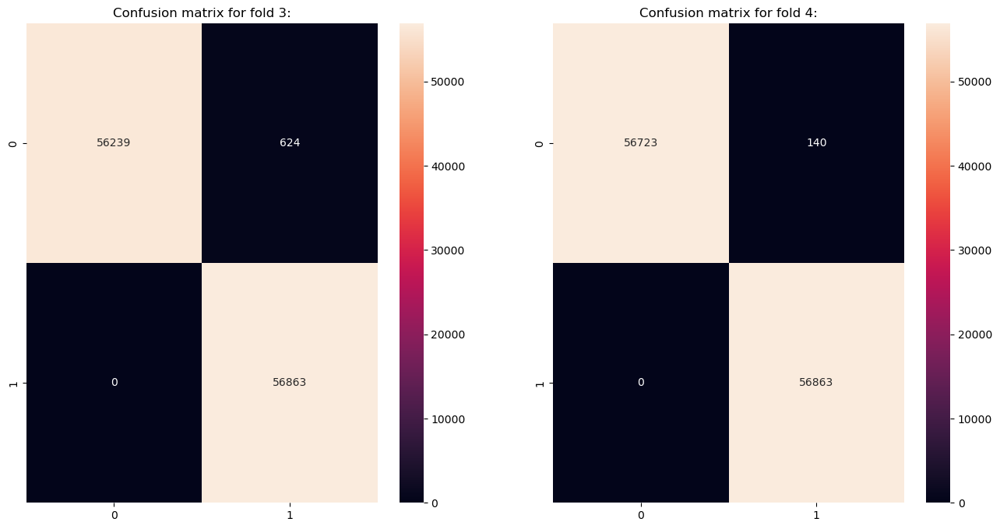

//////////////////////////////////////////////////////////////////////////////////


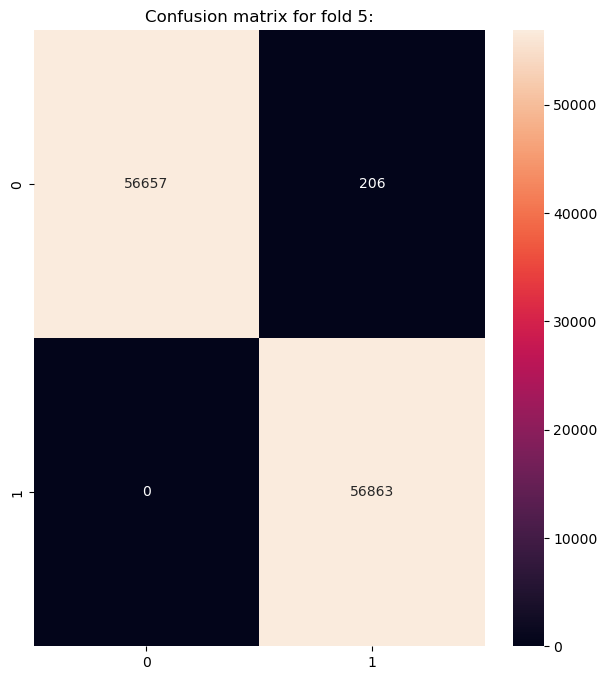

//////////////////////////////////////////////////////////////////////////////////
......................................................................................


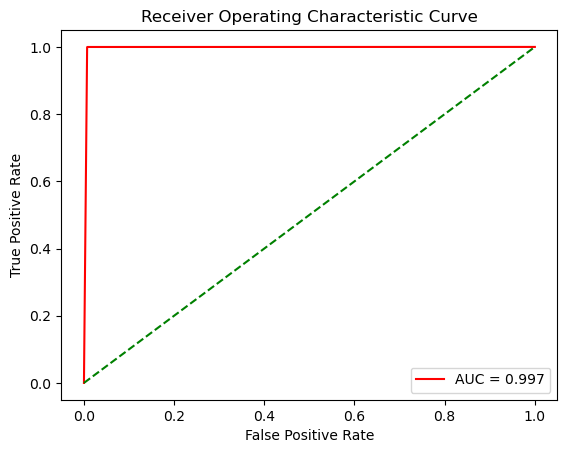

curve for fold 1:
AUC: 0.9966
//////////////////////////////////////////////////////////////////////////////////


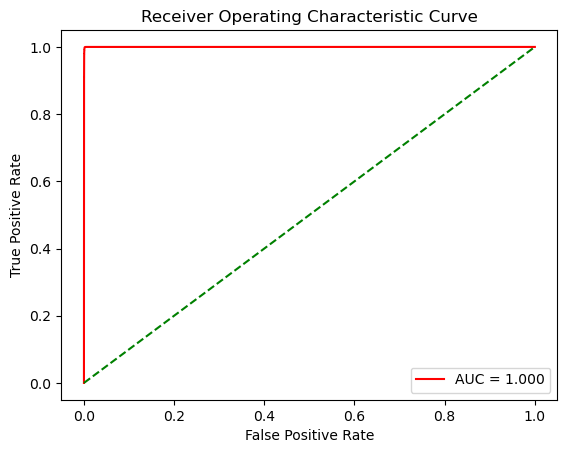

curve for fold 2:
AUC: 0.9999
//////////////////////////////////////////////////////////////////////////////////


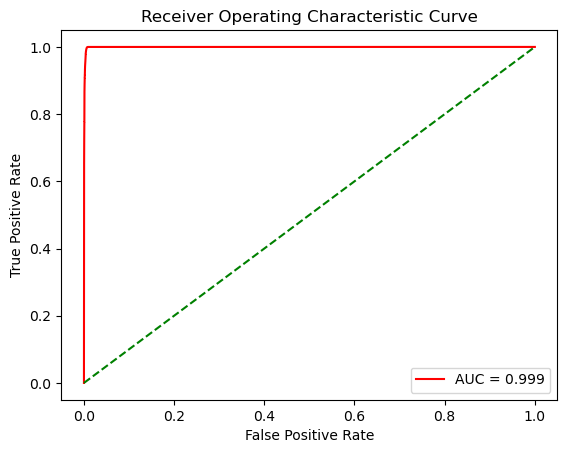

curve for fold 3:
AUC: 0.9994
//////////////////////////////////////////////////////////////////////////////////


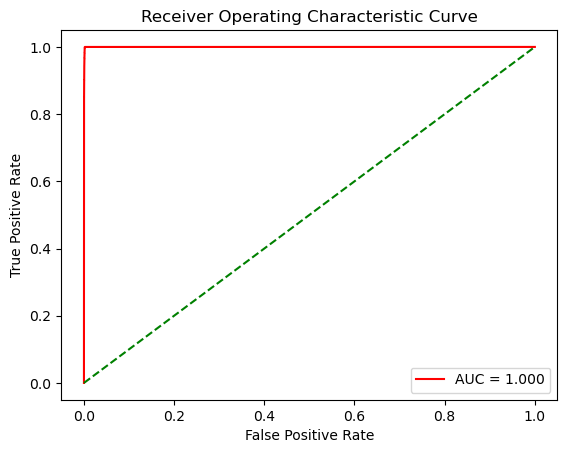

curve for fold 4:
AUC: 0.9998
//////////////////////////////////////////////////////////////////////////////////


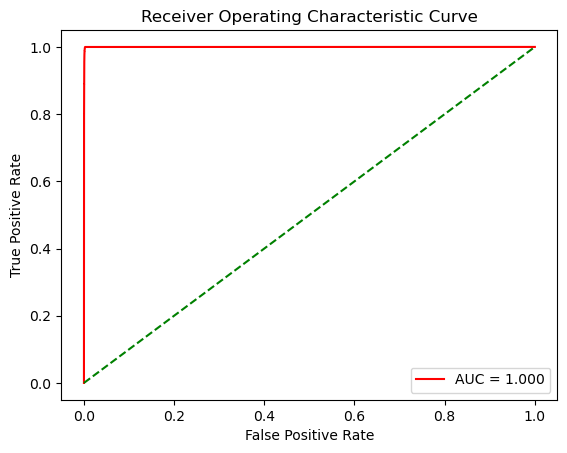

curve for fold 5:
AUC: 0.9998
//////////////////////////////////////////////////////////////////////////////////
......................................................................................
Loss and val_Loss history for hold 1:


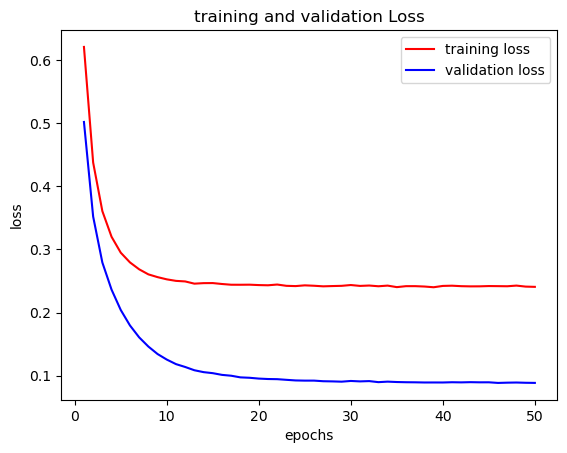

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 2:


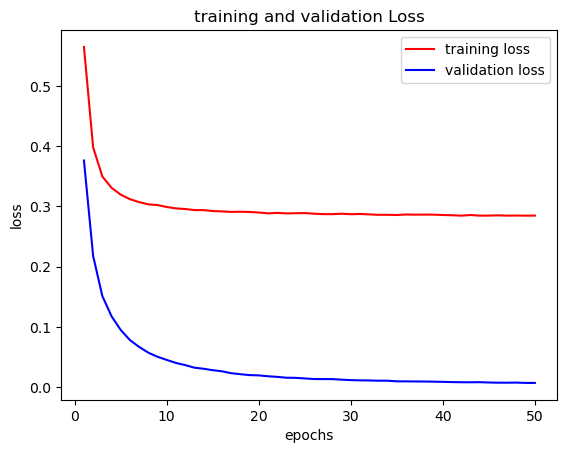

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 3:


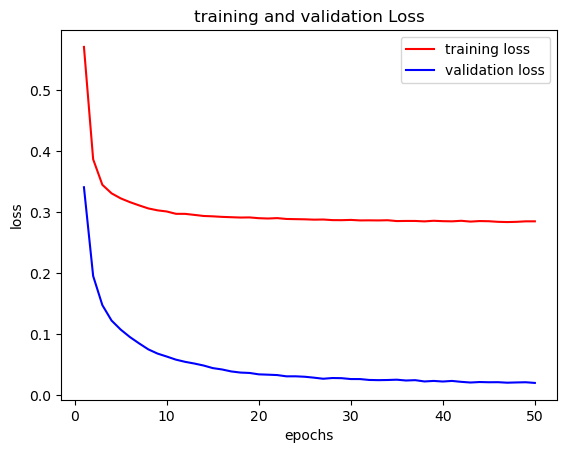

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 4:


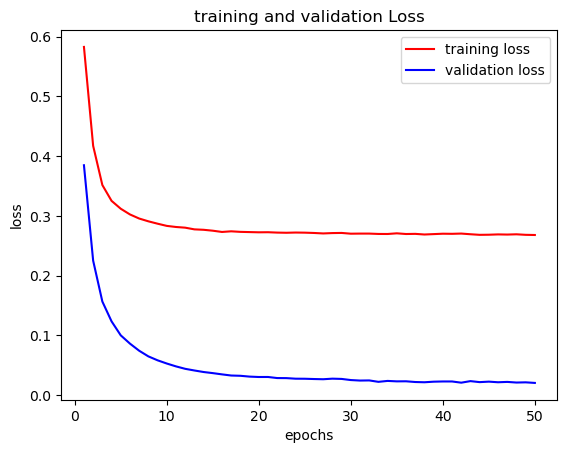

//////////////////////////////////////////////////////////////////////////////////
Loss and val_Loss history for hold 5:


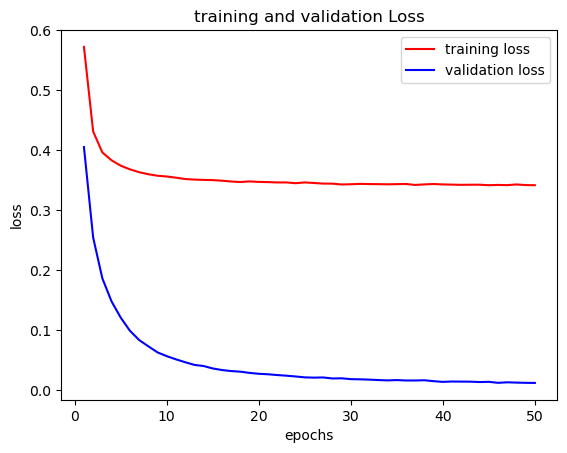

//////////////////////////////////////////////////////////////////////////////////
......................................................................................
done


In [12]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=5)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.7)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

In [28]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
cv = StratifiedKFold(n_splits=2)
num_classes = 1
def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
i=1
for train_index, test_index in cv.split(X_res, y_res):
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model = create_model()
    history=model.fit(X_train, y_train, epochs=50, batch_size=2000, verbose=2,validation_data=(X_test, y_test))
    historyl.append(history)
    y_val_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, np.round(y_val_pred))
    confusion_matrices.append(cm)
    fpr, tpr, _ = roc_curve(y_test, y_val_pred)
    fprl.append(fpr)
    tprl.append(tpr)
    print("first fold")
    print(f"mcc for fold {i}: {matthews_corrcoef(y_test, np.round(y_val_pred)):.4f}")
    mcc.append(matthews_corrcoef(y_test, np.round(y_val_pred)))
    print(f"accuracy for fold {i}: {accuracy_score(y_test, np.round(y_val_pred)):.4f}")
    accuracy.append(accuracy_score(y_test, np.round(y_val_pred)))
    print(f"precision for fold {i}: {precision_score(y_test, np.round(y_val_pred)):.4f}")
    precision.append(precision_score(y_test, np.round(y_val_pred)))
    print(f"recall for fold {i}: {recall_score(y_test, np.round(y_val_pred)):.4f}")
    recall.append(recall_score(y_test, np.round(y_val_pred)))
    print(f"bcr for fold {i}: {bcr(y_test, np.round(y_val_pred)):.4f}")
    bcrl.append(bcr(y_test, np.round(y_val_pred)))
    i=i+1
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, np.round(y_train_pred))
    test_accuracy = accuracy_score(y_test, np.round(y_test_pred))
    train_acc = precision_score(y_train, np.round(y_train_pred))
    test_acc = precision_score(y_test, np.round(y_test_pred))
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print(f"Training Accuracy: {train_acc}")
    print(f"Testing Accuracy: {test_acc}")
    print("////////////////////////////////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("mean for every metric")
total = sum(accuracy)
mean = total / len(accuracy)
print("accuracy:", mean)
total = sum(precision)
mean = total / len(precision)
print("precision:", mean)
total = sum(recall)
mean = total / len(recall)
print("recall:", mean)
total = sum(bcrl)
mean = total / len(bcrl)
print("bcr:", mean)
total = sum(mcc)
mean = total / len(mcc)
print("mcc:", mean)
print("......................................................................................")
for i, cm in enumerate(confusion_matrices):
    tn,fp,fn,tp = cm.ravel()
    print(f"confusion matrix for fold {i+1}:")
    print(cm)
    print(f"true negatives: {tn}, false positives: {fp}")
    print(f"false negatives: {fn}, true positives: {tp}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i in range(0, len(confusion_matrices), 2):
    plt.figure(figsize=(16, 8)) 
    for j in range(2):
        if i + j < len(confusion_matrices):
            plt.subplot(1, 2, j + 1)
            cm = confusion_matrices[i + j]
            sns.heatmap(cm, annot=True, fmt="d")
            plt.title(f"Confusion matrix for fold {i + j + 1}:")
    plt.show()
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, (fpr, tpr) in enumerate(zip(fprl, tprl)):
    roc_auc = auc(fpr, tpr)
    plot_roc_curve(fpr, tpr)
    print(f"curve for fold {i+1}:")
    print(f"AUC: {roc_auc:.4f}")
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
for i, history in enumerate(historyl):
    print(f"Loss and val_Loss history for hold {i+1}:")
    plot_history(history)
    print("//////////////////////////////////////////////////////////////////////////////////")
print("......................................................................................")
print("done")

Epoch 1/50
143/143 - 12s - loss: 0.5676 - accuracy: 0.7490 - val_loss: 0.4501 - val_accuracy: 0.9295 - 12s/epoch - 84ms/step
Epoch 2/50
143/143 - 4s - loss: 0.3858 - accuracy: 0.8471 - val_loss: 0.3594 - val_accuracy: 0.9111 - 4s/epoch - 29ms/step
Epoch 3/50
143/143 - 4s - loss: 0.3035 - accuracy: 0.8597 - val_loss: 0.3551 - val_accuracy: 0.8516 - 4s/epoch - 26ms/step
Epoch 4/50
143/143 - 5s - loss: 0.2688 - accuracy: 0.8658 - val_loss: 0.3777 - val_accuracy: 0.7989 - 5s/epoch - 32ms/step
Epoch 5/50
143/143 - 5s - loss: 0.2501 - accuracy: 0.8716 - val_loss: 0.3924 - val_accuracy: 0.7867 - 5s/epoch - 32ms/step
Epoch 6/50
143/143 - 5s - loss: 0.2398 - accuracy: 0.8745 - val_loss: 0.3964 - val_accuracy: 0.7874 - 5s/epoch - 32ms/step
Epoch 7/50
143/143 - 5s - loss: 0.2309 - accuracy: 0.8783 - val_loss: 0.3958 - val_accuracy: 0.7941 - 5s/epoch - 33ms/step
Epoch 8/50
143/143 - 5s - loss: 0.2247 - accuracy: 0.8802 - val_loss: 0.3929 - val_accuracy: 0.8016 - 5s/epoch - 32ms/step
Epoch 9/50
143

KeyboardInterrupt: 

3554/3554 [==============================] - 10s 3ms/step


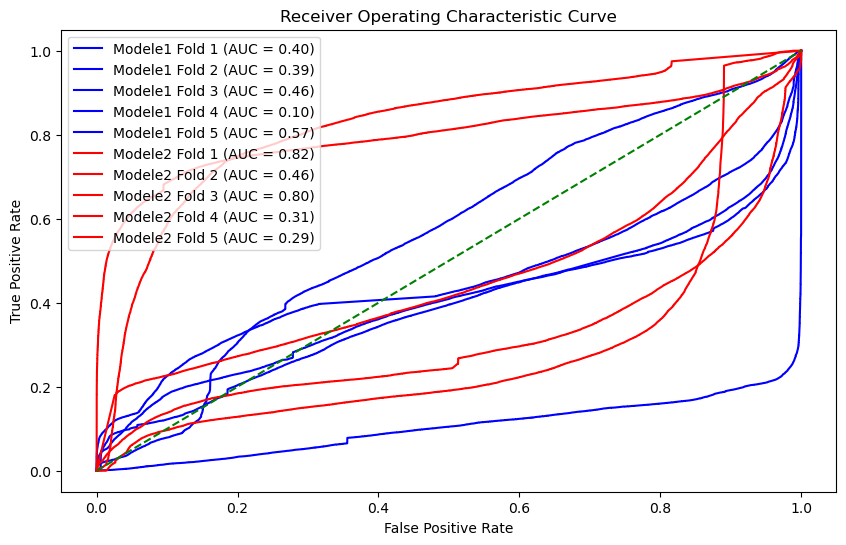

done


In [27]:
from sklearn.metrics import confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
import numpy as np

cv = StratifiedKFold(n_splits=5)
num_classes = 1

def plot_history(history):
    training_loss = history.history['loss']
    validation_loss = history.history['val_loss']
    epochs = range(1, len(training_loss) + 1)
    plt.plot(epochs, training_loss, 'red', label='training loss')
    plt.plot(epochs, validation_loss, 'b', label='validation loss')
    plt.title('training and validation Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
def plot_roc_curve(fper, tper):
    plt.plot(fper, tper, color='red', label='AUC = %0.3f'% roc_auc)
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic Curve')
    plt.legend()
    plt.show()
confusion_matrices = []
fprl=[]
tprl=[]
historyl=[]
accuracy=[]
precision=[]
recall=[]
mcc=[]
bcrl=[]
def create_model1():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = Bidirectional(LSTM(5, return_sequences=True))(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.6)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model
def create_model2():
    input_shape = (1, X_train.shape[2])
    input_layer = Input(shape=input_shape)
    bilstm = LSTM(5, return_sequences=True)(input_layer)
    attention = Attention()([bilstm, bilstm])
    weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
    dense_layer = Dense(5, activation='relu')(weighted_sum)
    dense_layer_reshaped = Flatten()(dense_layer)
    dropout_layer = Dropout(0.8)(dense_layer_reshaped)
    output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

fprl_model1 = []  # List to store fpr values for modele1
tprl_model1 = []  # List to store tpr values for modele1
fprl_model2 = []  # List to store fpr values for modele2
tprl_model2 = []  # List to store tpr values for modele2


for i, (train_index, test_index) in enumerate(cv.split(X_res, y_res)):
    # ... (rest of your code)
    train_index = train_index.astype(int)
    test_index = test_index.astype(int)
    X_train, X_test= X_res.values[train_index], X_res.values[test_index]
    y_train, y_test = y_res[train_index], y_res[test_index]
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
    model1 = create_model1()
    model2 = create_model2()
    y_val_pred_model1 = model1.predict(X_test)
    y_val_pred_model2 = model2.predict(X_test)

    cm_model1 = confusion_matrix(y_test, np.round(y_val_pred_model1))
    confusion_matrices.append(cm_model1)
    fpr_model1, tpr_model1, _ = roc_curve(y_test, y_val_pred_model1)
    fprl_model1.append(fpr_model1)
    tprl_model1.append(tpr_model1)

    cm_model2 = confusion_matrix(y_test, np.round(y_val_pred_model2))
    confusion_matrices.append(cm_model2)
    fpr_model2, tpr_model2, _ = roc_curve(y_test, y_val_pred_model2)
    fprl_model2.append(fpr_model2)
    tprl_model2.append(tpr_model2)

plt.figure(figsize=(10, 6))
for i, (fpr, tpr) in enumerate(zip(fprl_model1, tprl_model1)):
    roc_auc_model1 = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='blue', label=f'Modele1 Fold {i+1} (AUC = {roc_auc_model1:.2f})')

for i, (fpr, tpr) in enumerate(zip(fprl_model2, tprl_model2)):
    roc_auc_model2 = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='red', label=f'Modele2 Fold {i+1} (AUC = {roc_auc_model2:.2f})')

plt.plot([0, 1], [0, 1], color='green', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curve')
plt.legend()
plt.show()

print("done")


In [85]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
lstm = LSTM(3, return_sequences=True)(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data and focus on the important parts
#we will apply attention mechanism to the same input
attention = Attention()([lstm, lstm])
weighted_sum = tf.reduce_sum(attention * lstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(3, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.8)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model1 = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model1.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model1.fit(X_train, y_train, epochs=50, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model1.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model1.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/50
200/200 [==============================] - 4s 11ms/step - loss: 0.6783 - accuracy: 0.5701 - val_loss: 0.6495 - val_accuracy: 0.9331
Epoch 2/50
200/200 [==============================] - 2s 10ms/step - loss: 0.6487 - accuracy: 0.5886 - val_loss: 0.5983 - val_accuracy: 0.9518
Epoch 3/50
200/200 [==============================] - 2s 10ms/step - loss: 0.6370 - accuracy: 0.5907 - val_loss: 0.5653 - val_accuracy: 0.9573
Epoch 4/50
200/200 [==============================] - 2s 10ms/step - loss: 0.6326 - accuracy: 0.5922 - val_loss: 0.5435 - val_accuracy: 0.9607
Epoch 5/50
200/200 [==============================] - 2s 10ms/step - loss: 0.6306 - accuracy: 0.5925 - val_loss: 0.5267 - val_accuracy: 0.9628
Epoch 6/50
200/200 [==============================] - 2s 11ms/step - loss: 0.6290 - accuracy: 0.5932 - val_loss: 0.5142 - val_accuracy: 0.9657
Epoch 7/50
200/200 [==============================] - 2s 10ms/step - loss: 0.

In [70]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
classifier1 = LogisticRegression(random_state=0)
classifier1.fit(X_train, y_train)
y_pred = classifier1.predict(X_test)
mcc = matthews_corrcoef(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
print(mcc)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

0.8956851845384969
accuracy: 0.9471829953865724
precision: 0.9729568205587927
rappel: 0.9195359017203643
Confusion Matrix:
[[83435  2172]
 [ 6838 78144]]
true negatives: 83435, false positives: 2172
false negatives: 6838, true positives: 78144


In [86]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(20, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
attention = Attention()([bilstm, bilstm])
#we will reduce the dimension by 1
#we will sum all the rows in the array
weighted_sum = tf.reduce_sum(attention * bilstm, axis=1)
#create a neural network layer with relu activation function
dense_layer = Dense(20, activation='relu')(weighted_sum)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.1)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
model2 = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
model2.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
model2.fit(X_train, y_train, epochs=50, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model2.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model2.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/50
200/200 [==============================] - 11s 39ms/step - loss: 0.3229 - accuracy: 0.9210 - val_loss: 0.1095 - val_accuracy: 0.9590
Epoch 2/50
200/200 [==============================] - 7s 35ms/step - loss: 0.0748 - accuracy: 0.9732 - val_loss: 0.0472 - val_accuracy: 0.9835
Epoch 3/50
200/200 [==============================] - 7s 36ms/step - loss: 0.0342 - accuracy: 0.9902 - val_loss: 0.0228 - val_accuracy: 0.9956
Epoch 4/50
200/200 [==============================] - 8s 39ms/step - loss: 0.0182 - accuracy: 0.9966 - val_loss: 0.0134 - val_accuracy: 0.9976
Epoch 5/50
200/200 [==============================] - 7s 33ms/step - loss: 0.0117 - accuracy: 0.9981 - val_loss: 0.0094 - val_accuracy: 0.9985
Epoch 6/50
200/200 [==============================] - 6s 31ms/step - loss: 0.0085 - accuracy: 0.9987 - val_loss: 0.0071 - val_accuracy: 0.9988
Epoch 7/50
200/200 [==============================] - 6s 31ms/step - loss: 0

In [87]:
print(X_res.values.shape)
#we will split our dataset 70% for training and 30% for test
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
#bilstm model need a 3 dimentional array 
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
print(X_train.shape)
#we define how many classes we have and how many targets we have
input_shape = (1, X_train.shape[2])
#we have a binary classifiaction so we have one target class 
num_classes=1
#input layer for neural network
input_layer = Input(shape=input_shape)
#definir notre model
bilstm = Bidirectional(LSTM(3, return_sequences=True))(input_layer)
#define layer attention
#we use attention layer so our model can memorize large sequences of data
#we will apply attention mechanism to the same input
#create a neural network layer with relu activation function
dense_layer = Dense(5, activation='relu')(bilstm)
#transform the output to a vector
dense_layer_reshaped = Flatten()(dense_layer)
#we use this regularization technique so we can avoid overfitting
dropout_layer = Dropout(0.8)(dense_layer_reshaped)
output_layer = Dense(num_classes, activation='sigmoid')(dropout_layer)
#create a full neural network 
classifier2 = Model(inputs=input_layer, outputs=output_layer)
#we define the choises of our optimization and loss function
classifier2.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
#we train our data
classifier2.fit(X_train, y_train, epochs=50, batch_size=2000, validation_data=(X_test, y_test))
#here we evaluate the model
loss, accuracy = model2.evaluate(X_test, y_test)
print(f"loss: {loss:.4f}, accuracy: {accuracy:.4f}")
predictions = model2.predict(X_test)
#we use this numpy function so we can have discret values 
predictions = np.round(predictions)
recall = recall_score(y_test, predictions)
mcc = matthews_corrcoef(y_test, predictions)
precision = precision_score(y_test, predictions)
print(f"recall: {recall:.4f}")
print(f"mcc: {mcc:.4f}")
print(f"Precision: {precision:.4f}")
cm = confusion_matrix(y_test, predictions)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")

(568630, 30)
(398041, 30)
(398041,)
(170589, 30)
(398041, 1, 30)
Epoch 1/50
200/200 [==============================] - 8s 21ms/step - loss: 0.6535 - accuracy: 0.6228 - val_loss: 0.4978 - val_accuracy: 0.9298
Epoch 2/50
200/200 [==============================] - 4s 19ms/step - loss: 0.5222 - accuracy: 0.7278 - val_loss: 0.3283 - val_accuracy: 0.9547
Epoch 3/50
200/200 [==============================] - 4s 19ms/step - loss: 0.4677 - accuracy: 0.7578 - val_loss: 0.2422 - val_accuracy: 0.9616
Epoch 4/50
200/200 [==============================] - 2s 12ms/step - loss: 0.4405 - accuracy: 0.7717 - val_loss: 0.2003 - val_accuracy: 0.9676
Epoch 5/50
200/200 [==============================] - 2s 12ms/step - loss: 0.4311 - accuracy: 0.7743 - val_loss: 0.1776 - val_accuracy: 0.9721
Epoch 6/50
200/200 [==============================] - 4s 21ms/step - loss: 0.4229 - accuracy: 0.7780 - val_loss: 0.1593 - val_accuracy: 0.9752
Epoch 7/50
200/200 [==============================] - 3s 15ms/step - loss: 0.

5331/5331 [==============================] - 12s 2ms/step


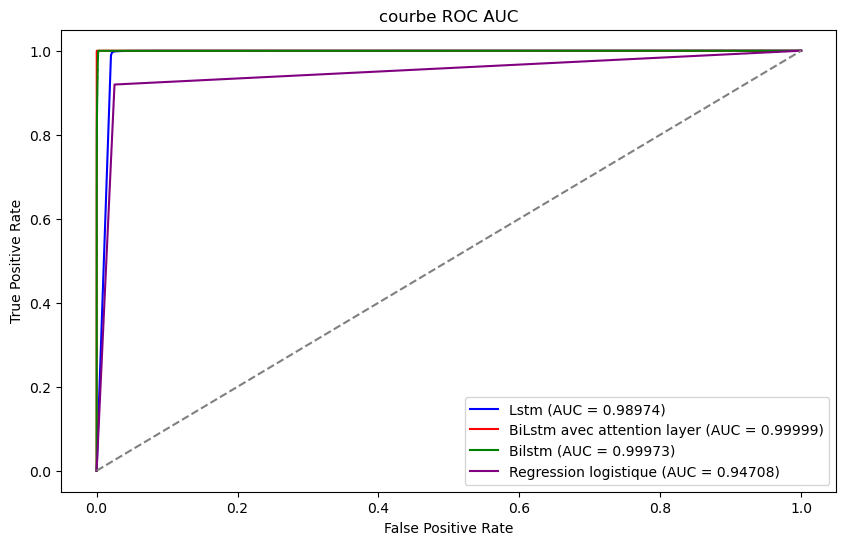

In [88]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
x_train, x_test, Y_train, Y_test = train_test_split(X_res.values, y_res, test_size=0.3, random_state=40)
model1_predictions= model1.predict(X_test)
model2_predictions = model2.predict(X_test)
classifier1_predictions = classifier1.predict(x_test)
classifier2_predictions = classifier2.predict(X_test)
# Assuming you have the true labels and predicted probabilities for each model
y_true = y_test  # Replace with your true labels
y_pred_model1 = model1_predictions  # Replace with predictions for model1
y_pred_model2 = model2_predictions  # Replace with predictions for model2
y_pred_classifier1 = classifier1_predictions  # Replace with predictions for classifier1
y_pred_classifier2 = classifier2_predictions  # Replace with predictions for classifier2

# Calculate ROC curves and AUC scores for each model
fpr_model1, tpr_model1, _ = roc_curve(y_true, y_pred_model1)
roc_auc_model1 = auc(fpr_model1, tpr_model1)

fpr_model2, tpr_model2, _ = roc_curve(y_true, y_pred_model2)
roc_auc_model2 = auc(fpr_model2, tpr_model2)

fpr_classifier1, tpr_classifier1, _ = roc_curve(y_true, y_pred_classifier1)
roc_auc_classifier1 = auc(fpr_classifier1, tpr_classifier1)

fpr_classifier2, tpr_classifier2, _ = roc_curve(y_true, y_pred_classifier2)
roc_auc_classifier2 = auc(fpr_classifier2, tpr_classifier2)


# Plot ROC curves for all four models on the same graph
plt.figure(figsize=(10, 6))
plt.plot(fpr_model1, tpr_model1, color='blue', label=f'Lstm (AUC = {roc_auc_model1:.5f})')
plt.plot(fpr_model2, tpr_model2, color='red', label=f'BiLstm avec attention layer (AUC = {roc_auc_model2:.5f})')
plt.plot(fpr_classifier2, tpr_classifier2, color='green', label=f'Bilstm (AUC = {roc_auc_classifier2:.5f})')
plt.plot(fpr_classifier1, tpr_classifier1, color='purple', label=f'Regression logistique (AUC = {roc_auc_classifier1:.5f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('courbe ROC AUC')
plt.legend()
plt.show()


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res.values, y_res, test_size=0.4, random_state=40)
model_1 = LogisticRegression()
model_2 = svm.SVC(kernel='linear', C=1)
model_3 = RandomForestClassifier()
classifier2 = VotingClassifier(estimators=[('lr', model_1), ('svm', model_2), ('rf', model_3)], voting='hard')
classifier2.fit(X_train, y_train)
y_pred = classifier2.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
mcc = matthews_corrcoef(y_test, y_pred)
precision = precision_score(y_test, y_pred)
rappel = recall_score(y_test, y_pred)
print(mcc)
print("accuracy:", accuracy)
print("precision:", precision)
print("rappel:", rappel)
tn,fp,fn,tp = cm.ravel()
print("Confusion Matrix:")
print(cm)
print(f"true negatives: {tn}, false positives: {fp}")
print(f"false negatives: {fn}, true positives: {tp}")